### 把后验估计取出来

In [1]:
import jax
import jax.numpy as jnp
import jax_cfd.base as cfd
import numpy as np
import seaborn
import xarray
import functools
import copy
import pickle

from jax_cfd_test import my_equations
from jax_cfd_test import my_funcutils
from jax_cfd_test import my_forcing

from flax import linen as nn
from jax import random, numpy as jnp
from jax import grad

import optax

import time
import matplotlib.pyplot as plt

In [2]:
jax.devices()

[cuda(id=0)]

In [3]:
def sealed_convection_diffusion_true(measure_point_coordinate, center, stage):
    grid = cfd.grids.Grid((size, size), domain=((lo_b, up_b), (lo_b, up_b)))

    bc = cfd.boundaries.neumann_boundary_conditions(2)
    
    grid_x = jnp.linspace(lo_b, up_b, size)
    grid_y = jnp.linspace(lo_b, up_b, size)
    xx, yy = jnp.meshgrid(grid_x, grid_y, indexing='ij')
    
    distance_array = 0.0*xx
    array = cfd.grids.GridArray(distance_array, offset=grid.cell_center, grid=grid)
    v0 = cfd.grids.GridVariable(array, bc)
    G=(v0,v0)

    time=0.0
    dt= 0.0005
    center_x= center[0]
    center_y= center[1]
    
    i = (measure_point_coordinate[0]-lo_b)/(up_b-lo_b)*(size-1)
    j = (measure_point_coordinate[1]-lo_b)/(up_b-lo_b)*(size-1)
    
    inner_steps = 1
    outer_steps = (stage+1)*100+1#401

    # model = my_forcing.FullyConnectedNN()  # 创建模型实例 在外侧定义，只是一个结构

    #rollout_fn = jax.jit(my_funcutils.trajectory(my_equations.implicit_convection_diffusion3(
    #        density=density, viscosity=viscosity, dt=dt, grid=grid, forcing = my_forcing.exponential_force_with_nn(grid,center_x=center_x, center_y=center_y,params=param,model =model)), outer_steps*inner_steps))
  
    rollout_fn = jax.jit(my_funcutils.trajectory(my_equations.implicit_convection_diffusion5(
            density=density, viscosity=viscosity, dt=dt, grid=grid, forcing = my_forcing.exponential_force(grid,center_x=center_x, center_y=center_y)), outer_steps*inner_steps))
   
    #_, trajectory = jax.device_get(rollout_fn(G,time))
    #data_array_at_last_step = trajectory[0][0].data[-1,:,:]

    last_step, _ = jax.device_get(rollout_fn(G,time))
    data_array_at_last_step = last_step[0][0].array.data
    
    data_fin=jax.scipy.ndimage.map_coordinates(data_array_at_last_step,[i,j],1)
    
    return data_fin, data_array_at_last_step
    
def sealed_convection_diffusion_nn(param, measure_point_coordinate, center, stage, model):
    grid = cfd.grids.Grid((size, size), domain=((lo_b, up_b), (lo_b, up_b)))

    bc = cfd.boundaries.neumann_boundary_conditions(2)
    
    grid_x = jnp.linspace(lo_b, up_b, size)
    grid_y = jnp.linspace(lo_b, up_b, size)
    xx, yy = jnp.meshgrid(grid_x, grid_y, indexing='ij')
    
    distance_array = 0.0*xx
    array = cfd.grids.GridArray(distance_array, offset=grid.cell_center, grid=grid)
    v0 = cfd.grids.GridVariable(array, bc)
    G=(v0,v0)

    time=0.0
    dt= 0.0005
    center_x= center[0]
    center_y= center[1]
    
    i = (measure_point_coordinate[0]-lo_b)/(up_b-lo_b)*(size-1)
    j = (measure_point_coordinate[1]-lo_b)/(up_b-lo_b)*(size-1)
    
    inner_steps = 1
    outer_steps = (stage+1)*100+1#401

    # model = my_forcing.FullyConnectedNN()  # 创建模型实例 在外侧定义，只是一个结构

    rollout_fn = jax.jit(my_funcutils.trajectory(my_equations.implicit_convection_diffusion5(
            density=density, viscosity=viscosity, dt=dt, grid=grid, forcing = my_forcing.reciprocal_force_with_nn(grid,center_x=center_x, center_y=center_y,params=param,model =model)), outer_steps*inner_steps))
  
    #rollout_fn = jax.jit(my_funcutils.trajectory(my_equations.implicit_convection_diffusion3(
     #       density=density, viscosity=viscosity, dt=dt, grid=grid, forcing = my_forcing.reciprocal_force(grid,center_x=center_x, center_y=center_y)), outer_steps*inner_steps))
   
    #_, trajectory = jax.device_get(rollout_fn(G,time))
    #data_array_at_last_step = trajectory[0][0].data[-1,:,:]

    last_step, _ = jax.device_get(rollout_fn(G,time))
    data_array_at_last_step = last_step[0][0].array.data
    
    data_fin=jax.scipy.ndimage.map_coordinates(data_array_at_last_step,[i,j],1)
    
    return data_fin, data_array_at_last_step
    
#%time jax.value_and_grad(sealed_convection_diffusion, has_aux=True)(params, (0.21,0.21),(0.203,0.21),stage=3)

In [ ]:
# 规划：
'''
1，涉及需要导数的过程都需要封装。因此 forward，likelihood，posterior，kld 都需要封装起来
2，其他的更新参数过程可以外方面
'''
def log_normalize_pdf(log_probs):
    # 计算最大对数概率值
    max_log_prob = jnp.max(log_probs)
    
    # 缩放并转换对数概率到概率空间，减少数值溢出风险
    probs = jnp.exp(log_probs - max_log_prob)
    
    # 归一化概率值
    normalized_probs = probs / jnp.sum(probs)
    
    # 转换回对数空间
    normalized_log_probs = jnp.log(normalized_probs+1e-32)
    
    return normalized_log_probs

def normalize_pdf(probs):
    return probs/jnp.sum(probs)

def calculate_loglikelihood(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model):
    '''
    参数：
    stage: 当前的阶段。用于决定forward模拟的步数
    center: 污染源的中心
    current_params: 网络的参数
    d_start: 测量点
    prior: 先验
    noise_info: 测量误差设置
    num_d: 计算后验时使用的点数
    radio_d: 在测量点附近多选几个点测量，本质上可以理解为多次测量消除误差，可以考虑直接舍弃误差

    说明：
    1，假设数据量是300*300，计算范围是3*3
    应该是需要数据尺寸是3的倍数，否则到时候后验那里也会费劲
    也可以不是3的倍数，只要后验矩阵和数据矩阵匹配就行
    2，运用了等效的原则。主要起作用的是测量点和center的相对位置
    这里突然想到nn应该需要四个参数，当前的坐标和center，而不是仅当前坐标。
    '''
    noise_loc, noise_base_scale, noise_ratio_scale = noise_info[0]
    if num_d == 1.0:
        output_point, _ = sealed_convection_diffusion_true(d_start, center, stage) #这里的形状是()
        #key, subkey = random.split(key) 这一步放在外面
        
        #暂时只考虑不要误差的情况：
        observation = output_point + jnp.array([0.0])

        #这是要误差的代码：
        #noise = random.normal(key,(1,1))*(noise_base_scale+jnp.abs(output_point)*noise_ratio_scale) #形状(1,1)
        #observation = output_point + noise*0.05

        # 给一个函数，从所有的输出中找到关心的点
        false_center = jnp.array([1.0,1.0]) - d_start
        false_start = jnp.array([0.5, 0.5])
        _, output_all = sealed_convection_diffusion_nn(current_params, false_start, false_center, stage, model)
        #_, output_all = sealed_convection_diffusion_true(false_start, false_center, stage) #这里的形状是()
        output_all_central_sym = jnp.fliplr(jnp.flipud(output_all))
        # 取出[0,1]^2之间的矩阵
        xb_lo = int((0.0 - lo_b) / (up_b - lo_b) * (size - 1))
        xb_up = int((1.0 - lo_b) / (up_b - lo_b) * (size - 1))
        output_for_xb = output_all_central_sym[xb_lo:(xb_up+1),xb_lo:(xb_up+1)]
        # 针对于每一个数字求likelihood
        #loglikelihood = jax.scipy.stats.norm.logpdf(output_for_xb, loc=observation, scale=noise_base_scale+noise_ratio_scale*jnp.abs(observation))
        loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=output_for_xb, scale=noise_base_scale+noise_ratio_scale*jnp.abs(output_for_xb))
    return loglikelihood

def calculate_info_gain(prior, posterior):
    '''
    KLD
    '''
    return jnp.sum(posterior*(jnp.log(posterior+1e-32) - jnp.log(prior+1e-32)))

def forward_posterior_infoGain(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model):
    loglikelihood = calculate_loglikelihood(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model)
    log_evidence_list = log_normalize_pdf(loglikelihood) + jnp.log(prior+1e-32)
    evidence_list = jnp.exp(log_evidence_list)
    posterior = evidence_list/jnp.sum(evidence_list)
    KLD = calculate_info_gain(prior, posterior)
    return KLD, posterior

def compute_gradient_norm(grad_params):
    # 计算所有参数梯度的平方L2范数
    squared_norms = jax.tree_util.tree_map(lambda x: jnp.sum(x**2), grad_params)
    # 求和所有平方范数
    total_squared_norm = sum(jax.tree_util.tree_leaves(squared_norms))
    # 取平方根得到总的L2范数
    total_norm = jnp.sqrt(total_squared_norm)
    return total_norm

'''
main
'''

# 输入权重，求权重的导数

# PDE settings =================
size = 251  #只需要在 my_equation 里面改尺寸就可以了
local_size = int((size-1)/5+1)
density = 1.
viscosity = 1

lo_b = -2. #也需要在 my_equation 里面改范围
up_b = 3.

max_velocity = 2.0
cfl_safety_factor = 0.5


key = random.PRNGKey(0)  # 随机数生成器的键
x_for_shape = random.normal(key, (1, 2))  # 假设输入数据形状为 (batch_size, input_features)，这里是一个样本，两个特征
#model = my_forcing.FullyConnectedNN()  # 创建模型实例
#params = model.init(key, x_for_shape)

class localFullyConnectedNN2(nn.Module):
    @nn.compact
    def __call__(self, x):
        x = nn.Dense(features=4)(x)  # 输入层到隐藏层1，8个节点
        x = nn.tanh(x)  # 激活函数
        x = nn.Dense(features=4)(x)  # 隐藏层1到隐藏层2，4个节点
        x = nn.tanh(x)  # 激活函数
        x = nn.Dense(features=1)(x)  # 隐藏层2到输出层，1个节点
        return x
        
model = localFullyConnectedNN2()  # 创建模型实例


#params = {'params': {'Dense_0': {'bias': jnp.array([ 0.4220,  0.4046,  0.7948, -0.0262, -0.4859, -0.0748,  0.6397, -0.4742]),
#   'kernel': jnp.array([[-0.1428, -3.1386,  0.1278,  2.6601, -2.4509, -1.7899,  4.9854,  0.9533],
#       [-0.8567,  4.0157, -0.0646,  3.7773, -3.3422, -1.3315, -3.8902, -1.9304]])},
#  'Dense_1': {'bias': jnp.array([ 0.0143,  0.0755, -0.0477, -0.1939]),
#   'kernel': jnp.array([[-0.3512, -0.4044, -0.1012, -0.16  ],
#       [ 0.4947,  0.3578,  0.3282, -0.601 ],
#       [-0.2726,  0.3012, -0.2303,  0.2767],
#       [ 2.0844,  0.9441, -2.1975,  3.0451],
#       [-0.5057, -0.1832, -0.3193, -0.2212],
#       [-0.3738, -0.3433,  0.1701, -0.2727],
#       [ 0.5894, -0.0387,  0.3692, -0.4085],
#       [-0.1819,  0.3108,  0.1631,  0.1382]])},
#  'Dense_2': {'bias': jnp.array([-0.0026]),
#   'kernel': jnp.array([[-0.7601],
#       [-0.2217],
#       [-0.7139],
#       [ 0.2727]])}}
#    }

params = {'params': {'Dense_0': {'bias': jnp.array([-0.5034, -0.0280, -0.3198,  0.4847]),
           'kernel': jnp.array([[ 4.8153,  4.1794,  8.2351,  9.6484],
        [-2.8456,  5.2352, -8.0220, -9.1204]])},
          'Dense_1': {'bias': jnp.array([-0.4493,  1.2653,  1.2336,  0.4221]),
           'kernel': jnp.array([[-0.7218,  2.8800,  3.2308,  1.1351],
        [-5.0888,  4.8622,  4.7844,  5.0217],
        [-2.9412,  3.9048, -4.2149, -5.2085],
        [ 4.3755, -3.2684,  4.4775,  3.3922]])},
          'Dense_2': {'bias': jnp.array([-0.3442]),
           'kernel': jnp.array([[-10.5900],
        [ 10.0693],
        [-10.0099],
        [-10.6412]])}}
         }

#params = {'params': {'Dense_0': {'bias': jnp.array([-0.1935,  0.6465, -0.6756, -0.3193]),
#           'kernel': jnp.array([[ -0.1454, -11.7873, -12.1136,   0.1809],
#                                [ -4.8683,  -8.9730,  -3.4970,  -9.0094]])},
#          'Dense_1': {'bias': jnp.array([ 0.8187, -0.9192,  2.6559, -1.7372]),
#           'kernel': jnp.array([[-4.0606, -0.3964,  4.2733, -3.9753],
#                                [-5.4222,  5.0776,  1.6886,  3.2036],
#                                [ 8.3284, -0.2446, -3.2502, -2.9129],
#                                [-3.5057, -6.6277,  1.9602, -2.6868]])},
#          'Dense_2': {'bias': jnp.array([-1.0679]),
#           'kernel': jnp.array([[ 11.6289],
#                                [-11.9214],
#                                [-12.6651],
#                                [-12.6907]])}}
#         }#尾部过于重合

#params = {'params': {'Dense_0': {'bias': jnp.array([-0.23312349,  0.47224455, -0.78608792, -0.38686239]),
#           'kernel': jnp.array([[ -0.3448091 , -11.72619948, -12.17207985,   0.0250018 ],
#      [ -4.7140896 ,  -9.09470378,  -3.5607811 ,  -9.00995306]])},
#          'Dense_1': {'bias': jnp.array([ 0.74568804, -0.87123769,  2.02498338, -2.17341381]),
#           'kernel': jnp.array([[-3.86606518, -0.18982007,  4.19567556, -3.78180141],
#      [-5.51682722,  5.45891411,  1.94711826,  3.57627192],
#      [ 8.20208793,  0.21443603, -3.16451965, -2.50866971],
#      [-3.6003272 , -6.2053309 ,  2.27343397, -2.56787997]])},
#          'Dense_2': {'bias': jnp.array([-1.0992855]),
#           'kernel': jnp.array([[ 11.93246195],
#      [-11.90503378],
#      [-12.46982312],
#      [-12.35981324]])}}
#            }#尾部翘起的一组参数


params_back = copy.deepcopy(params)

# OED settings =================
n_stage = 5
d_start = jnp.array([0.5,0.5])
center = jnp.array([0.25,0.25])

d_change_range = jnp.array([0.2,0.2])

noise_loc = 0
noise_base_scale = 0.05
noise_ratio_scale = 0.05
noise_info = [(noise_loc, noise_base_scale, noise_ratio_scale),]

num_d = 1.0
radio_d = 0.5

xb_size = int((size - 1)/5+1) #初始化均匀先验
prior_ori = jnp.ones((xb_size,xb_size))
prior = prior_ori/jnp.sum(prior_ori)

key = random.split(key,int(n_stage*2+1))

'''
%time jax.value_and_grad(forward_posterior_infoGain_gradParam,has_aux=True)(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key2)

d_start = jnp.array([0.7,0.7])
%time jax.value_and_grad(forward_posterior_infoGain_gradDesign,has_aux=True)(d_start, params, stage, center, prior, noise_info, num_d, radio_d, key2)

%time jax.value_and_grad(forward_posterior_infoGain_gradParam,has_aux=True)(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key2)
'''

# 现在撰写主循环
# 只写一个步骤，从先验到后验和infogain，之后用scan的方式拼接


def loss_param(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model):
    #loglikelihood = calculate_loglikelihood(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model)
    #log_evidence_list = log_normalize_pdf(loglikelihood) + jnp.log(prior+1e-32)
    ##一个点
    ##return -jnp.exp(jnp.max(log_evidence_list))**5.0*1e15
    ##五个点
    #point_to_use = 5
    #top_15_indices = jnp.argsort(log_evidence_list.ravel())[-15:]  
    #top_15_values = log_evidence_list.ravel()[top_15_indices]
    #chosen_indices = random.choice(key, top_15_indices.shape[0], shape=(point_to_use,), replace=False)
    #chosen_values = top_15_values[chosen_indices]
    ##return -jnp.sum(jnp.exp(chosen_values)*1e7/(stage+2)**2)#*10^point_to_use
    #return -jnp.sum(jnp.exp(chosen_values))#*1e7**stage) 这个是有一组的结果但是其实不对
    ##return -jnp.exp(jnp.sum(chosen_values))*1e15#*1e7**stage)
    
    loglikelihood = calculate_loglikelihood(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model)
    log_evidence_list = log_normalize_pdf(loglikelihood) + jnp.log(prior+1e-32)
    top_15_indices = jnp.argsort(log_evidence_list.ravel())[-5:]  
    top_15_values = loglikelihood.ravel()[top_15_indices]
    return -jnp.sum(top_15_values)


def loss_param_refine(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model, observation, num_top=5):
    loglikelihood = calculate_loglikelihood_refine(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model, observation)
    log_evidence_list = log_normalize_pdf(loglikelihood) + jnp.log(prior+1e-32)
        
    indices = jnp.argpartition(log_evidence_list.ravel(), -num_top)[-num_top:]
    multi_indices = jnp.unravel_index(indices, log_evidence_list.shape)
    
    selected_loglikelihoods = jnp.sum(loglikelihood[multi_indices])
    list_local = multi_indices
    
    ## 计算平均坐标
    #average_x = np.mean(multi_indices[0])
    #average_y = np.mean(multi_indices[1])
    #
    ## 直接使用平均坐标
    #selected_loglikelihoods = jax.scipy.ndimage.map_coordinates(loglikelihood,[average_x,average_y],1)
    #
    #list_local = [average_x, average_y]
    
    return -selected_loglikelihoods, list_local


def loss_param_refine2(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model, observation, num_top=5):
    # average
    loglikelihood = calculate_loglikelihood_refine(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model, observation)
    log_evidence_list = log_normalize_pdf(loglikelihood) + jnp.log(prior+1e-32)
        
    indices = jnp.argpartition(log_evidence_list.ravel(), -num_top)[-num_top:]
    multi_indices = jnp.unravel_index(indices, log_evidence_list.shape)
    
    #selected_loglikelihoods = jnp.sum(loglikelihood[multi_indices])
    #list_local = multi_indices
    
    # 计算平均坐标
    average_x = np.mean(multi_indices[0])
    average_y = np.mean(multi_indices[1])
    
    # 直接使用平均坐标
    selected_loglikelihoods = jax.scipy.ndimage.map_coordinates(loglikelihood,[average_x,average_y],1)
    
    list_local = [average_x, average_y]
    
    return -selected_loglikelihoods, list_local


def calculate_loglikelihood_refine(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model, observation):
    '''
    参数：
    stage: 当前的阶段。用于决定forward模拟的步数
    center: 污染源的中心
    current_params: 网络的参数
    d_start: 测量点
    prior: 先验
    noise_info: 测量误差设置
    num_d: 计算后验时使用的点数
    radio_d: 在测量点附近多选几个点测量，本质上可以理解为多次测量消除误差，可以考虑直接舍弃误差

    说明：
    1，假设数据量是300*300，计算范围是3*3
    应该是需要数据尺寸是3的倍数，否则到时候后验那里也会费劲
    也可以不是3的倍数，只要后验矩阵和数据矩阵匹配就行
    2，运用了等效的原则。主要起作用的是测量点和center的相对位置
    这里突然想到nn应该需要四个参数，当前的坐标和center，而不是仅当前坐标。
    '''
    noise_loc, noise_base_scale, noise_ratio_scale = noise_info[0]
    if num_d == 1.0:
        false_center = jnp.array([1.0,1.0]) - d_start
        false_start = jnp.array([0.5, 0.5])
        _, output_all = sealed_convection_diffusion_nn(current_params, false_start, false_center, stage, model)
        #_, output_all = sealed_convection_diffusion_true(false_start, false_center, stage) #这里的形状是()
        output_all_central_sym = jnp.fliplr(jnp.flipud(output_all))
        # 取出[0,1]^2之间的矩阵
        xb_lo = int((0.0 - lo_b) / (up_b - lo_b) * (size - 1))
        xb_up = int((1.0 - lo_b) / (up_b - lo_b) * (size - 1))
        output_for_xb = output_all_central_sym[xb_lo:(xb_up+1),xb_lo:(xb_up+1)]
        # 针对于每一个数字求likelihood
        #loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=output_for_xb, scale=noise_base_scale+noise_ratio_scale*output_for_xb)
        loglikelihood = jax.scipy.stats.norm.logpdf(output_for_xb, loc=observation, scale=noise_base_scale+noise_ratio_scale*observation)
    return loglikelihood

def loss_param_refine4(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model, observation, num_top=5):
    loglikelihood = calculate_loglikelihood_refine4(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model, observation)
    log_evidence_list = log_normalize_pdf(loglikelihood) + jnp.log(prior+1e-32)
        
    indices = jnp.argpartition(log_evidence_list.ravel(), -num_top)[-num_top:]
    multi_indices = jnp.unravel_index(indices, log_evidence_list.shape)
    
    #selected_loglikelihoods = jnp.sum(loglikelihood[multi_indices])
    #list_local = multi_indices
    
    # 计算平均坐标
    average_x = np.mean(multi_indices[0])
    average_y = np.mean(multi_indices[1])
    
    # 直接使用平均坐标
    selected_loglikelihoods = jax.scipy.ndimage.map_coordinates(loglikelihood,[average_x,average_y],1)
    
    list_local = jnp.array([average_x, average_y])/50
    
    return -selected_loglikelihoods, list_local


def calculate_loglikelihood_refine4(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model, observation):
    '''
    参数：
    stage: 当前的阶段。用于决定forward模拟的步数
    center: 污染源的中心
    current_params: 网络的参数
    d_start: 测量点
    prior: 先验
    noise_info: 测量误差设置
    num_d: 计算后验时使用的点数
    radio_d: 在测量点附近多选几个点测量，本质上可以理解为多次测量消除误差，可以考虑直接舍弃误差

    说明：
    1，假设数据量是300*300，计算范围是3*3
    应该是需要数据尺寸是3的倍数，否则到时候后验那里也会费劲
    也可以不是3的倍数，只要后验矩阵和数据矩阵匹配就行
    2，运用了等效的原则。主要起作用的是测量点和center的相对位置
    这里突然想到nn应该需要四个参数，当前的坐标和center，而不是仅当前坐标。
    '''
    noise_loc, noise_base_scale, noise_ratio_scale = noise_info[0]
    if num_d == 1.0:
        false_center = jnp.array([1.0,1.0]) - d_start
        false_start = jnp.array([0.5, 0.5])
        _, output_all = sealed_convection_diffusion_nn(current_params, false_start, false_center, stage, model)
        #_, output_all = sealed_convection_diffusion_true(false_start, false_center, stage) #这里的形状是()
        output_all_central_sym = jnp.fliplr(jnp.flipud(output_all))
        # 取出[0,1]^2之间的矩阵
        xb_lo = int((0.0 - lo_b) / (up_b - lo_b) * (size - 1))
        xb_up = int((1.0 - lo_b) / (up_b - lo_b) * (size - 1))
        output_for_xb = output_all_central_sym[xb_lo:(xb_up+1),xb_lo:(xb_up+1)]
        # 针对于每一个数字求likelihood
        #loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=output_for_xb, scale=noise_base_scale+noise_ratio_scale*output_for_xb)
        loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=output_for_xb, scale=noise_base_scale+noise_ratio_scale*jnp.abs(output_for_xb))
    return loglikelihood
    
def loss_param_refine5(current_params, d_start, stage, estimated_center, model, observation):

    y_f, _ = sealed_convection_diffusion_nn(current_params, d_start, estimated_center, stage, model)
    loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=y_f, scale=noise_base_scale+noise_ratio_scale* jnp.abs(y_f))

    return -loglikelihood
    
def generate_design_zone(d_start):
    list = [
        d_start+jnp.array([-0.14,0.14]),
        d_start+jnp.array([0.14,0.14]),
        d_start,
        d_start+jnp.array([-0.14,-0.14]),
        d_start+jnp.array([0.14,-0.14]),
    ]
    return list


def loss_design(d_start, current_params, stage, center, prior, noise_info, num_d, radio_d, key, model):
    KLD, _ = forward_posterior_infoGain(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model)
    return -KLD

def evaluate_nn_accuracy(params,model,center,local_size):
    grid = cfd.grids.Grid((local_size, local_size), domain=((0, 1), (0, 1)))
    offsets = ((0.5,0.5),(0.5,0.5))
    x = grid.mesh(offsets[1])[0]
    y = grid.mesh(offsets[0])[1]
    center_x = center[0]
    center_y = center[1]
    exponent_internal = ((x-center_x)**2.0+(y-center_y)**2.0)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 **2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 **2.0))
    array_reciprocal = factor*1.5 / (exponent_internal**2 / (2.0 * 0.05 **2.0)**2+ 1.0)
    x_reshaped = x.reshape(-1, 1) - center_x
    y_reshaped = y.reshape(-1, 1) - center_y
    xy_combined = jnp.concatenate((x_reshaped, y_reshaped), axis=1)
    array_nn = model.apply(params,xy_combined).reshape(grid.shape)
    return jnp.sum((array_exponent - array_reciprocal - array_nn)**2)


#iteration_step_number1 = tuple((50,40,30,20,20,20,20,20,20,20))
iteration_step_number1 = tuple((50,45,40,40,40,40,40,40,40,40,40,40,40,30,20))
#iteration_step_number2 = tuple((10,50,50,50,50,50,50,50,100,100))
iteration_step_number2 = tuple((10,80,80,80,80,80,80,80,80,80,80,80,80,80,100))
stage_to_skip = [0]

fig, axes = plt.subplots(1, n_stage, figsize=(5*n_stage, 5))
grid_x_plot0, grid_y_plot0 = np.meshgrid(np.linspace(0, 1, local_size), np.linspace(0, 1, local_size))

learning_rate1 = 0.003
#learning_rate2 = 0.002
#learning_rate2 = (jnp.arange(0,10,1)/20+1.0)*0.025
learning_rate2 = jnp.ones(n_stage)*0.012
#learning_rate2 = jnp.array([0.012,0.012,0.03,0.012,0.012,0.012,0.012,0.012,0.012,0.012])

print('Network Settings: \n')
print(f'learning_rate1 = ', learning_rate1)
print(f'learning_rate2 = ', learning_rate2)
print(f'iteration_step_number1 = ', iteration_step_number1)
print(f'iteration_step_number2 = ', iteration_step_number2)

def create_decay_schedule(initial_lr, decay_steps, decay_rate):
    # 这里使用exponential_decay来创建学习率衰减计划
    lr_schedule = optax.exponential_decay(init_value=initial_lr,
                                          transition_steps=decay_steps,
                                          decay_rate=decay_rate,
                                          staircase=True)
    return lr_schedule
    
decay_rate1 = 1.0
decay_rate2 = 0.9  # 衰减率

learning_rate1_min = 0.001
learning_rate2_min = 0.001

#lr_schedule1 = create_decay_schedule(learning_rate1, 20, decay_rate1)
#lr_schedule2 = create_decay_schedule(learning_rate2, 25, decay_rate2)
cosine_schedule1 = optax.cosine_decay_schedule(init_value=learning_rate1, decay_steps=20, alpha=learning_rate1_min)
cosine_schedule2 = optax.cosine_decay_schedule(init_value=learning_rate2[0], decay_steps=50, alpha=learning_rate2_min)


KLD_list=[]
evidence_list=[]
NN_error_list=[]
gradient_norm_list=[]
params_list=[]
#params_list.append(params) #这里不需要，因为第一阶段不学习，在后面加上了
design_list = []
design_list.append(d_start)
posterior_list = []
posterior_oed_list = []
estimated_posterior_point = []

for stage in range(n_stage):
    
    #if stage == 5:
    #    break #提前结束
        
    print('\n stage = ', stage, '\n')
    key_for_design = random.split(key[stage*2],iteration_step_number1[stage])
    key_for_param = random.split(key[stage*2+1],iteration_step_number2[stage])
    
    clip_count = 0
    
    if stage!=0:
        del tx1
    else:
        print(f'stage = 0, only run forward model and update posterior')
        
    #tx1 = optax.adam(lr_schedule1)
    tx1 = optax.chain(
    optax.adam(learning_rate1),  # 使用由 lr_schedule1 调整的学习率的 Adam 优化器
    optax.add_decayed_weights(1e-4)  # 添加权重衰减，衰减系数为 1e-5
    )
    
    opt_state1 = tx1.init(d_start)
    
    d_limit_min = d_start - d_change_range
    d_limit_max = d_start + d_change_range
    
    start_time = time.time()
    d_start_backup = d_start

    print('start learning design')
    print(f'start design : ', d_start)
    for i in range(iteration_step_number1[stage]):
        negtive_KLD, grad_design = jax.value_and_grad(loss_design)(d_start, params, stage, center, prior, noise_info, num_d, radio_d, key_for_design[i], model)
        updates, opt_state1 = tx1.update(grad_design, opt_state1, params=d_start)

        
        # 解决nan的问题
        oed_nan_index = 0
        updates_contain_nans = any(jnp.any(jnp.isnan(u)) for u in jax.tree_util.tree_leaves(updates))
        if updates_contain_nans:
            oed_nan_index = oed_nan_index + 1
            print(f'NaN appears in learning. Perturb params and continue. Nan count: {oed_nan_index}')
            noise = 0.05*jax.random.normal(key_for_design[i], d_start.shape)
            d_start = d_start+ noise
        else:
            oed_nan_index = 0
            d_start = optax.apply_updates(d_start, updates)
    
        d_start_before_clip = d_start
        d_start = jnp.clip(d_start, d_limit_min, d_limit_max)
        
        # 如果clip函数生效，即有参数被裁剪，增加计数器
        clip_count = 0
        if not jnp.all(d_start == d_start_before_clip):
            clip_count += 1
        else:
            clip_count = 0
            
        if clip_count >= 5:
            print(f"Stopping iteration at step {i} as clip function has been activated 5 times.")
            break
        
        if np.isnan(d_start).any() or np.isnan(negtive_KLD).any():
            print('some results are Nan')
            break
    
        KLD_list.append(-negtive_KLD)
        
        if oed_nan_index > 6:
            print('连续出现nam并扰动6次，停止oed')
            break
            
        #if len(KLD_list) >= 5:
        #    last_five = KLD_list[-5:]
        #    if all(abs(last_five[0] - k) < 0.01*last_five[0] for k in last_five[1:]):
        #        print("连续5步的negtive_KLD几乎相同，停止循环")
        #        break  # 跳出循环
            
    end_time = time.time()
    print(f"Execution learning design time: {end_time - start_time} seconds")

    #if stage!=0:
    _, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
    del prior
    prior = posterior
    posterior_oed_list.append(posterior)

    net_accuracy = evaluate_nn_accuracy(params,model,center,local_size)
    NN_error_list.append(net_accuracy)
    design_list.append(d_start)
    
    #if stage!=0:
    #    del tx2
    #    #del cosine_schedule2
    #    #cosine_schedule2 = optax.cosine_decay_schedule(init_value=learning_rate2[stage], decay_steps=25, alpha=learning_rate2_min)
    #    del lr_schedule2
    #lr_schedule2 = create_decay_schedule(learning_rate2[stage], 25, decay_rate2)
    #tx2 = optax.chain(
    #    optax.adam(lr_schedule2),  # 使用由 lr_schedule1 调整的学习率的 Adam 优化器
    #    optax.add_decayed_weights(1e-4)  # 添加权重衰减，衰减系数为 1e-5
    #)
    if stage!=0:
        del tx2
        del opt_state2
        
    tx2 = optax.adam(learning_rate2[stage])
    
    opt_state2 = tx2.init(params)

    start_time = time.time()

    # 估计后验中心
    num_top = 5
    indices = jnp.argpartition(posterior.ravel(), -num_top)[-num_top:]
    multi_indices = jnp.unravel_index(indices, posterior.shape)
    #indices = jnp.argpartition(prior.ravel(), -num_top)[-num_top:]
    #multi_indices = jnp.unravel_index(indices, prior.shape)
    
    # 计算平均坐标
    average_x = np.mean(multi_indices[0])
    average_y = np.mean(multi_indices[1])
    
    # 直接使用平均坐标
    estimated_center = jnp.array([average_x, average_y])/50
    print(f'estimated_center is ', estimated_center)
    estimated_posterior_point.append(estimated_center)
        

    print(f'design from OED is {d_start}')
    if stage == 2:
        d_start = d_start + jnp.array([0.05,-0.05])
    #
    #if stage == 3:
    #    d_start = d_start + jnp.array([0.05,-0.05])
    #    
    #if stage == 4:
    #    d_start = d_start + jnp.array([0.05,0.05])

    #if stage == 3:
    #    d_start = d_start + jnp.array([0.05,-0.05])

    
    print(f'design for model correction is {d_start}')
    observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
    print(f'measurement is: {observation}')

    print('start learning params')
    for i in range(iteration_step_number2[stage]):
        if stage in stage_to_skip:
            print(f'stage {stage} dont learn error parameters')
            break
        
        #observation_perturbed =  observation + 0.003 * jax.random.normal(key_for_param[i], observation.shape) * (80-i)/80
        estimated_center_perturbed = estimated_center + 0.05 * jax.random.normal(key_for_param[i], estimated_center.shape)*jnp.exp(-0.04*i)#* (80-i)/80
        max_evidence_items, grad_params = jax.value_and_grad(loss_param_refine5)(params, d_start, stage, estimated_center_perturbed, model, observation)

        clip_norm = 1e10
        clip_transform = optax.clip_by_global_norm(clip_norm)
        clipped_grads, _ = clip_transform.update(grad_params, state=None)
        
        updates, opt_state2 = tx2.update(clipped_grads, opt_state2, params=params)
        
        # 解决nan的问题
        updates_contain_nans = any(jnp.any(jnp.isnan(u)) for u in jax.tree_util.tree_leaves(updates))
        if updates_contain_nans:
            print('NaN appears in learning. Perturb params and continue.')
            noise = jax.tree_util.tree_map(lambda p: 0.01 * jax.random.normal(key_for_param[i], p.shape), params)
            params = jax.tree_util.tree_map(lambda p, n: p + n, params, noise)
        else:
            params = optax.apply_updates(params, updates)
            
        net_accuracy = evaluate_nn_accuracy(params,model,center,local_size)
        #print(f'Loss step {i} max evidence items: {max_evidence_items}, nn error {i}: {net_accuracy}')
        
        if np.isnan((max_evidence_items, net_accuracy)).any():
            print('some results are Nan')
            break
            
        evidence_list.append(-max_evidence_items)
        NN_error_list.append(net_accuracy)

        
    params_list.append(params)
    
    end_time = time.time()
    print(f"Execution learning param time: {end_time - start_time} seconds")

    if stage not in stage_to_skip:
        _, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
        if stage!=0:
             del prior
        prior = posterior
        
    posterior_list.append(posterior)

    
    #恢复design到原来的轨迹
    #if stage in [2]:
    d_start = design_list[-1]
        
    
    axes[stage].contourf(grid_x_plot0, grid_y_plot0, posterior.T, levels=100,cmap='RdYlBu_r' )
    axes[stage].scatter(d_start[0], d_start[1], marker='o', s=100, c='orangered')
    axes[stage].scatter(center[0], center[1], marker='*', s=100, c='magenta')
    axes[stage].plot([d_start[0],d_start_backup[0]],
                    [d_start[1],d_start_backup[1]], c='orangered')
    axes[stage].set_title(f'stage {stage}, t = {((stage+1)*0.05):.2f} s')  # 设置子图的标题
    axes[stage].set_xlabel('z_x')  # 设置x轴标签
    axes[stage].set_ylabel('z_y')  # 设置y轴标签



plt.tight_layout()  # 调整子图间距
plt.savefig('myplot1.png')
plt.show()

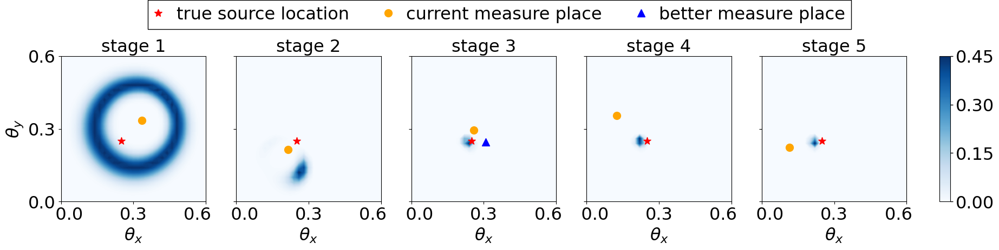

In [105]:
import numpy as np
import jax.numpy as jnp




n_stage =5
local_size = 51
center = jnp.array([0.25,0.25])

import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter, MaxNLocator
from matplotlib.colors import LinearSegmentedColormap

fig, axes = plt.subplots(1, 5, figsize=(4.03*5, 3.5))
fig.subplots_adjust(wspace=0.21)

# fig.subplots_adjust(left = 0.05, right = 0.9, wspace=0.3)

grid_x_plot0, grid_y_plot0 = np.meshgrid(np.linspace(0, 1, local_size), np.linspace(0, 1, local_size))

        
fontsize = 23
pic_num=0

# 内置颜色图
cmap = 'Blues'#'PuBu'#'pink'#'GnBu'#'Greens'#
star_color = 'r'#'magenta'#'y'#'#F89054'#


def custom_formatter(x, pos):
    if x == 0.0:
        return '   0.0'  # 向右移动
    elif x == 0.6:
        return '0.6   '  # 向左移动
    elif x == 0.3:
        return '0.3'
    else:
        return f'{x:.2f}'


for stage in [0,1,2,3,4]:
    d_start = design_list[stage+1]
    d_start_backup = design_list[stage]
    contour=axes[pic_num].contourf(grid_x_plot0, grid_y_plot0, posterior_list[stage].T, levels=100,cmap=cmap)#plasma' )
    axes[pic_num].scatter(d_start[0], d_start[1], marker='o', s=100, c='orange')

    if stage == 2:
        axes[pic_num].scatter(d_start[0]+0.05, d_start[1]-0.05, marker='^', s=100, c='blue')
    
    axes[pic_num].scatter(center[0], center[1], marker='*', s=100, c=star_color)
    #axes[pic_num].plot([d_start[0],d_start_backup[0]],[d_start[1],d_start_backup[1]], c='orangered')
    axes[pic_num].set_title(f'stage {stage+1}', fontsize=fontsize)  # 设置子图的标题
    axes[pic_num].set_xlabel('$\\theta_x$', fontsize=fontsize)  # 设置x轴标签
    axes[pic_num].set_yticks([0.0, 0.3,0.6])
    if stage == 0:
        axes[pic_num].set_ylabel('$\\theta_y$', fontsize=fontsize)  # 设置y轴标签
    else:
        axes[pic_num].set_yticklabels([]) 
        
    axes[pic_num].tick_params(axis='both', which='major', labelsize=fontsize)
    axes[pic_num].set_xticks([0.0,0.3,0.6])
    axes[pic_num].xaxis.set_major_formatter(FuncFormatter(custom_formatter))
    axes[pic_num].set_xlim([0.0,0.6])
    axes[pic_num].set_ylim([0.0,0.6])
    pic_num=pic_num+1

cbar_ax = fig.add_axes([0.93, 0.11, 0.01, 0.77])  # [left, bottom, width, height]
contour_set = plt.cm.ScalarMappable(cmap=cmap)#'plasma')
contour_set.set_array(posterior_list[stage])

#contour_set.set_clim(0, 0.06)
#ticks = [0, 0.02, 0.04, 0.06]
contour_set.set_clim(0, 0.45)
ticks = [0, 0.15, 0.30, 0.45]
#contour_set.set_clim(0, 0.33)
#ticks = [0, 0.11, 0.22, 0.33]

cbar = fig.colorbar(contour_set, cax=cbar_ax, orientation='vertical', shrink=0.4, aspect=20, pad=0.06)
cbar.ax.tick_params(labelsize=fontsize, width=1)
cbar.set_ticks(ticks)
cbar.update_ticks()

plt.plot([], [], marker='*', markersize=10, color=star_color, linestyle='None', label='true source location')
plt.plot([], [], marker='o', markersize=10, color='orange', linestyle='None', label='current measure place')

plt.plot([], [], marker='^', markersize=10, color='b', linestyle='None', label='better measure place')

legend = plt.legend(
    loc='center',
    bbox_to_anchor=(0.527, 1.1),  # 仅调整纵坐标位置，使其离上面远一点，离下面近一点
    ncol=3,
    frameon=True,
    framealpha=1,
    edgecolor='black',
    fontsize=fontsize,
    borderpad=0.05, handlelength=0.5,
    bbox_transform=fig.transFigure  # 将定位转换为相对于整个图形
)
legend.get_frame().set_edgecolor('black')  # 设置边框颜色为黑色
legend.get_frame().set_linewidth(1)  # 设置边框线宽为1
legend.get_frame().set_boxstyle("Square")


plt.savefig('NN case good design.png',bbox_inches='tight')

In [86]:
np.max(posterior_list[2])

0.3142578

In [5]:
#读取数据
with open('all_data_nn_case_data_6_test11.pkl', 'rb') as f:
    loaded_data = pickle.load(f)

posterior_list = loaded_data["posterior_list"]
posterior_oed_list = loaded_data["posterior_oed_list"]
design_list = loaded_data["design_list"]
params_list = loaded_data["params_list"]
estimated_posterior_point = loaded_data["estimated_posterior_point"]

(0.0, 30.0)

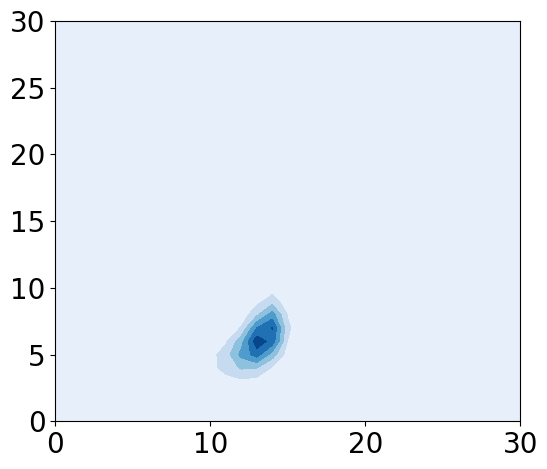

In [50]:
plt.figure(figsize=(6,5.2))
plt.contourf(posterior_list[1].T,cmap = 'Blues')
plt.xlim([0,30])
plt.ylim([0,30])

(0.0, 30.0)

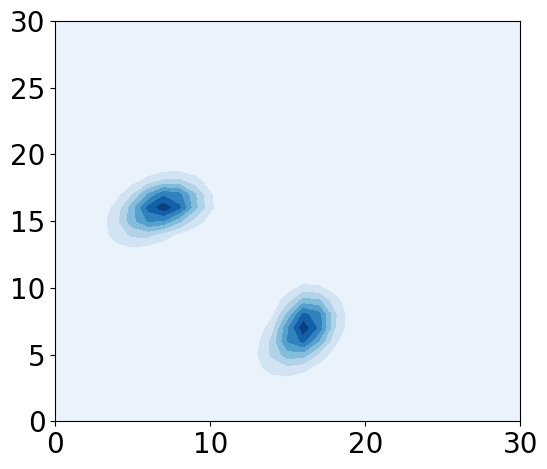

In [49]:
plt.figure(figsize=(6,5.2))
plt.contourf(posterior_oed_list[1].T,cmap = 'Blues')
plt.xlim([0,30])
plt.ylim([0,30])

In [6]:
# 保存数据
import pickle

numpy_list = [np.array(arr) for arr in posterior_list]
data_to_save = {
    "posterior_list": numpy_list,
    "posterior_oed_list": posterior_oed_list,
    "design_list": design_list,
    "params_list": params_list,
    "estimated_posterior_point": estimated_posterior_point
}

with open('all_data_nn_case_data_6_test11.pkl', 'wb') as f:
    pickle.dump(data_to_save, f)

#test1 不对design做修改
#test2 是对design做了修改
#test3 不做correction

#更正了似然函数的计算公式
#test5 单纯model correction 原本的学习陷入局部最小值
#test6 不做model correction                                 # 使用的数据
#test7 单纯model correction 增大扰动值为0.05 使用线性衰减
#test8 第二步改了设计
#test9 单纯model correction 使用大扰动加大的衰减              # 使用的数据
#test10 第三步改了设计，但是后验变化不大
#test11 第二步改了设计                                       # 使用的数据
#test12 用所有点

(5.0, 20.0)

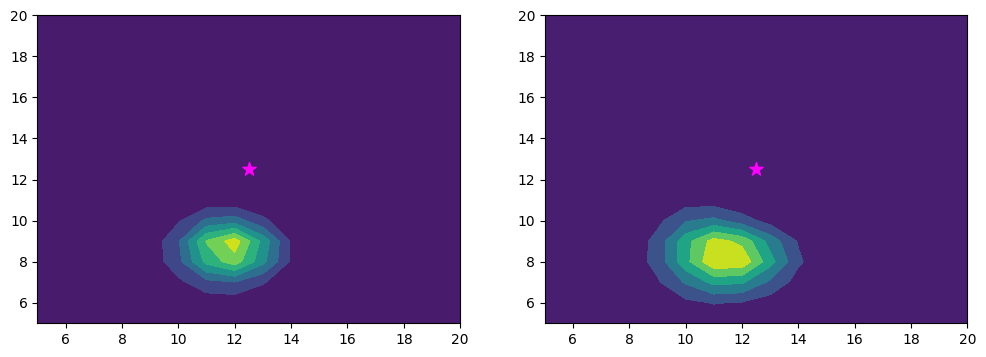

In [9]:
with open('all_data_nn_case_data_6_test.pkl', 'rb') as f:
    loaded_data = pickle.load(f)

posterior_list = loaded_data["posterior_list"]

fig, axes = plt.subplots(1,2,figsize=(12,4))
axes[0].contourf(posterior_list[3].T)
axes[0].scatter(center[0]*50, center[1]*50, marker='*', s=100, c='magenta')
axes[0].set_xlim([5,20])
axes[0].set_ylim([5,20])
axes[1].contourf(posterior_oed_list[-1].T)
axes[1].scatter(center[0]*50, center[1]*50, marker='*', s=100, c='magenta')
axes[1].set_xlim([5,20])
axes[1].set_ylim([5,20])


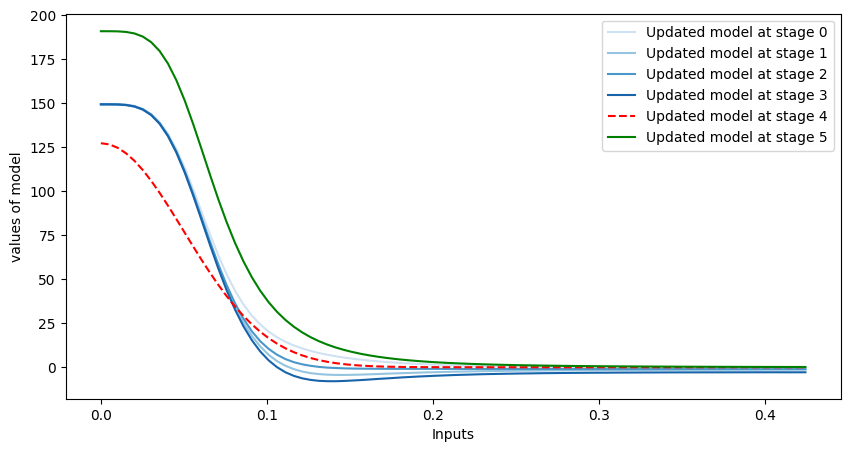

In [6]:
def show_nn_trajectory(params_list, apply_model, colormap = 'Blues', center_x=0, center_y=0, size=85):
    x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    y = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    xy_combined = jnp.concatenate((x, y), axis=1)
    
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    
    plt.figure(figsize=(10, 5))
    
    cmap = plt.colormaps[colormap].resampled(len(params_list)+2)#cm.get_cmap('Blues', len(params_list))
    for index, params in enumerate(params_list):
        #if index not in [6]:
        #    continue
        array_nn = apply_model.apply(params, xy_combined) #* 100.0
        
        plt.plot(jnp.sqrt(2) * x.squeeze(), 
                 (array_nn.squeeze() + array_reciprocal.squeeze()), 
                 label=f'NN + Reciprocal - Params {index+1}',
                 color=cmap(index+1))
    
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_exponent.squeeze(), color='r', linestyle = '--', label='Exponent')
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_reciprocal.squeeze(), color='g', label='Reciprocal')
    
    plt.ylabel('values of model')
    plt.xlabel('Inputs')
    
#show_nn_trajectory(params_list, model, center_x=0, center_y=0, size=85)
show_nn_trajectory(params_list[:-1], model, center_x=0, center_y=0, size=85)

plt.legend()

leg = plt.gca().get_legend()

new_labels = ['Updated model at stage 0', 'Updated model at stage 1','Updated model at stage 2','Updated model at stage 3','Updated model at stage 4','Updated model at stage 5', 'Updated model at stage 6','System', 'Baseline model']

for text, new_label in zip(leg.get_texts(), new_labels):
    text.set_text(new_label)

plt.draw()

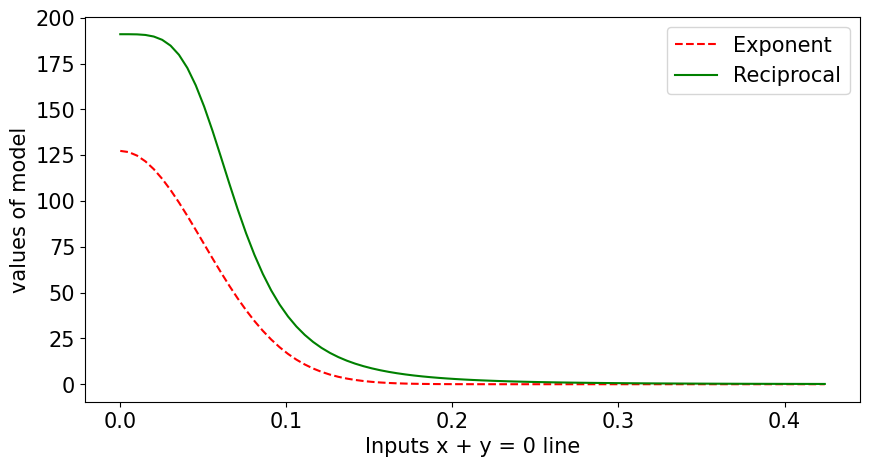

In [29]:
def show_nn_trajectory_diag(params_list, apply_model, colormap='Blues', size=85):
    x = jnp.linspace(0, 0.30, size).reshape(-1, 1)
    y = 0.0 - x
    xy_combined = jnp.concatenate((x, y), axis=1)

    exponent_internal = ((x - 0) ** 2 + (y - 0) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)

    plt.figure(figsize=(10, 5))

    cmap = plt.colormaps[colormap].resampled(len(params_list) + 2)
    for index, params in enumerate(params_list):
        array_nn = apply_model.apply(params, xy_combined)

        plt.plot(jnp.sqrt(2) * x.squeeze(),
                 (array_nn.squeeze() + array_reciprocal.squeeze()),
                 label=f'NN + Reciprocal - Params {index + 1}',
                 color=cmap(index + 1))

    plt.plot(jnp.sqrt(2) * x.squeeze(),
             array_exponent.squeeze(), color='r', linestyle='--', label='Exponent')
    plt.plot(jnp.sqrt(2) * x.squeeze(),
             array_reciprocal.squeeze(), color='g', label='Reciprocal')

    plt.ylabel('values of model')
    plt.xlabel('Inputs x + y = 0 line')
    plt.legend()
    plt.show()


show_nn_trajectory_diag(params_list[:-1], model)

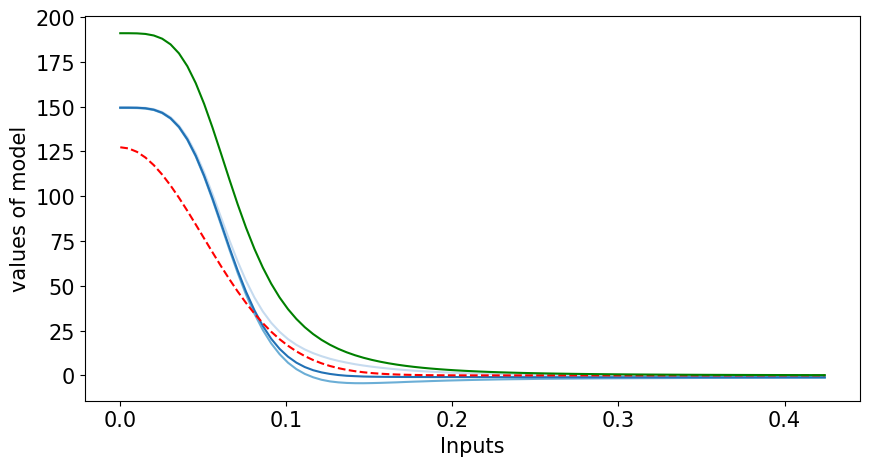

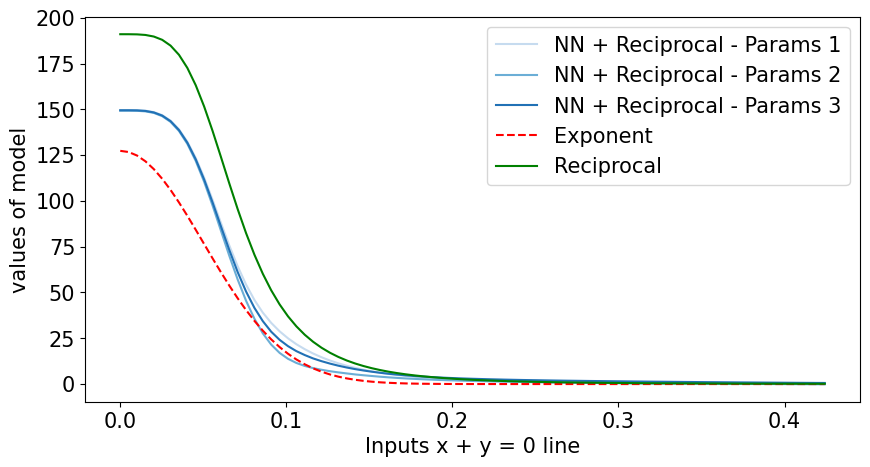

In [64]:
#with open('all_data_nn_case_data_6_test7.pkl', 'rb') as f:
#    loaded_data = pickle.load(f)
#
#params_list = loaded_data["params_list"]

show_nn_trajectory([params_list[0],params_list[1],params_list[2]], model)
show_nn_trajectory_diag([params_list[0],params_list[1],params_list[2]], model) # 不修改设计

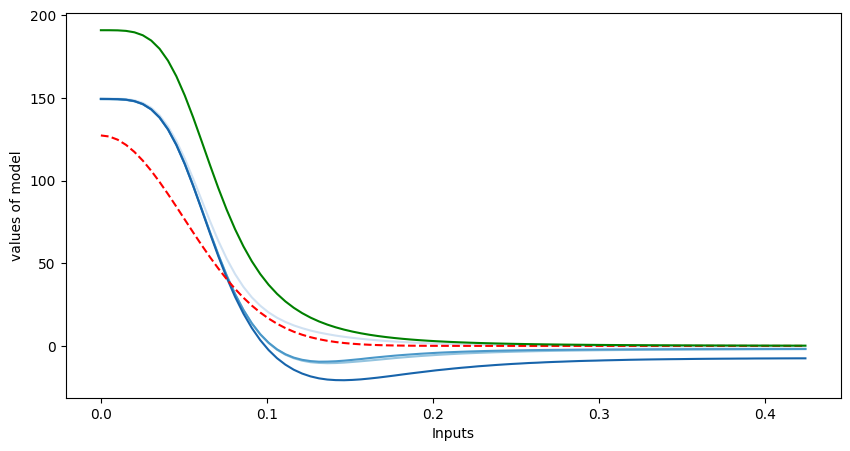

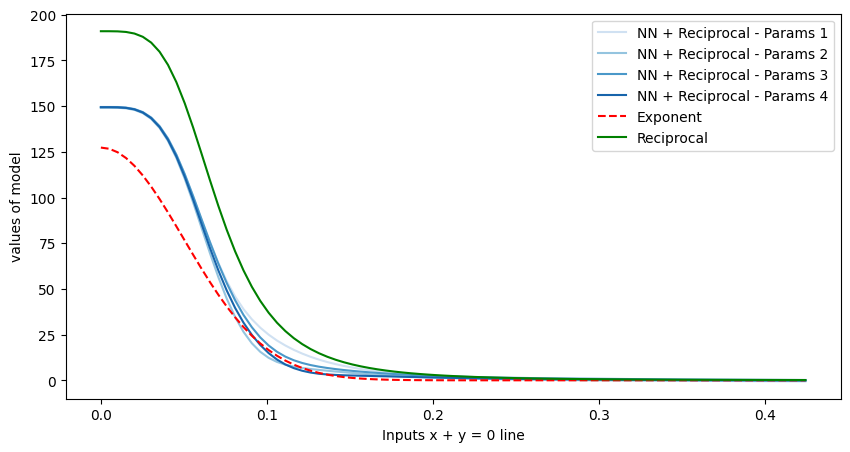

In [154]:
#读取数据
with open('all_data_nn_case_data_6_test8.pkl', 'rb') as f:
    loaded_data = pickle.load(f)

params_list = loaded_data["params_list"]

show_nn_trajectory([params_list[0],params_list[1],params_list[2],params_list[3]], model)
show_nn_trajectory_diag([params_list[0],params_list[1],params_list[2],params_list[3]], model) # 修改设计

In [54]:
design_list

[Array([0.5, 0.5], dtype=float32),
 Array([0.3860589 , 0.38600475], dtype=float32),
 Array([0.30302617, 0.30292052], dtype=float32),
 Array([0.25707266, 0.28082484], dtype=float32),
 Array([0.3296741 , 0.23870234], dtype=float32),
 Array([0.29042608, 0.17356515], dtype=float32),
 Array([0.35514557, 0.10731688], dtype=float32),
 Array([0.39422476, 0.04704005], dtype=float32)]

In [54]:
(jnp.array([0.33066455, 0.24762303])-jnp.array([0.26151356, 0.28208357]))/2+design_list[stage]

Array([0.29608905, 0.2648533 ], dtype=float32)

In [146]:
for stage in range(1,n_stage):
    print('stage = ', stage)
    estimated_center = estimated_posterior_point[stage]
    #u_t = sealed_convection_diffusion_true(d_start, center, stage)[1][100:151,100:151]
    #u_design_5 = sealed_convection_diffusion_nn(params_list[stage-1], d_start, estimated_center, stage, model)[1][100:151,100:151]
    #u_design_7 = sealed_convection_diffusion_nn(params_list[stage], d_start, estimated_center, stage, model)[1][100:151,100:151]
    #print(np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_7)**2))
    #print(np.sum(((u_t - u_design_5)/u_t)**2),np.sum(((u_t - u_design_7)/u_t)**2))
    
    u_t = sealed_convection_diffusion_true(d_start, center, stage)[1][100:151,100:151]
    u_design_5 = sealed_convection_diffusion_nn(params_list[stage-1], d_start, center, stage, model)[1][100:151,100:151]
    u_design_7 = sealed_convection_diffusion_nn(params_list[stage], d_start, center, stage, model)[1][100:151,100:151]
    #print(np.sum(((u_t - u_design_5)/u_t)**2),np.sum(((u_t - u_design_7)/u_t)**2),'\n')
    print(np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_7)**2),'\n')

stage =  1
22.758408 71.71507 

stage =  2
392.5998 170.40518 

stage =  3
456.91083 99.092606 

stage =  4
153.13881 33.37152 



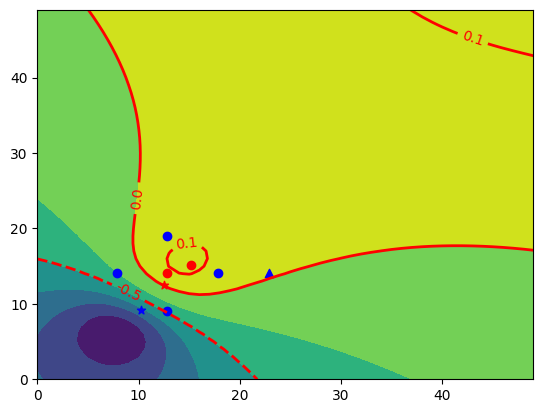

In [92]:
_, y0 = sealed_convection_diffusion_true(d_start, center, stage)
_, y1 = sealed_convection_diffusion_true(d_start, estimated_center, stage)
percentage = ((y0-y1)/y0)[100:150,100:150]
plt.contourf(percentage.T)
contour = plt.contour(percentage.T, levels=[-0.5, 0, 0.15], colors='red', linewidths=2)

plt.scatter(estimated_center[0]*50, estimated_center[1]*50, marker='*', color='b')
plt.scatter(center[0]*50, center[1]*50, marker='*', color='r')


# 添加等高线的标签 (可选)
plt.clabel(contour, fmt='%1.1f')
d_start2 = design_list[stage+1]*50

plt.scatter(d_start2[0], d_start2[1], marker='o', color='r')


d_start2 = design_list[stage]*50
plt.scatter(d_start2[0], d_start2[1], marker='o', color='r')

#d_start2 = (design_list[stage+1]+jnp.array([-0.01,0.005]))*50
#plt.scatter(d_start2[0], d_start2[1], marker='o', color='y')

d_start2 = (design_list[stage+1]-jnp.array([0.10,0.0]))*50
plt.scatter(d_start2[0], d_start2[1], marker='o', color='b')

d_start2 = (design_list[stage+1]+jnp.array([0.10,0.0]))*50
plt.scatter(d_start2[0], d_start2[1], marker='o', color='b')

d_start2 = (design_list[stage+1]-jnp.array([0.0,0.10]))*50
plt.scatter(d_start2[0], d_start2[1], marker='o', color='b')

d_start2 = (design_list[stage+1]+jnp.array([0.0,0.10]))*50
plt.scatter(d_start2[0], d_start2[1], marker='o', color='b')

d_start2 = (design_list[stage+1]+jnp.array([0.2,0.0]))*50
plt.scatter(d_start2[0], d_start2[1], marker='^', color='b')

In [107]:
14/50

0.28

In [108]:
indices = jnp.argpartition(y0.ravel(), -1)[-1:]
multi_indices

(Array([114], dtype=int32), Array([114], dtype=int32))

In [26]:
d_start = design_list[stage+1]+jnp.array([0.1,0.0])
y0, _ = sealed_convection_diffusion_true(d_start, center, stage)
y1, _ = sealed_convection_diffusion_true(d_start, estimated_center, stage)
y0,y1

(Array(0.2345945, dtype=float32), Array(0.23659566, dtype=float32))

In [67]:
design_list[stage+1]

Array([0.33066455, 0.24762303], dtype=float32)

In [11]:
noise_loc = 0
noise_base_scale = 0.05
noise_ratio_scale = 0.05
noise_info = [(noise_loc, noise_base_scale, noise_ratio_scale),]

for stage in [3]:
    key_for_design = random.split(key[stage*2],iteration_step_number1[stage])
    key_for_param = random.split(key[stage*2+1],80)#iteration_step_number2[stage])

    prior = posterior_list[stage-1]
    params=params_list[stage-1]
    d_start = design_list[stage+1]

    if stage!=0:
        _, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
        del prior
        prior = posterior
    
    #print(f'prior = {prior}')
    num_top = 5
    indices = jnp.argpartition(prior.ravel(), -num_top)[-num_top:]
    multi_indices = jnp.unravel_index(indices, prior.shape)
    
    # 计算平均坐标
    average_x = np.mean(multi_indices[0])
    average_y = np.mean(multi_indices[1])
    
    # 直接使用平均坐标
    estimated_center = jnp.array([average_x, average_y])/50
    print(f'estimated_center is ', estimated_center)

    # 运行之前必须先运行上面
    evidence_list_special = []
    NN_error_list_special = []

    #if stage!=0:
    #    del tx2
    #    del opt_state2
        
    tx2 = optax.chain(
    optax.adam(0.012),  # 使用由 lr_schedule1 调整的学习率的 Adam 优化器
    optax.add_decayed_weights(1e-4)  # 添加权重衰减，衰减系数为 1e-5
    )
    opt_state2 = tx2.init(params)

    start_time = time.time()

    
    print(f'original design for OED is {d_start}')
    d_move = jnp.array([0.05,-0.05])
    print(f'move design {d_move}')
    d_start = design_list[stage+1]+d_move
    
    print(f'design for model correction is {d_start}')
    observation, u_t_251 = sealed_convection_diffusion_true(d_start, center, stage)
    u_t = u_t_251[100:151,100:151]
    print(f'measurement is: {observation}')

    print('start learning params')
    for i in range(80):#iteration_step_number2[stage]):
        if stage in [0]:
            print('stage one dont learn error parameters')
            break
            
        #observation_perturbed =  observation + 0.003 * jax.random.normal(key_for_param[i], observation.shape)* (80 - i)/80
        estimated_center_perturbed = estimated_center + 0.05 * jax.random.normal(key_for_param[i], estimated_center.shape)*jnp.exp(-0.04*i)
        max_evidence_items, grad_params = jax.value_and_grad(loss_param_refine5)(params, d_start, stage, estimated_center_perturbed, model, observation)

        clip_norm = 1e10
        clip_transform = optax.clip_by_global_norm(clip_norm)
        clipped_grads, _ = clip_transform.update(grad_params, state=None)
        
        updates, opt_state2 = tx2.update(clipped_grads, opt_state2, params=params)
        
        # 解决nan的问题
        updates_contain_nans = any(jnp.any(jnp.isnan(u)) for u in jax.tree_util.tree_leaves(updates))
        if updates_contain_nans:
            print(f'NaN appears in learning. Perturb params and continue.')
            noise = jax.tree_util.tree_map(lambda p: 0.01 * jax.random.normal(key_for_param[i], p.shape), params)
            params = jax.tree_util.tree_map(lambda p, n: p + n, params, noise)
        else:
            params = optax.apply_updates(params, updates)
            
        net_accuracy = evaluate_nn_accuracy(params,model,center,local_size)
        #print(f'Loss step {i} max evidence items: {max_evidence_items}, nn error {i}: {net_accuracy}')
        
        if np.isnan((max_evidence_items, net_accuracy)).any():
            print('some results are Nan')
            break
            
        evidence_list_special.append(-max_evidence_items)
        NN_error_list_special.append(net_accuracy)
    
    
    end_time = time.time()
    print(f"Execution learning param time: {end_time - start_time} seconds")

    u_design_5 = sealed_convection_diffusion_nn(params, d_start, center, stage, model)[1][100:151,100:151]
    print('current error is ', np.sum((u_t - u_design_5)**2))

estimated_center is  [0.268      0.18399999]
original design for OED is [0.3991495  0.22517781]
move design [ 0.05 -0.05]
design for model correction is [0.44914952 0.17517781]
measurement is: 0.1609523743391037
start learning params
Execution learning param time: 115.15405678749084 seconds
current error is  76.67081


In [74]:
jnp.exp(-0.05*80), jnp.exp(-0.03*80), jnp.exp(-0.07*80)

(Array(0.01831564, dtype=float32, weak_type=True),
 Array(0.09071794, dtype=float32, weak_type=True),
 Array(0.00369786, dtype=float32, weak_type=True))

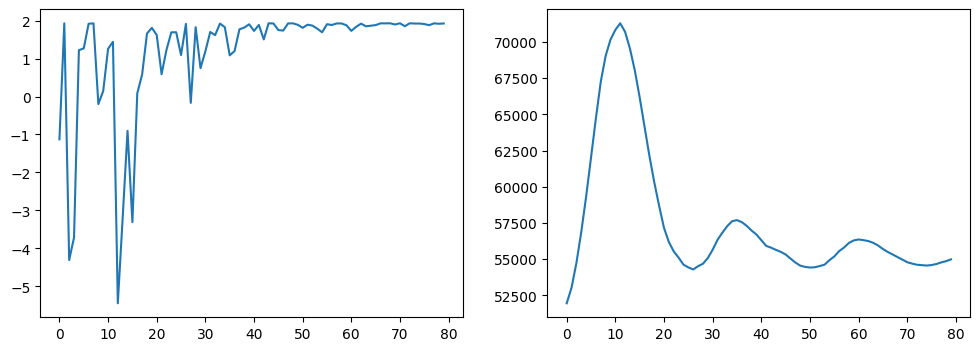

In [12]:
fig,axes = plt.subplots(1,2,figsize=(12,4))
axes[0].plot(evidence_list_special)
axes[1].plot(NN_error_list_special)

In [13]:
u_t = sealed_convection_diffusion_true(d_start, center, stage)[1][105:120,105:120]
u_design_5 = sealed_convection_diffusion_nn(params, d_start, center, stage, model)[1][105:120,105:120]
u_design_8 = sealed_convection_diffusion_nn(params_list[stage], d_start, center, stage, model)[1][105:120,105:120]
np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_8)**2)

(1.3438244, 3.329196)

In [14]:
u_t = sealed_convection_diffusion_true(d_start, center, stage)[1][100:151,100:151]
u_design_5 = sealed_convection_diffusion_nn(params, d_start, center, stage, model)[1][100:151,100:151]
u_design_8 = sealed_convection_diffusion_nn(params_list[stage], d_start, center, stage, model)[1][100:151,100:151]
np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_8)**2)

(76.67081, 132.84708)

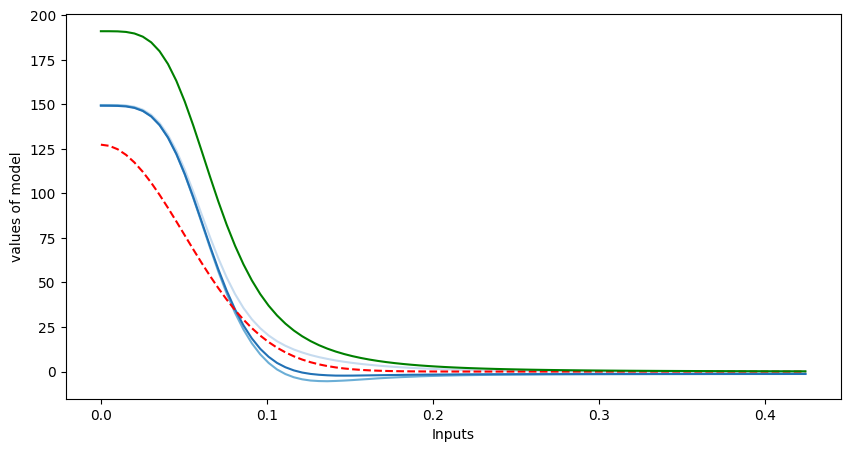

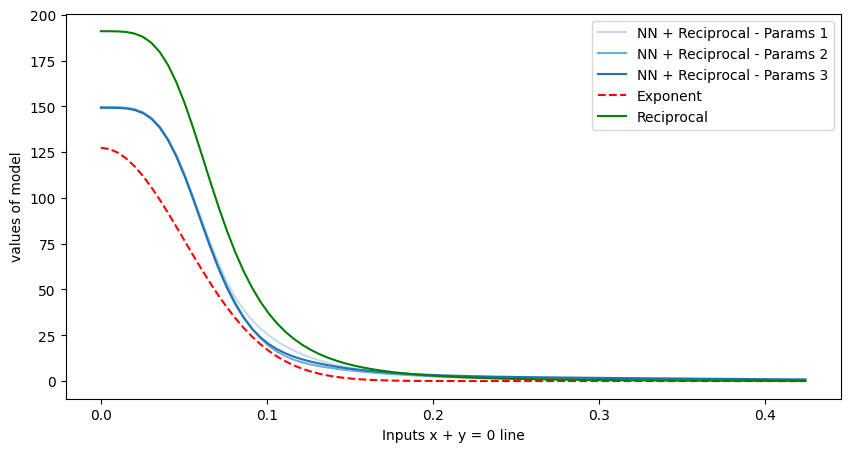

In [15]:
show_nn_trajectory([params_list[0],params_list[stage],params], model, center_x=0, center_y=0, size=85)
show_nn_trajectory_diag([params_list[0],params_list[stage],params], model)

total loss  76.67081 132.84708
local loss  0.074385226 0.54621446


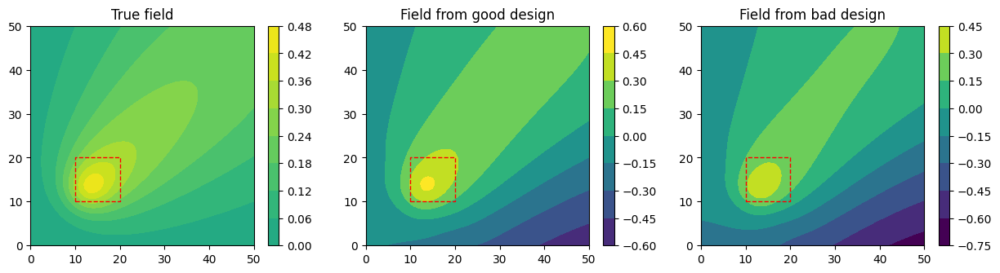

In [16]:
import matplotlib.patches as patches

u_t = sealed_convection_diffusion_true(d_start, center, stage)[1][100:151,100:151]
u_design_7 = sealed_convection_diffusion_nn(params_list[stage], d_start, center, stage, model)[1][100:151,100:151]
u_design_5 = sealed_convection_diffusion_nn(params, d_start, center, stage, model)[1][100:151,100:151]
print('total loss ',np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_7)**2))
print('local loss ',np.sum(((u_t - u_design_5)**2)[10:20,10:20]),np.sum(((u_t - u_design_7)**2)[10:20,10:20]))

# 找到所有数据的全局最小值和最大值
vmin = min(np.min(u_t), np.min(u_design_5), np.min(u_design_7))
vmax = max(np.max(u_t), np.max(u_design_5), np.max(u_design_7))

# 创建子图
fig, axes = plt.subplots(1, 3, figsize=(15, 3.5))

# 绘制 contourf 图像并设置相同的 vmin 和 vmax
c1 = axes[0].contourf(u_t.T, vmin=vmin, vmax=vmax)
c2 = axes[1].contourf(u_design_5.T, vmin=vmin, vmax=vmax)
c3 = axes[2].contourf(u_design_7.T, vmin=vmin, vmax=vmax)

rect = patches.Rectangle((10, 10), 10, 10, linewidth=1, linestyle='--', edgecolor='red', facecolor='none')
axes[0].set_title('True field')
axes[0].add_patch(rect)

rect = patches.Rectangle((10, 10), 10, 10, linewidth=1, linestyle='--', edgecolor='red', facecolor='none')
axes[1].set_title('Field from good design')
axes[1].add_patch(rect)

rect = patches.Rectangle((10, 10), 10, 10, linewidth=1, linestyle='--', edgecolor='red', facecolor='none')
axes[2].set_title('Field from bad design')
axes[2].add_patch(rect)

# 为所有子图添加颜色条
fig.colorbar(c1, ax=axes[0])
fig.colorbar(c2, ax=axes[1])
fig.colorbar(c3, ax=axes[2])

plt.show()

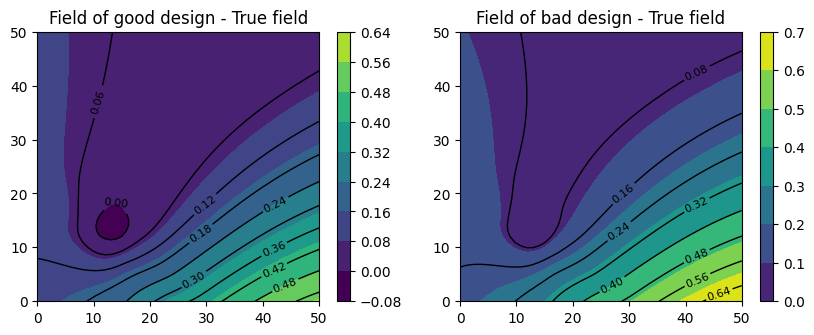

-0.0052565634 0.044045717


In [18]:
fig, axes = plt.subplots(1, 2, figsize=(10, 3.5))

vmin = min(np.min(u_t-u_design_5), np.min(u_t-u_design_7))
vmax = max(np.max(u_t-u_design_7), np.max(u_t-u_design_5))

# 绘制 contourf 图像并设置相同的 vmin 和 vmax
c1 = axes[0].contourf((u_t - u_design_5).T, vmin=vmin, vmax=vmax)
c2 = axes[1].contourf((u_t - u_design_7).T, vmin=vmin, vmax=vmax)

# 绘制等高线并标记所有等高线的值
contour1 = axes[0].contour((u_t - u_design_5).T, levels=10, colors='black', linewidths=1)
contour2 = axes[1].contour((u_t - u_design_7).T, levels=10, colors='black', linewidths=1)

# 给等高线标注值
axes[0].clabel(contour1, inline=True, fontsize=8)
axes[1].clabel(contour2, inline=True, fontsize=8)

axes[0].set_title('Field of good design - True field')
axes[1].set_title('Field of bad design - True field')

# 为所有子图添加颜色条
fig.colorbar(c1, ax=axes[0])
fig.colorbar(c2, ax=axes[1])

plt.show()

# 打印特定位置的值
print((u_t - u_design_5)[12, 12], (u_t - u_design_7)[12, 12])

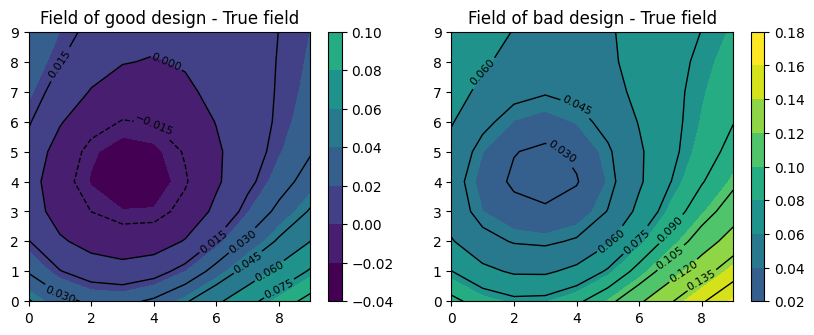

-0.0052565634 0.044045717 -0.019554406 0.031665564


In [19]:
fig, axes = plt.subplots(1, 2, figsize=(10, 3.5))

vmin = min(np.min(u_t[10:20,10:20]-u_design_5[10:20,10:20]), np.min(u_t[10:20,10:20]-u_design_7[10:20,10:20]))
vmax = max(np.max(u_t[10:20,10:20]-u_design_7[10:20,10:20]), np.max(u_t[10:20,10:20]-u_design_5[10:20,10:20]))

# 绘制 contourf 图像并设置相同的 vmin 和 vmax
c1 = axes[0].contourf((u_t[10:20,10:20] - u_design_5[10:20,10:20]).T, vmin=vmin, vmax=vmax)
c2 = axes[1].contourf((u_t[10:20,10:20] - u_design_7[10:20,10:20]).T, vmin=vmin, vmax=vmax)

# 绘制等高线并标记所有等高线的值
contour1 = axes[0].contour((u_t[10:20,10:20] - u_design_5[10:20,10:20]).T, levels=10, colors='black', linewidths=1)
contour2 = axes[1].contour((u_t[10:20,10:20] - u_design_7[10:20,10:20]).T, levels=10, colors='black', linewidths=1)

# 给等高线标注值
axes[0].clabel(contour1, inline=True, fontsize=8)
axes[1].clabel(contour2, inline=True, fontsize=8)

axes[0].set_title('Field of good design - True field')
axes[1].set_title('Field of bad design - True field')

# 为所有子图添加颜色条
fig.colorbar(c1, ax=axes[0])
fig.colorbar(c2, ax=axes[1])

plt.show()

# 打印特定位置的值
print((u_t - u_design_5)[12, 12], (u_t - u_design_7)[12, 12],(u_t - u_design_5)[13, 13], (u_t - u_design_7)[13, 13])


 stage =  3 

start learning design
start design :  [0.25369713 0.2914539 ]
Execution learning design time: 74.3653130531311 seconds


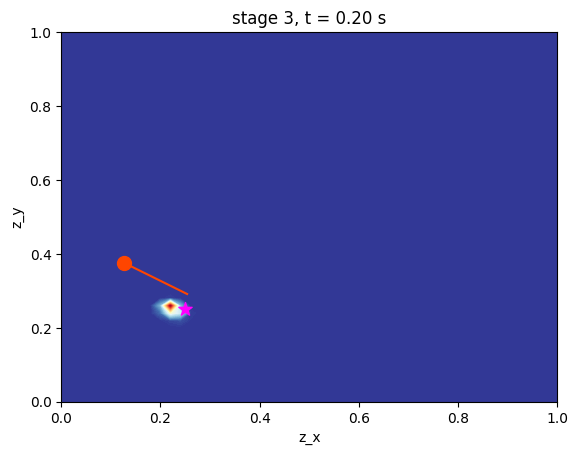

In [61]:
# 完成了新的设计计算后直接计算下一阶段的OED
#def calculate_loglikelihood(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model):
#    '''
#    参数：
#    stage: 当前的阶段。用于决定forward模拟的步数
#    center: 污染源的中心
#    current_params: 网络的参数
#    d_start: 测量点
#    prior: 先验
#    noise_info: 测量误差设置
#    num_d: 计算后验时使用的点数
#    radio_d: 在测量点附近多选几个点测量，本质上可以理解为多次测量消除误差，可以考虑直接舍弃误差
#
#    说明：
#    1，假设数据量是300*300，计算范围是3*3
#    应该是需要数据尺寸是3的倍数，否则到时候后验那里也会费劲
#    也可以不是3的倍数，只要后验矩阵和数据矩阵匹配就行
#    2，运用了等效的原则。主要起作用的是测量点和center的相对位置
#    这里突然想到nn应该需要四个参数，当前的坐标和center，而不是仅当前坐标。
#    '''
#    noise_loc, noise_base_scale, noise_ratio_scale = noise_info[0]
#    if num_d == 1.0:
#        output_point, _ = sealed_convection_diffusion_true(d_start, center, stage) #这里的形状是()
#        #key, subkey = random.split(key) 这一步放在外面
#        
#        #暂时只考虑不要误差的情况：
#        #observation = output_point + jnp.array([0.0])
#
#        #这是要误差的代码：
#        noise = random.normal(key,(1,1))*(noise_base_scale+jnp.abs(output_point)*noise_ratio_scale) #形状(1,1)
#        observation = output_point + noise*0.05
#
#        # 给一个函数，从所有的输出中找到关心的点
#        false_center = jnp.array([1.0,1.0]) - d_start
#        false_start = jnp.array([0.5, 0.5])
#        _, output_all = sealed_convection_diffusion_nn(current_params, false_start, false_center, stage, model)
#        #_, output_all = sealed_convection_diffusion_true(false_start, false_center, stage) #这里的形状是()
#        output_all_central_sym = jnp.fliplr(jnp.flipud(output_all))
#        # 取出[0,1]^2之间的矩阵
#        xb_lo = int((0.0 - lo_b) / (up_b - lo_b) * (size - 1))
#        xb_up = int((1.0 - lo_b) / (up_b - lo_b) * (size - 1))
#        output_for_xb = output_all_central_sym[xb_lo:(xb_up+1),xb_lo:(xb_up+1)]
#        # 针对于每一个数字求likelihood
#        loglikelihood = jax.scipy.stats.norm.logpdf(output_for_xb, loc=observation, scale=noise_base_scale+noise_ratio_scale*jnp.abs(observation))
#        #loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=output_for_xb, scale=noise_base_scale+noise_ratio_scale*jnp.abs(output_for_xb))
#    return loglikelihood
    
key = random.split(key[-1],5)
#fig, axes = plt.subplots(1,5,figsize=(20,4))

for stage in [3]:

    d_start = design_list[stage]
    prior = posterior_list[stage-1]
    #params = params_list[stage-1] #沿用刚才的参数，不需要重新赋值
    #params = {'params': {'Dense_0': {'bias': jnp.array([ 1.2822,  1.1528, -1.2200,  1.1325]),
    #       'kernel': jnp.array([[ 11.5953, -11.6090, -11.8334, -10.5519],
    #    [-12.3921, -10.8175, -10.9383,  11.3898]])},
    #      'Dense_1': {'bias': jnp.array([-2.7209,  2.6878, -2.6491,  2.6046]),
    #       'kernel': jnp.array([[ 1.7158, -1.7884,  3.0201,  0.2812],
    #    [-0.2900, -3.1346,  1.7407, -1.8116],
    #    [-3.0800, -0.2645, -1.6933,  1.7542],
    #    [ 1.7458, -1.8156, -0.3283, -3.0389]])},
    #      'Dense_2': {'bias': jnp.array([-10.0284]),
    #       'kernel': jnp.array([[-13.7486],
    #    [ 12.9524],
    #    [-13.6961],
    #    [ 13.3542]])}}
    #     }
    
    print('\n stage = ', stage, '\n')
    key_for_design = random.split(key[stage*2],40)
    
    clip_count = 0
    
    if stage!=0:
        del tx1
    else:
        print(f'stage = 0, only run forward model and update posterior')
        
    #tx1 = optax.adam(lr_schedule1)
    tx1 = optax.chain(
    optax.adam(learning_rate1),  # 使用由 lr_schedule1 调整的学习率的 Adam 优化器
    optax.add_decayed_weights(1e-4)  # 添加权重衰减，衰减系数为 1e-5
    )
    
    opt_state1 = tx1.init(d_start)
    
    d_limit_min = d_start - d_change_range
    d_limit_max = d_start + d_change_range
    
    start_time = time.time()
    d_start_backup = d_start

    print('start learning design')
    print(f'start design : ', d_start)
    for i in range(40):
        negtive_KLD, grad_design = jax.value_and_grad(loss_design)(d_start, params, stage, center, prior, noise_info, num_d, radio_d, key_for_design[i], model)
        updates, opt_state1 = tx1.update(grad_design, opt_state1, params=d_start)

        
        # 解决nan的问题
        oed_nan_index = 0
        updates_contain_nans = any(jnp.any(jnp.isnan(u)) for u in jax.tree_util.tree_leaves(updates))
        if updates_contain_nans:
            oed_nan_index = oed_nan_index + 1
            print(f'NaN appears in learning. Perturb params and continue. Nan count: {oed_nan_index}')
            noise = 0.05*jax.random.normal(key_for_design[i], d_start.shape)
            d_start = d_start+ noise
        else:
            oed_nan_index = 0
            d_start = optax.apply_updates(d_start, updates)
    
        d_start_before_clip = d_start
        d_start = jnp.clip(d_start, d_limit_min, d_limit_max)
        
        # 如果clip函数生效，即有参数被裁剪，增加计数器
        clip_count = 0
        if not jnp.all(d_start == d_start_before_clip):
            clip_count += 1
        else:
            clip_count = 0
            
        if clip_count >= 5:
            print(f"Stopping iteration at step {i} as clip function has been activated 5 times.")
            break
        
        if np.isnan(d_start).any() or np.isnan(negtive_KLD).any():
            print('some results are Nan')
            break
    
        KLD_list.append(-negtive_KLD)
        
        if oed_nan_index > 6:
            print('连续出现nam并扰动6次，停止oed')
            break
            
        #if len(KLD_list) >= 5:
        #    last_five = KLD_list[-5:]
        #    if all(abs(last_five[0] - k) < 0.01*last_five[0] for k in last_five[1:]):
        #        print("连续5步的negtive_KLD几乎相同，停止循环")
        #        break  # 跳出循环
            
    end_time = time.time()
    print(f"Execution learning design time: {end_time - start_time} seconds")

    if stage not in stage_to_skip:
        _, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
        

    
    #恢复design到原来的轨迹
    #if stage in [2]:
    design_list.append(d_start)
        
    plt.contourf(grid_x_plot0, grid_y_plot0, posterior.T, levels=100,cmap='RdYlBu_r' )
    plt.scatter(d_start[0], d_start[1], marker='o', s=100, c='orangered')
    plt.scatter(center[0], center[1], marker='*', s=100, c='magenta')
    plt.plot([d_start[0],d_start_backup[0]],
                    [d_start[1],d_start_backup[1]], c='orangered')
    plt.title(f'stage {stage}, t = {((stage+1)*0.05):.2f} s')  # 设置子图的标题
    plt.xlabel('z_x')  # 设置x轴标签
    plt.ylabel('z_y')  # 设置y轴标签
    plt.show()
    #axes[stage-8].contourf(grid_x_plot0, grid_y_plot0, posterior.T, levels=100,cmap='RdYlBu_r' )
    #axes[stage-8].scatter(d_start[0], d_start[1], marker='o', s=100, c='orangered')
    #axes[stage-8].scatter(center[0], center[1], marker='*', s=100, c='magenta')
    #axes[stage-8].plot([d_start[0],d_start_backup[0]],
    #                [d_start[1],d_start_backup[1]], c='orangered')
    #axes[stage-8].set_title(f'stage {stage}, t = {((stage+1)*0.05):.2f} s')  # 设置子图的标题
    #axes[stage-8].set_xlabel('z_x')  # 设置x轴标签
    #axes[stage-8].set_ylabel('z_y')  # 设置y轴标签
    
#fig, axes = plt.subplots(1,2,figsize=(12,4))
#axes[0].contourf(posterior_list[stage].T)
#axes[0].set_title('updated by earlier design')
#axes[1].contourf(posterior.T)
#axes[1].set_title('updated by new design')

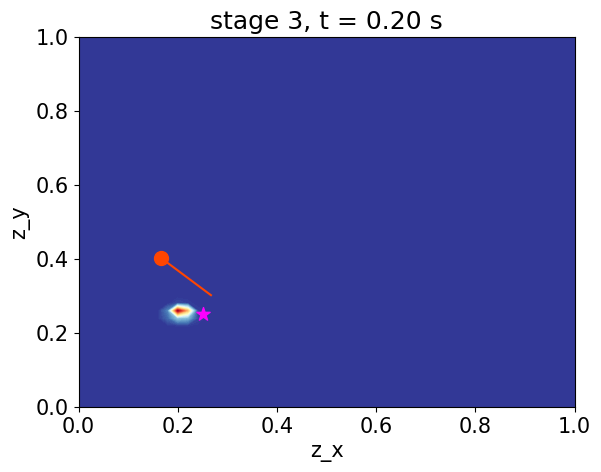

In [67]:
d_start = design_list[stage]+jnp.array([-0.1,0.1])
prior = posterior_list[stage-1]
params = params_list[stage-1] #沿用刚才的参数，不需要重新赋值
_, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
plt.contourf(grid_x_plot0, grid_y_plot0, posterior.T, levels=100,cmap='RdYlBu_r' )
plt.scatter(d_start[0], d_start[1], marker='o', s=100, c='orangered')
plt.scatter(center[0], center[1], marker='*', s=100, c='magenta')
plt.plot([d_start[0],d_start_backup[0]],
                [d_start[1],d_start_backup[1]], c='orangered')
plt.title(f'stage {stage}, t = {((stage+1)*0.05):.2f} s')  # 设置子图的标题
plt.xlabel('z_x')  # 设置x轴标签
plt.ylabel('z_y')  # 设置y轴标签
plt.show()       

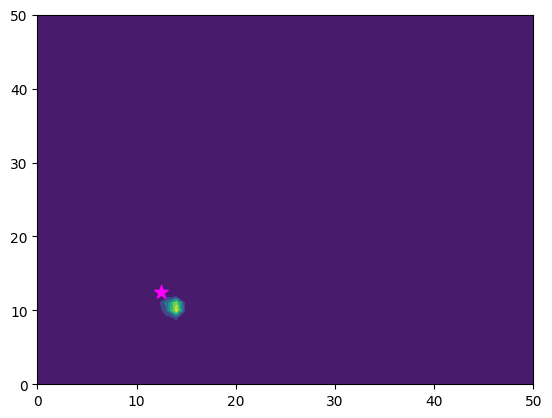

In [31]:
stage=4
prior = posterior_list[stage-1]
plt.contourf(prior.T)
plt.scatter(center[0]*50, center[1]*50, marker='*', s=100, c='magenta')
plt.show()

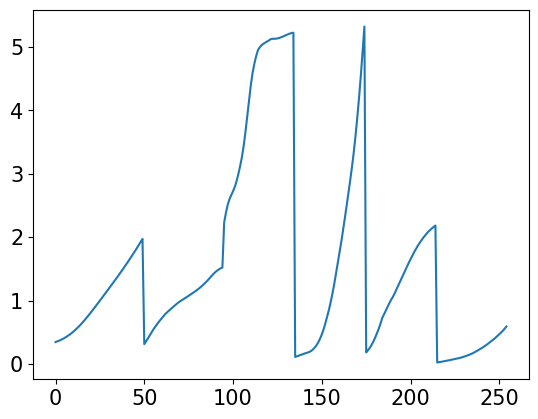

In [68]:
plt.plot(KLD_list)

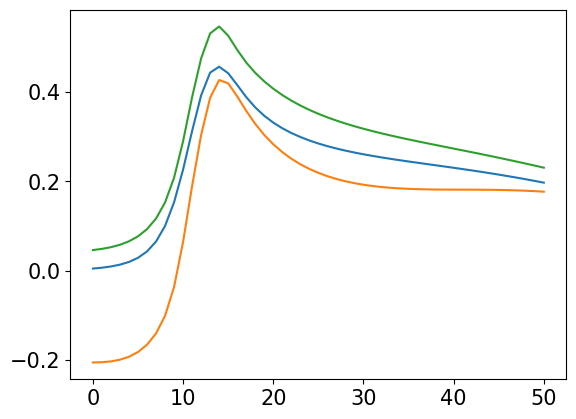

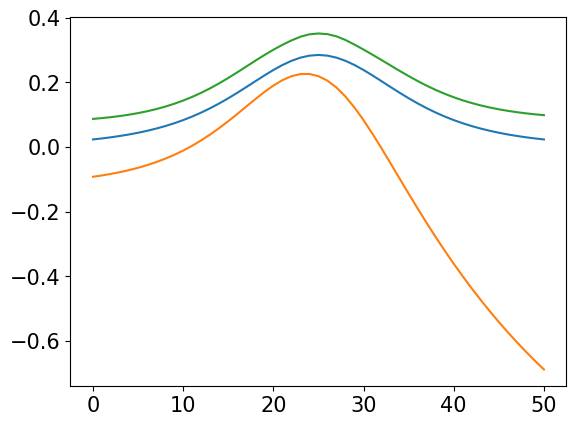

In [66]:
stage=3
params = {'params': {'Dense_0': {'bias': jnp.array([ 1.2822,  1.1528, -1.2200,  1.1325]),
       'kernel': jnp.array([[ 11.5953, -11.6090, -11.8334, -10.5519],
    [-12.3921, -10.8175, -10.9383,  11.3898]])},
      'Dense_1': {'bias': jnp.array([-2.7209,  2.6878, -2.6491,  2.6046]),
       'kernel': jnp.array([[ 1.7158, -1.7884,  3.0201,  0.2812],
    [-0.2900, -3.1346,  1.7407, -1.8116],
    [-3.0800, -0.2645, -1.6933,  1.7542],
    [ 1.7458, -1.8156, -0.3283, -3.0389]])},
      'Dense_2': {'bias': jnp.array([-10.0284]),
       'kernel': jnp.array([[-13.7486],
    [ 12.9524],
    [-13.6961],
    [ 13.3542]])}}
     }
u_t = sealed_convection_diffusion_true(d_start, center, stage)[1][100:151,100:151]
u_design_5 = sealed_convection_diffusion_nn(params_list[stage], d_start, center, stage, model)[1][100:151,100:151]
u_design_6 = sealed_convection_diffusion_nn(params, d_start, center, stage, model)[1][100:151,100:151]
diag_elements_t = np.diag(u_t)#np.diag(np.fliplr(u_t))
diag_elements_5 = np.diag(u_design_5)
diag_elements_6 = np.diag(u_design_6)
plt.plot(diag_elements_t)
plt.plot(diag_elements_5)
plt.plot(diag_elements_6)
plt.show()

diag_elements_t_T = np.diag(np.fliplr(u_t))
diag_elements_5_T = np.diag(np.fliplr(u_design_5))
diag_elements_6_T = np.diag(np.fliplr(u_design_6))
plt.plot(diag_elements_t_T)
plt.plot(diag_elements_5_T)
plt.plot(diag_elements_6_T)
plt.show()

In [16]:
u_t = sealed_convection_diffusion_true(d_start, center, stage)[1][100:151,100:151]
u_design_5 = sealed_convection_diffusion_nn(params, d_start, center, stage, model)[1][100:151,100:151]
u_design_8 = sealed_convection_diffusion_nn(params_list[stage], d_start, center, stage, model)[1][100:151,100:151]
np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_8)**2)

(97.65848, 99.092606)

In [15]:
# 自动遍历几个点
noise_loc = 0
noise_base_scale = 0.05
noise_ratio_scale = 0.05
noise_info = [(noise_loc, noise_base_scale, noise_ratio_scale),]

for stage in [3]:
    key_for_design = random.split(key[stage*2],iteration_step_number1[stage])
    key_for_param = random.split(key[stage*2+1],150)#iteration_step_number2[stage])

    prior = posterior_list[stage-1]
    params=params_list[stage-1]
    d_start = design_list[stage+1]

    if stage!=0:
        _, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
        del prior
        prior = posterior
    
    #print(f'prior = {prior}')
    num_top = 5
    indices = jnp.argpartition(prior.ravel(), -num_top)[-num_top:]
    multi_indices = jnp.unravel_index(indices, prior.shape)
    
    # 计算平均坐标
    average_x = np.mean(multi_indices[0])
    average_y = np.mean(multi_indices[1])
    
    # 直接使用平均坐标
    estimated_center = jnp.array([average_x, average_y])/50
    print(f'estimated_center is ', estimated_center)

    # 运行之前必须先运行上面
    evidence_list_special = []
    NN_error_list_special = []

    if stage!=0:
        del tx2
        del opt_state2
        
    tx2 = optax.adam(0.012)#learning_rate2[stage])
    
    opt_state2 = tx2.init(params)


    
    print(f'original design for OED is {d_start}')
    d_move_list = jnp.array([
        #[-0.1,0.0],
        [-0.05,0.0],
        [0.05,0.0],
        #[0.1,0.0],
        #[0.0,0.1],
        [0.0,0.05],
        [0.0,-0.05],
        #[0.0,-0.1],
        [0.05,0.05],
        [0.05,-0.05],
        [-0.05,-0.05],
        [-0.05,0.05],
    ])
    u_t = sealed_convection_diffusion_true(d_start, center, stage)[1][100:151,100:151]
    for j in range(8):
        d_move =  d_move_list[j]
        print(f'move design {d_move}')
        d_start = design_list[stage+1]+d_move
        params=params_list[stage-1]

        
        start_time = time.time()
        
        print(f'design for model correction is {d_start}')
        observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
        print(f'measurement is: {observation}')
    
        print('start learning params')
        for i in range(80):#iteration_step_number2[stage]):
            if stage in [0]:
                print('stage one dont learn error parameters')
                break
                
            #observation_perturbed =  observation + 0.003 * jax.random.normal(key_for_param[i], observation.shape)* (80 - i)/80
            estimated_center_perturbed = estimated_center + 0.05 * jax.random.normal(key_for_param[i], estimated_center.shape)* (80-i)/80
            max_evidence_items, grad_params = jax.value_and_grad(loss_param_refine5)(params, d_start, stage, estimated_center_perturbed, model, observation)
    
            clip_norm = 1e10
            clip_transform = optax.clip_by_global_norm(clip_norm)
            clipped_grads, _ = clip_transform.update(grad_params, state=None)
            
            updates, opt_state2 = tx2.update(clipped_grads, opt_state2, params=params)
            
            # 解决nan的问题
            updates_contain_nans = any(jnp.any(jnp.isnan(u)) for u in jax.tree_util.tree_leaves(updates))
            if updates_contain_nans:
                print(f'NaN appears in learning. Perturb params and continue.')
                noise = jax.tree_util.tree_map(lambda p: 0.01 * jax.random.normal(key_for_param[i], p.shape), params)
                params = jax.tree_util.tree_map(lambda p, n: p + n, params, noise)
            else:
                params = optax.apply_updates(params, updates)
                
            net_accuracy = evaluate_nn_accuracy(params,model,center,local_size)
            #print(f'Loss step {i} max evidence items: {max_evidence_items}, nn error {i}: {net_accuracy}')
            
            if np.isnan((max_evidence_items, net_accuracy)).any():
                print('some results are Nan')
                break
                
        end_time = time.time()
        print(f"Execution learning param time: {end_time - start_time} seconds")
        u_design_5 = sealed_convection_diffusion_nn(params, d_start, center, stage, model)[1][100:151,100:151]
        print('current error is ', np.sum((u_t - u_design_5)**2), (u_t - u_design_5)[12,12],'\n')

estimated_center is  [0.272 0.196]
original design for OED is [0.39280075 0.23191622]
move design [-0.05  0.  ]
design for model correction is [0.34280074 0.23191622]
measurement is: 0.3385695219039917
start learning params
Execution learning param time: 113.41134905815125 seconds
current error is  134.16159 0.03380105 

move design [0.05 0.  ]
design for model correction is [0.44280076 0.23191622]
measurement is: 0.22796206176280975
start learning params
Execution learning param time: 110.473562002182 seconds
current error is  61.785873 -0.051290303 

move design [0.   0.05]
design for model correction is [0.39280075 0.28191623]
measurement is: 0.3284975588321686
start learning params
Execution learning param time: 111.72306966781616 seconds
current error is  95.434555 -0.022073 

move design [ 0.   -0.05]
design for model correction is [0.39280075 0.18191622]
measurement is: 0.20139183104038239
start learning params
Execution learning param time: 118.72549033164978 seconds
current er

In [55]:
design_list[stage+1]

Array([0.3296741 , 0.23870234], dtype=float32)

In [ ]:
# 使用一些点

In [53]:
def insert_from_u(u,indexs):
    # 要求indexs是一个数组，design_number * 2 / 或者一个列表
    y_f_member = jnp.zeros((1, len(indexs)))
    for i in range(len(indexs)):
        y_f = jax.scipy.ndimage.map_coordinates(u,indexs[i],1)
        y_f_member = y_f_member.at[0,i].set(y_f)

    return y_f_member

def generate_2d_grid_xy(x_mid, y_mid, space, num=3):
    # 检查num是否为奇数，如果不是则加1使其为奇数
    if num % 2 == 0:
        raise ValueError("num必须是奇数")

    # 生成x方向的点，确保中点位于x_mid
    x = np.linspace(x_mid - space * (num // 2), x_mid + space * (num // 2), num)
    
    # 生成y方向的点，确保中点位于y_mid
    y = np.linspace(y_mid - space * (num // 2), y_mid + space * (num // 2), num)
    
    # 生成网格
    X, Y = np.meshgrid(x, y)
    
    # 将网格点坐标转换为n*2的数组
    grid_points = np.vstack([X.ravel(), Y.ravel()]).T
    
    return grid_points
    
def loss_param_refine6(current_params, indexs, stage, estimated_center, model, observation):

    _, u = sealed_convection_diffusion_nn(current_params, d_start, estimated_center, stage, model)
    y_f = insert_from_u(u,indexs)
    loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=y_f, scale=noise_base_scale+noise_ratio_scale* jnp.abs(y_f))

    return -jnp.sum(loglikelihood)


noise_loc = 0
noise_base_scale = 0.05
noise_ratio_scale = 0.05
noise_info = [(noise_loc, noise_base_scale, noise_ratio_scale),]

for stage in [3]:
    key_for_design = random.split(key[stage*2],iteration_step_number1[stage])
    key_for_param = random.split(key[stage*2+1],iteration_step_number2[stage])

    prior = posterior_list[stage-1]
    params=params_list[stage-1]
    d_start = design_list[stage+1]

    if stage!=0:
        _, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
        del prior
        prior = posterior
    
    print(f'design for model correction is {d_start}')
    observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
    print(f'measurement is: {observation}')
    #print(f'prior = {prior}')
    num_top = 5
    indices = jnp.argpartition(prior.ravel(), -num_top)[-num_top:]
    multi_indices = jnp.unravel_index(indices, prior.shape)
    
    # 计算平均坐标
    average_x = np.mean(multi_indices[0])
    average_y = np.mean(multi_indices[1])
    
    # 直接使用平均坐标
    estimated_center = jnp.array([average_x, average_y])/50
    print(f'estimated_center is ', estimated_center)


    # 运行之前必须先运行上面
    evidence_list_special = []
    NN_error_list_special = []

    if stage!=0:
        del tx2
        del opt_state2
        
    tx2 = optax.adam(0.012)#learning_rate2[stage])
    
    opt_state2 = tx2.init(params)

    start_time = time.time()

    
    d_start = design_list[stage+1]+jnp.array([0.1,-0.02])
    
    indexs = generate_2d_grid_xy(d_start[0]*50+100, d_start[1]*50+100, 1)

    print('start learning params')
    for i in range(iteration_step_number2[stage]):
        if stage in [0]:
            print('stage one dont learn error parameters')
            break
            
        observation_perturbed =  observation + 0.003 * jax.random.normal(key_for_param[i], observation.shape)
        #max_evidence_items, grad_params = jax.value_and_grad(loss_param_refine5)(params, d_start, stage, estimated_center, model, observation_perturbed)
        max_evidence_items, grad_params = jax.value_and_grad(loss_param_refine6)(params, indexs, stage, estimated_center, model, observation_perturbed)

        clip_norm = 1e10
        clip_transform = optax.clip_by_global_norm(clip_norm)
        clipped_grads, _ = clip_transform.update(grad_params, state=None)
        
        updates, opt_state2 = tx2.update(clipped_grads, opt_state2, params=params)
        
        # 解决nan的问题
        updates_contain_nans = any(jnp.any(jnp.isnan(u)) for u in jax.tree_util.tree_leaves(updates))
        if updates_contain_nans:
            print(f'NaN appears in learning. Perturb params and continue.')
            noise = jax.tree_util.tree_map(lambda p: 0.01 * jax.random.normal(key_for_param[i], p.shape), params)
            params = jax.tree_util.tree_map(lambda p, n: p + n, params, noise)
        else:
            params = optax.apply_updates(params, updates)
            
        net_accuracy = evaluate_nn_accuracy(params,model,center,local_size)
        #print(f'Loss step {i} max evidence items: {max_evidence_items}, nn error {i}: {net_accuracy}')
        
        if np.isnan((max_evidence_items, net_accuracy)).any():
            print('some results are Nan')
            break
            
        evidence_list_special.append(-max_evidence_items)
        NN_error_list_special.append(net_accuracy)
    
    
    end_time = time.time()
    print(f"Execution learning param time: {end_time - start_time} seconds")

    _, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)

design for model correction is [0.3296741  0.23870234]
measurement is: 0.3693310618400574
estimated_center is  [0.236 0.172]
start learning params
Execution learning param time: 167.61722660064697 seconds


In [47]:
round(12.121231234,5)

12.12123

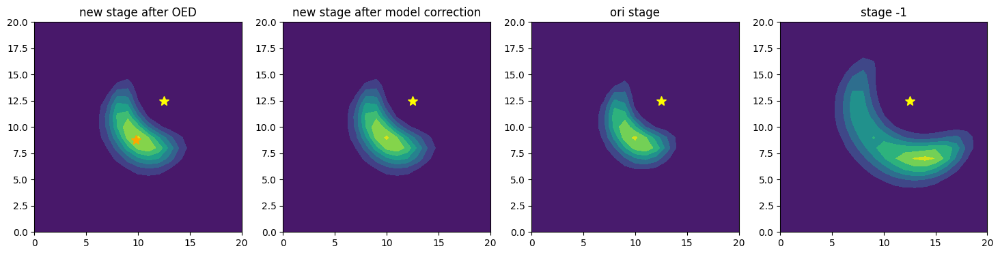

In [34]:
#_, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
fig, axes = plt.subplots(1,4,figsize=(18,4))
axes[0].contourf(prior.T)
axes[0].set_xlim([0,20])
axes[0].set_ylim([0,20])
axes[0].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)
axes[0].plot(estimated_center[0]*50,estimated_center[1]*50,color='orange',marker='*',markersize=10)
axes[0].set_title('new stage after OED')
axes[1].contourf(posterior.T)
axes[1].set_xlim([0,20])
axes[1].set_ylim([0,20])
axes[1].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)
axes[1].set_title('new stage after model correction')
axes[2].contourf(posterior_list[stage].T)
axes[2].set_xlim([0,20])
axes[2].set_ylim([0,20])
axes[2].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)
axes[2].set_title('ori stage')
axes[3].contourf(posterior_list[stage-1].T)
axes[3].set_xlim([0,20])
axes[3].set_ylim([0,20])
axes[3].set_title('stage -1')
axes[3].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)

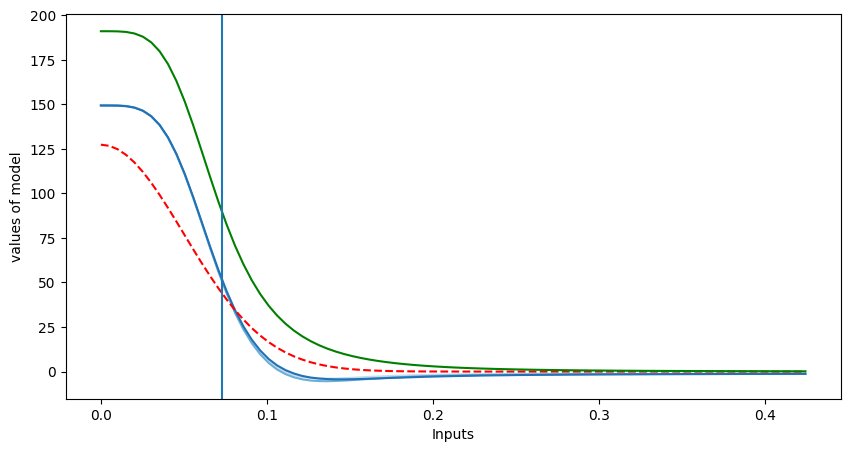

In [11]:
def show_nn_trajectory(params_list, apply_model, colormap = 'Blues', center_x=0, center_y=0, size=85):
    x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    y = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    xy_combined = jnp.concatenate((x, y), axis=1)
    
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    
    plt.figure(figsize=(10, 5))
    
    cmap = plt.colormaps[colormap].resampled(len(params_list)+2)#cm.get_cmap('Blues', len(params_list))
    for index, params in enumerate(params_list):
        #if index not in [6]:
        #    continue
        array_nn = apply_model.apply(params, xy_combined) #* 100.0
        
        plt.plot(jnp.sqrt(2) * x.squeeze(), 
                 (array_nn.squeeze() + array_reciprocal.squeeze()), 
                 label=f'NN + Reciprocal - Params {index+1}',
                 color=cmap(index+1))
    
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_exponent.squeeze(), color='r', linestyle = '--', label='Exponent')
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_reciprocal.squeeze(), color='g', label='Reciprocal')
    
    plt.ylabel('values of model')
    plt.xlabel('Inputs')
    
#show_nn_trajectory(params_list, model, center_x=0, center_y=0, size=85)
show_nn_trajectory([params_list[stage-1],params_list[stage],params], model, center_x=0, center_y=0, size=85)
distance1 = np.sqrt(np.sum((d_start - estimated_center)**2))
plt.axvline(distance1)

In [31]:
d_start, estimated_center

(Array([0.2083181, 0.3288989], dtype=float32),
 Array([0.196, 0.176], dtype=float32))

In [13]:
u_t = sealed_convection_diffusion_true(d_start, center, stage)[1][100:151,100:151]
u_design_5 = sealed_convection_diffusion_nn(params, d_start, estimated_center, stage, model)[1][100:151,100:151]
u_design_7 = sealed_convection_diffusion_nn(params_list[stage-1], d_start, estimated_center, stage, model)[1][100:151,100:151]
u_design_8 = sealed_convection_diffusion_nn(params_list[stage], d_start, estimated_center, stage, model)[1][100:151,100:151]
np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_7)**2),np.sum((u_t - u_design_8)**2)

(41.91622, 114.71689, 109.47804)

In [16]:
u_t = sealed_convection_diffusion_true(d_start, center, stage)[1][110:125,110:125]
u_design_5 = sealed_convection_diffusion_nn(params, d_start, estimated_center, stage, model)[1][110:125,110:125]
u_design_7 = sealed_convection_diffusion_nn(params_list[stage-1], d_start, estimated_center, stage, model)[1][110:125,110:125]
u_design_8 = sealed_convection_diffusion_nn(params_list[stage], d_start, estimated_center, stage, model)[1][110:125,110:125]
np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_7)**2),np.sum((u_t - u_design_8)**2)

(0.9038441, 1.574779, 1.1939421)

In [13]:
u_t = sealed_convection_diffusion_true(d_start, center, stage)[1][100:151,100:151]
u_design_5 = sealed_convection_diffusion_nn(params, d_start, center, stage, model)[1][100:151,100:151]
u_design_7 = sealed_convection_diffusion_nn(params_list[stage], d_start, center, stage, model)[1][100:151,100:151]
np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_7)**2)

(20.16698, 99.52376)

In [8]:
u_t = sealed_convection_diffusion_true(d_start, center, stage)[1][100:125,100:125]
u_design_5 = sealed_convection_diffusion_nn(params, d_start, center, stage, model)[1][100:125,100:125]
u_design_7 = sealed_convection_diffusion_nn(params_list[stage], d_start, center, stage, model)[1][100:125,100:125]
np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_7)**2)

(4.738275, 18.21538)

In [72]:
np.max((u_t-u_design_5)),np.max((u_t-u_design_7))

(0.7984278, 0.5477254)

In [73]:
np.where((u_t-u_design_7)==np.max((u_t-u_design_7)))

(array([50]), array([0]))

In [74]:
np.max((u_t-u_design_5)/u_t),np.max((u_t-u_design_7)/u_t)

(43.196358, 33.609913)

In [43]:
# 执行OED更新一步后验，对比新的后验
for stage in [6]:
    print('\n stage = ', stage, '\n')
    key_for_design = random.split(key[stage*2],iteration_step_number1[stage])
    key_for_param = random.split(key[stage*2+1],iteration_step_number2[stage])
    
    clip_count = 0
    
    if stage!=0:
        del tx1
    else:
        print(f'stage = 0, only run forward model and update posterior')
        
    #tx1 = optax.adam(lr_schedule1)
    tx1 = optax.chain(
    optax.adam(lr_schedule1),  # 使用由 lr_schedule1 调整的学习率的 Adam 优化器
    optax.add_decayed_weights(1e-4)  # 添加权重衰减，衰减系数为 1e-5
    )
    
    opt_state1 = tx1.init(d_start)
    
    d_limit_min = d_start - d_change_range
    d_limit_max = d_start + d_change_range
    
    start_time = time.time()
    d_start_backup = d_start

    print('start learning design')
    print(f'start design : ', d_start)
    for i in range(iteration_step_number1[stage]):
        negtive_KLD, grad_design = jax.value_and_grad(loss_design)(d_start, params, stage, center, prior, noise_info, num_d, radio_d, key_for_design[i], model)
        updates, opt_state1 = tx1.update(grad_design, opt_state1, params=d_start)

        
        # 解决nan的问题
        oed_nan_index = 0
        updates_contain_nans = any(jnp.any(jnp.isnan(u)) for u in jax.tree_util.tree_leaves(updates))
        if updates_contain_nans:
            oed_nan_index = oed_nan_index + 1
            print(f'NaN appears in learning. Perturb params and continue. Nan count: {oed_nan_index}')
            noise = 0.05*jax.random.normal(key_for_design[i], d_start.shape)
            d_start = d_start+ noise
        else:
            oed_nan_index = 0
            d_start = optax.apply_updates(d_start, updates)
    
        d_start_before_clip = d_start
        d_start = jnp.clip(d_start, d_limit_min, d_limit_max)
        
        # 如果clip函数生效，即有参数被裁剪，增加计数器
        clip_count = 0
        if not jnp.all(d_start == d_start_before_clip):
            clip_count += 1
        else:
            clip_count = 0
            
        if clip_count >= 5:
            print(f"Stopping iteration at step {i} as clip function has been activated 5 times.")
            break
        
        if np.isnan(d_start).any() or np.isnan(negtive_KLD).any():
            print('some results are Nan')
            break
    
        KLD_list.append(-negtive_KLD)
        
        if oed_nan_index > 6:
            print('连续出现nam并扰动6次，停止oed')
            break
            
        #if len(KLD_list) >= 5:
        #    last_five = KLD_list[-5:]
        #    if all(abs(last_five[0] - k) < 0.01*last_five[0] for k in last_five[1:]):
        #        print("连续5步的negtive_KLD几乎相同，停止循环")
        #        break  # 跳出循环
            
    end_time = time.time()
    print(f"Execution learning design time: {end_time - start_time} seconds")

    if stage!=0:
        _, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
        del prior
        prior = posterior


 stage =  6 

start learning design
start design :  [0.35514557 0.00731688]
Execution learning design time: 58.758559226989746 seconds


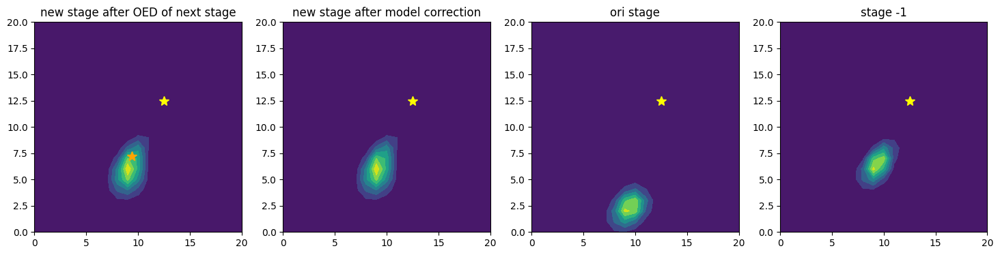

In [44]:
#_, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
fig, axes = plt.subplots(1,4,figsize=(18,4))
axes[0].contourf(prior.T)
axes[0].set_xlim([0,20])
axes[0].set_ylim([0,20])
axes[0].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)
axes[0].plot(estimated_center[0]*50,estimated_center[1]*50,color='orange',marker='*',markersize=10)
axes[0].set_title('new stage after OED of next stage')
axes[1].contourf(posterior.T)
axes[1].set_xlim([0,20])
axes[1].set_ylim([0,20])
axes[1].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)
axes[1].set_title('new stage after model correction')
axes[2].contourf(posterior_list[stage].T)
axes[2].set_xlim([0,20])
axes[2].set_ylim([0,20])
axes[2].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)
axes[2].set_title('ori stage')
axes[3].contourf(posterior_list[stage-1].T)
axes[3].set_xlim([0,20])
axes[3].set_ylim([0,20])
axes[3].set_title('stage -1')
axes[3].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)

In [54]:
u_t = sealed_convection_diffusion_true(d_start, center, stage)[1][100:125,100:125]
u_design_5 = sealed_convection_diffusion_nn(params, d_start, estimated_center, stage, model)[1][100:125,100:125]
u_design_7 = sealed_convection_diffusion_nn(params_list[stage-1], d_start, estimated_center, stage, model)[1][100:125,100:125]
np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_7)**2)

(6.5567346, 7.022069)

In [45]:
u_t = sealed_convection_diffusion_true(d_start, center, stage)[1][110:120,110:120]
u_design_5 = sealed_convection_diffusion_nn(params, d_start, estimated_center, stage, model)[1][110:120,110:120]
u_design_7 = sealed_convection_diffusion_nn(params_list[stage-1], d_start, estimated_center, stage, model)[1][110:120,110:120]
np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_7)**2)

(0.46408007, 1.2470524)

In [46]:
u_t = sealed_convection_diffusion_true(d_start, center, stage)[1][100:151,100:151]
u_design_5 = sealed_convection_diffusion_nn(params_list[stage], d_start, estimated_center, stage, model)[1][100:151,100:151]
u_design_7 = sealed_convection_diffusion_nn(params_list[stage-1], d_start, estimated_center, stage, model)[1][100:151,100:151]
np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_7)**2)

(41.80075, 67.45976)

In [ ]:
# EKI

In [7]:
import os
import pickle
import re
import gc
from flax.traverse_util import flatten_dict, unflatten_dict

def reconstruct_array_to_dict(params_grad_array, grads):
    """
    将扁平化后的数组重新构建回原始的 grads 字典。

    参数:
    - params_grad_array: 扁平化后的梯度数组
    - grads: 原始的 grads 字典，用于获取结构信息

    返回:
    - reconstructed_grads: 重建后的 grads 字典
    """
    # 获取原始 grads 的结构信息
    params_grad_flat = flatten_dict(grads)
    shapes = {k: v.shape for k, v in params_grad_flat.items()}

    # 将 params_grad_array 拆分成原始形状的数组
    index = 0
    reconstructed_params_grad_flat = {}
    for k, shape in shapes.items():
        size = size = int(np.prod(shape))  # 将形状转换为 numpy 数组，然后计算其大小
        reconstructed_params_grad_flat[k] = jnp.reshape(params_grad_array[index:index+size], shape)
        index += size

    # 将平坦化的字典恢复到原始的嵌套结构
    reconstructed_grads = unflatten_dict(reconstructed_params_grad_flat)

    return reconstructed_grads

def reconstruct_dict_to_array(grads):
    """
    将嵌套字典转换为扁平化的数组。

    参数:
    - grads: 嵌套的 grads 字典

    返回:
    - params_grad_array: 扁平化后的梯度数组
    """
    # 将字典展平
    params_grad_flat = flatten_dict(grads)
    
    # 获取所有梯度值，并将其展平
    flat_arrays = [jnp.ravel(v) for v in params_grad_flat.values()]
    
    # 将所有展平的数组拼接成一个单独的数组
    params_grad_array = jnp.concatenate(flat_arrays)
    
    return params_grad_array
    
def kl_divergence(mu1, sigma1, mu2, sigma2):
    # 计算逆矩阵和行列式
    sigma2_inv = jnp.linalg.inv(sigma2)
    #sigma1_det = jnp.linalg.det(sigma1)
    #sigma2_det = jnp.linalg.det(sigma2)
    
    # 计算各项
    term1 = jnp.trace(sigma2_inv @ sigma1)
    term2 = (mu2 - mu1).T @ sigma2_inv @ (mu2 - mu1)
    
    _, logdet_sigma1 = jnp.linalg.slogdet(sigma1)
    _, logdet_sigma2 = jnp.linalg.slogdet(sigma2)
    term3 = logdet_sigma2 - logdet_sigma1
    #term3 = jnp.log(sigma2_det / sigma1_det)
    
    # 计算最终的KL散度
    kl_div = 0.5 * (term1 + term2 - len(mu1) + term3)
    
    return kl_div
    
def EnKF_process_correct(d_start, observation, ensemble_member, estimated_center, stage, model, key2, num_top=5):
    # 进行一次EnKF更新
    # 这个代码是不能够并行的

    # 生成初始状态的场
    # 直接在外面生成一个导入
    # 从这个场，用ensemble menber更新到现在

    # 输入ensemble_member是数组
    # 输出theta_samples_updated是数组
    # noise_info, lo_b, up_b, size, num_top 是全局变量
    
    ensemble_size_local = ensemble_member.shape[0]
    noise_loc, noise_base_scale, noise_ratio_scale = noise_info[0]
    xb_lo = int((0.0 - lo_b) / (up_b - lo_b) * (size - 1))
    xb_up = int((1.0 - lo_b) / (up_b - lo_b) * (size - 1))


    y_fs = jnp.zeros((ensemble_size_local,1))
    
    for i in range(ensemble_size_local):
        ensemble_member_dict = reconstruct_array_to_dict(ensemble_member[i],params)
        y_f, _  = sealed_convection_diffusion_nn(ensemble_member_dict, d_start, estimated_center, stage, model)
        y_fs = y_fs.at[i,0].set(y_f)
        print('.',end='')
    
    y_f_mean = jnp.mean(y_fs)
    P_yy = 1/(ensemble_size_local-1)*jnp.sum((y_fs-y_f_mean)**2)+1.0#noise_base_scale

    #x_f_theta = ensemble_member.reshape(ensemble_size_local,-1) # 这一步是对于1维情况准备的，高维情况不用reshape
    x_f_theta = ensemble_member
    x_f_mean = jnp.mean(x_f_theta, axis=0).reshape(1,-1)

    x_f_deviation = x_f_theta - x_f_mean
    y_f_deviation = y_fs - y_f_mean.reshape(1,1)
    P_xy = jnp.matmul(x_f_deviation.T, y_f_deviation) / (ensemble_size_local - 1) 

    K = P_xy * 1.0/P_yy
    x_a = x_f_theta + jnp.matmul(K, (observation - y_fs).T).T
    #x_a = x_f_theta + jnp.matmul(K, (observation + jax.random.normal(key2, shape=observation.shape)*noise_base_scale - y_fs).T).T
    
    return x_a

    

# 现在需要一个函数，对于一个给定的场，给出一些index，取出/插值这些index上的点
def insert_from_u(u,indexs):
    # 要求indexs是一个数组，design_number * 2 / 或者一个列表
    y_f_member = jnp.zeros((1, len(indexs)))
    for i in range(len(indexs)):
        y_f = jax.scipy.ndimage.map_coordinates(u,indexs[i],1)
        y_f_member = y_f_member.at[0,i].set(y_f)

    return y_f_member

#indexs=np.array([[111,111],
#                [112,113]])
#insert_from_u(output_all, indexs)

#import numpy as np

def generate_2d_grid(lower_limit, upper_limit, num_points):
    # 在两个方向上生成指定数量的点
    x = np.linspace(lower_limit, upper_limit, num_points)
    y = np.linspace(lower_limit, upper_limit, num_points)
    
    # 生成网格
    X, Y = np.meshgrid(x, y)
    
    # 将网格点坐标转换为n*2的数组
    grid_points = np.vstack([X.ravel(), Y.ravel()]).T
    
    return grid_points

#def generate_2d_grid_xy(x_mid, y_mid, space, num=3):
#    # 在两个方向上生成指定数量的点
#    x = np.array([x_mid-space, x_mid, x_mid+space])
#    y = np.array([y_mid-space, y_mid, y_mid+space])
#    
#    # 生成网格
#    X, Y = np.meshgrid(x, y)
#    
#    # 将网格点坐标转换为n*2的数组
#    grid_points = np.vstack([X.ravel(), Y.ravel()]).T
#    
#    return grid_points

## 示例使用
#lower = 110
#upper = 130
#num = 5
#grid = generate_2d_grid(lower, upper, num)
#print(grid)

def generate_2d_grid_xy(x_mid, y_mid, space, num=3):
    # 检查num是否为奇数，如果不是则加1使其为奇数
    if num % 2 == 0:
        raise ValueError("num必须是奇数")

    # 生成x方向的点，确保中点位于x_mid
    x = np.linspace(x_mid - space * (num // 2), x_mid + space * (num // 2), num)
    
    # 生成y方向的点，确保中点位于y_mid
    y = np.linspace(y_mid - space * (num // 2), y_mid + space * (num // 2), num)
    
    # 生成网格
    X, Y = np.meshgrid(x, y)
    
    # 将网格点坐标转换为n*2的数组
    grid_points = np.vstack([X.ravel(), Y.ravel()]).T
    
    return grid_points
    
def EnKF_process_multidata(indexs, observation, ensemble_member, estimated_center, stage, model, key2, step_index, num_top=5):
    
    ensemble_size_local = ensemble_member.shape[0]
    noise_loc, noise_base_scale, noise_ratio_scale = noise_info[0]

    observe_size = len(indexs)
    y_fs = jnp.zeros((ensemble_size_local,observe_size))
    
    for i in range(ensemble_size_local):
        ensemble_member_dict = reconstruct_array_to_dict(ensemble_member[i],params)
        _, u  = sealed_convection_diffusion_nn(ensemble_member_dict, d_start, estimated_center, stage, model) # u的尺寸是251*251
        y_f_member = insert_from_u(u,indexs)
        y_fs = y_fs.at[i,:].set(y_f_member.squeeze())
        print('.',end='')
    
    y_f_mean = np.mean(y_fs, axis=0).reshape(1,-1)
    
    noise_covariance_matrix = np.eye(observe_size) * noise_base_scale
    P_yy = 1/(ensemble_size_local - 1) * np.matmul((y_fs - y_f_mean).T, (y_fs - y_f_mean)) + noise_covariance_matrix

    #x_f_theta = ensemble_member.reshape(ensemble_size_local,-1) # 这一步是对于1维情况准备的，高维情况不用reshape
    x_f_theta = ensemble_member
    x_f_mean = jnp.mean(x_f_theta, axis=0).reshape(1,-1)

    x_f_deviation = x_f_theta - x_f_mean
    y_f_deviation = y_fs - y_f_mean
    P_xy = jnp.matmul(x_f_deviation.T, y_f_deviation) / (ensemble_size_local - 1) 

    K = np.matmul(P_xy, np.linalg.inv(P_yy))

    #residual = observation - y_fs
    #mean_vals = np.mean(residual, axis=0)  # 计算每列的均值
    #std_vals = np.std(residual, axis=0)    # 计算每列的标准差
    #
    ## 防止除零错误，标准差为0时将其设为1
    #std_vals = np.where(std_vals == 0, 1, std_vals)
    #
    ## 归一化公式
    #standardized_residual = residual  / std_vals
    #
    #x_a = x_f_theta + jnp.matmul(K, standardized_residual.T).T
    x_a = x_f_theta + jnp.matmul(K, (observation - y_fs).T).T

    #if step_index % 2 == 0:
    #    x_a_mean = np.mean(x_a, axis=0)
    #    inflation_factor = 1.01 # 或其他合适的值
    #    x_a = x_a_mean + inflation_factor * (x_a - x_a_mean) # 膨胀因子
    
    return x_a

def EnKF_process_singledata(d_start, observation, ensemble_member, estimated_center, stage, model, key2, num_top=5):
    
    ensemble_size_local = ensemble_member.shape[0]
    noise_loc, noise_base_scale, noise_ratio_scale = noise_info[0]

    observe_size = 1
    y_fs = jnp.zeros((ensemble_size_local,observe_size))
    
    for i in range(ensemble_size_local):
        ensemble_member_dict = reconstruct_array_to_dict(ensemble_member[i],params)
        y_f_member, _  = sealed_convection_diffusion_nn(ensemble_member_dict, d_start, estimated_center, stage, model) # u的尺寸是251*251
        y_fs = y_fs.at[i].set(y_f_member.squeeze())
        print('.',end='')
    
    y_f_mean = np.mean(y_fs, axis=0).reshape(1,-1)
    
    noise_covariance_matrix = np.eye(observe_size) * noise_base_scale
    P_yy = 1/(ensemble_size_local - 1) * np.matmul((y_fs - y_f_mean).T, (y_fs - y_f_mean)) + noise_covariance_matrix

    #x_f_theta = ensemble_member.reshape(ensemble_size_local,-1) # 这一步是对于1维情况准备的，高维情况不用reshape
    x_f_theta = ensemble_member
    x_f_mean = jnp.mean(x_f_theta, axis=0).reshape(1,-1)

    x_f_deviation = x_f_theta - x_f_mean
    y_f_deviation = y_fs - y_f_mean
    P_xy = jnp.matmul(x_f_deviation.T, y_f_deviation) / (ensemble_size_local - 1) 

    K = np.matmul(P_xy, np.linalg.inv(P_yy))
    x_a = x_f_theta + jnp.matmul(K, (observation - y_fs).T).T
    
    #x_a_mean = np.mean(x_a, axis=0)
    #inflation_factor = 1.01 # 或其他合适的值
    #x_a = x_a_mean + inflation_factor * (x_a - x_a_mean) # 膨胀因子
    
    return x_a

In [31]:
indexs = generate_2d_grid(112, 114, 3)

mean_array = reconstruct_dict_to_array(params)
ensemble_members_array = jax.vmap(generate_sample, in_axes=(0, None, None))(keys_ensemble, mean_array, 0.3)
ensemble_size_local = ensemble_members_array.shape[0]
noise_loc, noise_base_scale, noise_ratio_scale = noise_info[0]
observe_size = len(indexs)
y_fs = jnp.zeros((ensemble_size_local,observe_size))

for i in range(ensemble_size_local):
    ensemble_member_dict = reconstruct_array_to_dict(ensemble_members_array[i],params)
    _, u  = sealed_convection_diffusion_nn(ensemble_member_dict, d_start, estimated_center, stage, model2) # u的尺寸是251*251
    y_f_member = insert_from_u(u,indexs)
    y_fs = y_fs.at[i,:].set(y_f_member.squeeze())
    print('.',end='')

y_f_mean = np.mean(y_fs, axis=0).reshape(1,-1)

noise_covariance_matrix = np.eye(observe_size) * noise_base_scale
P_yy = 1/(ensemble_size_local - 1) * np.matmul((y_fs - y_f_mean).T, (y_fs - y_f_mean)) + noise_covariance_matrix

_, ut  = sealed_convection_diffusion_true(d_start, center, stage) # u的尺寸是251*251
observations = insert_from_u(ut,indexs)

x_f_theta = ensemble_members_array
x_f_mean = jnp.mean(x_f_theta, axis=0).reshape(1,-1)
x_f_deviation = x_f_theta - x_f_mean
y_f_deviation = y_fs - y_f_mean
P_xy = jnp.matmul(x_f_deviation.T, y_f_deviation) / (ensemble_size_local - 1) 
K = np.matmul(P_xy, np.linalg.inv(P_yy))
x_a = x_f_theta + jnp.matmul(K, (observation - y_fs).T).T

........................................................................................................................................................................................................

In [32]:
noise_covariance_matrix = np.eye(observe_size) * 0.005
1/(ensemble_size_local - 1) * np.matmul((y_fs - y_f_mean).T, (y_fs - y_f_mean))+noise_covariance_matrix

array([[0.08165391, 0.07864896, 0.08044714, 0.07548855, 0.07755321,
        0.07942509, 0.07405077, 0.07619586, 0.07816319],
       [0.07864896, 0.0858299 , 0.08281276, 0.07744899, 0.07969819,
        0.08175255, 0.07596668, 0.07829359, 0.0804405 ],
       [0.08044714, 0.08281276, 0.08998357, 0.0792132 , 0.08164512,
        0.08388437, 0.0776903 , 0.08019661, 0.08252431],
       [0.07548855, 0.07744899, 0.0792132 , 0.07945768, 0.07649112,
        0.07833023, 0.07314974, 0.07526715, 0.07720296],
       [0.07755321, 0.07969819, 0.08164512, 0.07649112, 0.083709  ,
        0.08072985, 0.07514136, 0.07744177, 0.07955759],
       [0.07942509, 0.08175255, 0.08388437, 0.07833023, 0.08072985,
        0.08793366, 0.07694044, 0.07942039, 0.0817164 ],
       [0.07405077, 0.07596668, 0.0776903 , 0.07314974, 0.07514136,
        0.07694044, 0.07697357, 0.07405189, 0.07594782],
       [0.07619586, 0.07829359, 0.08019661, 0.07526715, 0.07744177,
        0.07942039, 0.07405189, 0.08131321, 0.07838838],


In [9]:
def generate_sample(key, mean, std_dev):
    return mean + std_dev * jax.random.normal(key, shape=mean.shape)
    
def natural_key(filename):
    return [int(part) if part.isdigit() else part for part in re.split(r'(\d+)', filename)]

# 保存检查点的函数
def save_checkpoint(i, j, params_trajectory, ensemble_members_array):
    checkpoint = {
        'i': i,
        'j': j,
        'params_trajectory': params_trajectory,
        'ensemble_members_array': ensemble_members_array
    }
    checkpoint_path = os.path.join(checkpoint_dir, f'checkpoint_i_{i}_j_{j}.pkl')
    with open(checkpoint_path, 'wb') as f:
        pickle.dump(checkpoint, f)
    print(f"Checkpoint saved at i={i}, j={j}")

# 加载最近的检查点
def load_checkpoint(j):
    checkpoint_files = sorted([f for f in os.listdir(checkpoint_dir) if f.endswith(f'_j_{j}.pkl')], key=natural_key)
    if checkpoint_files:
        latest_checkpoint = checkpoint_files[-1]
        checkpoint_path = os.path.join(checkpoint_dir, latest_checkpoint)
        with open(checkpoint_path, 'rb') as f:
            checkpoint = pickle.load(f)
        print(f"Checkpoint loaded from {latest_checkpoint}")
        return checkpoint
    return None

def EnKF_process_multidata(indexs, observation, ensemble_member, estimated_center, stage, model, key2, step_index, num_top=5):
    
    ensemble_size_local = ensemble_member.shape[0]
    noise_loc, noise_base_scale, noise_ratio_scale = noise_info[0]

    observe_size = len(indexs)
    y_fs = jnp.zeros((ensemble_size_local,observe_size))
    
    for i in range(ensemble_size_local):
        ensemble_member_dict = reconstruct_array_to_dict(ensemble_member[i],params)
        _, u  = sealed_convection_diffusion_nn(ensemble_member_dict, d_start, estimated_center, stage, model) # u的尺寸是251*251
        y_f_member = insert_from_u(u,indexs)
        y_fs = y_fs.at[i,:].set(y_f_member.squeeze())
        print('.',end='')
    
    y_f_mean = np.mean(y_fs, axis=0).reshape(1,-1)
    
    noise_covariance_matrix = np.eye(observe_size) * noise_base_scale
    P_yy = 1/(ensemble_size_local - 1) * np.matmul((y_fs - y_f_mean).T, (y_fs - y_f_mean)) + noise_covariance_matrix

    #x_f_theta = ensemble_member.reshape(ensemble_size_local,-1) # 这一步是对于1维情况准备的，高维情况不用reshape
    x_f_theta = ensemble_member
    x_f_mean = jnp.mean(x_f_theta, axis=0).reshape(1,-1)

    x_f_deviation = x_f_theta - x_f_mean
    y_f_deviation = y_fs - y_f_mean
    P_xy = jnp.matmul(x_f_deviation.T, y_f_deviation) / (ensemble_size_local - 1) 

    K = np.matmul(P_xy, np.linalg.inv(P_yy))

    x_a = x_f_theta + jnp.matmul(K, (observation - y_fs).T).T

    #x_a_mean = np.mean(x_a, axis=0)
    #inflation_factor = 1.001 # 或其他合适的值
    #x_a = x_a_mean + inflation_factor * (x_a - x_a_mean) # 膨胀因子
    
    return x_a


with open('all_data_nn_case_data_6_test9.pkl', 'rb') as f:
    loaded_data = pickle.load(f)

posterior_list = loaded_data["posterior_list"]
design_list = loaded_data["design_list"]
params_list = loaded_data["params_list"]
estimated_posterior_point = loaded_data["estimated_posterior_point"]


stage = 2
grid_size=50
ensemble_size = 300  # 生成的数组数量
ensemble_step = 10


std_dev = 0.3  #0.05  #0.1  # 标准差

key_ensemble = jax.random.PRNGKey(0)  # 随机数种子
keys_ensemble = jax.random.split(key_ensemble, ensemble_size)
key2 = jax.random.PRNGKey(2)  # 随机数种子

class localFullyConnectedNN2(nn.Module):
    @nn.compact
    def __call__(self, x):
        x = nn.Dense(features=4)(x)  # 输入层到隐藏层1，8个节点
        x = nn.tanh(x)  # 激活函数
        x = nn.Dense(features=4)(x)  # 隐藏层1到隐藏层2，4个节点
        x = nn.tanh(x)  # 激活函数
        x = nn.Dense(features=1)(x)  # 隐藏层2到输出层，1个节点
        return x
        
model2 = localFullyConnectedNN2()  # 创建模型实例



estimated_center = estimated_posterior_point[stage]
print(f'estimated center is {estimated_center}')

#ensemble_optimizer = optax.adam(0.2)



noise_loc = 0
noise_base_scale = 0.005
noise_ratio_scale = 0.05
noise_info = [(noise_loc, noise_base_scale, noise_ratio_scale),]




checkpoint_dir = './checkpoints/nn_case_data_6_EnFK_stage2_test21'
os.makedirs(checkpoint_dir, exist_ok=True)

d_start1 = design_list[stage+1]
d_start2 = design_list[stage+1]+jnp.array([0.05,-0.05])
d_start3 = design_list[stage+1]+jnp.array([-0.1,0.0])
d_start4 = jnp.array([0.2,0.2])
d_start5 = jnp.array([0.17,0.17])
d_start6 = jnp.array([0.35,0.15])
d_start8 = jnp.array([0.23,0.28])
d_start9 = jnp.array([0.17,0.12])

#key_for_ensemble = jax.random.split(key2,ensemble_step)

# 主循环
for j in [0,1]:#range(1):

    params = params_list[stage-1]

    
    mean_array = reconstruct_dict_to_array(params)

    ensemble_length=len(mean_array)

    # 初始化设计 d_start 根据 j 的值变化
    if j == 0:
        d_start = d_start1
    elif j == 1:
        d_start = d_start2
    elif j == 2:
        d_start = d_start3
    elif j == 3:
        d_start = d_start4
    elif j == 4:
        d_start = d_start5
    elif j == 5:
        d_start = d_start6
    elif j == 7:
        d_start = d_start8
    elif j == 8:
        d_start = d_start9
    

    
    #indexs = generate_2d_grid(110, 130, 10)
    #indexs = generate_2d_grid(105, 125, 21)

    if j != 6:
        indexs = generate_2d_grid_xy(d_start[0]*50+100, d_start[1]*50+100, 1)
    else:
        indexs = np.array([#        indexs = np.array([
            [0.25,0.283],#                    [0.23,0.283],
            [0.26,0.273],#                    [0.24,0.26],
            [0.27,0.26],#                    [0.25,0.25],
            [0.28,0.26],#                    [0.26,0.24],
            [0.29,0.25],#                    [0.27,0.24],
            [0.30,0.245],#                    [0.28,0.233],
            [0.24,0.30],#                    [0.29,0.22],
            [0.23,0.32],#                    [0.22,0.29],
            [0.31,0.24]#                    [0.21,0.32]
        ])*50+100#                ])*50+100
        
    # 生辰观测数据
    _, ut  = sealed_convection_diffusion_true(d_start, center, stage) # u的尺寸是251*251
    observations = insert_from_u(ut,indexs)
    _, u0  = sealed_convection_diffusion_true(d_start, estimated_center, stage) # u的尺寸是251*251
    y0 = insert_from_u(u0,indexs)
     
        
    # 每次 j 切换时重新加载或初始化参数
    checkpoint = load_checkpoint(j)
    
    if checkpoint is not None:
        start_step = checkpoint['i']
        params_trajectory = checkpoint['params_trajectory']
        ensemble_members_array = checkpoint['ensemble_members_array']
        print(f'continue from design {j}, step {i}')
    else:
        start_step = 0
        # 初始化参数，在每次 j 切换时都要重新初始化
        ensemble_members_array = jax.vmap(generate_sample, in_axes=(0, None, None))(keys_ensemble, mean_array, std_dev)
        params_trajectory = np.zeros((ensemble_step + 1, ensemble_size, ensemble_length))
        params_trajectory[0] = ensemble_members_array
        print(f'start from design {j}. step initial')



    for i in range(start_step, ensemble_step):
        key2 = jax.random.split(key2,1)[0]
        
        #observation_perturbed =  observations + 0.001 * jax.random.normal(key_for_ensemble[i], observations.shape)
        #ensemble_members_array = EnKF_process_multidata(indexs, observation_perturbed, ensemble_members_array, estimated_center, stage, model2, key2, i, num_top=5)
        
        ensemble_members_array = EnKF_process_multidata(indexs, observations, ensemble_members_array, estimated_center, stage, model2, key2, i, num_top=5)
        params_trajectory[i + 1] = ensemble_members_array
        print('|', end='')

        # 每10步保存一次检查点
        if (i + 1) % 5 == 0:
            save_checkpoint(i + 1, j, params_trajectory, ensemble_members_array)
    
    # 保存最终结果
    save_checkpoint(ensemble_step, j, params_trajectory, ensemble_members_array)
    print('-', end='')

    if j == 0:
        params_trajectory_good_design = params_trajectory
    elif j == 1:
        params_trajectory_bad_design = params_trajectory

print('saved in ', checkpoint_dir)

estimated center is [0.236      0.24800001]
start from design 0. step initial
............................................................................................................................................................................................................................................................................................................|............................................................................................................................................................................................................................................................................................................|............................................................................................................................................................................................................................................................................................................|...................

Checkpoint data loaded successfully.
Checkpoint data loaded successfully.
13.758534 82.472786


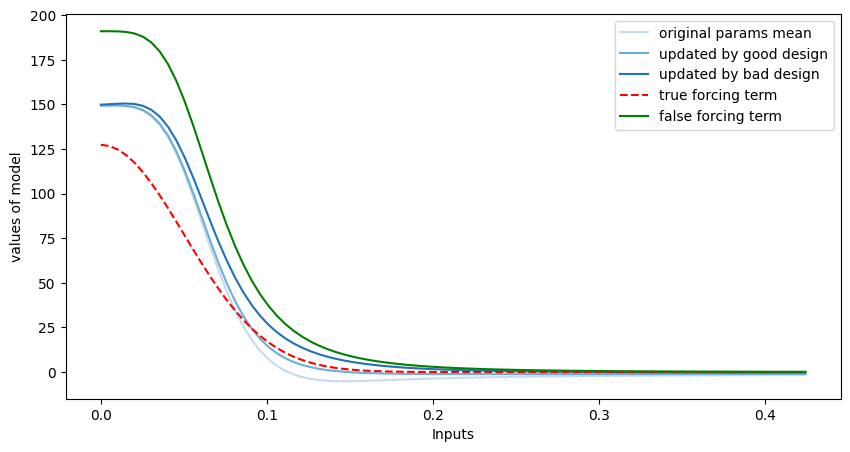

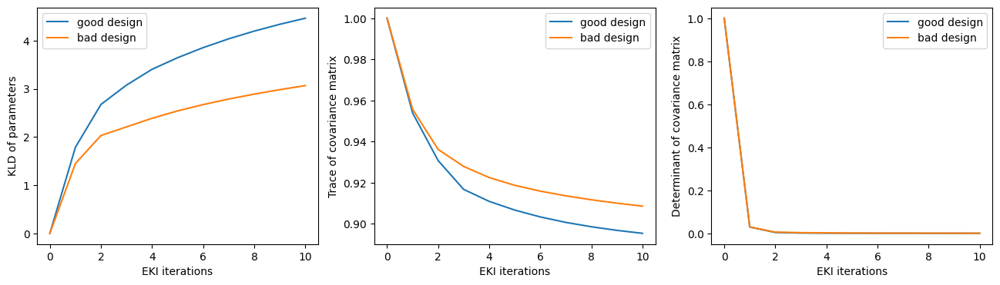

In [8]:
stage = 2
ensemble_step = 10
ensemble_size = 300

checkpoint_file_path = './checkpoints/nn_case_data_6_EnFK_stage2_test21/checkpoint_i_10_j_0.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

result_matrix_design_7 = checkpoint_data['params_trajectory'] # bad



checkpoint_file_path = './checkpoints/nn_case_data_6_EnFK_stage2_test21/checkpoint_i_10_j_1.pkl' 

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

result_matrix_design_5 = checkpoint_data['params_trajectory'] # good



params0 = reconstruct_array_to_dict(np.mean(result_matrix_design_5[0], axis=0),params)
params5 = reconstruct_array_to_dict(np.mean(result_matrix_design_5[-1], axis=0),params)
params7 = reconstruct_array_to_dict(np.mean(result_matrix_design_7[-1], axis=0),params)
show_nn_trajectory([params0,params5, params7], model, 'Blues', center_x=0, center_y=0, size=85)
plt.legend()

leg = plt.gca().get_legend()

new_labels = ['original params mean', 'updated by good design', 'updated by bad design', 'true forcing term', 'false forcing term']

for text, new_label in zip(leg.get_texts(), new_labels):
    text.set_text(new_label)

plt.draw()


u_t = sealed_convection_diffusion_true(d_start, center, stage)[1][100:151,100:151]
u_design_5 = sealed_convection_diffusion_nn(params5, d_start, center, stage, model)[1][100:151,100:151]
u_design_7 = sealed_convection_diffusion_nn(params7, d_start, center, stage, model)[1][100:151,100:151]
print(np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_7)**2))


mean_ori = np.mean(result_matrix_design_5[0],axis=0)
mean_ori_centered = result_matrix_design_5[0] - mean_ori
var_ori = np.cov(mean_ori_centered, rowvar=False)
kld_trajectory5 = np.zeros(ensemble_step+1)
kld_trajectory5[0] = kl_divergence(mean_ori, var_ori, mean_ori, var_ori)
kld_compare_to_before5 = np.zeros(ensemble_step)
mean_current_back = mean_ori
var_current_back = var_ori
covar_trace_5 = np.zeros(ensemble_step+1)
covar_trace_5[0] = np.trace(var_ori)
covar_det_5 = np.zeros(ensemble_step+1)
covar_det_5[0] = np.linalg.det(var_ori)

for i in range(1,ensemble_step+1):
    mean_current = np.mean(result_matrix_design_5[i],axis=0)
    mean_current_centered = result_matrix_design_5[i] - mean_current
    var_current = np.cov(mean_current_centered, rowvar=False)
    kld_trajectory5[i]=kl_divergence(mean_current, var_current, mean_ori, var_ori)
    kld_compare_to_before5[i-1]=kl_divergence(mean_current, var_current, mean_current_back, var_current_back)
    covar_trace_5[i] = np.trace(var_current)
    covar_det_5[i] = np.linalg.det(var_current)
    mean_current_back = mean_current
    var_current_back = var_current 


mean_ori = np.mean(result_matrix_design_7[0],axis=0)
mean_ori_centered = result_matrix_design_7[0] - mean_ori
var_ori = np.cov(mean_ori_centered, rowvar=False)
kld_trajectory7 = np.zeros(ensemble_step+1)
kld_trajectory7[0] = kl_divergence(mean_ori, var_ori, mean_ori, var_ori)
kld_compare_to_before7 = np.zeros(ensemble_step)
mean_current_back = mean_ori
var_current_back = var_ori
covar_trace_7 = np.zeros(ensemble_step+1)
covar_trace_7[0] = np.trace(var_ori)
covar_det_7 = np.zeros(ensemble_step+1)
covar_det_7[0] = np.linalg.det(var_ori)

for i in range(1,ensemble_step+1):
    mean_current = np.mean(result_matrix_design_7[i],axis=0)
    mean_current_centered = result_matrix_design_7[i] - mean_current
    var_current = np.cov(mean_current_centered, rowvar=False)
    kld_trajectory7[i]=kl_divergence(mean_current, var_current, mean_ori, var_ori)
    kld_compare_to_before7[i-1]=kl_divergence(mean_current, var_current, mean_current_back, var_current_back)
    covar_trace_7[i] = np.trace(var_current)
    covar_det_7[i] = np.linalg.det(var_current)
    mean_current_back = mean_current
    var_current_back = var_current 


fig, axes = plt.subplots(1,3,figsize=(16,4))

axes[0].plot(kld_trajectory5, label = 'good design')
axes[0].plot(kld_trajectory7, label = 'bad design')
axes[0].set_xlabel('EKI iterations')
axes[0].set_ylabel('KLD of parameters')
axes[0].legend()


axes[1].plot(covar_trace_5/covar_trace_5[0], label = 'good design')
axes[1].plot(covar_trace_7/covar_trace_7[0], label = 'bad design')
axes[1].set_xlabel('EKI iterations')
axes[1].set_ylabel('Trace of covariance matrix')
axes[1].legend()


axes[2].plot(covar_det_5/covar_det_5[0], label = 'good design')
axes[2].plot(covar_det_7/covar_det_7[0], label = 'bad design')
axes[2].set_xlabel('EKI iterations')
axes[2].set_ylabel('Determinant of covariance matrix')
axes[2].legend()

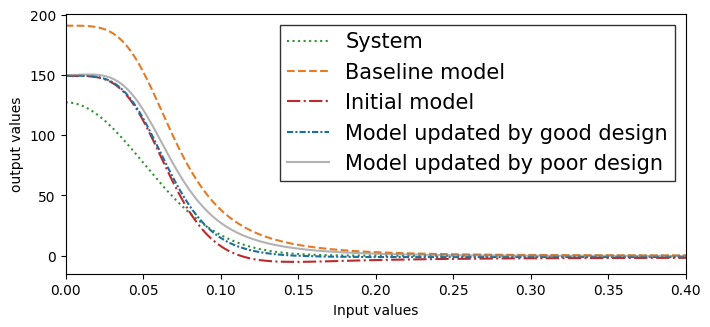

In [9]:
x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
y = jnp.linspace(0, 0.3, size).reshape(-1, 1)  # Reshape y to match dimensions
xy_combined = jnp.concatenate((x, y), axis=1)  # Properly form (x, y) pairs
array_nn = model.apply(params0, xy_combined)
array_nn_5 = model.apply(params5, xy_combined)
array_nn_7 = model.apply(params7, xy_combined)

exponent_internal = ((x - 0.0) ** 2 + (y - 0.0) ** 2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
plt.figure(figsize=(8, 0.45*7.5))
# Directly use jnp arrays in plotting


plt.plot(jnp.sqrt(2) * x.squeeze(), 
         array_exponent.squeeze(), color = np.array([53,144,58])/255, label='System',linestyle=':')
plt.plot(jnp.sqrt(2) * x.squeeze(), 
         array_reciprocal.squeeze(), color = np.array([228,123,38])/255,label='Baseline model',linestyle='--')
plt.plot(jnp.sqrt(2) * x.squeeze(), 
         (array_nn.squeeze() + array_reciprocal.squeeze()), 
         label='Initial model',color = np.array([190,42,44])/255, linestyle='-.')

plt.plot(jnp.sqrt(2) * x.squeeze(), 
         (array_nn_5.squeeze() + array_reciprocal.squeeze()), 
         label='Model updated by good design',color = np.array([32,110,158])/255, linestyle=(0, (3, 1, 1, 1)))

plt.plot(jnp.sqrt(2) * x.squeeze(), 
         (array_nn_7.squeeze() + array_reciprocal.squeeze()), 
         label='Model updated by poor design',color = 'grey', linestyle='-',alpha=0.6)


plt.xlabel('input')
plt.ylabel('output values')# of source/network')
plt.xlabel('Input values')# of source/network')

plt.xlim([0,0.4])
#plt.legend()
#intersection_x = 0.07
#plt.axvline(x=intersection_x, color='black', linestyle='--')
#plt.axvspan(0, intersection_x, color='lightgrey', alpha=0.5)

font_size = 15
plt.rcParams.update({'font.size': font_size})

legend = plt.legend(borderpad=0.05,loc='upper right', bbox_to_anchor=(0.99, 0.975),fontsize=font_size)

legend.get_frame().set_edgecolor('black')  # 设置边框颜色为黑色
legend.get_frame().set_linewidth(1)  # 设置边框线宽为1
legend.get_frame().set_boxstyle("Square")

#plt.savefig('combined network shape.png', dpi=600, bbox_inches='tight')
plt.show()
#
#
#
#show_nn_trajectory([params0,params5, params7], model2, 'Blues', center_x=0, center_y=0, size=85)
#plt.legend()
#
#leg = plt.gca().get_legend()
#
#new_labels = ['original params mean', 'updated by good design', 'updated by bad design', 'true forcing term', 'false forcing term']
#
#for text, new_label in zip(leg.get_texts(), new_labels):
#    text.set_text(new_label)
#
#plt.draw()

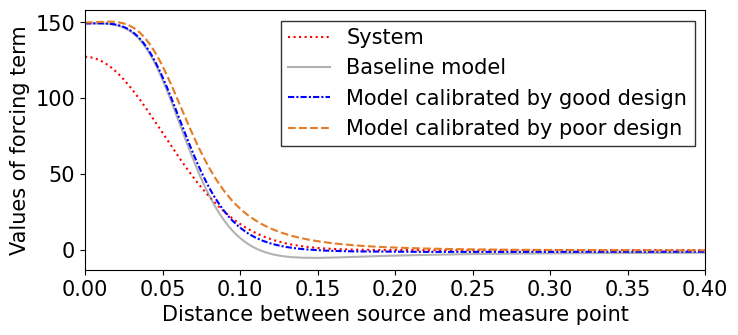

In [11]:
x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
y = jnp.linspace(0, 0.3, size).reshape(-1, 1)  # Reshape y to match dimensions
xy_combined = jnp.concatenate((x, y), axis=1)  # Properly form (x, y) pairs
array_nn = model.apply(params0, xy_combined)
array_nn_5 = model.apply(params5, xy_combined)
array_nn_7 = model.apply(params7, xy_combined)

exponent_internal = ((x - 0.0) ** 2 + (y - 0.0) ** 2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
plt.figure(figsize=(8, 0.45*7.5))
# Directly use jnp arrays in plotting


plt.plot(jnp.sqrt(2) * x.squeeze(), 
         array_exponent.squeeze(), color = 'r', label='System',linestyle=':')#,alpha=0.6)
plt.plot(jnp.sqrt(2) * x.squeeze(), 
         (array_nn.squeeze() + array_reciprocal.squeeze()), 
         color = 'grey',label='Baseline model',linestyle='-',alpha=0.6)

plt.plot(jnp.sqrt(2) * x.squeeze(), 
         (array_nn_5.squeeze() + array_reciprocal.squeeze()), 
         label='Model calibrated by good design',color = 'b', linestyle=(0, (3, 1, 1, 1)))

plt.plot(jnp.sqrt(2) * x.squeeze(), 
         (array_nn_7.squeeze() + array_reciprocal.squeeze()), 
         label='Model calibrated by poor design',color = np.array([228,123,38])/255, linestyle='--')


plt.xlabel('Distance between source and measure point')
plt.ylabel('Values of forcing term')# of source/network')

plt.xlim([0,0.4])
#plt.yscale('log')
#plt.yscale('symlog', linthresh=1)

#plt.legend()
#intersection_x = 0.07
#plt.axvline(x=intersection_x, color='black', linestyle='--')
#plt.axvspan(0, intersection_x, color='lightgrey', alpha=0.5)

font_size = 15
plt.rcParams.update({'font.size': font_size})

legend = plt.legend(borderpad=0.05,loc='upper right', bbox_to_anchor=(0.99, 0.975),fontsize=font_size)

legend.get_frame().set_edgecolor('black')  # 设置边框颜色为黑色
legend.get_frame().set_linewidth(1)  # 设置边框线宽为1
legend.get_frame().set_boxstyle("Square")

#plt.savefig('combined network shape.png', dpi=600, bbox_inches='tight')
plt.show()
#
#
#
#show_nn_trajectory([params0,params5, params7], model2, 'Blues', center_x=0, center_y=0, size=85)
#plt.legend()
#
#leg = plt.gca().get_legend()
#
#new_labels = ['original params mean', 'updated by good design', 'updated by bad design', 'true forcing term', 'false forcing term']
#
#for text, new_label in zip(leg.get_texts(), new_labels):
#    text.set_text(new_label)
#
#plt.draw()

In [32]:
np.min(array_nn.squeeze() + array_reciprocal.squeeze())

Array(-5.159073, dtype=float32)

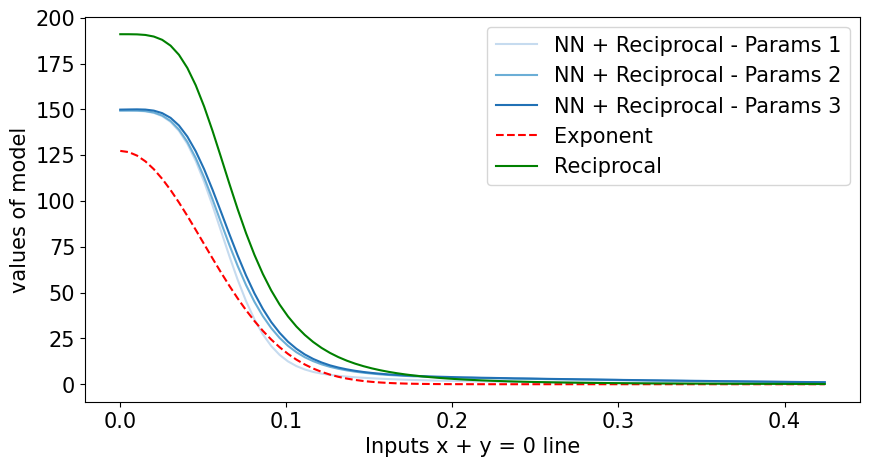

In [30]:
show_nn_trajectory_diag([params0,params5, params7], model, colormap='Blues', size=85)

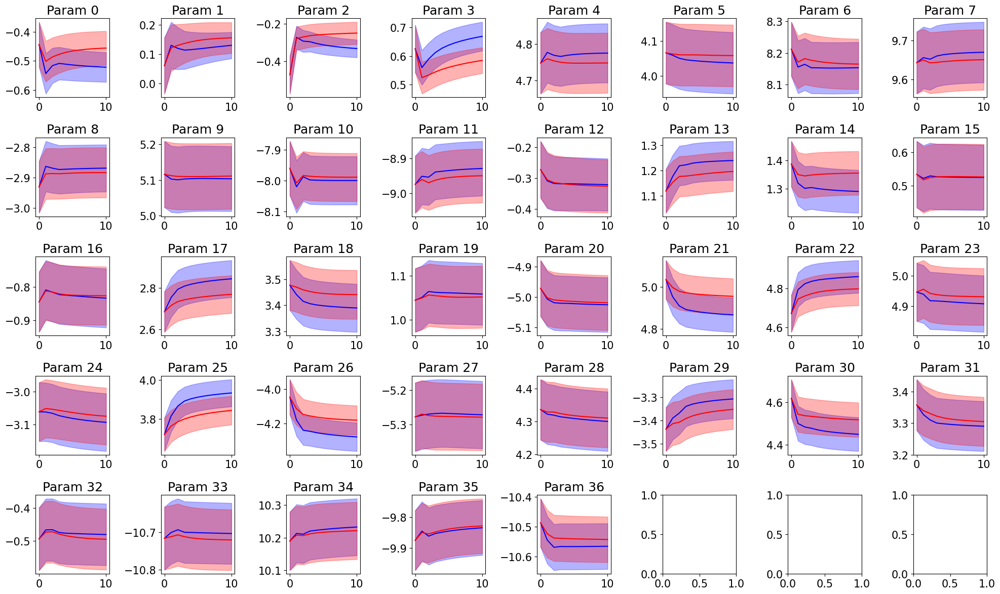

In [15]:
mean1 = np.mean(result_matrix_design_5,axis=1)
var1 = np.var(result_matrix_design_5,axis=1)
mean2 = np.mean(result_matrix_design_7,axis=1)
var2 = np.var(result_matrix_design_7,axis=1)
params_to_plot = 37  # 总共0~36个参数
rows, cols = 5, 8  # 5行8列的子图
fig, axs = plt.subplots(rows, cols, figsize=(20, 12))  # 设置画布大小

for i in range(params_to_plot):
    row = i // cols  # 计算当前子图的行号
    col = i % cols   # 计算当前子图的列号
    ax = axs[row, col]
    
    ax.plot(mean1[:, i], color='b')
    ax.fill_between(range(ensemble_step + 1), mean1[:, i] + var1[:, i], mean1[:, i] - var1[:, i], color='b', alpha=0.3)
    ax.plot(mean2[:, i], color='r')
    ax.fill_between(range(ensemble_step + 1), mean2[:, i] + var2[:, i], mean2[:, i] - var2[:, i], color='r', alpha=0.3)
    
    ax.set_title(f'Param {i}')  # 标题设置为参数编号

# 调整子图间距
plt.tight_layout()
plt.show()

Checkpoint data loaded successfully.
264.2229


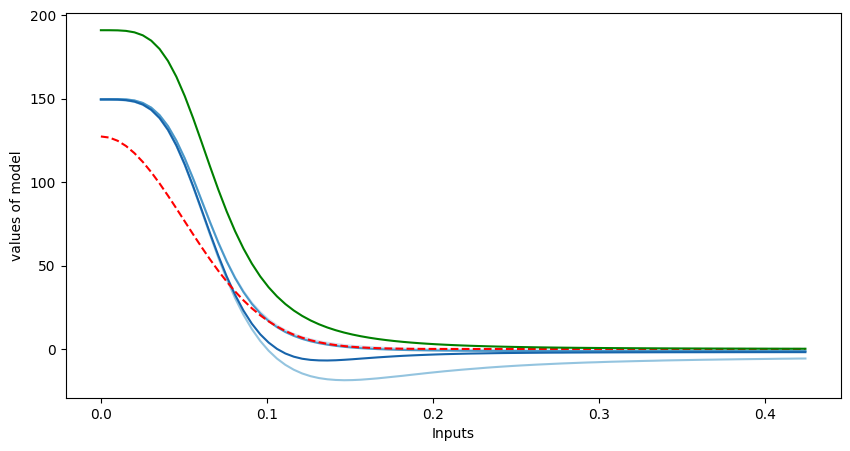

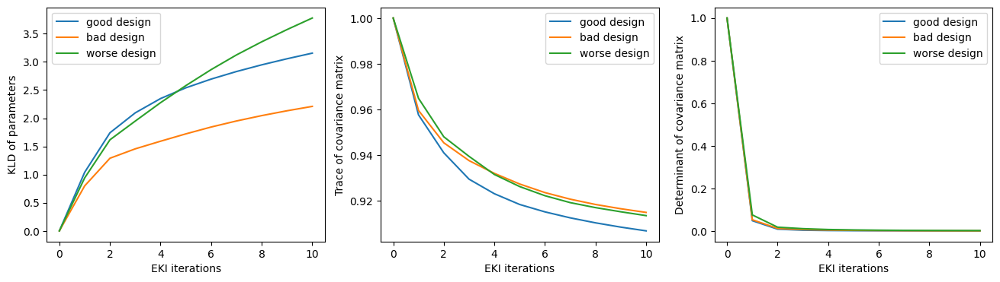

In [148]:

checkpoint_file_path = './checkpoints/nn_case_data_6_EnFK_stage3_test5/checkpoint_i_10_j_2.pkl' 

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

result_matrix_design_9 = checkpoint_data['params_trajectory'] # worse


params9 = reconstruct_array_to_dict(np.mean(result_matrix_design_9[-1], axis=0),params)
show_nn_trajectory([params0,params5, params7, params9], model2, 'Blues', center_x=0, center_y=0, size=85)

u_design_9 = sealed_convection_diffusion_nn(params9, d_start4, estimated_center, stage, model2)[1][100:151,100:151]
print(np.sum((u_t - u_design_9)**2))


mean_ori = np.mean(result_matrix_design_9[0],axis=0)
mean_ori_centered = result_matrix_design_9[0] - mean_ori
var_ori = np.cov(mean_ori_centered, rowvar=False)
kld_trajectory9 = np.zeros(ensemble_step+1)
kld_trajectory9[0] = kl_divergence(mean_ori, var_ori, mean_ori, var_ori)
kld_compare_to_before9 = np.zeros(ensemble_step)
mean_current_back = mean_ori
var_current_back = var_ori
covar_trace_9 = np.zeros(ensemble_step+1)
covar_trace_9[0] = np.trace(var_ori)
covar_det_9 = np.zeros(ensemble_step+1)
covar_det_9[0] = np.linalg.det(var_ori)

for i in range(1,ensemble_step+1):
    mean_current = np.mean(result_matrix_design_9[i],axis=0)
    mean_current_centered = result_matrix_design_9[i] - mean_current
    var_current = np.cov(mean_current_centered, rowvar=False)
    kld_trajectory9[i]=kl_divergence(mean_current, var_current, mean_ori, var_ori)
    kld_compare_to_before9[i-1]=kl_divergence(mean_current, var_current, mean_current_back, var_current_back)
    covar_trace_9[i] = np.trace(var_current)
    covar_det_9[i] = np.linalg.det(var_current)
    mean_current_back = mean_current
    var_current_back = var_current 


fig, axes = plt.subplots(1,3,figsize=(16,4))

axes[0].plot(kld_trajectory5, label = 'good design')
axes[0].plot(kld_trajectory7, label = 'bad design')
axes[0].plot(kld_trajectory9, label = 'worse design')
axes[0].set_xlabel('EKI iterations')
axes[0].set_ylabel('KLD of parameters')
axes[0].legend()


axes[1].plot(covar_trace_5/covar_trace_5[0], label = 'good design')
axes[1].plot(covar_trace_7/covar_trace_7[0], label = 'bad design')
axes[1].plot(covar_trace_9/covar_trace_9[0], label = 'worse design')
axes[1].set_xlabel('EKI iterations')
axes[1].set_ylabel('Trace of covariance matrix')
axes[1].legend()


axes[2].plot(covar_det_5/covar_det_5[0], label = 'good design')
axes[2].plot(covar_det_7/covar_det_7[0], label = 'bad design')
axes[2].plot(covar_det_9/covar_det_9[0], label = 'worse design')
axes[2].set_xlabel('EKI iterations')
axes[2].set_ylabel('Determinant of covariance matrix')
axes[2].legend()

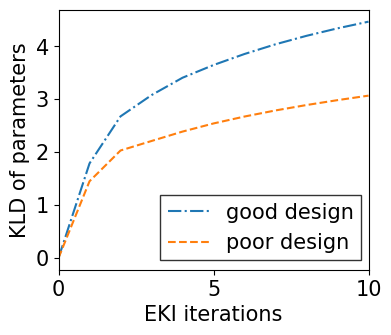

In [12]:
plt.figure(figsize=(4, 0.45*7.5))
plt.plot(kld_trajectory5, linestyle = '-.', label = 'good design')
plt.plot(kld_trajectory7, linestyle = '--', label = 'poor design')
plt.xlim([0,10])
plt.xticks([0,5,10])
plt.xlabel('EKI iterations')
plt.ylabel('KLD of parameters')
plt.legend()
legend = plt.legend(borderpad=0.05,loc='lower right', bbox_to_anchor=(0.99, 0.02),fontsize=font_size)

legend.get_frame().set_edgecolor('black')  # 设置边框颜色为黑色
legend.get_frame().set_linewidth(1)  # 设置边框线宽为1
legend.get_frame().set_boxstyle("Square")
plt.savefig('KLD of parameter of NN case.png', dpi=600, bbox_inches='tight')
plt.show()

In [149]:
stage=3 # 基于前一阶段的结果，指定下一阶段的设计，计算后验

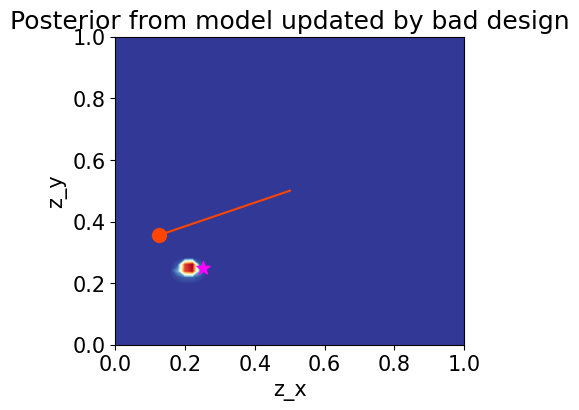

In [153]:
plt.figure(figsize=(4.5,4))
d_start = design_list[stage+1]#+jnp.array([-0.05,0.05])
prior = posterior_list[stage-1]
_, posterior = forward_posterior_infoGain(params7, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
plt.contourf(grid_x_plot0, grid_y_plot0, posterior.T, levels=100,cmap='RdYlBu_r' )
plt.scatter(d_start[0], d_start[1], marker='o', s=100, c='orangered')
plt.scatter(center[0], center[1], marker='*', s=100, c='magenta')
plt.plot([d_start[0],d_start_backup[0]],
                [d_start[1],d_start_backup[1]], c='orangered')
plt.title('Posterior from model updated by bad design')  # 设置子图的标题
plt.xlabel('z_x')  # 设置x轴标签
plt.ylabel('z_y')  # 设置y轴标签
plt.show()       

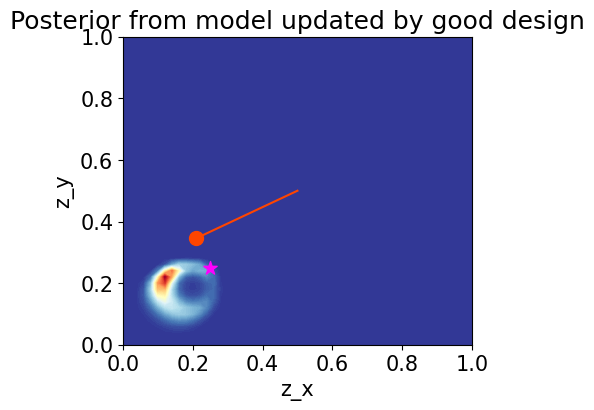

In [115]:
plt.figure(figsize=(4.5,4))
d_start = design_list[stage+1]+jnp.array([-0.05,0.05])
prior = posterior_list[stage-1]
_, posterior = forward_posterior_infoGain(params5, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
plt.contourf(grid_x_plot0, grid_y_plot0, posterior.T, levels=100,cmap='RdYlBu_r' )
plt.scatter(d_start[0], d_start[1], marker='o', s=100, c='orangered')
plt.scatter(center[0], center[1], marker='*', s=100, c='magenta')
plt.plot([d_start[0],d_start_backup[0]],
                [d_start[1],d_start_backup[1]], c='orangered')
plt.title('Posterior from model updated by good design')  # 设置子图的标题
plt.xlabel('z_x')  # 设置x轴标签
plt.ylabel('z_y')  # 设置y轴标签
plt.show()       

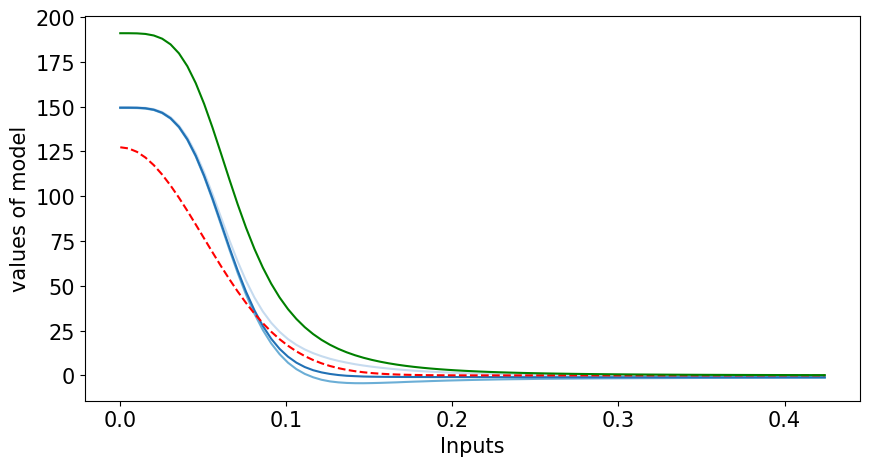

In [147]:
show_nn_trajectory(params_list[0:3], model, 'Blues', center_x=0, center_y=0, size=85)

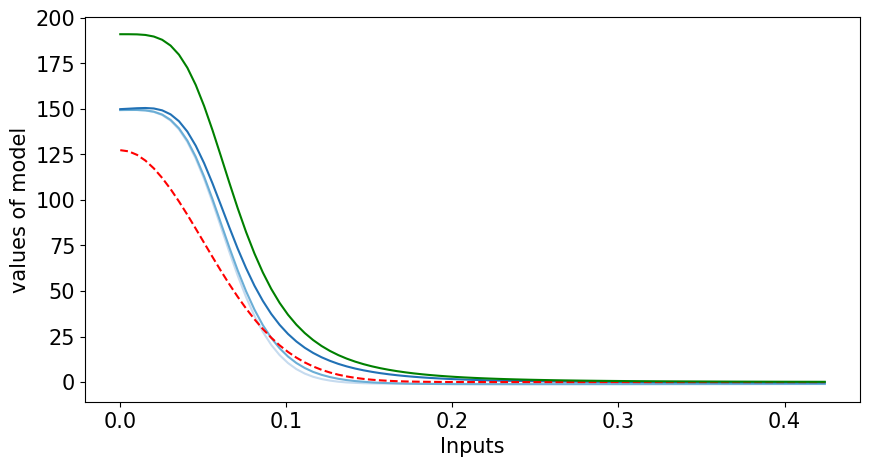

In [148]:
show_nn_trajectory([params_list[2],params5, params7], model, 'Blues', center_x=0, center_y=0, size=85)

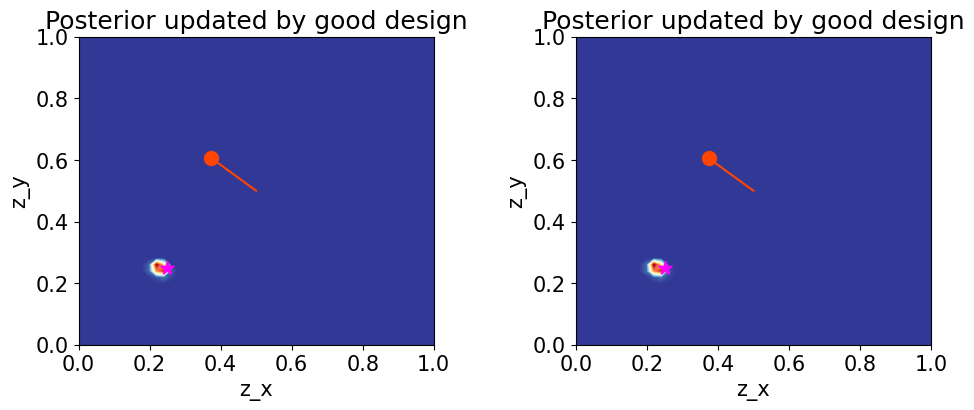

In [171]:
stage=3
_,axes = plt.subplots(1,2,figsize=(11,4))
plt.subplots_adjust(wspace=0.4)
d_start = design_list[stage+1]+jnp.array([0.25,0.25])
prior = posterior_list[stage-1]
_, posterior = forward_posterior_infoGain(params5, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
axes[0].contourf(grid_x_plot0, grid_y_plot0, posterior.T, levels=100,cmap='RdYlBu_r' )
axes[0].scatter(d_start[0], d_start[1], marker='o', s=100, c='orangered')
axes[0].scatter(center[0], center[1], marker='*', s=100, c='magenta')
axes[0].plot([d_start[0],d_start_backup[0]], [d_start[1],d_start_backup[1]], c='orangered')
axes[0].set_title('Posterior updated by good design')  # 设置子图的标题
axes[0].set_xlabel('z_x')  # 设置x轴标签
axes[0].set_ylabel('z_y')  # 设置y轴标签
_, posterior = forward_posterior_infoGain(params7, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
axes[1].contourf(grid_x_plot0, grid_y_plot0, posterior.T, levels=100,cmap='RdYlBu_r' )
axes[1].scatter(d_start[0], d_start[1], marker='o', s=100, c='orangered')
axes[1].scatter(center[0], center[1], marker='*', s=100, c='magenta')
axes[1].plot([d_start[0],d_start_backup[0]], [d_start[1],d_start_backup[1]], c='orangered')
axes[1].set_title('Posterior updated by good design')  # 设置子图的标题
axes[1].set_xlabel('z_x')  # 设置x轴标签
axes[1].set_ylabel('z_y')  # 设置y轴标签
plt.show()       

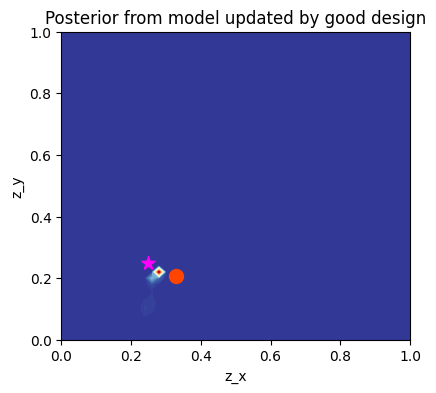

In [149]:
plt.figure(figsize=(4.5,4))
d_start = design_list[stage+1]#]+jnp.array([-0.1,0.1])
prior = posterior_list[stage-1]
_, posterior = forward_posterior_infoGain(params9, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
plt.contourf(grid_x_plot0, grid_y_plot0, posterior.T, levels=100,cmap='RdYlBu_r' )
plt.scatter(d_start[0], d_start[1], marker='o', s=100, c='orangered')
plt.scatter(center[0], center[1], marker='*', s=100, c='magenta')
plt.plot([d_start[0],d_start_backup[0]],
                [d_start[1],d_start_backup[1]], c='orangered')
plt.title('Posterior from model updated by good design')  # 设置子图的标题
plt.xlabel('z_x')  # 设置x轴标签
plt.ylabel('z_y')  # 设置y轴标签
plt.show()       

total loss  13.758534 82.472786 369.63132
local loss  0.10516035 0.2618816 8.464962


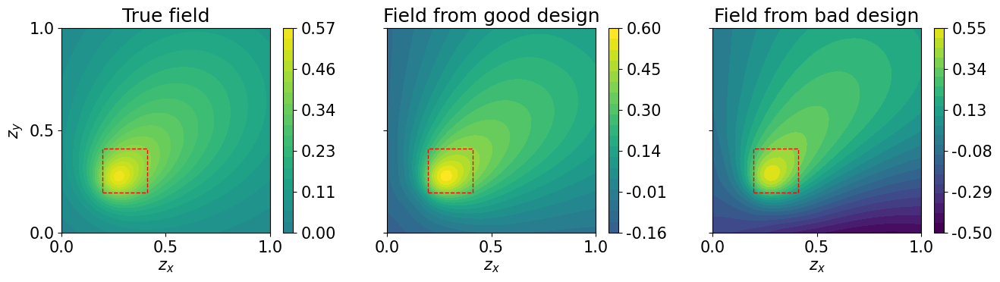

In [18]:
import matplotlib.patches as patches
# 需要指定当前的stage
stage = 2

u_t = sealed_convection_diffusion_true(d_start, center, stage)[1][100:151,100:151]
u_design_5 = sealed_convection_diffusion_nn(params5, d_start, center, stage, model)[1][100:151,100:151]
u_design_7 = sealed_convection_diffusion_nn(params7, d_start, center, stage, model)[1][100:151,100:151]
u_design_8 = sealed_convection_diffusion_nn(params_list[stage-1], d_start, center, stage, model)[1][100:151,100:151]
print('total loss ',np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_7)**2),np.sum((u_t - u_design_8)**2))
print('local loss ',np.sum(((u_t - u_design_5)**2)[10:21,10:21]),np.sum(((u_t - u_design_7)**2)[11:21,11:21]),np.sum(((u_t - u_design_8)**2)[11:21,11:21]))

# 找到所有数据的全局最小值和最大值
vmin = min(np.min(u_t), np.min(u_design_5), np.min(u_design_7))
vmax = max(np.max(u_t), np.max(u_design_5), np.max(u_design_7))

# 创建子图
# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(15.5, 3.5))
plt.subplots_adjust(wspace=0.25)


# Plot contourf images with shared vmin and vmax
c1 = axes[0].contourf(np.linspace(0, 1, u_t.shape[0]), np.linspace(0, 1, u_t.shape[1]), u_t.T, vmin=vmin, vmax=vmax, levels=20)
c2 = axes[1].contourf(np.linspace(0, 1, u_design_5.shape[0]), np.linspace(0, 1, u_design_5.shape[1]), u_design_5.T, vmin=vmin, vmax=vmax, levels=20)
c3 = axes[2].contourf(np.linspace(0, 1, u_design_7.shape[0]), np.linspace(0, 1, u_design_7.shape[1]), u_design_7.T, vmin=vmin, vmax=vmax, levels=20)

# Create rectangles with normalized coordinates
rect = patches.Rectangle((10/51, 10/51), 11/51, 11/51, linewidth=1, linestyle='--', edgecolor='red', facecolor='none')
axes[0].set_title('True field')
axes[0].add_patch(rect)

rect = patches.Rectangle((10/51, 10/51), 11/51, 11/51, linewidth=1, linestyle='--', edgecolor='red', facecolor='none')
axes[1].set_title('Field from good design')
axes[1].add_patch(rect)

rect = patches.Rectangle((10/51, 10/51), 11/51, 11/51, linewidth=1, linestyle='--', edgecolor='red', facecolor='none')
axes[2].set_title('Field from bad design')
axes[2].add_patch(rect)

# Set xlim and ylim for all axes
for ax in axes:
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_xticks([0.0, 0.5,1.0])
    ax.set_xlabel('$z_x$')
    if ax == axes[0]:
        ax.set_yticks([0.0, 0.5,1.0])
        ax.set_ylabel('$z_y$')
    else:
        ax.set_yticks([0.0, 0.5,1.0])
        ax.set_yticklabels([])


for ax, c in zip(axes, [c1, c2, c3]):
    colorbar = fig.colorbar(c, ax=ax)
    
    # 读取当前颜色条的 vmin 和 vmax
    vmin, vmax = colorbar.vmin, colorbar.vmax
    
    # 生成5个均匀分布的刻度
    ticks = np.linspace(vmin, vmax, 6)
    
    # 设置颜色条的刻度和格式化标签，保留两位小数
    colorbar.set_ticks(ticks)
    tick_labels = [f'{tick:.2f}' for tick in ticks]
    colorbar.set_ticklabels(tick_labels)
    
#plt.savefig('predict field with updated nn.png', dpi=600, bbox_inches='tight')
plt.show()

In [19]:
print('total loss ',np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_7)**2),np.sum((u_t - u_design_8)**2))
print('total relative loss ',np.sum(((u_t - u_design_5)/u_t)**2),np.sum(((u_t - u_design_7)/u_t)**2),np.sum(((u_t - u_design_8)/u_t)**2))

total loss  13.758534 82.472786 369.63132
total relative loss  2708.4824 14525.6 50443.68


In [29]:
print('total loss ',np.sum((u_t - u_design_5)**2)/51/51,np.sum((u_t - u_design_7)**2)/51/51,np.sum((u_t - u_design_8)**2)/51/51)

total loss  0.005289709508441953 0.03170810686263246 0.1421112330406274


In [28]:
np.sum(np.abs(u_t - u_design_5))/np.sum(np.abs(u_t)),np.sum(np.abs(u_t - u_design_7))/np.sum(np.abs(u_t)),np.sum(np.abs(u_t - u_design_8))/np.sum(np.abs(u_t))

(0.29763433, 0.664508, 1.5530363)

In [174]:
colorbar1 = fig.colorbar(c1, ax=axes[0])
colorbar1.vmax

0.6

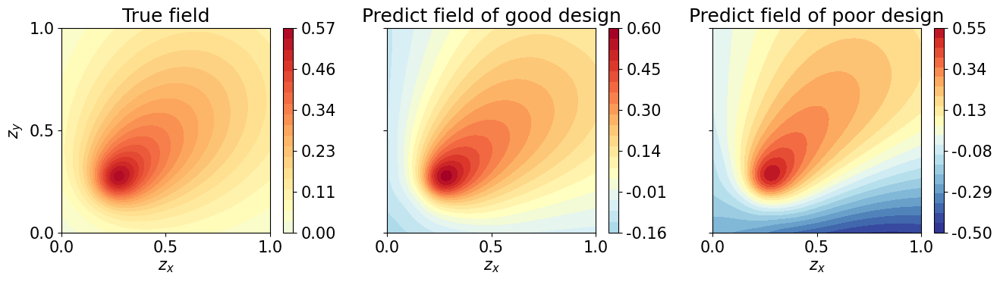

In [14]:
# 创建子图
# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(15.5, 3.5))
plt.subplots_adjust(wspace=0.25)

vmin = min(np.min(u_t), np.min(u_design_5), np.min(u_design_7))
vmax = max(np.max(u_t), np.max(u_design_5), np.max(u_design_7))

# Plot contourf images with shared vmin and vmax
c1 = axes[0].contourf(np.linspace(0, 1, u_t.shape[0]), np.linspace(0, 1, u_t.shape[1]), u_t.T, vmin=vmin, vmax=vmax, levels=20, cmap='RdYlBu_r')
c2 = axes[1].contourf(np.linspace(0, 1, u_design_5.shape[0]), np.linspace(0, 1, u_design_5.shape[1]), u_design_5.T, vmin=vmin, vmax=vmax, levels=20, cmap='RdYlBu_r')
c3 = axes[2].contourf(np.linspace(0, 1, u_design_7.shape[0]), np.linspace(0, 1, u_design_7.shape[1]), u_design_7.T, vmin=vmin, vmax=vmax, levels=20, cmap='RdYlBu_r')#'YlGnBu_r'
# Create rectangles with normalized coordinates
axes[0].set_title('True field')

axes[1].set_title('Predict field of good design')

axes[2].set_title('Predict field of poor design')

# Set xlim and ylim for all axes

# Set xlim and ylim for all axes
for ax in axes:
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_xticks([0.0, 0.5,1.0])
    ax.set_xlabel('$z_x$')
    if ax == axes[0]:
        ax.set_yticks([0.0, 0.5,1.0])
        ax.set_ylabel('$z_y$')
    else:
        ax.set_yticks([0.0, 0.5,1.0])
        ax.set_yticklabels([])


for ax, c in zip(axes, [c1, c2, c3]):
    colorbar = fig.colorbar(c, ax=ax)
    
    # 读取当前颜色条的 vmin 和 vmax
    vmin, vmax = colorbar.vmin, colorbar.vmax
    
    # 生成5个均匀分布的刻度
    ticks = np.linspace(vmin, vmax, 6)
    
    # 设置颜色条的刻度和格式化标签，保留两位小数
    colorbar.set_ticks(ticks)
    tick_labels = [f'{tick:.2f}' for tick in ticks]
    colorbar.set_ticklabels(tick_labels)

#plt.savefig('predict field with updated nn.png', dpi=600, bbox_inches='tight')
plt.show()

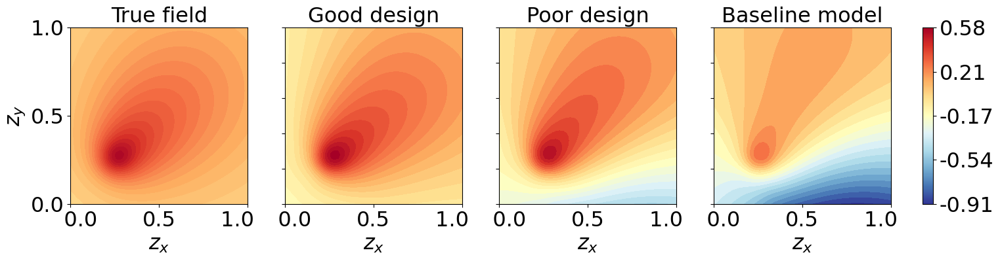

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# 创建子图
fig, axes = plt.subplots(1, 4, figsize=(4.03*4, 3.5))  # 调整figsize
fig.subplots_adjust(wspace=0.21)  # 调整子图间距

vmin = min(np.min(u_t), np.min(u_design_5), np.min(u_design_7), np.min(u_design_8))
vmax = max(np.max(u_t), np.max(u_design_5), np.max(u_design_7), np.max(u_design_8))

fontsize = 23
cmap = 'RdYlBu_r'  # 使用相同的颜色图

# 自定义刻度格式化函数
def custom_formatter(x, pos):
    if x == 0.0:
        return '   0.0'  # 向右移动
    elif x == 0.5:
        return '0.5'  # 向左移动
    elif x == 1.0:
        return '1.0   '
    else:
        return f'{x:.2f}'

# 绘制contourf图像，设置vmin和vmax
c1 = axes[0].contourf(np.linspace(0, 1, u_t.shape[0]), np.linspace(0, 1, u_t.shape[1]), u_t.T, vmin=vmin, vmax=vmax, levels=20, cmap=cmap)
c2 = axes[1].contourf(np.linspace(0, 1, u_design_5.shape[0]), np.linspace(0, 1, u_design_5.shape[1]), u_design_5.T, vmin=vmin, vmax=vmax, levels=20, cmap=cmap)
c3 = axes[2].contourf(np.linspace(0, 1, u_design_7.shape[0]), np.linspace(0, 1, u_design_7.shape[1]), u_design_7.T, vmin=vmin, vmax=vmax, levels=20, cmap=cmap)
c4 = axes[3].contourf(np.linspace(0, 1, u_design_8.shape[0]), np.linspace(0, 1, u_design_8.shape[1]), u_design_8.T, vmin=vmin, vmax=vmax, levels=20, cmap=cmap)

# 设置标题
axes[0].set_title('True field', fontsize=fontsize)
axes[1].set_title('Good design', fontsize=fontsize)
axes[2].set_title('Poor design', fontsize=fontsize)
axes[3].set_title('Baseline model', fontsize=fontsize)

# 统一设置xlim、ylim和刻度
for ax in axes:
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_xticks([0.0, 0.5, 1.0])
    ax.set_xlabel('$z_x$', fontsize=fontsize)
    ax.tick_params(axis='x', labelsize=fontsize)
    ax.xaxis.set_major_formatter(FuncFormatter(custom_formatter))  # 自定义刻度格式
    if ax == axes[0]:
        ax.set_yticks([0.0, 0.5, 1.0])
        ax.set_ylabel('$z_y$', fontsize=fontsize)
        ax.tick_params(axis='y', labelsize=fontsize)  # 设置 y 轴刻度标签的字体大小
    else:
        ax.set_yticklabels([])

# 设置颜色条
cbar_ax = fig.add_axes([0.93, 0.11, 0.01, 0.77])  # 设置颜色条位置
contour_set = plt.cm.ScalarMappable(cmap=cmap)
contour_set.set_array(u_design_8)
contour_set.set_clim(vmin, vmax)
ticks = np.linspace(vmin, vmax, 5)
cbar = fig.colorbar(contour_set, cax=cbar_ax, orientation='vertical')
cbar.ax.tick_params(labelsize=fontsize)
cbar.set_ticks(ticks)
tick_labels = [f'{tick:.2f}' for tick in ticks]
cbar.set_ticklabels(tick_labels)

## 添加图例
#plt.plot([], [], marker='*', markersize=10, color=star_color, linestyle='None', label='true source location')
#legend = plt.legend(
#    loc='center',
#    bbox_to_anchor=(0.527, 1.1),
#    ncol=3,
#    frameon=True,
#    framealpha=1,
#    edgecolor='black',
#    fontsize=fontsize,
#    borderpad=0.05, handlelength=0.5,
#    bbox_transform=fig.transFigure
#)
#legend.get_frame().set_edgecolor('black')
#legend.get_frame().set_linewidth(1)
#legend.get_frame().set_boxstyle("Square")

# 保存图片
plt.savefig('predict_field_with_updated_nn.png', dpi=600, bbox_inches='tight')
plt.show()


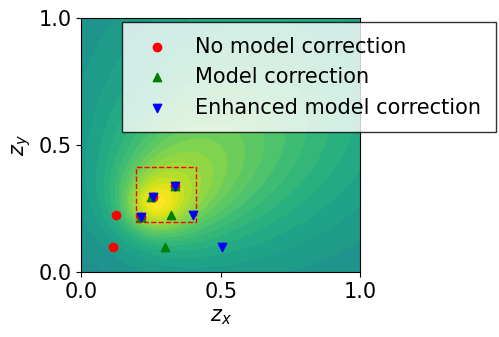

In [206]:
fig, ax = plt.subplots(figsize=(3.6, 3.3))
ax.contourf(np.linspace(0, 1, u_t.shape[0]), np.linspace(0, 1, u_t.shape[1]), u_t.T, vmin=vmin, vmax=vmax,levels=20)
rect = patches.Rectangle((10/51, 10/51), 11/51, 11/51, linewidth=1, linestyle='--', edgecolor='red', facecolor='none')
ax.add_patch(rect)

for i in range(1,n_stage+1):
    plt.scatter(design_list1[i][0],design_list[i][1],marker='o',color='r')
    plt.scatter(design_list2[i][0],design_list[i][1],marker='^',color='g')
    plt.scatter(design_list3[i][0],design_list[i][1],marker='v',color='b')

    
plt.scatter([], [], marker='o',color='r', label='No model correction')
plt.scatter([], [], marker='^',color='g', label='Model correction')
plt.scatter([], [], marker='v',color='b', label='Enhanced model correction')

plt.xlim(0, 1)
plt.xticks([0.0, 0.5,1.0])
plt.ylim(0, 1)
plt.yticks([0.0, 0.5,1.0])
plt.xlabel('$z_x$')
plt.ylabel('$z_y$')

legend = plt.legend(
    loc='best',
    bbox_to_anchor=(1.5, 1))

legend.get_frame().set_edgecolor('black')  # 设置边框颜色为黑色
legend.get_frame().set_linewidth(1)  # 设置边框线宽为1
legend.get_frame().set_boxstyle("Square")

In [131]:
design_list1, design_list2, design_list3

([Array([0.5, 0.5], dtype=float32),
  Array([0.33546886, 0.33540025], dtype=float32),
  Array([0.21560374, 0.21535774], dtype=float32),
  Array([0.2590128 , 0.29520652], dtype=float32),
  Array([0.1242381 , 0.35552606], dtype=float32),
  Array([0.11518266, 0.22299889], dtype=float32)],
 [Array([0.5, 0.5], dtype=float32),
  Array([0.33546886, 0.33540025], dtype=float32),
  Array([0.21560374, 0.21535774], dtype=float32),
  Array([0.2486042 , 0.26383477], dtype=float32),
  Array([0.320797  , 0.18974568], dtype=float32),
  Array([0.30103236, 0.23301315], dtype=float32)],
 [Array([0.5, 0.5], dtype=float32),
  Array([0.33546886, 0.33540025], dtype=float32),
  Array([0.21560374, 0.21535774], dtype=float32),
  Array([0.2590128 , 0.29520652], dtype=float32),
  Array([0.3991495 , 0.22517781], dtype=float32),
  Array([0.5055167 , 0.09697404], dtype=float32)])

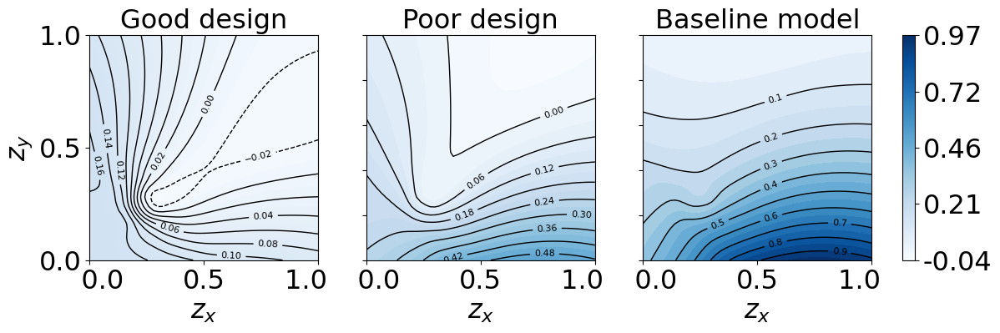

In [213]:
# 创建子图，调整figsize和wspace
fig, axes = plt.subplots(1, 3, figsize=(4.03*3, 3.5))  
fig.subplots_adjust(wspace=0.21)  

vmin = min(np.min(u_t - u_design_5), np.min(u_t - u_design_7), np.min(u_t - u_design_8))
vmax = max(np.max(u_t - u_design_5), np.max(u_t - u_design_7), np.max(u_t - u_design_8))

fontsize = 23
cmap = 'Blues'  # 颜色图与前面一致

# 自定义刻度格式化函数
def custom_formatter(x, pos):
    if x == 0.0:
        return '   0.0'  # 向右移动
    elif x == 0.5:
        return '0.5'  # 向左移动
    elif x == 1.0:
        return '1.0   '
    else:
        return f'{x:.2f}'

# 绘制 contourf 图像并设置 vmin 和 vmax
c1 = axes[0].contourf(np.linspace(0, 1, u_t.shape[0]), np.linspace(0, 1, u_t.shape[1]), (u_t - u_design_5).T, vmin=vmin, vmax=vmax, levels=20, cmap=cmap)
c2 = axes[1].contourf(np.linspace(0, 1, u_t.shape[0]), np.linspace(0, 1, u_t.shape[1]), (u_t - u_design_7).T, vmin=vmin, vmax=vmax, levels=20, cmap=cmap)
c3 = axes[2].contourf(np.linspace(0, 1, u_t.shape[0]), np.linspace(0, 1, u_t.shape[1]), (u_t - u_design_8).T, vmin=vmin, vmax=vmax, levels=20, cmap=cmap)

# 绘制等高线并标记所有等高线的值
contour1 = axes[0].contour(np.linspace(0, 1, u_t.shape[0]), np.linspace(0, 1, u_t.shape[1]), (u_t - u_design_5).T, levels=10, colors='black', linewidths=1)
contour2 = axes[1].contour(np.linspace(0, 1, u_t.shape[0]), np.linspace(0, 1, u_t.shape[1]), (u_t - u_design_7).T, levels=10, colors='black', linewidths=1)
contour3 = axes[2].contour(np.linspace(0, 1, u_t.shape[0]), np.linspace(0, 1, u_t.shape[1]), (u_t - u_design_8).T, levels=10, colors='black', linewidths=1)

# 给等高线标注值
axes[0].clabel(contour1, inline=True, fontsize=8)
axes[1].clabel(contour2, inline=True, fontsize=8)
axes[2].clabel(contour3, inline=True, fontsize=8)

# 设置标题、标签、刻度
axes[0].set_title('Good design', fontsize=fontsize)
axes[1].set_title('Poor design', fontsize=fontsize)
axes[2].set_title('Baseline model', fontsize=fontsize)

for ax in axes:
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_xticks([0.0, 0.5, 1.0])
    ax.set_xlabel('$z_x$', fontsize=fontsize)
    ax.tick_params(axis='x', labelsize=fontsize)
    ax.xaxis.set_major_formatter(FuncFormatter(custom_formatter))  # 自定义刻度格式
    if ax == axes[0]:
        ax.set_yticks([0.0, 0.5, 1.0])
        ax.set_ylabel('$z_y$', fontsize=fontsize)
        ax.tick_params(axis='y', labelsize=fontsize)
    else:
        ax.set_yticklabels([])

# 添加颜色条
cbar_ax = fig.add_axes([0.93, 0.11, 0.013, 0.77])  # 调整颜色条的位置
contour_set = plt.cm.ScalarMappable(cmap=cmap)
contour_set.set_array(u_design_8)
contour_set.set_clim(vmin, vmax)
ticks = np.linspace(vmin, vmax, 5)
cbar = fig.colorbar(contour_set, cax=cbar_ax, orientation='vertical')
cbar.ax.tick_params(labelsize=fontsize)
cbar.set_ticks(ticks)
tick_labels = [f'{tick:.2f}' for tick in ticks]
cbar.set_ticklabels(tick_labels)


# 保存图片
plt.savefig('design_comparison.png', dpi=600, bbox_inches='tight')
plt.show()

In [103]:
print((u_t - u_design_5)[12, 12], (u_t - u_design_7)[12, 12])

0.015369177 0.07912126


In [113]:
u_t = sealed_convection_diffusion_true(d_start1, center, stage)[1][100:151,100:151]
u_design_5 = sealed_convection_diffusion_nn(params7, d_start1, center, stage, model)[1][100:151,100:151]
u_design_7 = sealed_convection_diffusion_nn(params_list[stage-1], d_start1, center, stage, model)[1][100:151,100:151]
np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_7)**2)

(37.039154, 145.35797)

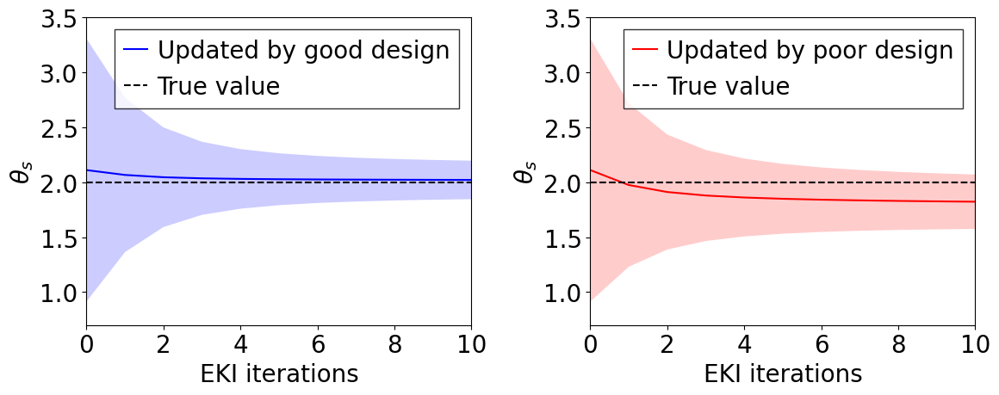

In [31]:
font_size = 20

plt.rc('font', size=font_size)

data = np.load("EKI_results_simple_case_seed_2023_final.npz")
step = 10
theta_true = 2.0

# 读取数组
params_trajectory_bad_design = data['arr_0']
params_trajectory_good_design = data['arr_1']


fig, axes = plt.subplots(1,2,figsize=(12, 5))
#for i in range(sample_size):
#    axes[0].plot(params_trajectory_bad_design[:,i],color='r',label='bad design')
#    axes[0].plot(params_trajectory_good_design[:,i],color='b',label='good design')
#    if i==0:
#        axes[0].legend()

mean_values_bad_design = np.mean(params_trajectory_bad_design, axis=1)
variance_values_bad_design = np.var(params_trajectory_bad_design, axis=1)
mean_values_good_design = np.mean(params_trajectory_good_design, axis=1)
variance_values_good_design = np.var(params_trajectory_good_design, axis=1)

axes[0].plot(mean_values_good_design,color='b',label='Updated by good design')
axes[0].fill_between(range(step+1),mean_values_good_design+np.sqrt(variance_values_good_design),mean_values_good_design-np.sqrt(variance_values_good_design),color='b',alpha=0.2, edgecolor='none')
axes[1].plot(mean_values_bad_design,color='r',label='Updated by poor design')
axes[1].fill_between(range(step+1),mean_values_bad_design+np.sqrt(variance_values_bad_design),mean_values_bad_design-np.sqrt(variance_values_bad_design),color='r',alpha=0.2, edgecolor='none')

axes[0].set_xlabel('EKI iterations')
axes[0].set_ylabel('$\\theta_s$')
axes[0].set_xlim([0,10])
axes[0].set_ylim([0.7,3.5])
axes[1].set_xlabel('EKI iterations')
axes[1].set_ylabel('$\\theta_s$')
axes[1].set_xlim([0,10])
axes[1].set_ylim([0.7,3.5])

axes[0].axhline(theta_true, linestyle='--', color='black', label='True value')
axes[0].legend(fontsize=font_size,
    frameon=True,
    framealpha=0.8,
    edgecolor='black',
    borderpad=0.4,
    handlelength=1.0,
    fancybox=False,  # 设置图例框为方形
    handletextpad=0.4  # 调整图标和文字之间的距离
)
axes[1].axhline(theta_true, linestyle='--', color='black', label='True value')
axes[1].legend(fontsize=font_size,
    frameon=True,
    framealpha=0.8,
    edgecolor='black',
    borderpad=0.4,
    handlelength=1.0,
    fancybox=False,  # 设置图例框为方形
    handletextpad=0.4  # 调整图标和文字之间的距离
)
plt.tight_layout()  # 调整子图间距
plt.savefig('EKI_simple_case.png',dpi=300,bbox_inches='tight')
plt.show()

In [162]:
mean_values_good_design[0],variance_values_good_design[0],mean_values_good_design[-1],variance_values_good_design[-1],mean_values_bad_design[-1],variance_values_bad_design[-1]

(2.10955996910731,
 1.42873475129773,
 2.020130995909373,
 0.030619322954907564,
 1.8219173749287922,
 0.06133360408481615)

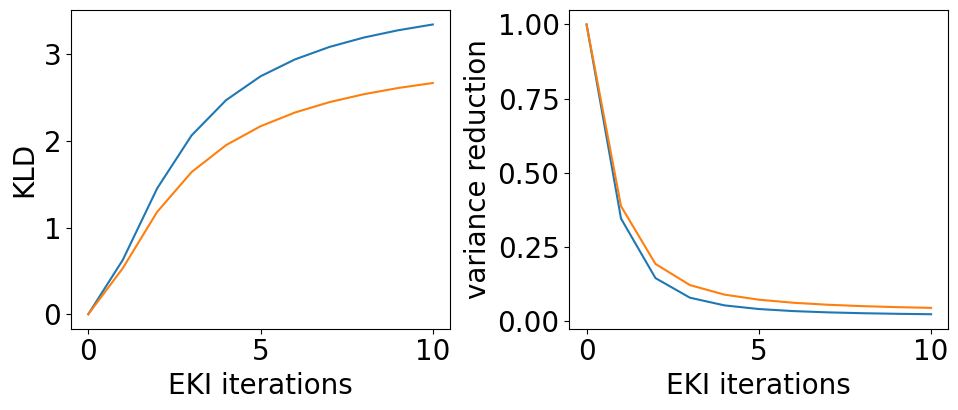

In [180]:
def kl_divergence_1d(mu1, sigma1, mu2, sigma2):
    # 计算KLD
    term1 = jnp.log(sigma2 / sigma1)
    term2 = (sigma1 ** 2 + (mu1 - mu2) ** 2) / (2 * sigma2 ** 2)
    
    # 计算最终的KL散度
    kl_div = term1 + term2 - 0.5
    
    return kl_div

ori_mean = mean_values_good_design[0]
ori_var = variance_values_good_design[0]
kld_1d_trajectary1 = np.zeros(ensemble_step+1)
for i in range(ensemble_step):
    new_mean = mean_values_good_design[i+1]
    new_var = variance_values_good_design[i+1]
    kld_1d_trajectary1[i+1]=kl_divergence_1d(new_mean, new_var, ori_mean, ori_var)


ori_mean = mean_values_bad_design[0]
ori_var = variance_values_bad_design[0]
kld_1d_trajectary2 = np.zeros(ensemble_step+1)
for i in range(ensemble_step):
    new_mean = mean_values_bad_design[i+1]
    new_var = variance_values_bad_design[i+1]
    kld_1d_trajectary2[i+1]=kl_divergence_1d(new_mean, new_var, ori_mean, ori_var)

fig,axes=plt.subplots(1,2,figsize=(10,4.5))
axes[0].plot(kld_1d_trajectary1)
axes[0].plot(kld_1d_trajectary2)
axes[0].set_ylabel('KLD')
axes[0].set_xlabel('EKI iterations')
axes[1].plot(variance_values_good_design/variance_values_good_design[0])
axes[1].plot( variance_values_bad_design/ variance_values_bad_design[0])
axes[1].set_ylabel('variance reduction')
axes[1].set_xlabel('EKI iterations')
plt.tight_layout()  # 调整子图间距
plt.show()

design for model correction is [0.46835467 0.06816124]
measurement is: 0.02249571494758129
estimated center is [0.28 0.04]


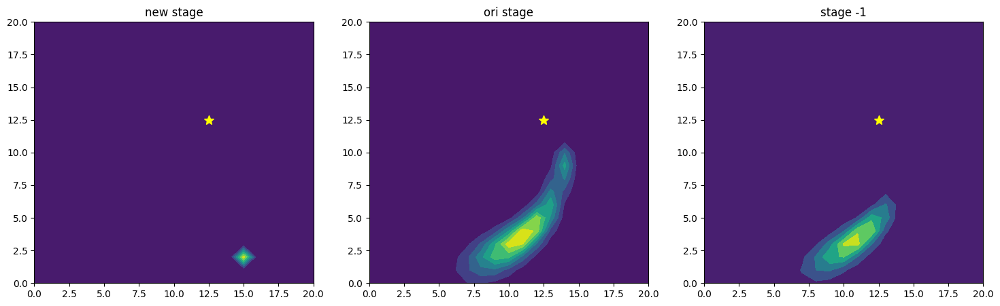

In [115]:
for stage in [5]:
    key_for_design = random.split(key[stage*2],iteration_step_number1[stage])
    key_for_param = random.split(key[stage*2+1],iteration_step_number2[stage])

    prior = posterior_list[stage-1]
    params=params_list[stage-1]
    d_start = design_list[stage+2]

    if stage!=0:
        _, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
        del prior
        prior = posterior
    
    print(f'design for model correction is {d_start}')
    observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
    print(f'measurement is: {observation}')
    #print(f'prior = {prior}')
    _, estimated_center = loss_param_refine4(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model, observation, 5)
    print(f'estimated center is {estimated_center}')
    estimated_posterior_point.append(estimated_center)
    
    _, posterior = forward_posterior_infoGain(params7, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
    
fig, axes = plt.subplots(1,3,figsize=(18,5))
axes[0].contourf(posterior.T)
axes[0].set_xlim([0,20])
axes[0].set_ylim([0,20])
axes[0].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)
axes[0].set_title('new stage')
axes[1].contourf(posterior_list[stage].T)
axes[1].set_xlim([0,20])
axes[1].set_ylim([0,20])
axes[1].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)
axes[1].set_title('ori stage')
axes[2].contourf(posterior_list[stage-1].T)
axes[2].set_xlim([0,20])
axes[2].set_ylim([0,20])
axes[2].set_title('stage -1')
axes[2].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)

In [20]:
params_list

[{'params': {'Dense_0': {'bias': Array([-0.1935,  0.6465, -0.6756, -0.3193], dtype=float32),
    'kernel': Array([[ -0.1454, -11.7873, -12.1136,   0.1809],
           [ -4.8683,  -8.973 ,  -3.497 ,  -9.0094]], dtype=float32)},
   'Dense_1': {'bias': Array([ 0.8187, -0.9192,  2.6559, -1.7372], dtype=float32),
    'kernel': Array([[-4.0606, -0.3964,  4.2733, -3.9753],
           [-5.4222,  5.0776,  1.6886,  3.2036],
           [ 8.3284, -0.2446, -3.2502, -2.9129],
           [-3.5057, -6.6277,  1.9602, -2.6868]], dtype=float32)},
   'Dense_2': {'bias': Array([-1.0679], dtype=float32),
    'kernel': Array([[ 11.6289],
           [-11.9214],
           [-12.6651],
           [-12.6907]], dtype=float32)}}},
 {'params': {'Dense_0': {'bias': Array([-0.18957   ,  0.6538094 , -0.6801941 , -0.32432687], dtype=float32),
    'kernel': Array([[ -0.1531468 , -11.783906  , -12.116114  ,   0.27876985],
           [ -4.878247  ,  -8.965887  ,  -3.491856  ,  -9.015542  ]],      dtype=float32)},
   'Dens

In [23]:
for stage in range(n_stage):
    y_f, _ = sealed_convection_diffusion_nn(params_list[stage],design_list[stage+1], center, stage, model)
    distance = np.sqrt(np.sum((estimated_posterior_point[stage]-design_list[stage+1])**2))
    print(f'model output at design {design_list[stage+1]} is {y_f}. distance between estimated center {estimated_posterior_point[stage]} and design is {distance}')

IndexError: list index out of range

In [28]:
stage = 2
d_test = jnp.array([0.17,0.17])
y, _ = sealed_convection_diffusion_true(d_test, center, stage)
y

Array(0.20034419, dtype=float32)

In [33]:
for stage in range(n_stage):
    y, y_field = sealed_convection_diffusion_true(design_list[stage+1], center, stage)
    print(f'maximum of u is {jnp.max(y_field)}, mean of u is {jnp.mean(y_field)}. observation at design {design_list[stage+1]} is {y}')

maximum of u is 0.5851787328720093, mean of u is 0.004039997234940529. observation at design [0.37815458 0.37834254] is 0.27154695987701416
maximum of u is 0.6266726851463318, mean of u is 0.008039994165301323. observation at design [0.3037421  0.30317488] is 0.5742236971855164
maximum of u is 0.5540176033973694, mean of u is 0.012039991095662117. observation at design [0.24684314 0.24296996] is 0.5081968307495117
maximum of u is 0.4566551744937897, mean of u is 0.01603998988866806. observation at design [0.18399519 0.18117835] is 0.1615881323814392


In [7]:
for stage in range(n_stage):
    y, y_field = sealed_convection_diffusion_true(design_list[stage+1], center, stage)
    print(f'maximum of u is {jnp.max(y_field)}, mean of u is {jnp.mean(y_field)}. observation at design {design_list[stage+1]} is {y}')

maximum of u is 0.5851787328720093, mean of u is 0.004039997234940529. observation at design [0.37815458 0.37834254] is 0.27154695987701416
maximum of u is 0.6266726851463318, mean of u is 0.008039994165301323. observation at design [0.3037421  0.30317488] is 0.5742236971855164
maximum of u is 0.5540176033973694, mean of u is 0.012039991095662117. observation at design [0.24534842 0.24344872] is 0.5069676041603088
maximum of u is 0.4566551744937897, mean of u is 0.01603998988866806. observation at design [0.18434353 0.28689972] is 0.27471816539764404
maximum of u is 0.3885820209980011, mean of u is 0.020039988681674004. observation at design [0.19966339 0.23318452] is 0.2236957848072052
maximum of u is 0.34325411915779114, mean of u is 0.02403998374938965. observation at design [0.1731961  0.18477616] is 0.07864437997341156
maximum of u is 0.3089401423931122, mean of u is 0.028039980679750443. observation at design [0.297215   0.32941362] is 0.28170132637023926


# 不要运行！

In [ ]:

with open('all_data_nn_case_data_6_test.pkl', 'rb') as f:
    loaded_data = pickle.load(f)

posterior_list = loaded_data["posterior_list"]
posterior_oed_list = loaded_data["posterior_oed_list"]
design_list = loaded_data["design_list"]
params_list = loaded_data["params_list"]
estimated_posterior_point = loaded_data["estimated_posterior_point"]

In [5]:
import pickle

numpy_list = [np.array(arr) for arr in posterior_list]
data_to_save = {
    "posterior_list": numpy_list,
    "posterior_oed_list": posterior_oed_list
    "design_list": design_list,
    "params_list": params_list,
    "estimated_posterior_point": estimated_posterior_point
}

with open('all_data_nn_case_data_6_test.pkl', 'wb') as f:
    pickle.dump(data_to_save, f)

SyntaxError: invalid syntax (3652590965.py, line 7)

In [6]:
# EnKF 如果出现问题，直接从这里开始运行

# 运行这里（1）！

In [78]:
import os
import pickle
import re
import gc
from flax.traverse_util import flatten_dict, unflatten_dict

def reconstruct_array_to_dict(params_grad_array, grads):
    """
    将扁平化后的数组重新构建回原始的 grads 字典。

    参数:
    - params_grad_array: 扁平化后的梯度数组
    - grads: 原始的 grads 字典，用于获取结构信息

    返回:
    - reconstructed_grads: 重建后的 grads 字典
    """
    # 获取原始 grads 的结构信息
    params_grad_flat = flatten_dict(grads)
    shapes = {k: v.shape for k, v in params_grad_flat.items()}

    # 将 params_grad_array 拆分成原始形状的数组
    index = 0
    reconstructed_params_grad_flat = {}
    for k, shape in shapes.items():
        size = size = int(np.prod(shape))  # 将形状转换为 numpy 数组，然后计算其大小
        reconstructed_params_grad_flat[k] = jnp.reshape(params_grad_array[index:index+size], shape)
        index += size

    # 将平坦化的字典恢复到原始的嵌套结构
    reconstructed_grads = unflatten_dict(reconstructed_params_grad_flat)

    return reconstructed_grads

def reconstruct_dict_to_array(grads):
    """
    将嵌套字典转换为扁平化的数组。

    参数:
    - grads: 嵌套的 grads 字典

    返回:
    - params_grad_array: 扁平化后的梯度数组
    """
    # 将字典展平
    params_grad_flat = flatten_dict(grads)
    
    # 获取所有梯度值，并将其展平
    flat_arrays = [jnp.ravel(v) for v in params_grad_flat.values()]
    
    # 将所有展平的数组拼接成一个单独的数组
    params_grad_array = jnp.concatenate(flat_arrays)
    
    return params_grad_array
    
def kl_divergence(mu1, sigma1, mu2, sigma2):
    # 计算逆矩阵和行列式
    sigma2_inv = jnp.linalg.inv(sigma2)
    #sigma1_det = jnp.linalg.det(sigma1)
    #sigma2_det = jnp.linalg.det(sigma2)
    
    # 计算各项
    term1 = jnp.trace(sigma2_inv @ sigma1)
    term2 = (mu2 - mu1).T @ sigma2_inv @ (mu2 - mu1)
    
    _, logdet_sigma1 = jnp.linalg.slogdet(sigma1)
    _, logdet_sigma2 = jnp.linalg.slogdet(sigma2)
    term3 = logdet_sigma2 - logdet_sigma1
    #term3 = jnp.log(sigma2_det / sigma1_det)
    
    # 计算最终的KL散度
    kl_div = 0.5 * (term1 + term2 - len(mu1) + term3)
    
    return kl_div
    
def EnKF_process_correct(d_start, observation, ensemble_member, estimated_center, stage, model, key2, num_top=5):
    # 进行一次EnKF更新
    # 这个代码是不能够并行的

    # 生成初始状态的场
    # 直接在外面生成一个导入
    # 从这个场，用ensemble menber更新到现在

    # 输入ensemble_member是数组
    # 输出theta_samples_updated是数组
    # noise_info, lo_b, up_b, size, num_top 是全局变量
    
    ensemble_size_local = ensemble_member.shape[0]
    noise_loc, noise_base_scale, noise_ratio_scale = noise_info[0]
    xb_lo = int((0.0 - lo_b) / (up_b - lo_b) * (size - 1))
    xb_up = int((1.0 - lo_b) / (up_b - lo_b) * (size - 1))


    y_fs = jnp.zeros((ensemble_size_local,1))
    
    for i in range(ensemble_size_local):
        ensemble_member_dict = reconstruct_array_to_dict(ensemble_member[i],params)
        y_f, _  = sealed_convection_diffusion_nn(ensemble_member_dict, d_start, estimated_center, stage, model)
        y_fs = y_fs.at[i,0].set(y_f)
        print('.',end='')
    
    y_f_mean = jnp.mean(y_fs)
    P_yy = 1/(ensemble_size_local-1)*jnp.sum((y_fs-y_f_mean)**2)+1.0#noise_base_scale

    #x_f_theta = ensemble_member.reshape(ensemble_size_local,-1) # 这一步是对于1维情况准备的，高维情况不用reshape
    x_f_theta = ensemble_member
    x_f_mean = jnp.mean(x_f_theta, axis=0).reshape(1,-1)

    x_f_deviation = x_f_theta - x_f_mean
    y_f_deviation = y_fs - y_f_mean.reshape(1,1)
    P_xy = jnp.matmul(x_f_deviation.T, y_f_deviation) / (ensemble_size_local - 1) 

    K = P_xy * 1.0/P_yy
    x_a = x_f_theta + jnp.matmul(K, (observation - y_fs).T).T
    #x_a = x_f_theta + jnp.matmul(K, (observation + jax.random.normal(key2, shape=observation.shape)*noise_base_scale - y_fs).T).T
    
    return x_a

    

# 现在需要一个函数，对于一个给定的场，给出一些index，取出/插值这些index上的点
def insert_from_u(u,indexs):
    # 要求indexs是一个数组，design_number * 2 / 或者一个列表
    y_f_member = jnp.zeros((1, len(indexs)))
    for i in range(len(indexs)):
        y_f = jax.scipy.ndimage.map_coordinates(u,indexs[i],1)
        y_f_member = y_f_member.at[0,i].set(y_f)

    return y_f_member

#indexs=np.array([[111,111],
#                [112,113]])
#insert_from_u(output_all, indexs)

#import numpy as np

def generate_2d_grid(lower_limit, upper_limit, num_points):
    # 在两个方向上生成指定数量的点
    x = np.linspace(lower_limit, upper_limit, num_points)
    y = np.linspace(lower_limit, upper_limit, num_points)
    
    # 生成网格
    X, Y = np.meshgrid(x, y)
    
    # 将网格点坐标转换为n*2的数组
    grid_points = np.vstack([X.ravel(), Y.ravel()]).T
    
    return grid_points

#def generate_2d_grid_xy(x_mid, y_mid, space, num=3):
#    # 在两个方向上生成指定数量的点
#    x = np.array([x_mid-space, x_mid, x_mid+space])
#    y = np.array([y_mid-space, y_mid, y_mid+space])
#    
#    # 生成网格
#    X, Y = np.meshgrid(x, y)
#    
#    # 将网格点坐标转换为n*2的数组
#    grid_points = np.vstack([X.ravel(), Y.ravel()]).T
#    
#    return grid_points

## 示例使用
#lower = 110
#upper = 130
#num = 5
#grid = generate_2d_grid(lower, upper, num)
#print(grid)

def generate_2d_grid_xy(x_mid, y_mid, space, num=3):
    # 检查num是否为奇数，如果不是则加1使其为奇数
    if num % 2 == 0:
        raise ValueError("num必须是奇数")

    # 生成x方向的点，确保中点位于x_mid
    x = np.linspace(x_mid - space * (num // 2), x_mid + space * (num // 2), num)
    
    # 生成y方向的点，确保中点位于y_mid
    y = np.linspace(y_mid - space * (num // 2), y_mid + space * (num // 2), num)
    
    # 生成网格
    X, Y = np.meshgrid(x, y)
    
    # 将网格点坐标转换为n*2的数组
    grid_points = np.vstack([X.ravel(), Y.ravel()]).T
    
    return grid_points

In [787]:
def generate_2d_grid_xy(x_mid, y_mid, space, num=3):
    # 检查num是否为奇数，如果不是则加1使其为奇数
    if num % 2 == 0:
        raise ValueError("num必须是奇数")

    # 生成x方向的点，确保中点位于x_mid
    x = np.linspace(x_mid - space * (num // 2), x_mid + space * (num // 2), num)
    
    # 生成y方向的点，确保中点位于y_mid
    y = np.linspace(y_mid - space * (num // 2), y_mid + space * (num // 2), num)
    
    # 生成网格
    X, Y = np.meshgrid(x, y)
    
    # 将网格点坐标转换为n*2的数组
    grid_points = np.vstack([X.ravel(), Y.ravel()]).T
    
    return grid_points

d_center_x = 0.27
d_center_y = 0.27
indexs = generate_2d_grid_xy(d_center_x*50+100, d_center_y*50+100, 1, num=5)
# 生辰观测数据
_, ut  = sealed_convection_diffusion_true(d_start, center, stage) # u的尺寸是251*251
observations = insert_from_u(ut,indexs)
_, u0  = sealed_convection_diffusion_true(d_start, estimated_center, stage) # u的尺寸是251*251
y0 = insert_from_u(u0,indexs)

x_coords = (indexs[:, 0]-100)/50
y_coords = (indexs[:, 1]-100)/50

differences = observations - y0
# Create a DataFrame with x, y, observations, y0, and their differences
df = pd.DataFrame({
    'X': x_coords,
    'Y': y_coords,
    'Observations': observations.flatten(),
    'Y0': y0.flatten(),
    'Difference': differences.flatten()
})

# Display the DataFrame
df

,X,Y,Observations,Y0,Difference
0,0.23,0.23,0.453755,0.504383,-0.050629
1,0.25,0.23,0.486083,0.524163,-0.038080
2,0.27,0.23,0.498939,0.523486,-0.024547
3,0.29,0.23,0.493304,0.506297,-0.012993
4,0.31,0.23,0.473769,0.478690,-0.004922
5,0.23,0.25,0.486083,0.524163,-0.038080
6,0.25,0.25,0.520731,0.545130,-0.024399
7,0.27,0.25,0.534467,0.545354,-0.010888
8,0.29,0.25,0.528348,0.528726,-0.000378
9,0.31,0.25,0.507302,0.501301,0.006000


In [789]:
d_center_x = 0.23
d_center_y = 0.23
indexs = generate_2d_grid_xy(d_center_x*50+100, d_center_y*50+100, 1, num=5)
# 生辰观测数据
_, ut  = sealed_convection_diffusion_true(d_start, center, stage) # u的尺寸是251*251
observations = insert_from_u(ut,indexs)
_, u0  = sealed_convection_diffusion_true(d_start, estimated_center, stage) # u的尺寸是251*251
y0 = insert_from_u(u0,indexs)

x_coords = (indexs[:, 0]-100)/50
y_coords = (indexs[:, 1]-100)/50

differences = observations - y0
# Create a DataFrame with x, y, observations, y0, and their differences
df = pd.DataFrame({
    'X': x_coords,
    'Y': y_coords,
    'Observations': observations.flatten(),
    'Y0': y0.flatten(),
    'Difference': differences.flatten()
})

# Disp
df

,X,Y,Observations,Y0,Difference
0,0.19,0.19,0.274613,0.336660,-0.062047
1,0.21,0.19,0.315293,0.379240,-0.063946
2,0.23,0.19,0.350418,0.411086,-0.060668
3,0.25,0.19,0.375245,0.427969,-0.052724
4,0.27,0.19,0.386947,0.429220,-0.042273
5,0.19,0.21,0.315293,0.379240,-0.063946
6,0.21,0.21,0.364205,0.428460,-0.064255
7,0.23,0.21,0.406144,0.464819,-0.058675
8,0.25,0.21,0.435022,0.483223,-0.048201
9,0.27,0.21,0.447259,0.483027,-0.035768


In [208]:
np.linspace(100, 130, 31)

array([100., 101., 102., 103., 104., 105., 106., 107., 108., 109., 110.,
       111., 112., 113., 114., 115., 116., 117., 118., 119., 120., 121.,
       122., 123., 124., 125., 126., 127., 128., 129., 130.])

In [167]:
indexs = generate_2d_grid(100, 130, 10)
_, u  = sealed_convection_diffusion_true(d_start, center, stage) # u的尺寸是251*251
observations = insert_from_u(u,indexs)

In [ ]:
ensemble_size_local = ensemble_members_array.shape[0]
noise_loc, noise_base_scale, noise_ratio_scale = noise_info[0]

observe_size = len(indexs)
y_fs = jnp.zeros((ensemble_size_local,observe_size))

for i in range(ensemble_size_local):
    ensemble_member_dict = reconstruct_array_to_dict(ensemble_members_array[i],params)
    _, u  = sealed_convection_diffusion_nn(ensemble_member_dict, d_start, estimated_center, stage, model) # u的尺寸是251*251
    y_f_member = insert_from_u(u,indexs)
    y_fs = y_fs.at[i,:].set(y_f_member.squeeze())
    print('.',end='')

y_f_mean = np.mean(y_fs, axis=0).reshape(1,-1)

noise_covariance_matrix = np.eye(observe_size) * noise_base_scale
P_yy = 1/(ensemble_size_local - 1) * np.matmul((y_fs - y_f_mean).T, (y_fs - y_f_mean)) + noise_covariance_matrix
#x_f_theta = ensemble_member.reshape(ensemble_size_local,-1) # 这一步是对于1维情况准备的，高维情况不用reshape
x_f_theta = ensemble_members_array
x_f_mean = jnp.mean(x_f_theta, axis=0).reshape(1,-1)
x_f_deviation = x_f_theta - x_f_mean
y_f_deviation = y_fs - y_f_mean
P_xy = jnp.matmul(x_f_deviation.T, y_f_deviation) / (ensemble_size_local - 1) 
K = np.matmul(P_xy, np.linalg.inv(P_yy))

In [1136]:
indexs

array([[100., 100.],
       [100., 101.],
       [100., 102.],
       ...,
       [150., 148.],
       [150., 149.],
       [150., 150.]])

In [284]:
sealed_convection_diffusion_true(center, center, stage)[0]

Array(0.5207315, dtype=float32)

In [285]:
sealed_convection_diffusion_true(center, estimated_center, stage)[0]

Array(0.5303758, dtype=float32)

In [1260]:
x_values = np.arange(0, 1.02, 0.02)
y_values = np.arange(0, 1.02, 0.02)
estimated_center = jnp.array([0.236,0.236])
X_grid, Y_grid = np.meshgrid(x_values, y_values, indexing='ij')

# 将网格坐标转化为所需的indexs
indexs = (np.vstack([X_grid.flatten(), Y_grid.flatten()]).T)*50+100

_, ut  = sealed_convection_diffusion_true(d_start, center, stage) # u的尺寸是251*251
observations = insert_from_u(ut,indexs)
_, u0  = sealed_convection_diffusion_true(d_start, estimated_center, stage) # u的尺寸是251*251
y0 = insert_from_u(u0,indexs)


differences = observations - y0
percentage = differences/y0
print('estimated_center = ', estimated_center)

estimated_center =  [0.236 0.236]


In [1261]:
percentage = percentage.reshape(51, 51)
np.max(percentage),np.min(percentage)

(Array(0.04876548, dtype=float32), Array(-0.20377149, dtype=float32))

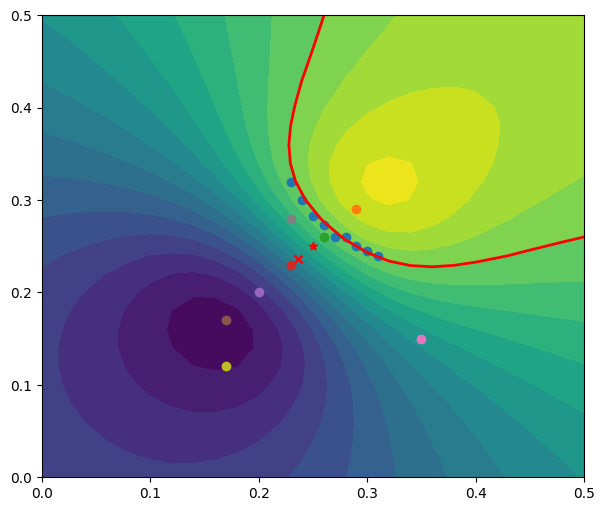

In [1273]:
fig=plt.figure(figsize=(7,6))

# 绘制填充等高线图
plt.contourf(percentage, levels=20)

# 绘制数值等于0的等高线
contour = plt.contour(percentage, levels=[-0.5, 0, 0.15], colors='red', linewidths=2)

# 添加等高线的标签 (可选)
plt.clabel(contour, fmt='%1.1f')

plt.scatter(center[0]*50,center[1]*50,marker='*',color='r')
plt.scatter(estimated_center[0]*50,estimated_center[1]*50,marker='x',color='r')

#plt.scatter(0.25*50,0.3*50,marker='o')

plt.xlim([0,25])
plt.ylim([0,25])

indexs = np.array([
    [0.25,0.283],
    [0.26,0.273],
    [0.27,0.26],
    [0.28,0.26],
    [0.29,0.25],
    [0.30,0.245],
    [0.24,0.30],
    [0.23,0.32],
    [0.31,0.24]
])*50
plt.scatter(indexs[:,0],indexs[:,1])

original_ticks = np.linspace(0, 25, 6)  # 原来的刻度
new_ticks = original_ticks / 50  # 显示为0到0.5的比例

plt.xticks(original_ticks, new_ticks)
plt.yticks(original_ticks, new_ticks)

#plt.scatter(0.17*50,0.12*50,marker='o')
#plt.scatter(0.23*50,0.28*50,marker='o')

plt.scatter(d_start1[0]*50,d_start1[1]*50,marker='o')
plt.scatter(d_start2[0]*50,d_start2[1]*50,marker='o')
plt.scatter(d_start3[0]*50,d_start3[1]*50,marker='o')
plt.scatter(d_start4[0]*50,d_start4[1]*50,marker='o')
plt.scatter(d_start5[0]*50,d_start5[1]*50,marker='o')
plt.scatter(d_start6[0]*50,d_start6[1]*50,marker='o')
#plt.scatter(d_start7[0]*50,d_start7[1]*50,marker='o')
plt.scatter(d_start8[0]*50,d_start8[1]*50,marker='o')
plt.scatter(d_start9[0]*50,d_start9[1]*50,marker='o')

plt.show()

In [1206]:
d_center_x = 0.25
d_center_y = 0.28
indexs = generate_2d_grid_xy(d_center_x*50+100, d_center_y*50+100, 1)
# 生辰观测数据
_, ut  = sealed_convection_diffusion_true(d_start, center, stage) # u的尺寸是251*251
observations = insert_from_u(ut,indexs)
_, u0  = sealed_convection_diffusion_true(d_start, estimated_center, stage) # u的尺寸是251*251
y0 = insert_from_u(u0,indexs)

x_coords = (indexs[:, 0]-100)/50
y_coords = (indexs[:, 1]-100)/50

differences = observations - y0
percentage1 = differences/y0

# Create a DataFrame with x, y, observations, y0, and their differences
df = pd.DataFrame({
    'X': x_coords,
    'Y': y_coords,
    'Observations': observations.flatten(),
    'Y0': y0.flatten(),
    'Difference': differences.flatten(),
    'Percentage': percentage1.flatten()
})

# Display the DataFrame
df

,X,Y,Observations,Y0,Difference,Percentage
0,0.23,0.26,0.497642,0.528648,-0.031006,-0.058651
1,0.25,0.26,0.533110,0.550156,-0.017046,-0.030985
2,0.27,0.26,0.547368,0.551205,-0.003836,-0.006960
3,0.23,0.28,0.500235,0.518324,-0.018089,-0.034898
4,0.25,0.28,0.535824,0.540553,-0.004729,-0.008749
5,0.27,0.28,0.551463,0.544219,0.007243,0.013309
6,0.23,0.30,0.486373,0.494271,-0.007898,-0.015979
7,0.25,0.30,0.520873,0.516899,0.003974,0.007688
8,0.27,0.30,0.537861,0.523774,0.014087,0.026896


In [339]:
0.2+0.05/np.sqrt(2),0.2-0.05/np.sqrt(2)

(0.23535533905932737, 0.16464466094067265)

In [1264]:
d_center_x = 0.15
d_center_y = 0.15
indexs = generate_2d_grid_xy(d_center_x*50+100, d_center_y*50+100, 1)
indexs = np.array([
    [0.23,0.283],
    [0.24,0.26],
    [0.25,0.25],
    [0.26,0.24],
    [0.27,0.24],
    [0.28,0.233],
    [0.29,0.22],
    [0.22,0.29],
    [0.21,0.32]
])*50+100
# 生辰观测数据
_, ut  = sealed_convection_diffusion_true(d_start, center, stage) # u的尺寸是251*251
observations = insert_from_u(ut,indexs)
_, u0  = sealed_convection_diffusion_true(d_start, estimated_center, stage) # u的尺寸是251*251
y0 = insert_from_u(u0,indexs)

x_coords = (indexs[:, 0]-100)/50
y_coords = (indexs[:, 1]-100)/50

differences = observations - y0
percentage1 = differences/y0

# Create a DataFrame with x, y, observations, y0, and their differences
df = pd.DataFrame({
    'X': x_coords,
    'Y': y_coords,
    'Observations': observations.flatten(),
    'Y0': y0.flatten(),
    'Difference': differences.flatten(),
    'Percentage': percentage1.flatten()
})

# Display the DataFrame
df

,X,Y,Observations,Y0,Difference,Percentage
0,0.23,0.283,0.498156,0.514716,-0.016560,-0.032173
1,0.24,0.260,0.520391,0.544765,-0.024374,-0.044743
2,0.25,0.250,0.520731,0.545130,-0.024399,-0.044758
3,0.26,0.240,0.520391,0.544765,-0.024374,-0.044742
4,0.27,0.240,0.521565,0.539504,-0.017939,-0.033251
5,0.28,0.233,0.506987,0.523100,-0.016113,-0.030803
6,0.29,0.220,0.471365,0.490678,-0.019313,-0.039360
7,0.22,0.290,0.471365,0.490678,-0.019313,-0.039360
8,0.21,0.320,0.417363,0.428969,-0.011606,-0.027055


In [1208]:
d_center_x = 0.17
d_center_y = 0.17
indexs = generate_2d_grid_xy(d_center_x*50+100, d_center_y*50+100, 1)
# 生辰观测数据
_, ut  = sealed_convection_diffusion_true(d_start, center, stage) # u的尺寸是251*251
observations = insert_from_u(ut,indexs)
_, u0  = sealed_convection_diffusion_true(d_start, estimated_center, stage) # u的尺寸是251*251
y0 = insert_from_u(u0,indexs)

x_coords = (indexs[:, 0]-100)/50
y_coords = (indexs[:, 1]-100)/50

differences = observations - y0
percentage1 = differences/y0

# Create a DataFrame with x, y, observations, y0, and their differences
df = pd.DataFrame({
    'X': x_coords,
    'Y': y_coords,
    'Observations': observations.flatten(),
    'Y0': y0.flatten(),
    'Difference': differences.flatten(),
    'Percentage': percentage1.flatten()
})

# Display the DataFrame
df

,X,Y,Observations,Y0,Difference,Percentage
0,0.15,0.15,0.145286,0.182036,-0.036749,-0.201881
1,0.17,0.15,0.169533,0.212357,-0.042824,-0.201661
2,0.19,0.15,0.195193,0.242975,-0.047783,-0.196657
3,0.15,0.17,0.169533,0.212357,-0.042824,-0.201661
4,0.17,0.17,0.200344,0.250563,-0.050219,-0.200423
5,0.19,0.17,0.233338,0.289355,-0.056018,-0.193595
6,0.15,0.19,0.195193,0.242975,-0.047783,-0.196657
7,0.17,0.19,0.233338,0.289355,-0.056018,-0.193595
8,0.19,0.19,0.274613,0.336660,-0.062047,-0.184303


In [ ]:
# d_center_x = 0.23
d_center_y = 0.28
indexs = generate_2d_grid_xy(d_center_x*50+100, d_center_y*50+100, 1)
# 生辰观测数据
_, ut  = sealed_convection_diffusion_true(d_start, center, stage) # u的尺寸是251*251
observations = insert_from_u(ut,indexs)
_, u0  = sealed_convection_diffusion_true(d_start, estimated_center, stage) # u的尺寸是251*251
y0 = insert_from_u(u0,indexs)

x_coords = (indexs[:, 0]-100)/50
y_coords = (indexs[:, 1]-100)/50

differences = observations - y0
percentage = differences/y0

# Create a DataFrame with x, y, observations, y0, and their differences
df = pd.DataFrame({
    'X': x_coords,
    'Y': y_coords,
    'Observations': observations.flatten(),
    'Y0': y0.flatten(),
    'Difference': differences.flatten(),
    'Percentage': percentage.flatten()
})

# Display the DataFrame
df

In [1500]:
jnp.array([[ -4.2789, -10.5716],
                                    [ -0.2080,   0.2526],
                                    [ -6.8360,   8.8767],
                                    [ 11.4825,   1.4958]]).shape

(4, 2)

In [1506]:
class localFullyConnectedNN3(nn.Module):
    @nn.compact
    def __call__(self, x):
        x = nn.Dense(features=4)(x)  # 输入层到隐藏层1，4个节点
        x = nn.tanh(x)  # 激活函数
        x = nn.Dense(features=1)(x)  # 隐藏层1到隐藏层2，1个节点
        x = nn.tanh(x)  # 激活函数
        x = nn.Dense(features=1)(x)  # 隐藏层2到输出层，1个节点
        return x

model3 = localFullyConnectedNN3()  # 创建模型实例

params = {'params': {'Dense_0': {'bias': jnp.array([-0.8606,  4.4855, -0.8462, -0.8642]),
               'kernel': jnp.array([[ -4.2789,  -0.2080,  -6.8360,  11.4825],
                                    [-10.5716,   0.2526,   8.8767,   1.4958]])},
              'Dense_1': {'bias': jnp.array([-1.5668]),
               'kernel': jnp.array([[-3.8124],
                                    [-4.4032],
                                    [-3.8557],
                                    [-3.7599]])},
              'Dense_2': {'bias': jnp.array([-31.1188]),
               'kernel': jnp.array([[-30.7157]])}}
                }

model3.apply(params, xy_combined)

Array([-58.906837], dtype=float32)

# 运行这里（2）！

In [598]:
for i in range(5):
    if i % 2 == 0:
        print(i)

0
2
4


In [ ]:
def EnKF_process_multidata(indexs, observation, ensemble_member, estimated_center, stage, model, key2, step_index, num_top=5):
    
    ensemble_size_local = ensemble_member.shape[0]
    noise_loc, noise_base_scale, noise_ratio_scale = noise_info[0]

    observe_size = len(indexs)
    y_fs = jnp.zeros((ensemble_size_local,observe_size))
    
    for i in range(ensemble_size_local):
        ensemble_member_dict = reconstruct_array_to_dict(ensemble_member[i],params)
        _, u  = sealed_convection_diffusion_nn(ensemble_member_dict, d_start, estimated_center, stage, model) # u的尺寸是251*251
        y_f_member = insert_from_u(u,indexs)
        y_fs = y_fs.at[i,:].set(y_f_member.squeeze())
        print('.',end='')
    
    y_f_mean = np.mean(y_fs, axis=0).reshape(1,-1)
    
    noise_covariance_matrix = np.eye(observe_size) * noise_base_scale
    P_yy = 1/(ensemble_size_local - 1) * np.matmul((y_fs - y_f_mean).T, (y_fs - y_f_mean)) + noise_covariance_matrix

    #x_f_theta = ensemble_member.reshape(ensemble_size_local,-1) # 这一步是对于1维情况准备的，高维情况不用reshape
    x_f_theta = ensemble_member
    x_f_mean = jnp.mean(x_f_theta, axis=0).reshape(1,-1)

    x_f_deviation = x_f_theta - x_f_mean
    y_f_deviation = y_fs - y_f_mean
    P_xy = jnp.matmul(x_f_deviation.T, y_f_deviation) / (ensemble_size_local - 1) 

    K = np.matmul(P_xy, np.linalg.inv(P_yy))

    #residual = observation - y_fs
    #mean_vals = np.mean(residual, axis=0)  # 计算每列的均值
    #std_vals = np.std(residual, axis=0)    # 计算每列的标准差
    #
    ## 防止除零错误，标准差为0时将其设为1
    #std_vals = np.where(std_vals == 0, 1, std_vals)
    #
    ## 归一化公式
    #standardized_residual = residual  / std_vals
    #
    #x_a = x_f_theta + jnp.matmul(K, standardized_residual.T).T
    x_a = x_f_theta + jnp.matmul(K, (observation - y_fs).T).T

    #if step_index % 2 == 0:
    #    x_a_mean = np.mean(x_a, axis=0)
    #    inflation_factor = 1.01 # 或其他合适的值
    #    x_a = x_a_mean + inflation_factor * (x_a - x_a_mean) # 膨胀因子
    
    return x_a

def EnKF_process_singledata(d_start, observation, ensemble_member, estimated_center, stage, model, key2, num_top=5):
    
    ensemble_size_local = ensemble_member.shape[0]
    noise_loc, noise_base_scale, noise_ratio_scale = noise_info[0]

    observe_size = 1
    y_fs = jnp.zeros((ensemble_size_local,observe_size))
    
    for i in range(ensemble_size_local):
        ensemble_member_dict = reconstruct_array_to_dict(ensemble_member[i],params)
        y_f_member, _  = sealed_convection_diffusion_nn(ensemble_member_dict, d_start, estimated_center, stage, model) # u的尺寸是251*251
        y_fs = y_fs.at[i].set(y_f_member.squeeze())
        print('.',end='')
    
    y_f_mean = np.mean(y_fs, axis=0).reshape(1,-1)
    
    noise_covariance_matrix = np.eye(observe_size) * noise_base_scale
    P_yy = 1/(ensemble_size_local - 1) * np.matmul((y_fs - y_f_mean).T, (y_fs - y_f_mean)) + noise_covariance_matrix

    #x_f_theta = ensemble_member.reshape(ensemble_size_local,-1) # 这一步是对于1维情况准备的，高维情况不用reshape
    x_f_theta = ensemble_member
    x_f_mean = jnp.mean(x_f_theta, axis=0).reshape(1,-1)

    x_f_deviation = x_f_theta - x_f_mean
    y_f_deviation = y_fs - y_f_mean
    P_xy = jnp.matmul(x_f_deviation.T, y_f_deviation) / (ensemble_size_local - 1) 

    K = np.matmul(P_xy, np.linalg.inv(P_yy))
    x_a = x_f_theta + jnp.matmul(K, (observation - y_fs).T).T
    
    #x_a_mean = np.mean(x_a, axis=0)
    #inflation_factor = 1.01 # 或其他合适的值
    #x_a = x_a_mean + inflation_factor * (x_a - x_a_mean) # 膨胀因子
    
    return x_a

indexs = generate_2d_grid(112, 114, 3)

mean_array = reconstruct_dict_to_array(params)
ensemble_members_array = jax.vmap(generate_sample, in_axes=(0, None, None))(keys_ensemble, mean_array, 0.3)
ensemble_size_local = ensemble_members_array.shape[0]
noise_loc, noise_base_scale, noise_ratio_scale = noise_info[0]
observe_size = len(indexs)
y_fs = jnp.zeros((ensemble_size_local,observe_size))

for i in range(ensemble_size_local):
    ensemble_member_dict = reconstruct_array_to_dict(ensemble_members_array[i],params)
    _, u  = sealed_convection_diffusion_nn(ensemble_member_dict, d_start, estimated_center, stage, model2) # u的尺寸是251*251
    y_f_member = insert_from_u(u,indexs)
    y_fs = y_fs.at[i,:].set(y_f_member.squeeze())
    print('.',end='')

y_f_mean = np.mean(y_fs, axis=0).reshape(1,-1)

noise_covariance_matrix = np.eye(observe_size) * noise_base_scale
P_yy = 1/(ensemble_size_local - 1) * np.matmul((y_fs - y_f_mean).T, (y_fs - y_f_mean)) + noise_covariance_matrix

_, ut  = sealed_convection_diffusion_true(d_start, center, stage) # u的尺寸是251*251
observations = insert_from_u(ut,indexs)

x_f_theta = ensemble_members_array
x_f_mean = jnp.mean(x_f_theta, axis=0).reshape(1,-1)
x_f_deviation = x_f_theta - x_f_mean
y_f_deviation = y_fs - y_f_mean
P_xy = jnp.matmul(x_f_deviation.T, y_f_deviation) / (ensemble_size_local - 1) 
K = np.matmul(P_xy, np.linalg.inv(P_yy))
x_a = x_f_theta + jnp.matmul(K, (observation - y_fs).T).T

In [1076]:
noise_covariance_matrix = np.eye(observe_size) * 0.05 
pyy = 1/(ensemble_size_local - 1) * np.matmul((y_fs - y_f_mean).T, (y_fs - y_f_mean)) + noise_covariance_matrix
print(pyy)
condition_number = np.linalg.cond(pyy)
print("条件数:", condition_number)
eigenvalues, _ = np.linalg.eig(pyy)
#print("特征值:", eigenvalues)

[[1.31799464 1.26385832 1.25896633 ... 0.35208559 0.33826932 0.32445079]
 [1.26385832 1.31002121 1.25544941 ... 0.3559795  0.34220713 0.32842606]
 [1.25896633 1.25544941 1.30122344 ... 0.35992947 0.34620637 0.33246723]
 ...
 [0.35208559 0.3559795  0.35992947 ... 1.08942537 1.04213011 1.04428029]
 [0.33826932 0.34220719 0.34620628 ... 1.04213011 1.0954936  1.04829419]
 [0.32445079 0.32842606 0.33246723 ... 1.04428029 1.04829419 1.10173719]]
条件数: 16127.266543379643


In [1130]:
noise_covariance_matrix = np.eye(observe_size) * 0.00004
pyy = 1/(ensemble_size_local - 1) * np.matmul((y_fs - y_f_mean).T, (y_fs - y_f_mean)) + noise_covariance_matrix
print(pyy)
condition_number = np.linalg.cond(pyy)
print("条件数:", condition_number)
eigenvalues, _ = np.linalg.eig(pyy)
#print("特征值:", eigenvalues)

[[0.0631146  0.06306932 0.06259818 0.06499003 0.06489572 0.06436377
  0.06634912 0.06615698 0.06560156]
 [0.06306932 0.06324361 0.06285837 0.06497632 0.0650171  0.06460879
  0.06632872 0.06626479 0.06582954]
 [0.06259818 0.06285837 0.06267366 0.06448418 0.06464775 0.0643581
  0.06582244 0.06587597 0.06555597]
 [0.06499003 0.06497632 0.06448418 0.0671648  0.06701971 0.06646326
  0.06867682 0.06847002 0.06788663]
 [0.06489572 0.0650171  0.06464775 0.06701971 0.06708725 0.06661348
  0.06856494 0.06848601 0.0680234 ]
 [0.06436377 0.06460879 0.0643581  0.06646326 0.06661348 0.06633907
  0.0679932  0.06803382 0.06768921]
 [0.06634912 0.06632872 0.06582244 0.06867682 0.06856494 0.0679932
  0.07044586 0.07019037 0.06958914]
 [0.06615698 0.06626479 0.06587597 0.06847002 0.06848601 0.06803382
  0.07019037 0.07014053 0.06961914]
 [0.06560156 0.06582954 0.06555597 0.06788663 0.0680234  0.06768921
  0.06958914 0.06961914 0.06929643]]
条件数: 14945.79496785139


In [1135]:
1/(ensemble_size_local - 1) * np.matmul((y_fs[:,0] - y_f_mean[:,0]).T, (y_fs[:,0] - y_f_mean[:,0]))

0.06307460804178258

In [1137]:
noise_covariance_matrix = np.eye(1) * 1e-2
pyy = 1/(ensemble_size_local - 1) * np.matmul((y_fs[:,0] - y_f_mean[:,0]).T, (y_fs[:,0] - y_f_mean[:,0])) + noise_covariance_matrix
print(pyy)
condition_number = np.linalg.cond(pyy)
print("条件数:", condition_number)
eigenvalues, _ = np.linalg.eig(pyy)
print("特征值:", eigenvalues)

[[0.07307461]]
条件数: 1.0
特征值: [0.07307461]


In [914]:
residual = observation - y_fs
mean_vals = np.mean(residual, axis=0)  # 计算每列的均值
std_vals = np.std(residual, axis=0)    # 计算每列的标准差

# 防止除零错误，标准差为0时将其设为1
std_vals = np.where(std_vals == 0, 1, std_vals)

# 归一化公式
standardized_residual = (residual - mean_vals) / std_vals

x_a = x_f_theta + jnp.matmul(K, standardized_residual.T).T

残差矩阵的奇异值： [2.9975523e+01 1.0182724e+00 6.5476191e-01 3.8881388e-02 2.4860157e-02
 1.5362401e-02 2.8019727e-03 2.7024904e-03 3.1965255e-04]
协方差矩阵的条件数： 8793812733.896254


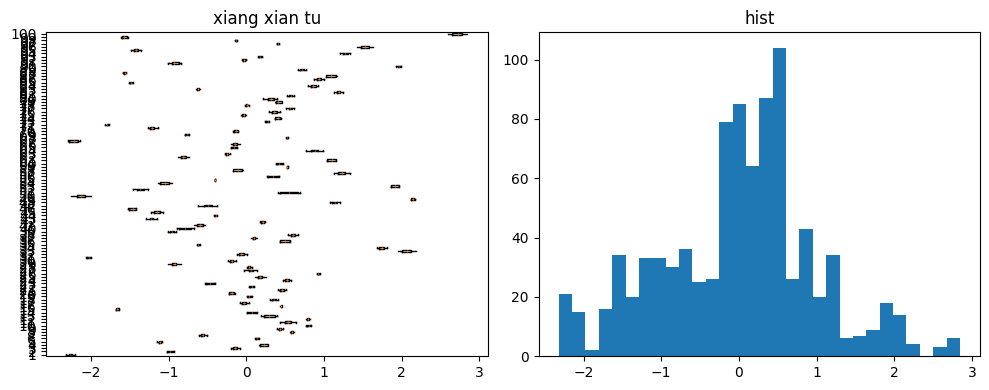

接近零的元素个数： 0
残差矩阵的秩： 8


In [916]:
# 检查 2: 奇异值分解 (SVD)
U, s, Vt = np.linalg.svd(standardized_residual, full_matrices=False)
print("残差矩阵的奇异值：", s)

# 检查 3: 协方差矩阵的条件数
P_yy = np.cov(standardized_residual.T)
cond_number = np.linalg.cond(P_yy)
print("协方差矩阵的条件数：", cond_number)

# 检查 4: 残差分布可视化 (箱线图和直方图)
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.boxplot(standardized_residual, vert=False)
plt.title('xiang xian tu')

plt.subplot(1, 2, 2)
plt.hist(standardized_residual.flatten(), bins=30)
plt.title('hist')

plt.tight_layout()
plt.show()

# 检查 5: 检测零值和近零值
near_zero_elements = np.isclose(standardized_residual, 0)
num_near_zero = np.sum(near_zero_elements)
print("接近零的元素个数：", num_near_zero)

# 检查 7: 检查列的线性相关性（通过计算矩阵秩）
rank_of_residual = np.linalg.matrix_rank(standardized_residual)
print("残差矩阵的秩：", rank_of_residual)

In [983]:
j

5

In [1327]:
def generate_sample(key, mean, std_dev):
    return mean + std_dev * jax.random.normal(key, shape=mean.shape)
    
def natural_key(filename):
    return [int(part) if part.isdigit() else part for part in re.split(r'(\d+)', filename)]

# 保存检查点的函数
def save_checkpoint(i, j, params_trajectory, ensemble_members_array):
    checkpoint = {
        'i': i,
        'j': j,
        'params_trajectory': params_trajectory,
        'ensemble_members_array': ensemble_members_array
    }
    checkpoint_path = os.path.join(checkpoint_dir, f'checkpoint_i_{i}_j_{j}.pkl')
    with open(checkpoint_path, 'wb') as f:
        pickle.dump(checkpoint, f)
    print(f"Checkpoint saved at i={i}, j={j}")

# 加载最近的检查点
def load_checkpoint(j):
    checkpoint_files = sorted([f for f in os.listdir(checkpoint_dir) if f.endswith(f'_j_{j}.pkl')], key=natural_key)
    if checkpoint_files:
        latest_checkpoint = checkpoint_files[-1]
        checkpoint_path = os.path.join(checkpoint_dir, latest_checkpoint)
        with open(checkpoint_path, 'rb') as f:
            checkpoint = pickle.load(f)
        print(f"Checkpoint loaded from {latest_checkpoint}")
        return checkpoint
    return None


with open('all_data_nn_case_data_3_.pkl', 'rb') as f:
    loaded_data = pickle.load(f)

posterior_list = loaded_data["posterior_list"]
design_list = loaded_data["design_list"]
params_list = loaded_data["params_list"]



stage = 2
grid_size=50
ensemble_size = 100  # 生成的数组数量
ensemble_step = 5


std_dev = 1.0  #0.05  #0.1  # 标准差

key_ensemble = jax.random.PRNGKey(0)  # 随机数种子
keys_ensemble = jax.random.split(key_ensemble, ensemble_size)
key2 = jax.random.PRNGKey(2)  # 随机数种子

class localFullyConnectedNN2(nn.Module):
    @nn.compact
    def __call__(self, x):
        x = nn.Dense(features=4)(x)  # 输入层到隐藏层1，8个节点
        x = nn.tanh(x)  # 激活函数
        x = nn.Dense(features=4)(x)  # 隐藏层1到隐藏层2，4个节点
        x = nn.tanh(x)  # 激活函数
        x = nn.Dense(features=1)(x)  # 隐藏层2到输出层，1个节点
        return x
        
model2 = localFullyConnectedNN2()  # 创建模型实例

#class localFullyConnectedNN3(nn.Module):
#    @nn.compact
#    def __call__(self, x):
#        x = nn.Dense(features=4)(x)  # 输入层到隐藏层1，4个节点
#        x = nn.tanh(x)  # 激活函数
#        x = nn.Dense(features=1)(x)  # 隐藏层1到隐藏层2，1个节点
#        x = nn.tanh(x)  # 激活函数
#        x = nn.Dense(features=1)(x)  # 隐藏层2到输出层，1个节点
#        return x

class localFullyConnectedNN3(nn.Module):
    @nn.compact
    def __call__(self, x):
        x = nn.Dense(features=3)(x)  # 输入层到隐藏层1，4个节点
        x = nn.tanh(x)  # 激活函数
        x = nn.Dense(features=3)(x)  # 隐藏层1到隐藏层2，1个节点
        x = nn.tanh(x)  # 激活函数
        x = nn.Dense(features=1)(x)  # 隐藏层2到输出层，1个节点
        return x

model3 = localFullyConnectedNN3()  # 创建模型实例

## 先更新后验，用上一个阶段的design
#_, posterior = forward_posterior_infoGain(params, design_list[stage+1], stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
#
#del prior
#prior = posterior 
#
#num_top = 5
#indices = jnp.argpartition(posterior .ravel(), -num_top)[-num_top:]
#multi_indices = jnp.unravel_index(indices, posterior.shape)
#average_x = np.mean(multi_indices[0])
#average_y = np.mean(multi_indices[1])
#estimated_center = jnp.array([average_x, average_y])/50

estimated_center = jnp.array([0.236, 0.236])
print(f'estimated center is {estimated_center}')

#ensemble_optimizer = optax.adam(0.2)



noise_loc = 0
noise_base_scale = 0.0004
noise_ratio_scale = 0.05
noise_info = [(noise_loc, noise_base_scale, noise_ratio_scale),]




checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test58'
os.makedirs(checkpoint_dir, exist_ok=True)

# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test5' 测试了 stage=0的情况。后验估计点、参数仍然使用了stage=2时候的
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test6' j=2 测试了 stage=0的情况。后验估计点、参数仍然使用了stage=2时候的.增大了noise level 0.1 ~ 1.0
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test6' j=0 测试了stage=2
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test7' 测试stage=2的时候，9个design的情况 j-0
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test8' 测试stage=2的时候，9个design的情况 j-0 std:1.0-2.0
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test9' 测试stage=2的时候，9个design的情况 j-0 std:1.0-2.0 样本数 100 - 300 步数 10 - 20 //问题是初始的网路输出两极化了。更新之后单个的参数很好，均值却偏离很大。
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test10' 测试新的网络, 把系数从70改为100.  150， 20， 0.5， 1.02
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test11' 使用旧的网络 300，20，1.0，1.02 是一组结果
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test12' 测试新的网络, 把系数从70改为100.  150， 10， 0.5
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test13' 测试新的网络, 把系数从70改为100.  150， 10， 1.5
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test14' 测试新的网络, 把系数从70改为100.  300， 10， 1.5
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test15' 测试新的网络, 把系数从70改为100.  300， 10， 0.5
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test16' 测试新的网络, 把系数从70改为100.  300， 10， 1.0
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test17' 测试新的网络在数据充足的情况下的效果.  300， 10， 1.0 961
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test18' 测试新的网络在减少数据的情况下的效果.  300， 10， 1.0 441
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test19' 测试新的网络在增大数据维度的情况下不同design的效果.  300， 10， 1.0  5*5=25点
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test20' 测试新的网络在增大数据维度的情况下不同design的效果.  300， 10， 1.0  5*5=25点 更换随机数种子 0 - 2023
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test21' 使用旧的网络 300，20，1.0，1.05    随机数种子 2023
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test22' 测试新的网络, 把系数从70改为100.  300， 10， 1.0  加入inflation 1.01 随机数种子 0
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test23' 只用一个数据.  150， 10， 1.0
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test24' 只用一个数据.  150， 10， 1.5
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test25' 用九个数据，增大了网格间距.  150， 10， 1.5
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test26' 比较extreme的两个design.  100， 10， 1.0
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test27' 比较extreme的两个design.  300， 10， 1.0
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test28' 比较extreme的两个design.  300， 10， 1.0 手动设置了estimated center以扩大bad design的幅度
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test29' 比较extreme的两个design.  300， 5， 0.1 手动设置了estimated center以扩大bad design的幅度 设置一个更新步长 用model1但是增加一个线性层 画出参数的分布来看是不是统计问题
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test30' 忘了
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test31' 测试新的网络 从这里开始去掉了forcing里面的乘100. 100,5,0.1,1.001
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test32' 测试新的网络 100,5,0.1,-,0.7
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test33' 测试新的网络 300,5,0.1,-,0.7
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test34' 测试新的网络 300,5,0.05 不修改步长 因为想要找到最开始那一组不确定性明显下降的算例 这个结果还可以其实，但是不小心删掉了
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test35' 测试新的网络 使用新的参数 300; 5; 0.05; no inflation
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test36' 测试新的网络 使用新的参数 300; 5; 0.7; no inflation
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test37' 测试新的网络 使用更新的参数 300; 5; 0.3; no inflation
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test38' 测试更新的网络 使用更新的参数 300; 5; 1.0; no inflation
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test39' 测试更新的网络 使用更新的参数 300; 5; 0.3; no inflation
# checkpoint_dir = './checkpoints/nn_case_data_3_EnFK_stage2_test38' 测试更新的网络 使用更新的参数 300; 5; 1.0; no inflation


#d_start1 = jnp.array([0.25,0.32])
#d_start2 = jnp.array([0.29,0.29])#jnp.array([0.25,0.26])
#d_start3 = jnp.array([0.23,0.23])
#d_start4 = jnp.array([0.23,0.28])#jnp.array([0.235,0.235])#jnp.array([0.25,0.29])
#d_start5 = jnp.array([0.17,0.17])#jnp.array([0.17,0.12])#jnp.array([0.165,0.165])#

d_start1 = jnp.array([0.29,0.29])
d_start2 = jnp.array([0.26,0.26])
d_start3 = jnp.array([0.23,0.23])
d_start4 = jnp.array([0.2,0.2])
d_start5 = jnp.array([0.17,0.17])
d_start6 = jnp.array([0.35,0.15])
d_start8 = jnp.array([0.23,0.28])
d_start9 = jnp.array([0.17,0.12])

# 主循环
for j in [6,4]:#range(1):

    #params = params_list[stage-1]
    #params = {'params': {'Dense_0': {'bias': jnp.array([-0.8606,  4.4855, -0.8462, -0.8642]),
    #               'kernel': jnp.array([[ -4.2789,  -0.2080,  -6.8360,  11.4825],
    #                                    [-10.5716,   0.2526,   8.8767,   1.4958]])},
    #              'Dense_1': {'bias': jnp.array([-1.5668]),
    #               'kernel': jnp.array([[-3.8124],
    #                                    [-4.4032],
    #                                    [-3.8557],
    #                                    [-3.7599]])},
    #              'Dense_2': {'bias': jnp.array([-31.1188]),
    #               'kernel': jnp.array([[-30.7157]])}}
    #                }#已经收敛的一组参数
    #params = {'params': {'Dense_0': {'bias': jnp.array([-0.8588, -0.6090,  0.9606, -0.8571]),
    #               'kernel': jnp.array([[ 7.8569, -0.3264, 12.3753,  3.3313],
    #                                    [-9.3320,  0.3659,  2.3355, 11.2738]])},
    #              'Dense_1': {'bias': jnp.array([2.7035]),
    #               'kernel': jnp.array([[ 3.9829],
    #                                    [-5.9108],
    #                                    [-4.2325],
    #                                    [ 4.3364]])},
    #              'Dense_2': {'bias': jnp.array([-19.6509]),
    #               'kernel': jnp.array([[18.5304]])}}
    #                }#收敛一半的一组参数
    #params = {'params': {'Dense_0': {'bias': jnp.array([ 0.7283, -0.5006, -1.0368,  1.0544]),
    #           'kernel': jnp.array([[ -7.2685,  -7.8015, -12.7829,  -4.2489],
    #                                [ -7.5263,  -8.1281,   3.6654,  12.7598]])},
    #          'Dense_1': {'bias': jnp.array([-5.1369]),
    #           'kernel': jnp.array([[ 4.1893],
    #                                [-1.0201],
    #                                [-3.2108],
    #                                [ 3.2019]])},
    #          'Dense_2': {'bias': jnp.array([-17.1752]),
    #           'kernel': jnp.array([[-17.1915]])}}
    #            }#收敛一半的一组参数
    #params = {'params': {'Dense_0': {'bias': jnp.array([-0.1886,  0.4711,  0.5712]),
    #           'kernel': jnp.array([[ -9.2241,   6.9714, -11.4670],
    #                                [  3.5435, -11.0926,  11.3329]])},
    #          'Dense_1': {'bias': jnp.array([-0.5759,  0.0759, -0.4726]),
    #           'kernel': jnp.array([[ -9.6660,  -2.9820,  -7.3246],
    #                                [-11.2565,  -5.8581,  -0.5165],
    #                                [ -3.6227,  -3.7403,   5.1368]])},
    #          'Dense_2': {'bias': jnp.array([-1.5925]),
    #           'kernel': jnp.array([[ 12.6298],
    #                                [  8.2256],
    #                                [-19.7482]])}}
    #            }#收敛一半的一组参数
    #params = {'params': {'Dense_0': {'bias': jnp.array([ 0.6294, -0.1638,  0.6765]),
    #           'kernel': jnp.array([[-15.3839,   0.6958,  15.7608],
    #                                [ -1.0438,  -4.9778,  -4.8079]])},
    #          'Dense_1': {'bias': jnp.array([-0.5430,  0.5188, -0.3246]),
    #           'kernel': jnp.array([[-6.0784, -1.3790, -5.1068],
    #                                [-8.3078,  6.2112, -2.4324],
    #                                [-4.9467, -2.2182, -4.7926]])},
    #          'Dense_2': {'bias': jnp.array([-0.6338]),
    #           'kernel': jnp.array([[17.6065],
    #                                [24.8885],
    #                                [ 7.9903]])}}
    #            }#收敛一半的一组参数
    #params = {'params': {'Dense_0': {'bias': jnp.array([-0.1935,  0.6465, -0.6756, -0.3193]),
    #           'kernel': jnp.array([[ -0.1454, -11.7873, -12.1136,   0.1809],
    #                                [ -4.8683,  -8.9730,  -3.4970,  -9.0094]])},
    #          'Dense_1': {'bias': jnp.array([ 0.8187, -0.9192,  2.6559, -1.7372]),
    #           'kernel': jnp.array([[-4.0606, -0.3964,  4.2733, -3.9753],
    #                                [-5.4222,  5.0776,  1.6886,  3.2036],
    #                                [ 8.3284, -0.2446, -3.2502, -2.9129],
    #                                [-3.5057, -6.6277,  1.9602, -2.6868]])},
    #          'Dense_2': {'bias': jnp.array([-1.0679]),
    #           'kernel': jnp.array([[ 11.6289],
    #                                [-11.9214],
    #                                [-12.6651],
    #                                [-12.6907]])}}
    #            }#收敛一半的一组参数
    params = {'params': {'Dense_0': {'bias': jnp.array([-0.23312349,  0.47224455, -0.78608792, -0.38686239]),
               'kernel': jnp.array([[ -0.3448091 , -11.72619948, -12.17207985,   0.0250018 ],
          [ -4.7140896 ,  -9.09470378,  -3.5607811 ,  -9.00995306]])},
              'Dense_1': {'bias': jnp.array([ 0.74568804, -0.87123769,  2.02498338, -2.17341381]),
               'kernel': jnp.array([[-3.86606518, -0.18982007,  4.19567556, -3.78180141],
          [-5.51682722,  5.45891411,  1.94711826,  3.57627192],
          [ 8.20208793,  0.21443603, -3.16451965, -2.50866971],
          [-3.6003272 , -6.2053309 ,  2.27343397, -2.56787997]])},
              'Dense_2': {'bias': jnp.array([-1.0992855]),
               'kernel': jnp.array([[ 11.93246195],
          [-11.90503378],
          [-12.46982312],
          [-12.35981324]])}}
                }#尾部翘起的一组参数

    
    mean_array = reconstruct_dict_to_array(params)
    prior = posterior_list[stage - 1]
    ensemble_length=len(mean_array)

    # 初始化设计 d_start 根据 j 的值变化
    if j == 0:
        d_start = d_start1
    elif j == 1:
        d_start = d_start2
    elif j == 2:
        d_start = d_start3
    elif j == 3:
        d_start = d_start4
    elif j == 4:
        d_start = d_start5
    elif j == 5:
        d_start = d_start6
    elif j == 7:
        d_start = d_start8
    elif j == 8:
        d_start = d_start9
    

    ## 重新指定stage 改变步数
    #stage=2

    #print(f'design for model correction is {d_start}')
    #observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
    #print(f'measurement1 is: {observation}')
    #y0, _ = sealed_convection_diffusion_true(d_start, estimated_center, stage)
    #print(f'y0 is: {y0}')

    
    #indexs = generate_2d_grid(110, 130, 10)
    #indexs = generate_2d_grid(105, 125, 21)

    if j != 6:
        indexs = generate_2d_grid_xy(d_start[0]*50+100, d_start[1]*50+100, 1)
    else:
        indexs = np.array([#        indexs = np.array([
            [0.25,0.283],#                    [0.23,0.283],
            [0.26,0.273],#                    [0.24,0.26],
            [0.27,0.26],#                    [0.25,0.25],
            [0.28,0.26],#                    [0.26,0.24],
            [0.29,0.25],#                    [0.27,0.24],
            [0.30,0.245],#                    [0.28,0.233],
            [0.24,0.30],#                    [0.29,0.22],
            [0.23,0.32],#                    [0.22,0.29],
            [0.31,0.24]#                    [0.21,0.32]
        ])*50+100#                ])*50+100
        
    # 生辰观测数据
    _, ut  = sealed_convection_diffusion_true(d_start, center, stage) # u的尺寸是251*251
    observations = insert_from_u(ut,indexs)
    _, u0  = sealed_convection_diffusion_true(d_start, estimated_center, stage) # u的尺寸是251*251
    y0 = insert_from_u(u0,indexs)
     
        
    # 每次 j 切换时重新加载或初始化参数
    checkpoint = load_checkpoint(j)
    
    if checkpoint is not None:
        start_step = checkpoint['i']
        params_trajectory = checkpoint['params_trajectory']
        ensemble_members_array = checkpoint['ensemble_members_array']
        print(f'continue from design {j}, step {i}')
    else:
        start_step = 0
        # 初始化参数，在每次 j 切换时都要重新初始化
        ensemble_members_array = jax.vmap(generate_sample, in_axes=(0, None, None))(keys_ensemble, mean_array, std_dev)
        params_trajectory = np.zeros((ensemble_step + 1, ensemble_size, ensemble_length))
        params_trajectory[0] = ensemble_members_array
        print(f'start from design {j}. step initial')


    

    for i in range(start_step, ensemble_step):
        key2 = jax.random.split(key2,1)[0]
        #ensemble_members_array = EnKF_process_singledata(d_start, observation, ensemble_members_array, estimated_center, stage, model2, key2, num_top=5)
        ensemble_members_array = EnKF_process_multidata(indexs, observations, ensemble_members_array, estimated_center, stage, model2, key2, i, num_top=5)
        #ensemble_members_array = EnKF_process_change_estimated_center(d_start, observation, ensemble_members_array, stage, prior, key2, num_top=5)
        params_trajectory[i + 1] = ensemble_members_array
        print('|', end='')

        # 每10步保存一次检查点
        if (i + 1) % 5 == 0:
            save_checkpoint(i + 1, j, params_trajectory, ensemble_members_array)
    
    # 保存最终结果
    save_checkpoint(ensemble_step, j, params_trajectory, ensemble_members_array)
    print('-', end='')

    #if j == 0:
    #    params_trajectory_good_design = params_trajectory
    #elif j == 1:
    #    params_trajectory_bad_design = params_trajectory

print('saved in ', checkpoint_dir)

estimated center is [0.236 0.236]
start from design 6. step initial
....................................................................................................|....................................................................................................|....................................................................................................|....................................................................................................|....................................................................................................|Checkpoint saved at i=5, j=6
Checkpoint saved at i=5, j=6
-start from design 4. step initial
....................................................................................................|....................................................................................................|....................................................................................................|...............................

In [ ]:
##对于随机生成的网络参数，网络输出的高斯分布。因为网络参数已经经过一定程度的训练，因此其输出不是正太的。

(array([236.,  22.,  22.,   7.,   4.,   2.,   1.,   2.,   2.,   2.]),
 array([-39.13763428, -35.39363022, -31.64962616, -27.9056221 ,
        -24.16161804, -20.41761398, -16.67360992, -12.92960587,
         -9.18560181,  -5.44159775,  -1.69759369]),
 <BarContainer object of 10 artists>)

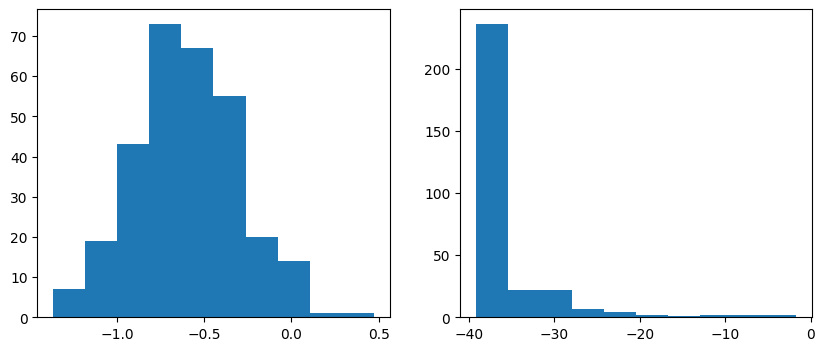

In [235]:
params = {'params': {'Dense_0': {'bias': jnp.array([-0.8606,  4.4855, -0.8462, -0.8642]),
               'kernel': jnp.array([[ -4.2789,  -0.2080,  -6.8360,  11.4825],
                                    [-10.5716,   0.2526,   8.8767,   1.4958]])},
              'Dense_1': {'bias': jnp.array([-1.5668]),
               'kernel': jnp.array([[-3.8124],
                                    [-4.4032],
                                    [-3.8557],
                                    [-3.7599]])},
              'Dense_2': {'bias': jnp.array([-31.1188]),
               'kernel': jnp.array([[-30.7157]])}}
                }

xy_combined = jnp.array([[0.01,0.01]])
params = model3.init(jax.random.PRNGKey(0), xy_combined)

params = {'params': {'Dense_0': {'bias': jnp.array([-0.8588, -0.6090,  0.9606, -0.8571]),
                   'kernel': jnp.array([[ 7.8569, -0.3264, 12.3753,  3.3313],
                                        [-9.3320,  0.3659,  2.3355, 11.2738]])},
                  'Dense_1': {'bias': jnp.array([2.7035]),
                   'kernel': jnp.array([[ 3.9829],
                                        [-5.9108],
                                        [-4.2325],
                                        [ 4.3364]])},
                  'Dense_2': {'bias': jnp.array([-19.6509]),
                   'kernel': jnp.array([[18.5304]])}}
                    }#收敛一半的一组参数

mean_array = reconstruct_dict_to_array(params)
ensemble_members_array = jax.vmap(generate_sample, in_axes=(0, None, None))(keys_ensemble, mean_array, 0.3)
params_list_local = []
for i in range(ensemble_size):
    params_list_local.append(reconstruct_array_to_dict(ensemble_members_array[i],params))

nn_output = np.zeros(ensemble_size)
for i in range(ensemble_size):
    nn_output[i] = model3.apply(params_list_local[i],xy_combined)[0, 0] 
fig,axes = plt.subplots(1,2,figsize=(10,4))
axes[0].hist(ensemble_members_array[:,1])
axes[1].hist(nn_output)

In [1254]:

checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test28/checkpoint_i_10_j_3.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
params_trajectory = checkpoint_data['params_trajectory']

Checkpoint data loaded successfully.


In [1169]:
mean_ori = np.mean(params_trajectory[0],axis=0)
mean_ori_centered = params_trajectory[0] - mean_ori
var_ori = np.cov(mean_ori_centered, rowvar=False)
kld_trajectory1 = np.zeros(ensemble_step)
kld_compare_to_before1 = np.zeros(ensemble_step)
covar_trace_1 = np.zeros(ensemble_step+1)
covar_trace_1[0] = np.trace(var_ori)
mean_current_back = mean_ori
var_current_back = var_ori

for i in range(1,ensemble_step+1):
    mean_current = np.mean(params_trajectory[i],axis=0)
    mean_current_centered = params_trajectory[i] - mean_current
    var_current = np.cov(mean_current_centered, rowvar=False)
    kld_trajectory1[i-1]=kl_divergence(mean_current, var_current, mean_ori, var_ori)
    kld_compare_to_before1[i-1]=kl_divergence(mean_current, var_current, mean_current_back, var_current_back)
    covar_trace_1[i] = np.trace(var_current)
    mean_current_back = mean_current
    var_current_back = var_current 

Text(0.5, 0, 'EKI iterations')

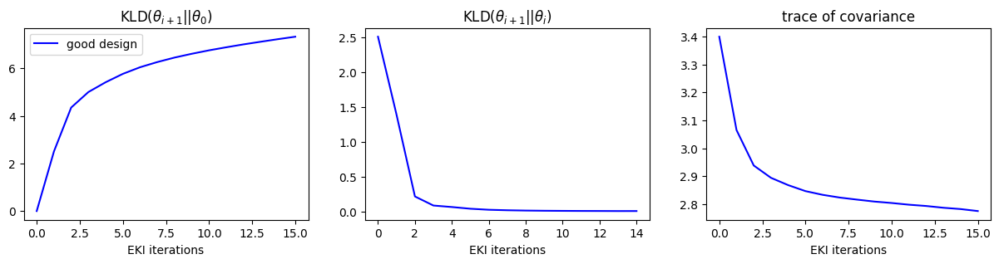

In [1297]:
fig,axes = plt.subplots(1,3,figsize=(15,3))

axes[0].plot(kld_trajectory1,color='b',label='good design')
axes[0].set_title('KLD($\\theta_{i+1}||\\theta_0$)')
axes[0].set_xlabel('EKI iterations')
axes[0].legend()
axes[1].plot(kld_compare_to_before1,color='b')
axes[1].set_title('KLD($\\theta_{i+1}||\\theta_i$)')
axes[1].set_xlabel('EKI iterations')
axes[2].plot(covar_trace_1,color='b')
axes[2].set_title('trace of covariance')
axes[2].set_xlabel('EKI iterations')

In [818]:
condition_number = np.linalg.cond(var_current)
print("条件数:", condition_number)
eigenvalues, _ = np.linalg.eig(var_current)
print("特征值:", eigenvalues)

条件数: 2105.225707704729
特征值: [9.36901535e-01 7.92900271e-01 7.42225713e-01 6.43395285e-01
 5.98352337e-01 5.53521443e-01 4.95200432e-01 4.17594324e-01
 4.09885280e-01 3.67698788e-01 2.95306746e-01 2.54474454e-01
 2.23601800e-01 1.84063791e-01 1.47709253e-01 1.23183945e-01
 8.18776596e-02 5.01456649e-02 2.04076127e-02 8.12545909e-03
 5.72034497e-03 1.72439519e-03 1.37943092e-03 4.45036146e-04
 6.65099913e-04]


In [766]:
np.trace(var_current)

0.007230230581641967

In [767]:
condition_number = np.linalg.cond(var_ori)
print("条件数:", condition_number)
eigenvalues, _ = np.linalg.eig(var_ori)
print("特征值:", eigenvalues)

条件数: 10.194040014511046
特征值: [2.42210524 2.07954803 1.90891859 1.73249721 1.63130804 1.4740929
 1.41037885 1.30418365 1.23756593 0.23760013 1.12869886 1.08463165
 1.05372489 0.28679979 0.33438442 0.37127347 0.43917959 0.50085635
 0.56998873 0.62677455 0.64966243 0.72910366 0.88322459 0.85628197
 0.79298291]


Text(0.5, 0, 'EKI iterations')

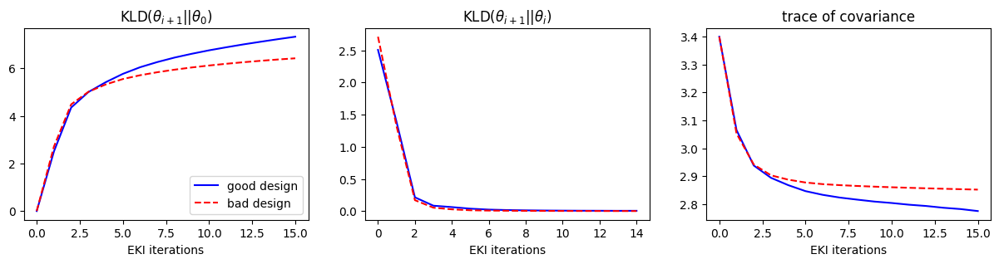

In [1296]:
fig,axes = plt.subplots(1,3,figsize=(15,3))

axes[0].plot(kld_trajectory1,color='b',label='good design')
axes[0].plot(kld_trajectory2,color='r',linestyle='--', label='bad design')
axes[0].set_title('KLD($\\theta_{i+1}||\\theta_0$)')
axes[0].set_xlabel('EKI iterations')
axes[0].legend()
axes[1].plot(kld_compare_to_before1,color='b')
axes[1].plot(kld_compare_to_before2,color='r',linestyle='--')
axes[1].set_title('KLD($\\theta_{i+1}||\\theta_i$)')
axes[1].set_xlabel('EKI iterations')
axes[2].plot(covar_trace_1,color='b')
axes[2].plot(covar_trace_2,color='r',linestyle='--')
axes[2].set_title('trace of covariance')
axes[2].set_xlabel('EKI iterations')

In [285]:
ensemble_size = 300
ensemble_step = 20

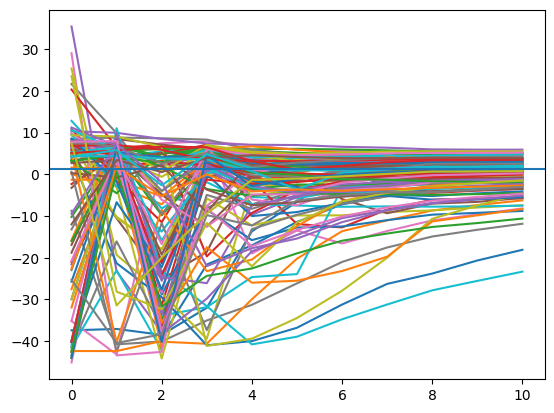

In [824]:
xy_combined = d_start - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)

array_reciprocal1 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent1 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_1 = np.zeros((ensemble_step+1,ensemble_size))

for i in range(ensemble_size):
    for j in range(ensemble_step+1):
        last_params_array = params_trajectory[j,i]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        array_nn = model3.apply(last_params, xy_combined) #* 100.0
        y_at_design = array_nn.squeeze()+array_reciprocal1
        y_at_design_array_1[j,i]=y_at_design
    
    plt.plot(y_at_design_array_1[:,i])

plt.axhline(array_exponent1)
plt.show()

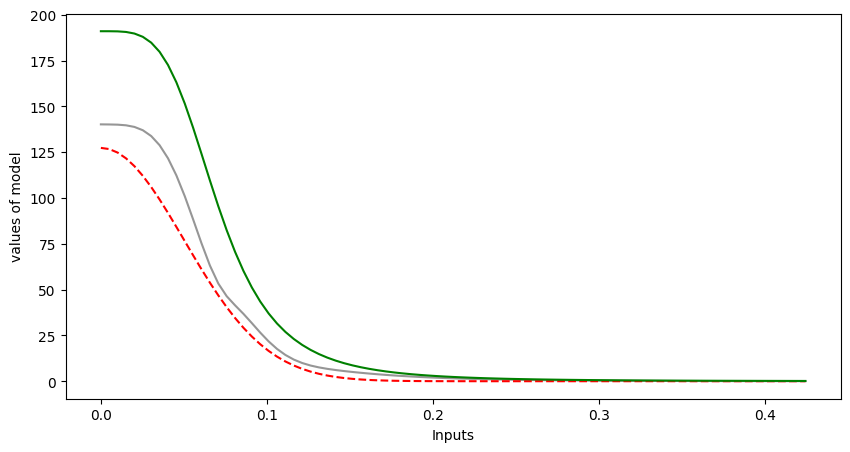

In [825]:
show_nn_trajectory([params], model3, 'Greys', center_x=0, center_y=0, size=85)

Text(0, 0.5, 'counts')

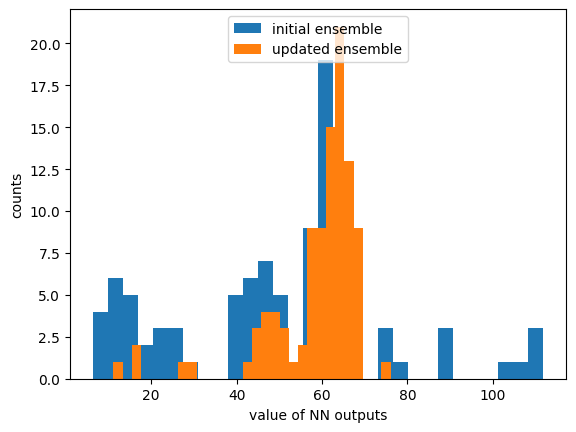

In [728]:
plt.hist(y_at_design_array_1[0,:],bins=30,label='initial ensemble')#,alpha=0.3) #range=(50, 100),
plt.hist(y_at_design_array_1[-1,:],bins=30,label='updated ensemble')#,alpha=0.3)
#plt.axvline(array_exponent1)
plt.legend(loc='upper center')
plt.xlabel('value of NN outputs')
plt.ylabel('counts')

In [775]:
mu_0_design_3_center.shape

(11, 300)

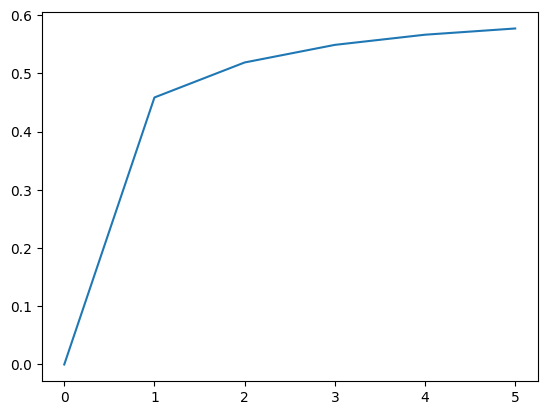

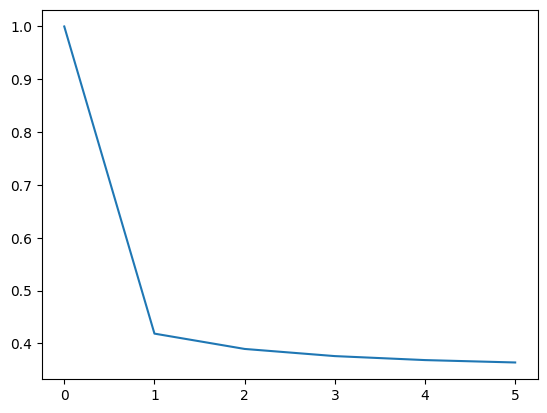

In [20]:
def kl_divergence_1d(mu1, sigma1, mu2, sigma2):
    # 计算KLD
    term1 = jnp.log(sigma2 / sigma1)
    term2 = (sigma1 ** 2 + (mu1 - mu2) ** 2) / (2 * sigma2 ** 2)
    
    # 计算最终的KL散度
    kl_div = term1 + term2 - 0.5
    
    return kl_div
    
mu_0_design_3 = np.mean(y_at_design_array_1,axis=1)
mu_0_design_3_center = y_at_design_array_1 - mu_0_design_3.reshape(-1,1)
sigma_0_design_3 = np.var(mu_0_design_3_center,axis=1)

kld_value_array_design_3 = np.zeros(ensemble_step+1)

for i in range(ensemble_step+1):
    kld_value_array_design_3[i] = kl_divergence_1d(mu_0_design_3[i], sigma_0_design_3[i], mu_0_design_3[0], sigma_0_design_3[0])

plt.plot(kld_value_array_design_3)
plt.show()
plt.plot(sigma_0_design_3/sigma_0_design_3[0])

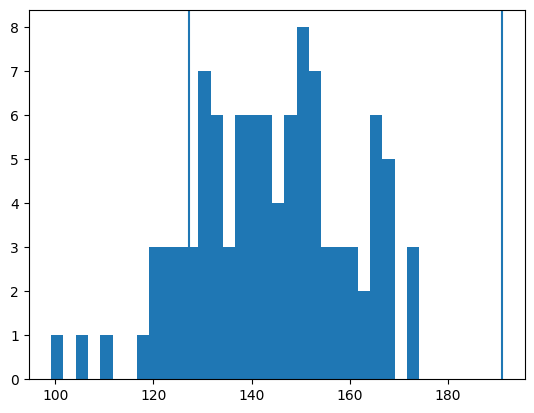

In [341]:
class FullyConnectedNN2(nn.Module):
    @nn.compact
    def __call__(self, x):
        x = nn.Dense(features=8)(x)  # 输入层到隐藏层1，8个节点
        x = nn.tanh(x)  # 激活函数
        x = nn.Dense(features=4)(x)  # 隐藏层1到隐藏层2，4个节点
        x = nn.tanh(x)  # 激活函数
        x = nn.Dense(features=1)(x)  # 隐藏层2到输出层，1个节点
        return x
        
model2 = FullyConnectedNN2()  # 创建模型实例

ensemble_size = 100
ensemble_step = 20

def generate_sample(key, mean, std_dev):
    return mean + std_dev * jax.random.normal(key, shape=mean.shape)

std_dev = 0.1

key_ensemble = jax.random.PRNGKey(3)  # 随机数种子
keys_ensemble = jax.random.split(key_ensemble, ensemble_size)

ensemble_members_array = jax.vmap(generate_sample, in_axes=(0, None, None))(keys_ensemble, mean_array, std_dev )

xy_combined = jnp.array([0,0])#d_start - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)

array_reciprocal1 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent1 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_1 = np.zeros(ensemble_size)

for i in range(ensemble_size):
    last_params_array = ensemble_members_array[i]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    array_nn = model2.apply(last_params, xy_combined) * 70.0
    y_at_design = array_nn.squeeze()+array_reciprocal1
    y_at_design_array_1[i]=y_at_design
    
plt.hist(y_at_design_array_1,bins=30)
plt.axvline(array_exponent1)
plt.axvline(array_reciprocal1)

In [1559]:
ensemble_members_array.shape

(300, 19)

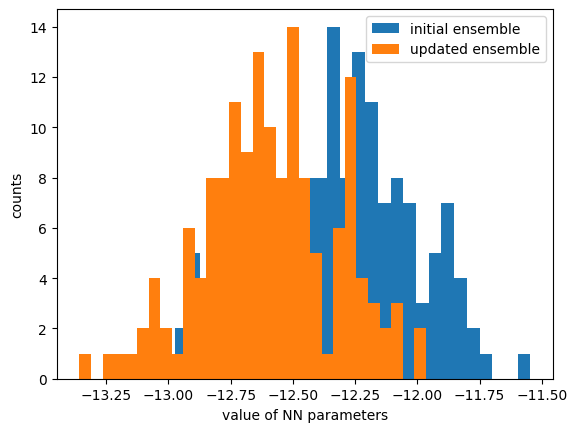

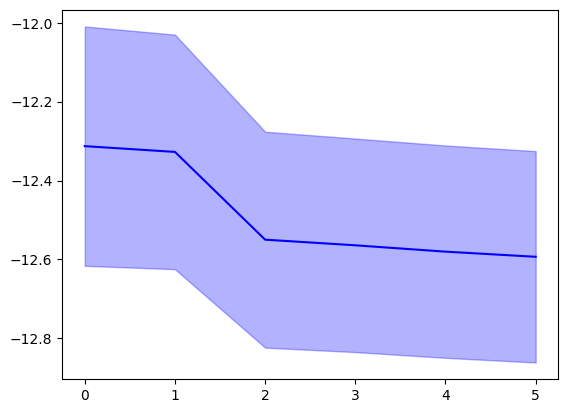

In [1295]:
# 网络参数的输出
parameter_numm = 36

plt.hist(params_trajectory[0,:,parameter_numm],bins=30, label='initial ensemble')
plt.hist(params_trajectory[-1,:,parameter_numm],bins=30, label='updated ensemble')
plt.legend()
plt.xlabel('value of NN parameters')
plt.ylabel('counts')
plt.show()

mean_array = np.zeros(ensemble_step+1)
var_array = np.zeros(ensemble_step+1)
for i in range(ensemble_step+1):
    mean_array[i]=np.mean(params_trajectory[i,:,parameter_numm])
    var_array[i] = np.std(params_trajectory[i,:,parameter_numm])

plt.plot(mean_array,'b')
plt.fill_between(range(ensemble_step+1), mean_array-var_array, mean_array+var_array,color='b',alpha=0.3)

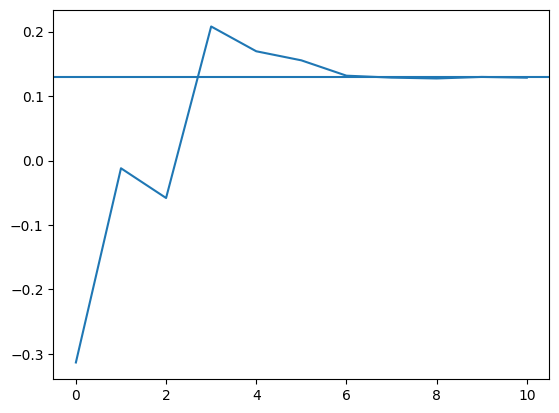

In [827]:
y_fs1 = np.zeros(ensemble_step+1)
for i in range(ensemble_step+1):
    last_params = reconstruct_array_to_dict(params_trajectory[i,10],params)
    y_f, _ = sealed_convection_diffusion_nn(last_params, d_start, estimated_center, stage, model3)
    y_fs1[i]=y_f

plt.plot(y_fs1)
plt.axhline(observation)

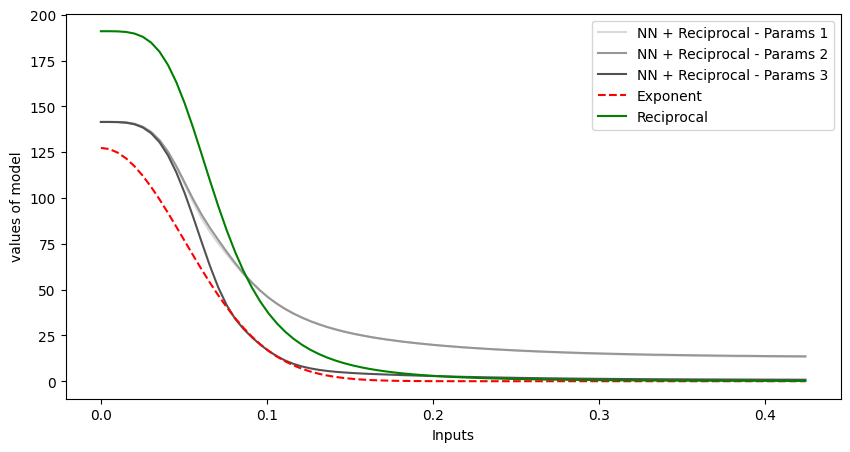

In [1294]:
# 画出所有member平均的初始和更新状态
params1 = reconstruct_array_to_dict(np.mean(params_trajectory[0], axis=0),params)
params2 = reconstruct_array_to_dict(np.mean(params_trajectory[-1], axis=0),params)

show_nn_trajectory([params, params1, params2], model2, 'Greys', center_x=0, center_y=0, size=85)
plt.legend()
plt.show()

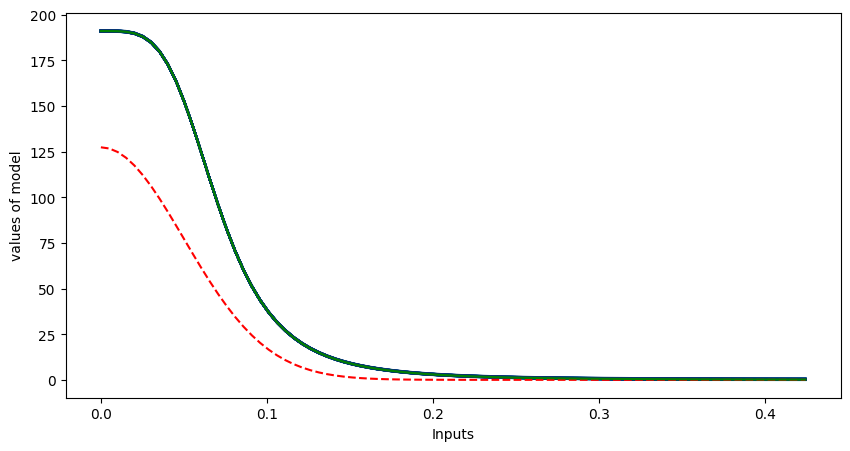

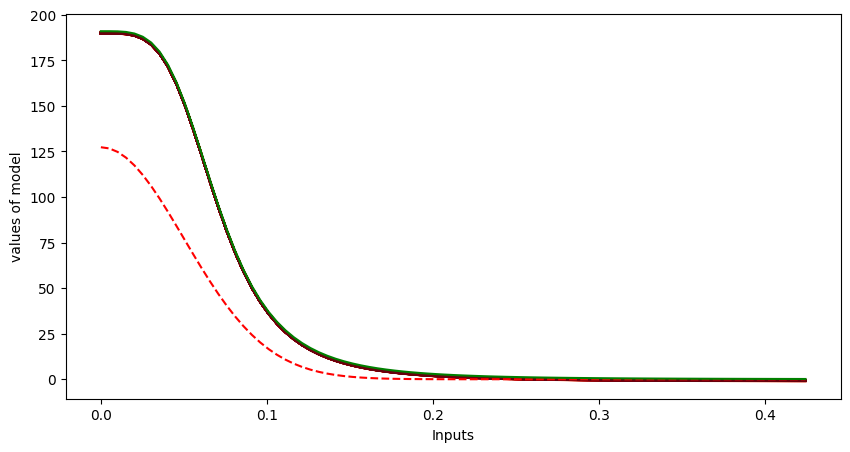

In [93]:
# 画出所有member各自的更新状态
param_local_list = []
for i in range(ensemble_size):
    param_local_list.append(reconstruct_array_to_dict(params_trajectory[0,i],params))

show_nn_trajectory(param_local_list, model3, 'Blues', center_x=0, center_y=0, size=85)

param_local_list = []
for i in range(ensemble_size):
    param_local_list.append(reconstruct_array_to_dict(params_trajectory[-1,i],params))

show_nn_trajectory(param_local_list, model3, 'Reds', center_x=0, center_y=0, size=85)
plt.show()

In [1046]:
# 找到最好的一组解
columns1 = np.where(np.abs(y_at_design_array_1[-1,:]-array_exponent1) < 10)[0]

In [1047]:
columns1

array([18, 25, 31, 32, 36, 51, 72, 86])

In [1053]:
np.sqrt(np.sum(xy_combined**2))

0.05578529

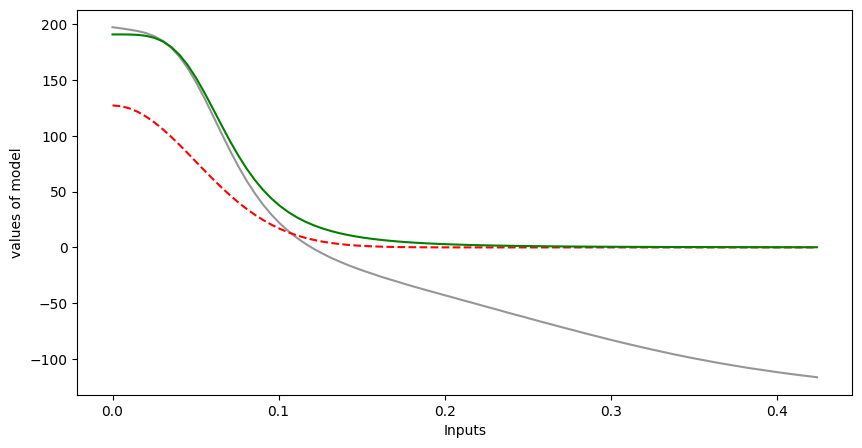

In [1050]:
show_nn_trajectory([reconstruct_array_to_dict(params_trajectory[-1,31],params)], model2, 'Greys', center_x=0, center_y=0, size=85)

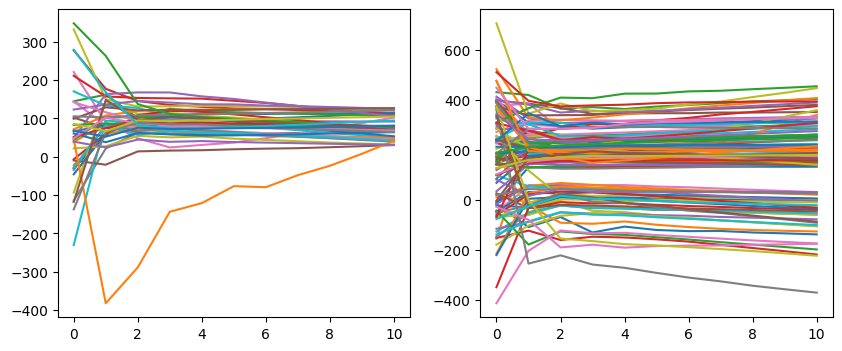

In [618]:
columns1 = np.where(np.abs(y_at_design_array_1[-1,:]-array_exponent1) < 50)[0]
columns2 = np.where(np.abs(y_at_design_array_1[-1,:]-array_exponent1) > 50)[0]

fig, axes = plt.subplots(1,2,figsize=(10,4))

for i in columns1:
    axes[0].plot(y_at_design_array_1[:,i])
    
for i in columns2:
    axes[1].plot(y_at_design_array_1[:,i])

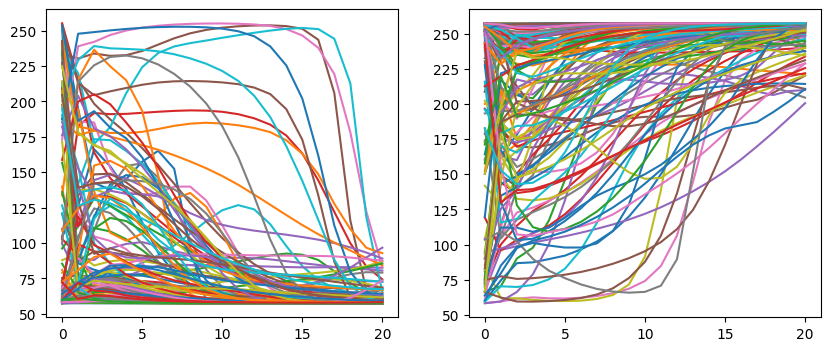

In [496]:
columns1 = np.where(y_at_design_array_1[-1,:] < 100)[0]
columns2 = np.where(y_at_design_array_1[-1,:] > 200)[0]

fig, axes = plt.subplots(1,2,figsize=(10,4))

for i in columns1:
    axes[0].plot(y_at_design_array_1[:,i])
    
for i in columns2:
    axes[1].plot(y_at_design_array_1[:,i])

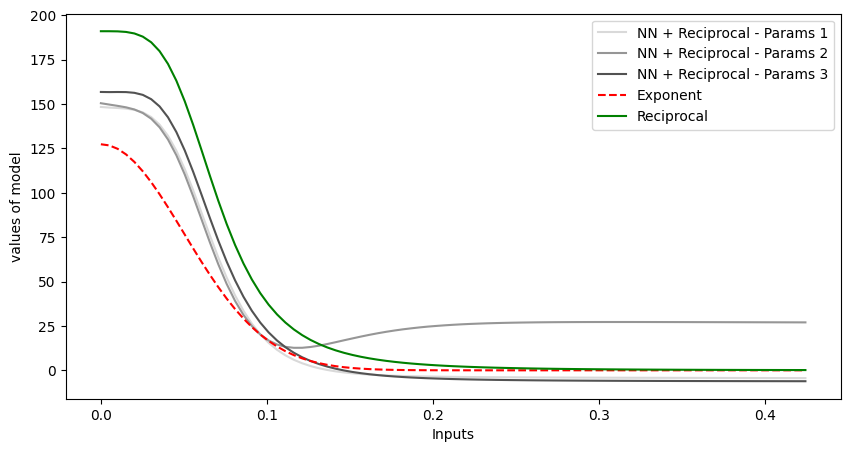

In [619]:

params1 = reconstruct_array_to_dict(np.mean(params_trajectory[0], axis=0),params)
bot_trajectory = params_trajectory[-1,columns1]
params2 = reconstruct_array_to_dict(np.mean(bot_trajectory, axis=0),params)
up_trajectory = params_trajectory[-1,columns2]
params3 = reconstruct_array_to_dict(np.mean(up_trajectory, axis=0),params)

show_nn_trajectory([params1, params2, params3], model, 'Greys', center_x=0, center_y=0, size=85)
plt.legend()

In [ ]:
fig, axes = plt.subplots(1,2,figsize=(10,4))
index_to_plot = 10
axes[0].hist(bot_trajectory[:,index_to_plot],bins=10)
axes[1].hist(up_trajectory[:,index_to_plot],bins=10)

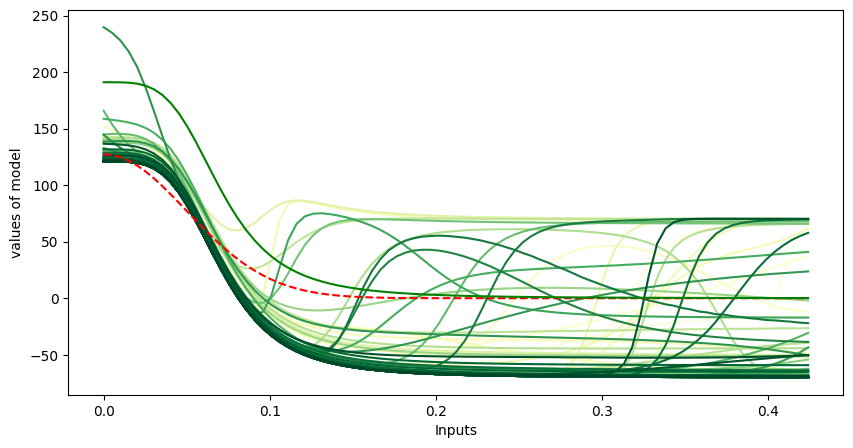

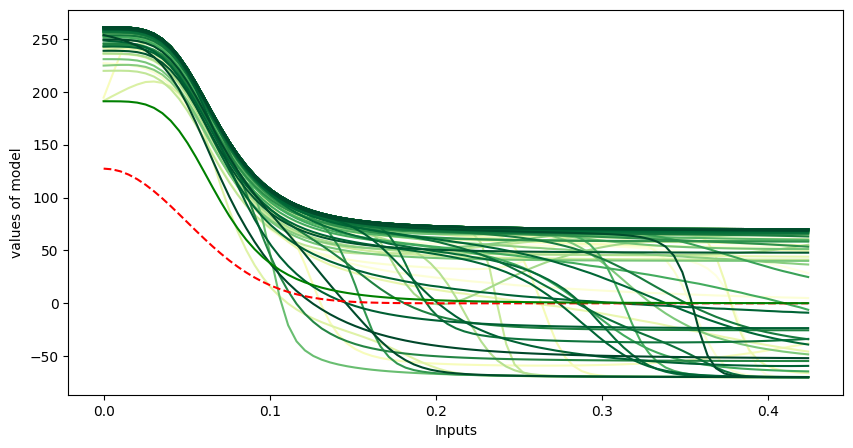

In [498]:
param_local_list = []
for i in columns1:
    param_local_list.append(reconstruct_array_to_dict(params_trajectory[-1,i],params))

show_nn_trajectory(param_local_list, model, 'YlGn', center_x=0, center_y=0, size=85)
plt.show()

param_local_list = []
for i in columns2:
    param_local_list.append(reconstruct_array_to_dict(params_trajectory[-1,i],params))

show_nn_trajectory(param_local_list, model, 'YlGn', center_x=0, center_y=0, size=85)

In [1304]:
# 比较好坏design

import os
import pickle

checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test53/checkpoint_i_15_j_0.pkl'
#checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test27/checkpoint_i_10_j_3.pkl'
#checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test11/checkpoint_i_20_j_0.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
result_matrix_design_1 = checkpoint_data['params_trajectory']

checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test53/checkpoint_i_15_j_1.pkl'
#checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test27/checkpoint_i_10_j_4.pkl'
#checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test11/checkpoint_i_20_j_2.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

result_matrix_design_2 = checkpoint_data['params_trajectory']

checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test52/checkpoint_i_15_j_2.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

result_matrix_design_3 = checkpoint_data['params_trajectory']


checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test52/checkpoint_i_15_j_3.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

result_matrix_design_4 = checkpoint_data['params_trajectory']


checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test53/checkpoint_i_15_j_4.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

result_matrix_design_5 = checkpoint_data['params_trajectory']


checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test53/checkpoint_i_15_j_5.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

result_matrix_design_6 = checkpoint_data['params_trajectory']


checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test52/checkpoint_i_15_j_6.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

result_matrix_design_7 = checkpoint_data['params_trajectory']



checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test52/checkpoint_i_15_j_7.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

result_matrix_design_8 = checkpoint_data['params_trajectory']



checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test52/checkpoint_i_15_j_8.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

result_matrix_design_9 = checkpoint_data['params_trajectory']

Checkpoint data loaded successfully.
Checkpoint data loaded successfully.
Checkpoint data loaded successfully.
Checkpoint data loaded successfully.
Checkpoint data loaded successfully.
Checkpoint data loaded successfully.
Checkpoint data loaded successfully.
Checkpoint data loaded successfully.
Checkpoint data loaded successfully.


In [1529]:
#checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test56/checkpoint_i_5_j_6.pkl'
checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test52/checkpoint_i_15_j_6.pkl'
#checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test52/checkpoint_i_15_j_3.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

result_matrix_design_7 = checkpoint_data['params_trajectory']



#checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test56/checkpoint_i_5_j_4.pkl'
checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test52/checkpoint_i_15_j_4.pkl'
#checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test52/checkpoint_i_15_j_5.pkl' 

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

result_matrix_design_5 = checkpoint_data['params_trajectory']

Checkpoint data loaded successfully.
Checkpoint data loaded successfully.


In [1530]:
result_matrix_design_5.shape

(16, 150, 37)

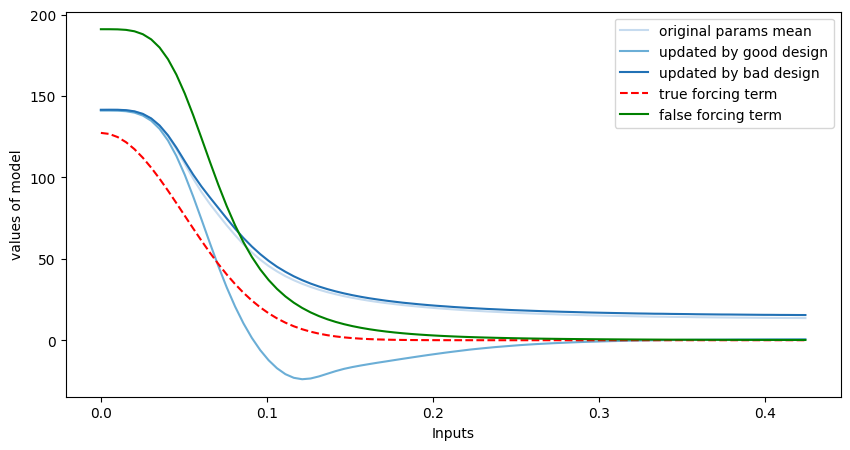

In [1531]:

params5 = reconstruct_array_to_dict(np.mean(result_matrix_design_5[-1], axis=0),params)
params7 = reconstruct_array_to_dict(np.mean(result_matrix_design_7[-1], axis=0),params)
show_nn_trajectory([params0,params5, params7], model2, 'Blues', center_x=0, center_y=0, size=85)
plt.legend()

leg = plt.gca().get_legend()

new_labels = ['original params mean', 'updated by good design', 'updated by bad design', 'true forcing term', 'false forcing term']

for text, new_label in zip(leg.get_texts(), new_labels):
    text.set_text(new_label)

plt.draw()

In [1532]:
u_t = sealed_convection_diffusion_true(d_start4, center, stage)[1][100:151,100:151]
u_design_5 = sealed_convection_diffusion_nn(params5, d_start4, estimated_center, stage, model2)[1][100:151,100:151]
u_design_7 = sealed_convection_diffusion_nn(params7, d_start4, estimated_center, stage, model2)[1][100:151,100:151]
np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_7)**2)

(187.13322, 1568.4109)

Text(0, 0.5, 'y')

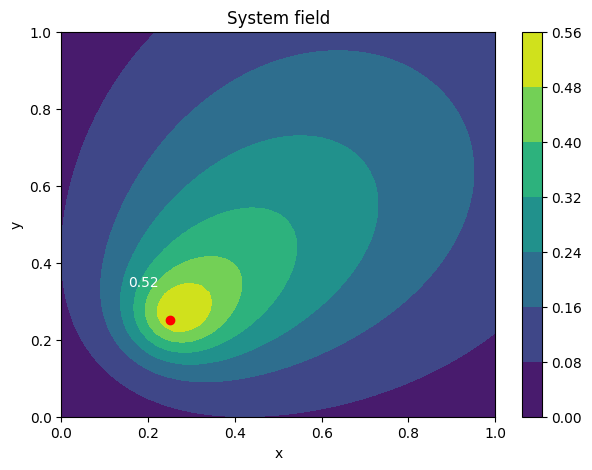

In [1526]:
plt.figure(figsize=(7,5))
plt.contourf(u_t)
original_ticks = np.linspace(0, 50, 6)  # 原来的刻度
new_ticks = original_ticks / 50  # 显示为0到0.5的比例

plt.xticks(original_ticks, new_ticks)
plt.yticks(original_ticks, new_ticks)

plt.colorbar()

# 创建网格，假设 x 和 y 都是 0 到 50 的均匀分布
x = np.linspace(0, 50, 51)
y = np.linspace(0, 50, 51)

# 使用 RegularGridInterpolator 进行插值
interpolator = RegularGridInterpolator((y, x), u_t)

# 插值点 (12.5, 12.5)
point = [12.5, 12.5]
point_value = interpolator(point)  # 进行插值

original_ticks = np.linspace(0, 50, 6)  # 原来的刻度
new_ticks = original_ticks / 50  # 显示为0到0.5的比例

plt.xticks(original_ticks, new_ticks)
plt.yticks(original_ticks, new_ticks)

# 将插值点标记在图上，并标注数值
plt.scatter(point[0], point[1], color='red')  # 标记插值点的坐标
plt.text(point[0]-3, point[1]+5, f'{point_value[0]:.2f}', color='white', ha='center', va='center')

plt.title('System field')
plt.xlabel('x')
plt.ylabel('y')

Text(0, 0.5, 'y')

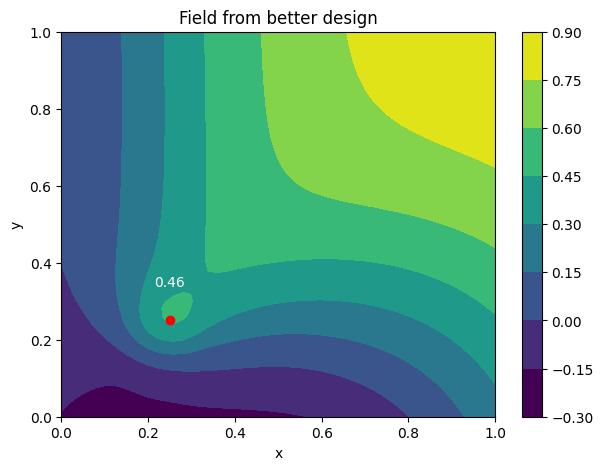

In [1527]:
from scipy.interpolate import RegularGridInterpolator

plt.figure(figsize=(7,5))
contour = plt.contourf(u_design_5, vmin=u_design_5.min(), vmax=u_design_5.max())
original_ticks = np.linspace(0, 50, 6)  # 原来的刻度
new_ticks = original_ticks / 50  # 显示为0到0.5的比例

plt.xticks(original_ticks, new_ticks)
plt.yticks(original_ticks, new_ticks)

x = np.linspace(0, 50, 51)
y = np.linspace(0, 50, 51)

# 使用 RegularGridInterpolator 进行插值
interpolator = RegularGridInterpolator((y, x), u_design_5)

# 插值点 (12.5, 12.5)
point = [12.5, 12.5]
point_value = interpolator(point)  # 进行插值

original_ticks = np.linspace(0, 50, 6)  # 原来的刻度
new_ticks = original_ticks / 50  # 显示为0到0.5的比例

plt.xticks(original_ticks, new_ticks)
plt.yticks(original_ticks, new_ticks)

# 将插值点标记在图上，并标注数值
plt.scatter(point[0], point[1], color='red')  # 标记插值点的坐标
plt.text(point[0], point[1]+5, f'{point_value[0]:.2f}', color='white', ha='center', va='center')

plt.colorbar(contour)

plt.title('Field from better design')
plt.xlabel('x')
plt.ylabel('y')

Text(0, 0.5, 'y')

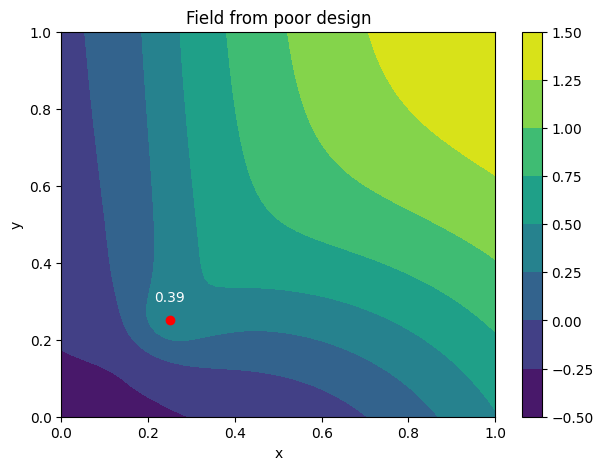

In [1528]:
plt.figure(figsize=(7,5))
contour = plt.contourf(u_design_7)
original_ticks = np.linspace(0, 50, 6)  # 原来的刻度
new_ticks = original_ticks / 50  # 显示为0到0.5的比例

plt.xticks(original_ticks, new_ticks)
plt.yticks(original_ticks, new_ticks)

x = np.linspace(0, 50, 51)
y = np.linspace(0, 50, 51)

# 使用 RegularGridInterpolator 进行插值
interpolator = RegularGridInterpolator((y, x), u_design_7)

# 插值点 (12.5, 12.5)
point = [12.5, 12.5]
point_value = interpolator(point)  # 进行插值

original_ticks = np.linspace(0, 50, 6)  # 原来的刻度
new_ticks = original_ticks / 50  # 显示为0到0.5的比例

plt.xticks(original_ticks, new_ticks)
plt.yticks(original_ticks, new_ticks)

# 将插值点标记在图上，并标注数值
plt.scatter(point[0], point[1], color='red')  # 标记插值点的坐标
plt.text(point[0], point[1]+3, f'{point_value[0]:.2f}', color='white', ha='center', va='center')


plt.colorbar(contour)


plt.title('Field from poor design')
plt.xlabel('x')
plt.ylabel('y')

In [1488]:
u_t = sealed_convection_diffusion_true(d_start4, center, stage)[1][100:125,100:125]
u_design_5 = sealed_convection_diffusion_nn(params5, d_start4, estimated_center, stage, model2)[1][100:125,100:125]
u_design_7 = sealed_convection_diffusion_nn(params7, d_start4, estimated_center, stage, model2)[1][100:125,100:125]
np.sum((u_t - u_design_5)**2),np.sum((u_t - u_design_7)**2)

(11.806443, 30.092316)

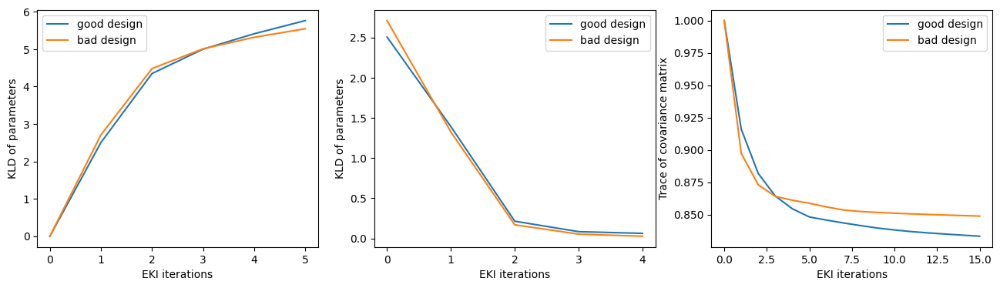

In [1504]:
ensemble_step = 15

mean_ori = np.mean(result_matrix_design_5[0],axis=0)
mean_ori_centered = result_matrix_design_5[0] - mean_ori
var_ori = np.cov(mean_ori_centered, rowvar=False)
kld_trajectory5 = np.zeros(ensemble_step+1)
kld_trajectory5[0] = kl_divergence(mean_ori, var_ori, mean_ori, var_ori)
kld_compare_to_before5 = np.zeros(ensemble_step)
mean_current_back = mean_ori
var_current_back = var_ori
covar_trace_5 = np.zeros(ensemble_step+1)
covar_trace_5[0] = np.trace(var_ori)

for i in range(1,ensemble_step+1):
    mean_current = np.mean(result_matrix_design_5[i],axis=0)
    mean_current_centered = result_matrix_design_5[i] - mean_current
    var_current = np.cov(mean_current_centered, rowvar=False)
    kld_trajectory5[i]=kl_divergence(mean_current, var_current, mean_ori, var_ori)
    kld_compare_to_before5[i-1]=kl_divergence(mean_current, var_current, mean_current_back, var_current_back)
    covar_trace_5[i] = np.trace(var_current)
    mean_current_back = mean_current
    var_current_back = var_current 


mean_ori = np.mean(result_matrix_design_7[0],axis=0)
mean_ori_centered = result_matrix_design_7[0] - mean_ori
var_ori = np.cov(mean_ori_centered, rowvar=False)
kld_trajectory7 = np.zeros(ensemble_step+1)
kld_trajectory7[0] = kl_divergence(mean_ori, var_ori, mean_ori, var_ori)
kld_compare_to_before7 = np.zeros(ensemble_step)
mean_current_back = mean_ori
var_current_back = var_ori
covar_trace_7 = np.zeros(ensemble_step+1)
covar_trace_7[0] = np.trace(var_ori)

for i in range(1,ensemble_step+1):
    mean_current = np.mean(result_matrix_design_7[i],axis=0)
    mean_current_centered = result_matrix_design_7[i] - mean_current
    var_current = np.cov(mean_current_centered, rowvar=False)
    kld_trajectory7[i]=kl_divergence(mean_current, var_current, mean_ori, var_ori)
    kld_compare_to_before7[i-1]=kl_divergence(mean_current, var_current, mean_current_back, var_current_back)
    covar_trace_7[i] = np.trace(var_current)
    mean_current_back = mean_current
    var_current_back = var_current 


fig, axes = plt.subplots(1,3,figsize=(16,4))

axes[0].plot(kld_trajectory1, label = 'good design')
axes[0].plot(kld_trajectory2, label = 'bad design')
axes[0].set_xlabel('EKI iterations')
axes[0].set_ylabel('KLD of parameters')
axes[0].legend()

axes[1].plot(kld_compare_to_before1, label = 'good design')
axes[1].plot(kld_compare_to_before2, label = 'bad design')
axes[1].set_xlabel('EKI iterations')
axes[1].set_ylabel('KLD of parameters')
axes[1].legend()

axes[2].plot(covar_trace_5/covar_trace_5[0], label = 'good design')
axes[2].plot(covar_trace_7/covar_trace_7[0], label = 'bad design')
axes[2].set_xlabel('EKI iterations')
axes[2].set_ylabel('Trace of covariance matrix')
axes[2].legend()

Text(0.5, 0, 'EKI iterations')

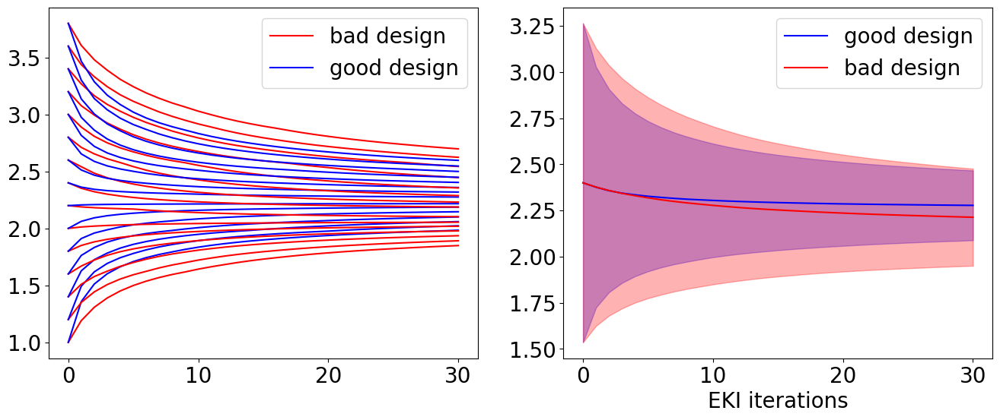

In [1536]:
# 加载 .npz 文件
data = np.load('simplecase_EnKF_params_trajectories_stage_3.npz')

# 访问保存的数组
params_trajectory_bad_design = data['bad']
params_trajectory_good_design = data['good']

font_size = 20


plt.rc('font', size=font_size)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
for i in range(15):
    axes[0].plot(params_trajectory_bad_design[:,i],color='r',label='bad design')
    axes[0].plot(params_trajectory_good_design[:,i],color='b',label='good design')
    if i==0:
        axes[0].legend()

mean_values_bad_design = np.mean(params_trajectory_bad_design, axis=1)
variance_values_bad_design = np.var(params_trajectory_bad_design, axis=1)
mean_values_good_design = np.mean(params_trajectory_good_design, axis=1)
variance_values_good_design = np.var(params_trajectory_good_design, axis=1)

axes[1].plot(mean_values_good_design,color='b',label='good design')
axes[1].fill_between(range(30+1),mean_values_good_design+np.sqrt(variance_values_good_design),mean_values_good_design-np.sqrt(variance_values_good_design),color='b',alpha=0.3)
axes[1].plot(mean_values_bad_design,color='r',label='bad design')
axes[1].fill_between(range(30+1),mean_values_bad_design+np.sqrt(variance_values_bad_design),mean_values_bad_design-np.sqrt(variance_values_bad_design),color='r',alpha=0.3)
axes[1].legend(fontsize=font_size)
axes[1].set_xlabel('EKI iterations')

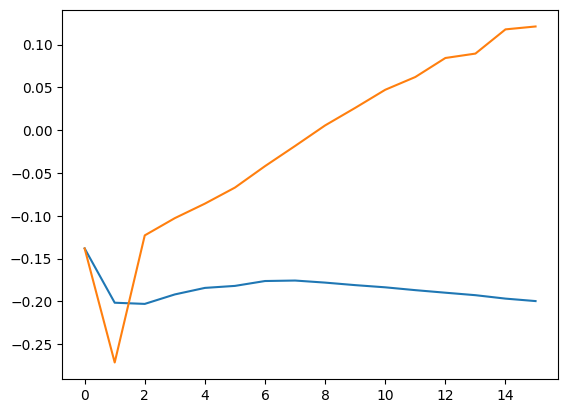

In [1174]:
plt.plot(result_matrix_design_1[:,3,0])
plt.plot(result_matrix_design_2[:,3,0])

In [620]:
result_matrix_design_1.shape

(6, 100, 25)

In [605]:
mean_array, var_array

(Array([ -0.1886,   0.4711,   0.5712,  -9.2241,   6.9714, -11.467 ,
          3.5435, -11.0926,  11.3329,  -0.5759,   0.0759,  -0.4726,
         -9.666 ,  -2.982 ,  -7.3246, -11.2565,  -5.8581,  -0.5165,
         -3.6227,  -3.7403,   5.1368,  -1.5925,  12.6298,   8.2256,
        -19.7482], dtype=float32),
 array([0.00939808, 0.00814497, 0.00809154, 0.00805299, 0.00802916,
        0.00800102]))

In [606]:
result_matrix_design_1 = params_trajectory

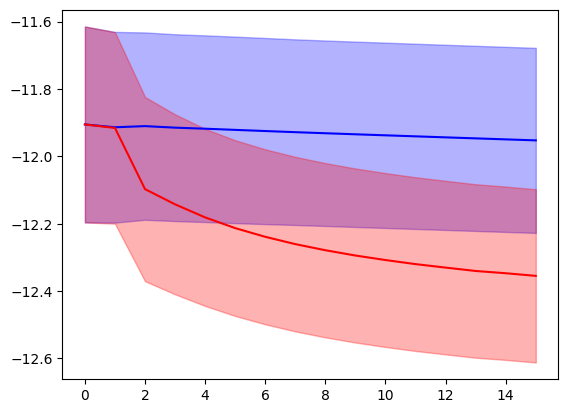

In [1175]:
parameter_numm = 34
mean_array = np.zeros(ensemble_step+1)
var_array = np.zeros(ensemble_step+1)
for i in range(ensemble_step+1):
    mean_array[i]=np.mean(result_matrix_design_1[i,:,parameter_numm])
    var_array[i] = np.std(result_matrix_design_1[i,:,parameter_numm])

plt.plot(mean_array,'b')
plt.fill_between(range(ensemble_step+1), mean_array-var_array, mean_array+var_array,color='b',alpha=0.3)


for i in range(ensemble_step+1):
    mean_array[i]=np.mean(result_matrix_design_2[i,:,parameter_numm])
    var_array[i] = np.std(result_matrix_design_2[i,:,parameter_numm])

plt.plot(mean_array,'r')
plt.fill_between(range(ensemble_step+1), mean_array-var_array, mean_array+var_array,color='r',alpha=0.3)

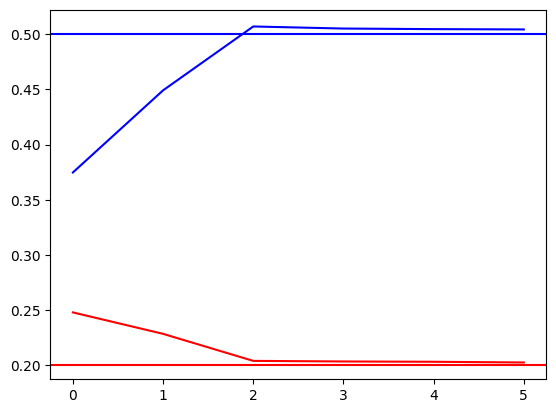

In [1149]:
y_fs1 = np.zeros(ensemble_step+1)
for i in range(ensemble_step+1):
    last_params = reconstruct_array_to_dict(result_matrix_design_1[i,10],params)
    y_f, _ = sealed_convection_diffusion_nn(last_params, d_start4, estimated_center, stage, model2)
    y_fs1[i]=y_f
    
observation, _ = sealed_convection_diffusion_true(d_start4, center, stage)
plt.plot(y_fs1,'b')
plt.axhline(observation,color='b')

y_fs1 = np.zeros(ensemble_step+1)
for i in range(ensemble_step+1):
    last_params = reconstruct_array_to_dict(result_matrix_design_2[i,10],params)
    y_f, _ = sealed_convection_diffusion_nn(last_params, d_start5, estimated_center, stage, model2)
    y_fs1[i]=y_f
    
observation, _ = sealed_convection_diffusion_true(d_start5, center, stage)
plt.plot(y_fs1,'r')
plt.axhline(observation,color='r')

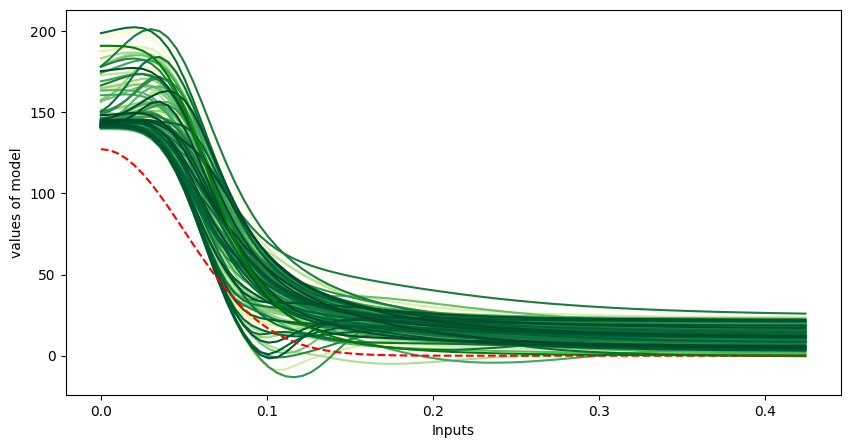

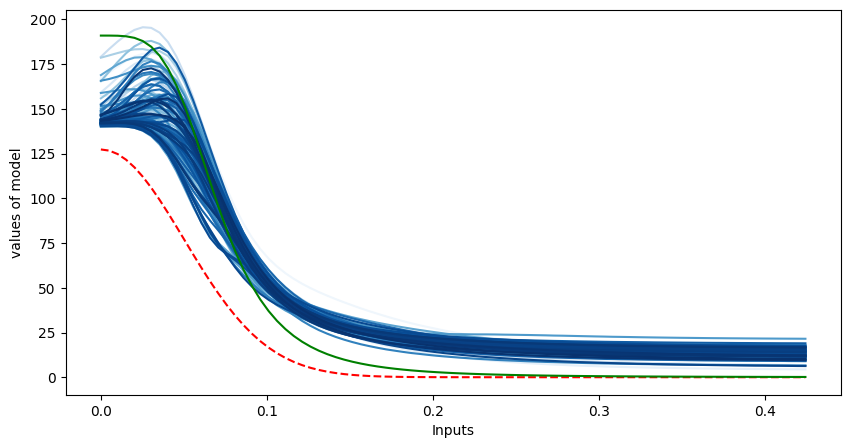

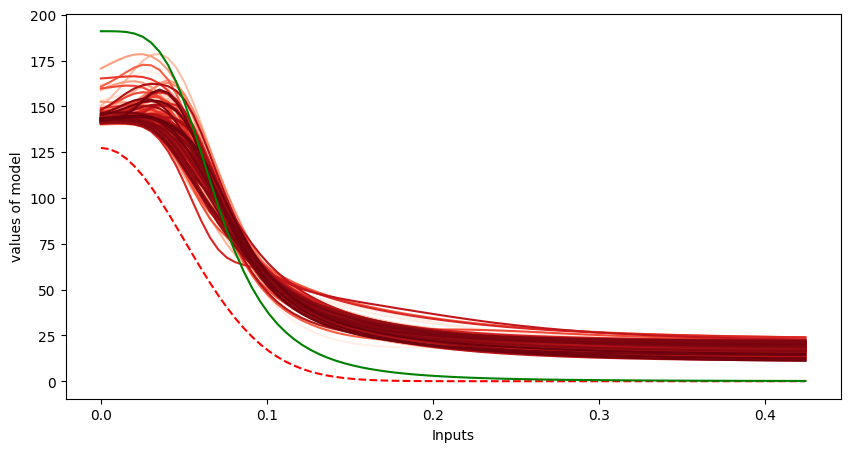

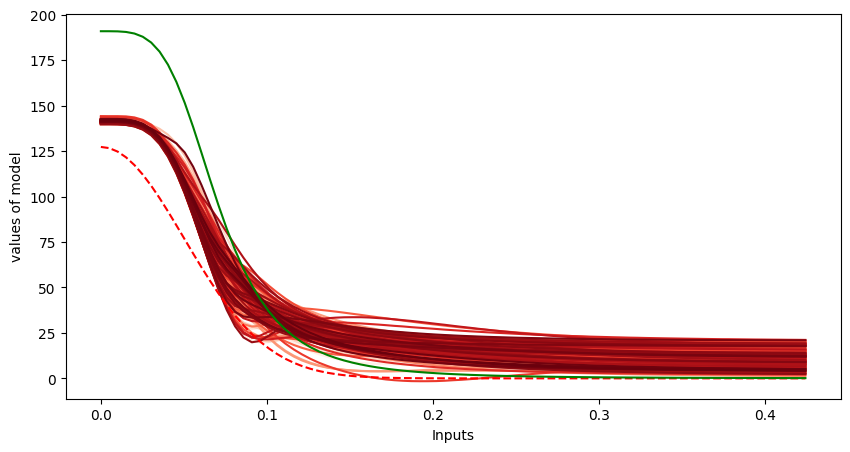

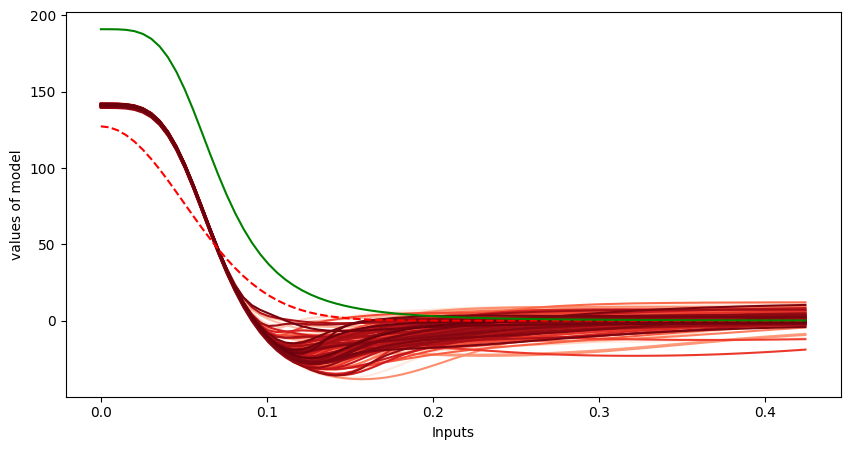

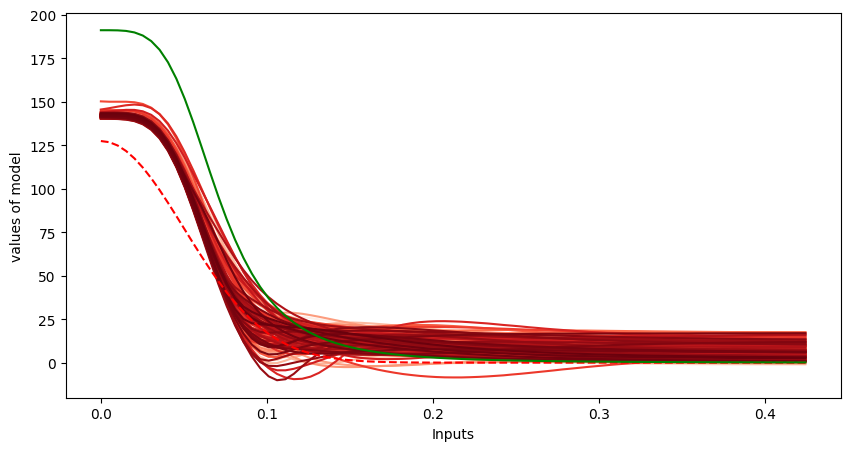

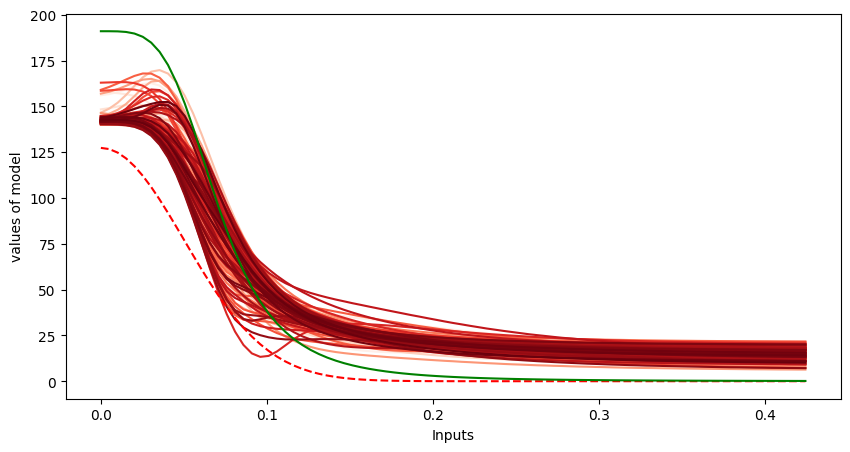

In [1178]:
param_local_list = []
for i in range(ensemble_size):
    param_local_list.append(reconstruct_array_to_dict(result_matrix_design_1[0,i],params))

show_nn_trajectory(param_local_list, model2, 'YlGn', center_x=0, center_y=0, size=85)
plt.show()

param_local_list = []
for i in range(ensemble_size):
    param_local_list.append(reconstruct_array_to_dict(result_matrix_design_2[-1,i],params))

show_nn_trajectory(param_local_list, model2, 'Blues', center_x=0, center_y=0, size=85)

param_local_list = []
for i in range(ensemble_size):
    param_local_list.append(reconstruct_array_to_dict(result_matrix_design_3[-1,i],params))

show_nn_trajectory(param_local_list, model2, 'Reds', center_x=0, center_y=0, size=85)
param_local_list = []
for i in range(ensemble_size):
    param_local_list.append(reconstruct_array_to_dict(result_matrix_design_4[-1,i],params))

show_nn_trajectory(param_local_list, model2, 'Reds', center_x=0, center_y=0, size=85)
param_local_list = []
for i in range(ensemble_size):
    param_local_list.append(reconstruct_array_to_dict(result_matrix_design_5[-1,i],params))

show_nn_trajectory(param_local_list, model2, 'Reds', center_x=0, center_y=0, size=85)
param_local_list = []
for i in range(ensemble_size):
    param_local_list.append(reconstruct_array_to_dict(result_matrix_design_6[-1,i],params))

show_nn_trajectory(param_local_list, model2, 'Reds', center_x=0, center_y=0, size=85)
param_local_list = []
for i in range(ensemble_size):
    param_local_list.append(reconstruct_array_to_dict(result_matrix_design_7[-1,i],params))

show_nn_trajectory(param_local_list, model2, 'Reds', center_x=0, center_y=0, size=85)

In [ ]:
ensemble_size = 100
ensemble_step = 5

def kl_divergence(mu1, sigma1, mu2, sigma2):
    # 计算逆矩阵和行列式
    sigma2_inv = jnp.linalg.inv(sigma2)
    #sigma1_det = jnp.linalg.det(sigma1)
    #sigma2_det = jnp.linalg.det(sigma2)
    
    # 计算各项
    term1 = jnp.trace(sigma2_inv @ sigma1)
    term2 = (mu2 - mu1).T @ sigma2_inv @ (mu2 - mu1)
    
    _, logdet_sigma1 = jnp.linalg.slogdet(sigma1)
    _, logdet_sigma2 = jnp.linalg.slogdet(sigma2)
    term3 = logdet_sigma2 - logdet_sigma1
    #term3 = jnp.log(sigma2_det / sigma1_det)
    
    # 计算最终的KL散度
    kl_div = 0.5 * (term1 + term2 - len(mu1) + term3)
    
    return kl_div

mean_ori = np.mean(result_matrix_design_1[0],axis=0)
mean_ori_centered = result_matrix_design_1[0] - mean_ori
var_ori = np.cov(mean_ori_centered, rowvar=False)
kld_trajectory1 = np.zeros(ensemble_step+1)
kld_trajectory1[0] = kl_divergence(mean_ori, var_ori, mean_ori, var_ori)
kld_compare_to_before1 = np.zeros(ensemble_step)
mean_current_back = mean_ori
var_current_back = var_ori
covar_trace_1 = np.zeros(ensemble_step+1)
covar_trace_1[0] = np.trace(var_ori)

for i in range(1,ensemble_step+1):
    mean_current = np.mean(result_matrix_design_1[i],axis=0)
    mean_current_centered = result_matrix_design_1[i] - mean_current
    var_current = np.cov(mean_current_centered, rowvar=False)
    kld_trajectory1[i]=kl_divergence(mean_current, var_current, mean_ori, var_ori)
    kld_compare_to_before1[i-1]=kl_divergence(mean_current, var_current, mean_current_back, var_current_back)
    covar_trace_1[i] = np.trace(var_current)
    mean_current_back = mean_current
    var_current_back = var_current 
    
mean_ori = np.mean(result_matrix_design_2[0],axis=0)
mean_ori_centered = result_matrix_design_2[0] - mean_ori
var_ori = np.cov(mean_ori_centered, rowvar=False)
kld_trajectory2 = np.zeros(ensemble_step+1)
kld_trajectory2[0] = kl_divergence(mean_ori, var_ori, mean_ori, var_ori)
kld_compare_to_before2 = np.zeros(ensemble_step)
mean_current_back = mean_ori
var_current_back = var_ori
covar_trace_2 = np.zeros(ensemble_step+1)
covar_trace_2[0] = np.trace(var_ori)

for i in range(1,ensemble_step+1):
    mean_current = np.mean(result_matrix_design_2[i],axis=0)
    mean_current_centered = result_matrix_design_2[i] - mean_current
    var_current = np.cov(mean_current_centered, rowvar=False)
    kld_trajectory2[i]=kl_divergence(mean_current, var_current, mean_ori, var_ori)
    kld_compare_to_before2[i-1]=kl_divergence(mean_current, var_current, mean_current_back, var_current_back)
    covar_trace_2[i] = np.trace(var_current)
    mean_current_back = mean_current
    var_current_back = var_current 

mean_ori = np.mean(result_matrix_design_3[0],axis=0)
mean_ori_centered = result_matrix_design_3[0] - mean_ori
var_ori = np.cov(mean_ori_centered, rowvar=False)
kld_trajectory3 = np.zeros(ensemble_step+1)
kld_trajectory3[0] = kl_divergence(mean_ori, var_ori, mean_ori, var_ori)
kld_compare_to_before3 = np.zeros(ensemble_step)
mean_current_back = mean_ori
var_current_back = var_ori
covar_trace_3 = np.zeros(ensemble_step+1)
covar_trace_3[0] = np.trace(var_ori)

for i in range(1,ensemble_step+1):
    mean_current = np.mean(result_matrix_design_3[i],axis=0)
    mean_current_centered = result_matrix_design_3[i] - mean_current
    var_current = np.cov(mean_current_centered, rowvar=False)
    kld_trajectory3[i]=kl_divergence(mean_current, var_current, mean_ori, var_ori)
    kld_compare_to_before3[i-1]=kl_divergence(mean_current, var_current, mean_current_back, var_current_back)
    covar_trace_3[i] = np.trace(var_current)
    mean_current_back = mean_current
    var_current_back = var_current 

mean_ori = np.mean(result_matrix_design_4[0],axis=0)
mean_ori_centered = result_matrix_design_4[0] - mean_ori
var_ori = np.cov(mean_ori_centered, rowvar=False)
kld_trajectory4 = np.zeros(ensemble_step+1)
kld_trajectory4[0] = kl_divergence(mean_ori, var_ori, mean_ori, var_ori)
kld_compare_to_before4 = np.zeros(ensemble_step)
mean_current_back = mean_ori
var_current_back = var_ori
covar_trace_4 = np.zeros(ensemble_step+1)
covar_trace_4[0] = np.trace(var_ori)

for i in range(1,ensemble_step+1):
    mean_current = np.mean(result_matrix_design_4[i],axis=0)
    mean_current_centered = result_matrix_design_4[i] - mean_current
    var_current = np.cov(mean_current_centered, rowvar=False)
    kld_trajectory4[i]=kl_divergence(mean_current, var_current, mean_ori, var_ori)
    kld_compare_to_before4[i-1]=kl_divergence(mean_current, var_current, mean_current_back, var_current_back)
    covar_trace_4[i] = np.trace(var_current)
    mean_current_back = mean_current
    var_current_back = var_current 

mean_ori = np.mean(result_matrix_design_5[0],axis=0)
mean_ori_centered = result_matrix_design_5[0] - mean_ori
var_ori = np.cov(mean_ori_centered, rowvar=False)
kld_trajectory5 = np.zeros(ensemble_step+1)
kld_trajectory5[0] = kl_divergence(mean_ori, var_ori, mean_ori, var_ori)
kld_compare_to_before5 = np.zeros(ensemble_step)
mean_current_back = mean_ori
var_current_back = var_ori
covar_trace_5 = np.zeros(ensemble_step+1)
covar_trace_5[0] = np.trace(var_ori)

for i in range(1,ensemble_step+1):
    mean_current = np.mean(result_matrix_design_5[i],axis=0)
    mean_current_centered = result_matrix_design_5[i] - mean_current
    var_current = np.cov(mean_current_centered, rowvar=False)
    kld_trajectory5[i]=kl_divergence(mean_current, var_current, mean_ori, var_ori)
    kld_compare_to_before5[i-1]=kl_divergence(mean_current, var_current, mean_current_back, var_current_back)
    covar_trace_5[i] = np.trace(var_current)
    mean_current_back = mean_current
    var_current_back = var_current 

mean_ori = np.mean(result_matrix_design_6[0],axis=0)
mean_ori_centered = result_matrix_design_6[0] - mean_ori
var_ori = np.cov(mean_ori_centered, rowvar=False)
kld_trajectory6 = np.zeros(ensemble_step+1)
kld_trajectory6[0] = kl_divergence(mean_ori, var_ori, mean_ori, var_ori)
kld_compare_to_before6 = np.zeros(ensemble_step)
mean_current_back = mean_ori
var_current_back = var_ori
covar_trace_6 = np.zeros(ensemble_step+1)
covar_trace_6[0] = np.trace(var_ori)

for i in range(1,ensemble_step+1):
    mean_current = np.mean(result_matrix_design_6[i],axis=0)
    mean_current_centered = result_matrix_design_6[i] - mean_current
    var_current = np.cov(mean_current_centered, rowvar=False)
    kld_trajectory6[i]=kl_divergence(mean_current, var_current, mean_ori, var_ori)
    kld_compare_to_before6[i-1]=kl_divergence(mean_current, var_current, mean_current_back, var_current_back)
    covar_trace_6[i] = np.trace(var_current)
    mean_current_back = mean_current
    var_current_back = var_current 

mean_ori = np.mean(result_matrix_design_7[0],axis=0)
mean_ori_centered = result_matrix_design_7[0] - mean_ori
var_ori = np.cov(mean_ori_centered, rowvar=False)
kld_trajectory7 = np.zeros(ensemble_step+1)
kld_trajectory7[0] = kl_divergence(mean_ori, var_ori, mean_ori, var_ori)
kld_compare_to_before7 = np.zeros(ensemble_step)
mean_current_back = mean_ori
var_current_back = var_ori
covar_trace_7 = np.zeros(ensemble_step+1)
covar_trace_7[0] = np.trace(var_ori)

for i in range(1,ensemble_step+1):
    mean_current = np.mean(result_matrix_design_7[i],axis=0)
    mean_current_centered = result_matrix_design_7[i] - mean_current
    var_current = np.cov(mean_current_centered, rowvar=False)
    kld_trajectory7[i]=kl_divergence(mean_current, var_current, mean_ori, var_ori)
    kld_compare_to_before7[i-1]=kl_divergence(mean_current, var_current, mean_current_back, var_current_back)
    covar_trace_7[i] = np.trace(var_current)
    mean_current_back = mean_current
    var_current_back = var_current 

mean_ori = np.mean(result_matrix_design_8[0],axis=0)
mean_ori_centered = result_matrix_design_8[0] - mean_ori
var_ori = np.cov(mean_ori_centered, rowvar=False)
kld_trajectory8 = np.zeros(ensemble_step+1)
kld_trajectory8[0] = kl_divergence(mean_ori, var_ori, mean_ori, var_ori)
kld_compare_to_before8 = np.zeros(ensemble_step)
mean_current_back = mean_ori
var_current_back = var_ori
covar_trace_8 = np.zeros(ensemble_step+1)
covar_trace_8[0] = np.trace(var_ori)

for i in range(1,ensemble_step+1):
    mean_current = np.mean(result_matrix_design_8[i],axis=0)
    mean_current_centered = result_matrix_design_8[i] - mean_current
    var_current = np.cov(mean_current_centered, rowvar=False)
    kld_trajectory8[i]=kl_divergence(mean_current, var_current, mean_ori, var_ori)
    kld_compare_to_before8[i-1]=kl_divergence(mean_current, var_current, mean_current_back, var_current_back)
    covar_trace_8[i] = np.trace(var_current)
    mean_current_back = mean_current
    var_current_back = var_current 

mean_ori = np.mean(result_matrix_design_9[0],axis=0)
mean_ori_centered = result_matrix_design_9[0] - mean_ori
var_ori = np.cov(mean_ori_centered, rowvar=False)
kld_trajectory9 = np.zeros(ensemble_step+1)
kld_trajectory9[0] = kl_divergence(mean_ori, var_ori, mean_ori, var_ori)
kld_compare_to_before9 = np.zeros(ensemble_step)
mean_current_back = mean_ori
var_current_back = var_ori
covar_trace_9 = np.zeros(ensemble_step+1)
covar_trace_9[0] = np.trace(var_ori)

for i in range(1,ensemble_step+1):
    mean_current = np.mean(result_matrix_design_9[i],axis=0)
    mean_current_centered = result_matrix_design_9[i] - mean_current
    var_current = np.cov(mean_current_centered, rowvar=False)
    kld_trajectory9[i]=kl_divergence(mean_current, var_current, mean_ori, var_ori)
    kld_compare_to_before9[i-1]=kl_divergence(mean_current, var_current, mean_current_back, var_current_back)
    covar_trace_9[i] = np.trace(var_current)
    mean_current_back = mean_current
    var_current_back = var_current 

fig, axes = plt.subplots(1,3,figsize=(14,4))

axes[0].plot(kld_trajectory1, label = 'good design')
axes[0].plot(kld_trajectory2, label = 'bad design')
axes[0].set_xlabel('EKI iterations')
axes[0].set_ylabel('KLD of parameters')
axes[0].legend()

axes[1].plot(kld_compare_to_before1, label = 'good design')
axes[1].plot(kld_compare_to_before2, label = 'bad design')
axes[1].set_xlabel('EKI iterations')
axes[1].set_ylabel('KLD of parameters')
axes[1].legend()

#axes[2].plot(covar_trace_1/covar_trace_1[0], label = 'design 1')
#axes[2].plot(covar_trace_2/covar_trace_2[0], label = 'design 2')
#axes[2].plot(covar_trace_3/covar_trace_3[0], label = 'design 3')
#axes[2].plot(covar_trace_4/covar_trace_4[0], label = 'design 4')
axes[2].plot(covar_trace_5/covar_trace_5[0], label = 'good design')
axes[2].plot(covar_trace_7/covar_trace_7[0], label = 'bad design')
#axes[2].plot(covar_trace_6/covar_trace_6[0], label = 'design 6')
#axes[2].plot(covar_trace_8/covar_trace_8[0], label = 'design 8')
#axes[2].plot(covar_trace_9/covar_trace_9[0], label = 'design 9')
axes[2].set_xlabel('EKI iterations')
axes[2].set_ylabel('Trace of covariance matrix')
axes[2].legend()

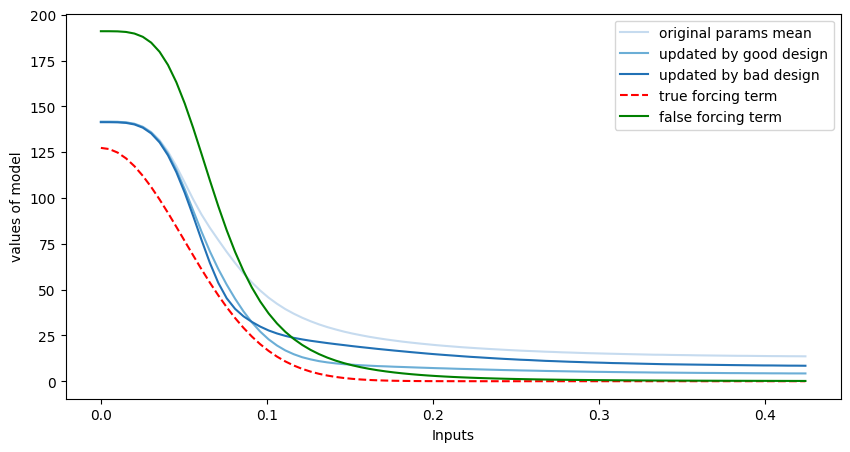

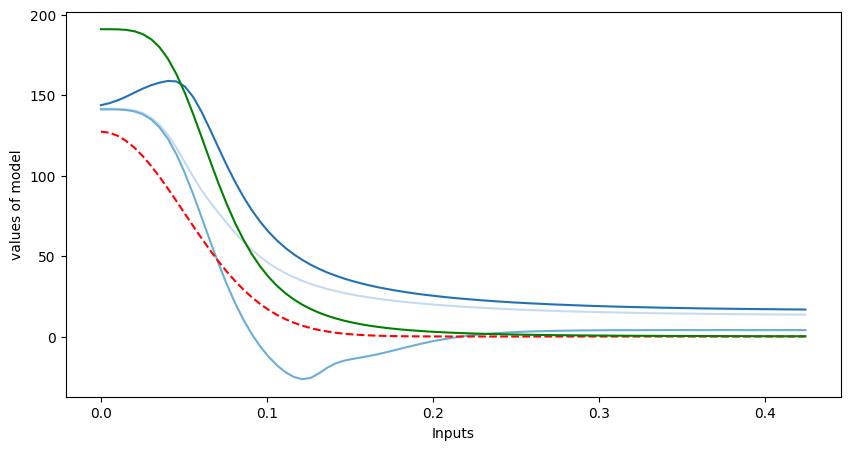

In [1336]:
def show_nn_trajectory(params_list, apply_model, colormap = 'Blues', center_x=0, center_y=0, size=85):
    x = jnp.linspace(0., 0.3, size).reshape(-1, 1)
    y = jnp.linspace(0., 0.3, size).reshape(-1, 1)
    xy_combined = jnp.concatenate((x, y), axis=1)
    
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    
    plt.figure(figsize=(10, 5))
    
    cmap = plt.colormaps[colormap].resampled(len(params_list)+2)#cm.get_cmap('Blues', len(params_list))
    for index, params in enumerate(params_list):
        #if index not in [6]:
        #    continue
        array_nn = apply_model.apply(params, xy_combined) #* 70.0
        
        plt.plot(jnp.sqrt(2) * x.squeeze(), 
                 (array_nn.squeeze() + array_reciprocal.squeeze()), 
                 label=f'NN + Reciprocal - Params {index+1}',
                 color=cmap(index+1))
    
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_exponent.squeeze(), color='r', linestyle = '--', label='Exponent')
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_reciprocal.squeeze(), color='g', label='Reciprocal')
    
    plt.ylabel('values of model')
    plt.xlabel('Inputs')
    
params0 = reconstruct_array_to_dict(np.mean(result_matrix_design_1[0], axis=0),params)
params1 = reconstruct_array_to_dict(np.mean(result_matrix_design_1[-1], axis=0),params)
params2 = reconstruct_array_to_dict(np.mean(result_matrix_design_2[-1], axis=0),params)

show_nn_trajectory([params0, params1, params2], model2, 'Blues', center_x=0, center_y=0, size=85)
plt.legend()

leg = plt.gca().get_legend()

new_labels = ['original params mean', 'updated by good design', 'updated by bad design', 'true forcing term', 'false forcing term']

for text, new_label in zip(leg.get_texts(), new_labels):
    text.set_text(new_label)

plt.draw()


params3 = reconstruct_array_to_dict(np.mean(result_matrix_design_3[-1], axis=0),params)
params4 = reconstruct_array_to_dict(np.mean(result_matrix_design_4[-1], axis=0),params)
params5 = reconstruct_array_to_dict(np.mean(result_matrix_design_5[-1], axis=0),params)
params6 = reconstruct_array_to_dict(np.mean(result_matrix_design_6[-1], axis=0),params)
params7 = reconstruct_array_to_dict(np.mean(result_matrix_design_7[-1], axis=0),params)
params8 = reconstruct_array_to_dict(np.mean(result_matrix_design_8[-1], axis=0),params)
params9 = reconstruct_array_to_dict(np.mean(result_matrix_design_9[-1], axis=0),params)
show_nn_trajectory([params0,params5, params7], model2, 'Blues', center_x=0, center_y=0, size=85)

In [1128]:
params2

{'params': {'Dense_0': {'bias': array([-0.23312349,  0.47224455, -0.78608792, -0.38686239]),
   'kernel': array([[ -0.3448091 , -11.72619948, -12.17207985,   0.0250018 ],
          [ -4.7140896 ,  -9.09470378,  -3.5607811 ,  -9.00995306]])},
  'Dense_1': {'bias': array([ 0.74568804, -0.87123769,  2.02498338, -2.17341381]),
   'kernel': array([[-3.86606518, -0.18982007,  4.19567556, -3.78180141],
          [-5.51682722,  5.45891411,  1.94711826,  3.57627192],
          [ 8.20208793,  0.21443603, -3.16451965, -2.50866971],
          [-3.6003272 , -6.2053309 ,  2.27343397, -2.56787997]])},
  'Dense_2': {'bias': array([-1.0992855]),
   'kernel': array([[ 11.93246195],
          [-11.90503378],
          [-12.46982312],
          [-12.35981324]])}}}

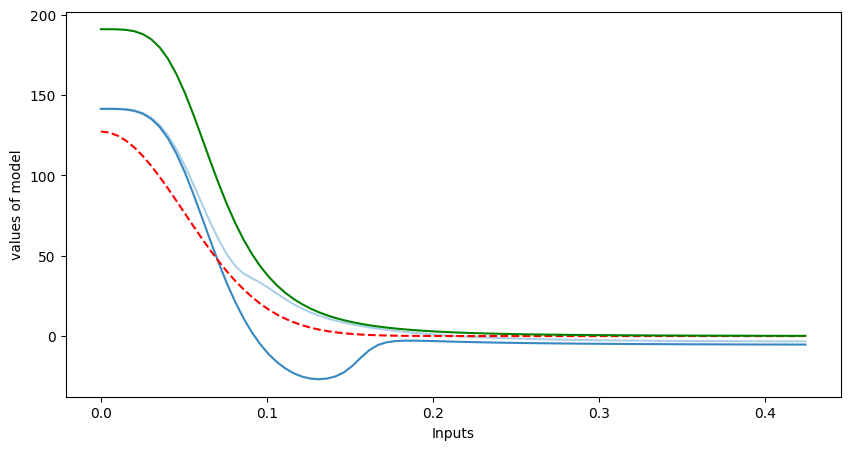

In [880]:
index_to_plot = 36
show_nn_trajectory([reconstruct_array_to_dict(result_matrix_design_1[-1,index_to_plot],params),reconstruct_array_to_dict(result_matrix_design_2[-1,index_to_plot],params)], model2, 'Blues', center_x=0, center_y=0, size=85)

In [ ]:
param_local_list = []
for i in range(ensemble_step+1):
    param_local_list.append(reconstruct_array_to_dict(result_matrix_design_1[i,100],params))

show_nn_trajectory(param_local_list, model3, 'Blues', center_x=0, center_y=0, size=85)
plt.show()

In [1196]:
# 对于不用tanh的网络，可以一起比较

In [331]:
d_start4, d_start5, estimated_center

(Array([0.215, 0.285], dtype=float32),
 Array([0.215, 0.215], dtype=float32),
 Array([0.2, 0.2], dtype=float32))

In [979]:
d_start3, d_start5

(Array([0.23, 0.23], dtype=float32), Array([0.17, 0.17], dtype=float32))

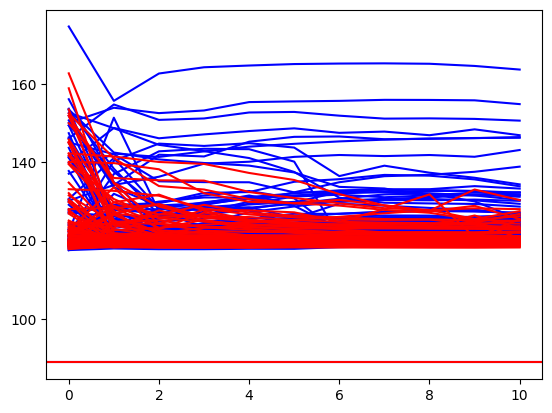

In [1126]:
xy_combined = d_start3 - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)

array_reciprocal1 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent1 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_1 = np.zeros((ensemble_step+1,ensemble_size))

for i in range(ensemble_size):
    for j in range(ensemble_step+1):
        last_params_array = result_matrix_design_1[j,i]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        array_nn = model2.apply(last_params, xy_combined) #* 100.0
        y_at_design = array_nn.squeeze()+array_reciprocal1
        y_at_design_array_1[j,i]=y_at_design
    
    plt.plot(y_at_design_array_1[:,i],color='b')

plt.axhline(array_exponent1,color='b')

xy_combined = d_start5 - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)

array_reciprocal2 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent2 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_2 = np.zeros((ensemble_step+1,ensemble_size))

for i in range(ensemble_size):
    for j in range(ensemble_step+1):
        last_params_array = result_matrix_design_2[j,i]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        array_nn = model2.apply(last_params, xy_combined) #* 100.0
        y_at_design = array_nn.squeeze()+array_reciprocal2
        y_at_design_array_2[j,i]=y_at_design
    
    plt.plot(y_at_design_array_2[:,i],color='r')

plt.axhline(array_exponent2,color='r')

plt.show()

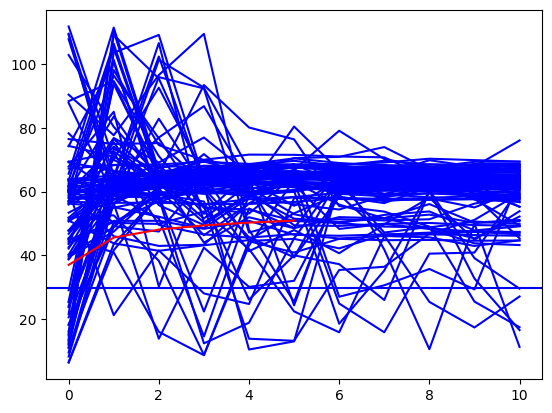

In [733]:
plt.plot(y_at_design_array_1,'b')
plt.plot(mu_0_design_3,'r')
plt.axhline(array_exponent1,color='b')

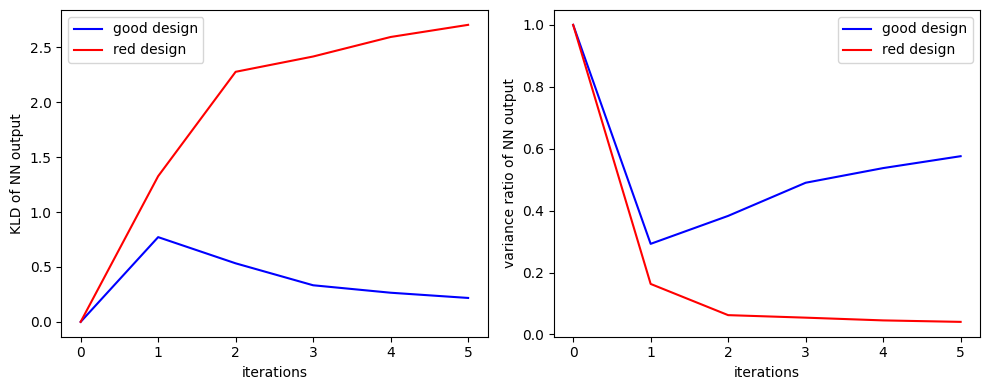

In [980]:
def kl_divergence_1d(mu1, sigma1, mu2, sigma2):
    # 计算KLD
    term1 = jnp.log(sigma2 / sigma1)
    term2 = (sigma1 ** 2 + (mu1 - mu2) ** 2) / (2 * sigma2 ** 2)
    
    # 计算最终的KL散度
    kl_div = term1 + term2 - 0.5
    
    return kl_div


mu_0_design_3 = np.mean(y_at_design_array_1,axis=1)
mu_0_design_3_center = y_at_design_array_1 - mu_0_design_3.reshape(-1,1)
sigma_0_design_3 = np.var(mu_0_design_3_center,axis=1)
mu_0_design_4 = np.mean(y_at_design_array_2,axis=1)
mu_0_design_4_center = y_at_design_array_2 - mu_0_design_4.reshape(-1,1)
sigma_0_design_4 = np.var(mu_0_design_4_center,axis=1)

kld_value_array_design_3 = np.zeros(ensemble_step+1)
kld_value_array_design_4 = np.zeros(ensemble_step+1)

for i in range(ensemble_step+1):
    kld_value_array_design_3[i] = kl_divergence_1d(mu_0_design_3[i], sigma_0_design_3[i], mu_0_design_3[0], sigma_0_design_3[0])
    kld_value_array_design_4[i] = kl_divergence_1d(mu_0_design_4[i], sigma_0_design_4[i], mu_0_design_4[0], sigma_0_design_4[0])

from matplotlib.ticker import MaxNLocator

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Plot KLD values
axes[0].plot(kld_value_array_design_3, 'b',label='good design')
axes[0].plot(kld_value_array_design_4, 'r',label='red design')
axes[0].set_ylabel('KLD of NN output')
axes[0].set_xlabel('iterations')
axes[0].xaxis.set_major_locator(MaxNLocator(integer=True))  # 设置x轴刻度为整数
axes[0].legend()

# Plot variance ratio
axes[1].plot(sigma_0_design_3/sigma_0_design_3[0], 'b',label='good design')
axes[1].plot(sigma_0_design_4/sigma_0_design_4[0], 'r',label='red design')
axes[1].set_ylabel('variance ratio of NN output')
axes[1].set_xlabel('iterations')
axes[1].xaxis.set_major_locator(MaxNLocator(integer=True))  # 设置x轴刻度为整数
axes[1].legend()

plt.tight_layout()
plt.show()


In [ ]:
# 对于加了tanh的网络，这里需要分开比较

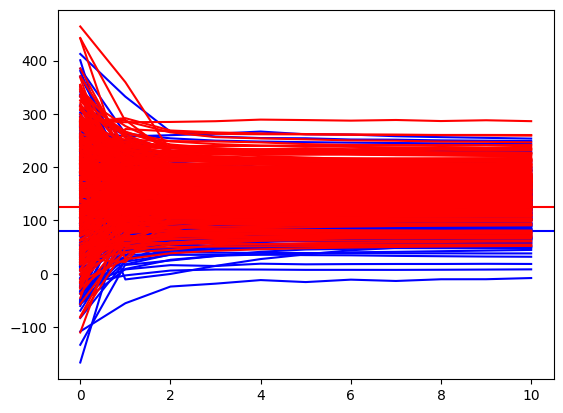

In [1007]:
ensemble_size = 300
ensemble_step = 10

xy_combined = d_start1 - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)

array_reciprocal1 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent1 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_1 = np.zeros((ensemble_step+1,ensemble_size))

for i in range(ensemble_size):
    for j in range(ensemble_step+1):
        last_params_array = result_matrix_design_1[j,i]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        array_nn = model.apply(last_params, xy_combined) * 100.0
        y_at_design = array_nn.squeeze()+array_reciprocal1
        y_at_design_array_1[j,i]=y_at_design
    
    plt.plot(y_at_design_array_1[:,i],color='b')

plt.axhline(array_exponent1,color='b')

xy_combined = d_start3 - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)

array_reciprocal2 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent2 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_2 = np.zeros((ensemble_step+1,ensemble_size))

for i in range(ensemble_size):
    for j in range(ensemble_step+1):
        last_params_array = result_matrix_design_2[j,i]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        array_nn = model.apply(last_params, xy_combined) * 100.0
        y_at_design = array_nn.squeeze()+array_reciprocal2
        y_at_design_array_2[j,i]=y_at_design
    
    plt.plot(y_at_design_array_2[:,i],color='r')

plt.axhline(array_exponent2,color='r')

plt.show()

119
116


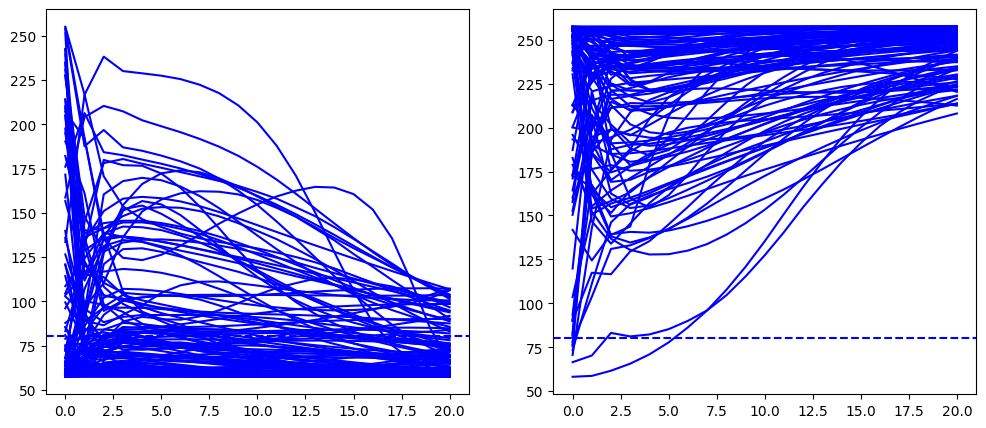

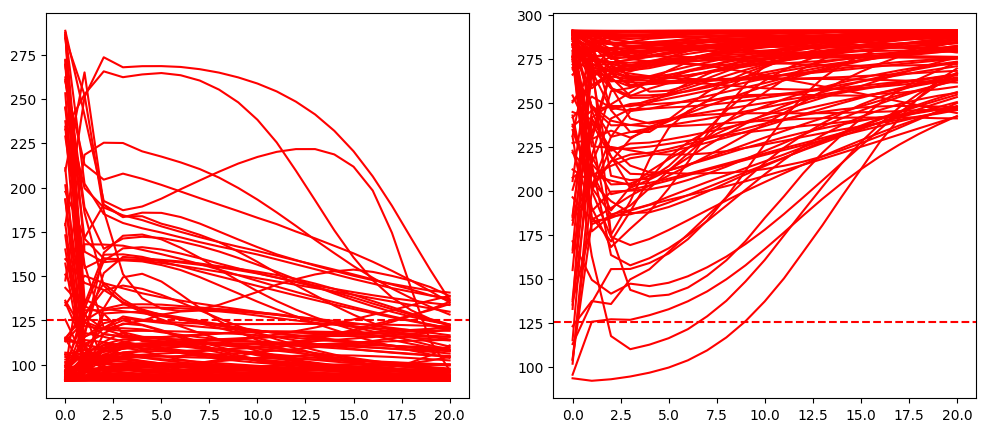

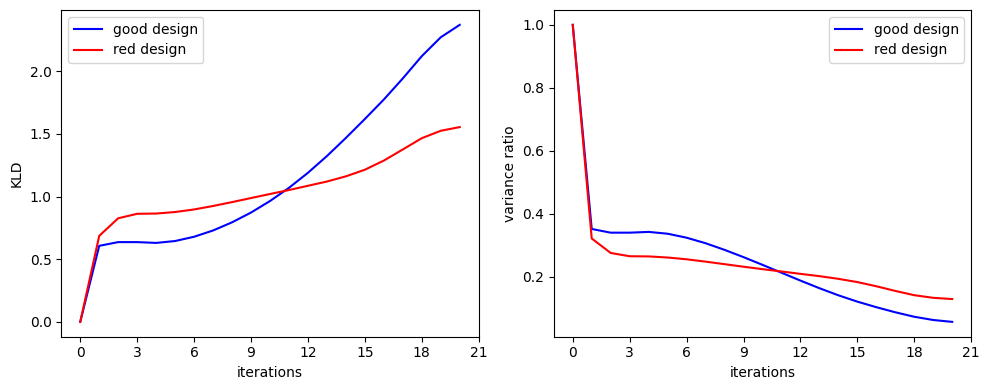

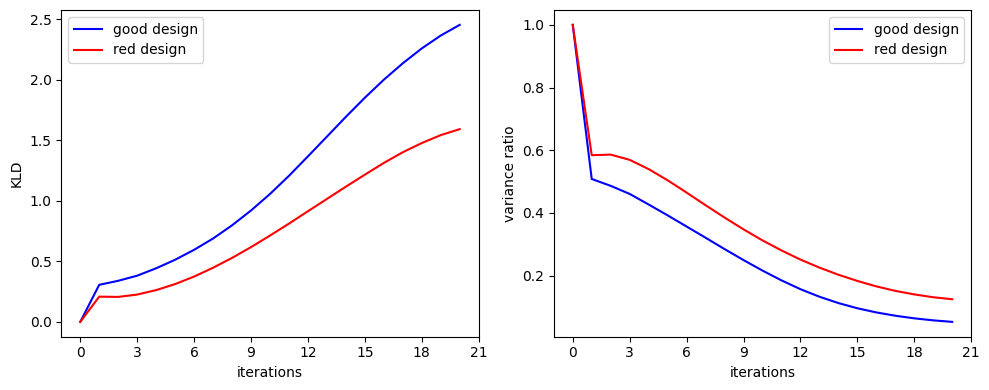

In [944]:
mid_point_1 = (np.max(y_at_design_array_1[-1,:])+np.min(y_at_design_array_1[-1,:]))/2
mid_point_2 = (np.max(y_at_design_array_2[-1,:])+np.min(y_at_design_array_2[-1,:]))/2
shift_line = 50

cols_chosen1 = np.where(y_at_design_array_1[-1, :]  < (mid_point_1-shift_line))[0] 
remaining_columns1 = np.where(y_at_design_array_1[-1, :]  > (mid_point_1+shift_line))[0] 
print(len(cols_chosen1))
fig,axes=plt.subplots(1,2,figsize=(12,5))
for i in cols_chosen1:
    axes[0].plot(y_at_design_array_1[:,i],'b')
for i in remaining_columns1:
    axes[1].plot(y_at_design_array_1[:,i],'b')
axes[0].axhline(array_exponent1,linestyle='--',color='b')
axes[1].axhline(array_exponent1,linestyle='--',color='b')


cols_chosen2 = np.where(y_at_design_array_2[-1, :]  < (mid_point_2-shift_line))[0] 
remaining_columns2 = np.where(y_at_design_array_2[-1, :]  > (mid_point_2+shift_line))[0] 
print(len(cols_chosen2))
fig,axes=plt.subplots(1,2,figsize=(12,5))
for i in cols_chosen2:
    axes[0].plot(y_at_design_array_2[:,i],'r')
for i in remaining_columns2:
    axes[1].plot(y_at_design_array_2[:,i],'r')
axes[0].axhline(array_exponent2,linestyle='--',color='r')
axes[1].axhline(array_exponent2,linestyle='--',color='r')


def kl_divergence_1d(mu1, sigma1, mu2, sigma2):
    # 计算KLD
    term1 = jnp.log(sigma2 / sigma1)
    term2 = (sigma1 ** 2 + (mu1 - mu2) ** 2) / (2 * sigma2 ** 2)
    
    # 计算最终的KL散度
    kl_div = term1 + term2 - 0.5
    
    return kl_div


mu_0_design_3 = np.mean(y_at_design_array_1[:,cols_chosen1],axis=1)
mu_0_design_3_center = y_at_design_array_1[:,cols_chosen1] - mu_0_design_3.reshape(-1,1)
sigma_0_design_3 = np.var(mu_0_design_3_center,axis=1)
mu_0_design_4 = np.mean(y_at_design_array_2[:,cols_chosen2],axis=1)
mu_0_design_4_center = y_at_design_array_2[:,cols_chosen1] - mu_0_design_4.reshape(-1,1)
sigma_0_design_4 = np.var(mu_0_design_4_center,axis=1)

kld_value_array_design_3 = np.zeros(ensemble_step+1)
kld_value_array_design_4 = np.zeros(ensemble_step+1)

for i in range(ensemble_step+1):
    kld_value_array_design_3[i] = kl_divergence_1d(mu_0_design_3[i], sigma_0_design_3[i], mu_0_design_3[0], sigma_0_design_3[0])
    kld_value_array_design_4[i] = kl_divergence_1d(mu_0_design_4[i], sigma_0_design_4[i], mu_0_design_4[0], sigma_0_design_4[0])

from matplotlib.ticker import MaxNLocator

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Plot KLD values
axes[0].plot(kld_value_array_design_3, 'b',label='good design')
axes[0].plot(kld_value_array_design_4, 'r',label='red design')
axes[0].set_ylabel('KLD')
axes[0].set_xlabel('iterations')
axes[0].xaxis.set_major_locator(MaxNLocator(integer=True))  # 设置x轴刻度为整数
axes[0].legend()

# Plot variance ratio
axes[1].plot(sigma_0_design_3/sigma_0_design_3[0], 'b',label='good design')
axes[1].plot(sigma_0_design_4/sigma_0_design_4[0], 'r',label='red design')
axes[1].set_ylabel('variance ratio')
axes[1].set_xlabel('iterations')
axes[1].xaxis.set_major_locator(MaxNLocator(integer=True))  # 设置x轴刻度为整数
axes[1].legend()

plt.tight_layout()
plt.show()

mu_0_design_3 = np.mean(y_at_design_array_1[:,remaining_columns1],axis=1)
mu_0_design_3_center = y_at_design_array_1[:,remaining_columns1] - mu_0_design_3.reshape(-1,1)
sigma_0_design_3 = np.var(mu_0_design_3_center,axis=1)
mu_0_design_4 = np.mean(y_at_design_array_2[:,remaining_columns2],axis=1)
mu_0_design_4_center = y_at_design_array_2[:,remaining_columns1] - mu_0_design_4.reshape(-1,1)
sigma_0_design_4 = np.var(mu_0_design_4_center,axis=1)

kld_value_array_design_3 = np.zeros(ensemble_step+1)
kld_value_array_design_4 = np.zeros(ensemble_step+1)

for i in range(ensemble_step+1):
    kld_value_array_design_3[i] = kl_divergence_1d(mu_0_design_3[i], sigma_0_design_3[i], mu_0_design_3[0], sigma_0_design_3[0])
    kld_value_array_design_4[i] = kl_divergence_1d(mu_0_design_4[i], sigma_0_design_4[i], mu_0_design_4[0], sigma_0_design_4[0])

from matplotlib.ticker import MaxNLocator

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Plot KLD values
axes[0].plot(kld_value_array_design_3, 'b',label='good design')
axes[0].plot(kld_value_array_design_4, 'r',label='red design')
axes[0].set_ylabel('KLD')
axes[0].set_xlabel('iterations')
axes[0].xaxis.set_major_locator(MaxNLocator(integer=True))  # 设置x轴刻度为整数
axes[0].legend()

# Plot variance ratio
axes[1].plot(sigma_0_design_3/sigma_0_design_3[0], 'b',label='good design')
axes[1].plot(sigma_0_design_4/sigma_0_design_4[0], 'r',label='red design')
axes[1].set_ylabel('variance ratio')
axes[1].set_xlabel('iterations')
axes[1].xaxis.set_major_locator(MaxNLocator(integer=True))  # 设置x轴刻度为整数
axes[1].legend()

plt.tight_layout()
plt.show()

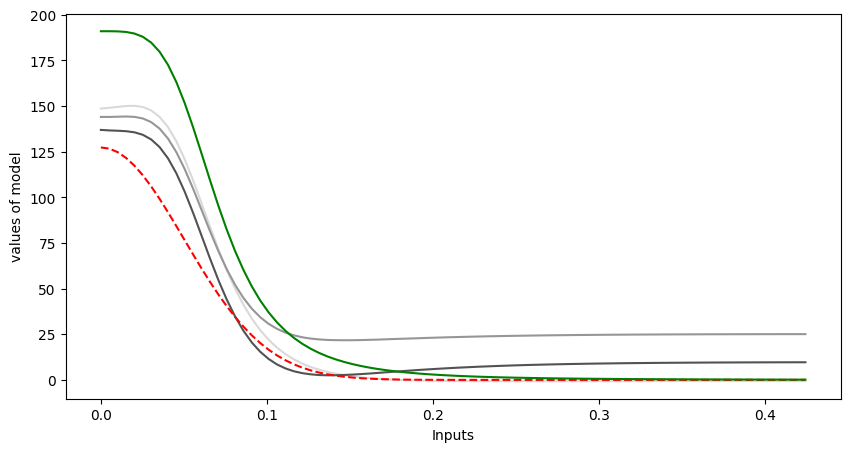

In [945]:
# 分开比较网络的形态
params1 = reconstruct_array_to_dict(np.mean(result_matrix_design_1[-1,cols_chosen1], axis=0),params)
params2 = reconstruct_array_to_dict(np.mean(result_matrix_design_2[-1,cols_chosen2], axis=0),params)

#params2 = reconstruct_array_to_dict(np.mean(result_matrix_design_1[-1,remaining_columns1], axis=0),params)
#params2 = reconstruct_array_to_dict(np.mean(result_matrix_design_2[-1,remaining_columns2], axis=0),params)

show_nn_trajectory([params, params1, params2], model, 'Greys', center_x=0, center_y=0, size=85)

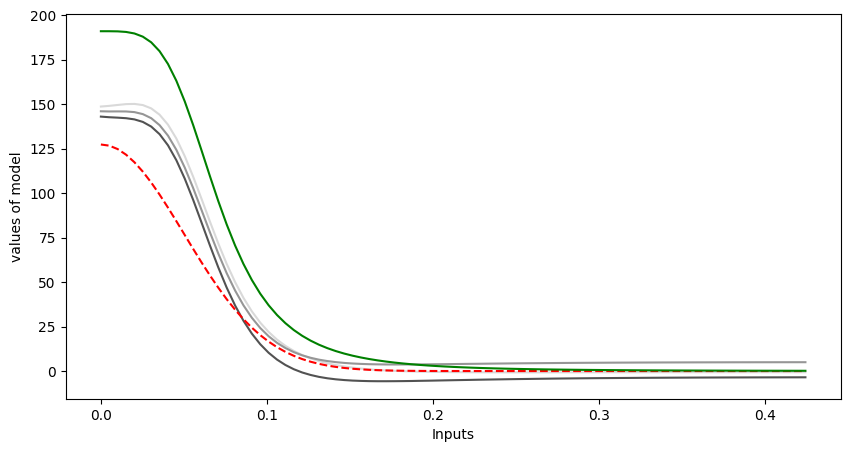

In [946]:
# 一起比较网络的形态
params1 = reconstruct_array_to_dict(np.mean(result_matrix_design_1[-1], axis=0),params)
params2 = reconstruct_array_to_dict(np.mean(result_matrix_design_2[-1], axis=0),params)

show_nn_trajectory([params, params1, params2], model, 'Greys', center_x=0, center_y=0, size=85)

In [927]:
cols_chosen1,cols_chosen2

(array([  4,   6,  11,  12,  13,  14,  15,  20,  22,  23,  24,  25,  28,
         29,  31,  32,  35,  36,  37,  40,  41,  43,  45,  50,  52,  53,
         54,  55,  58,  60,  63,  67,  69,  70,  71,  72,  73,  77,  79,
         80,  82,  84,  86,  88,  93,  95,  97,  98,  99, 103, 104, 105,
        106, 107, 109, 110, 111, 113, 114, 116, 118, 119, 121, 124, 125,
        128, 132, 135, 137, 138, 140, 141, 142, 143, 144, 146, 148, 150,
        152, 153, 154, 161, 165, 169, 170, 172, 174, 175, 176, 177, 178,
        179, 180, 182, 183, 185, 187, 188, 189, 192, 193, 194, 195, 196,
        197, 198, 200, 201, 203, 205, 207, 208, 209, 212, 213, 217, 218,
        219, 223, 224, 225, 226, 227, 228, 229, 230, 233, 235, 236, 239,
        242, 243, 245, 246, 248, 249, 251, 252, 256, 257, 258, 259, 263,
        264, 265, 268, 269, 271, 272, 277, 281, 282, 286, 287, 289, 291,
        293, 296]),
 array([  2,   4,   6,  10,  11,  12,  13,  14,  15,  20,  22,  23,  28,
         29,  31,  32,  35,  36

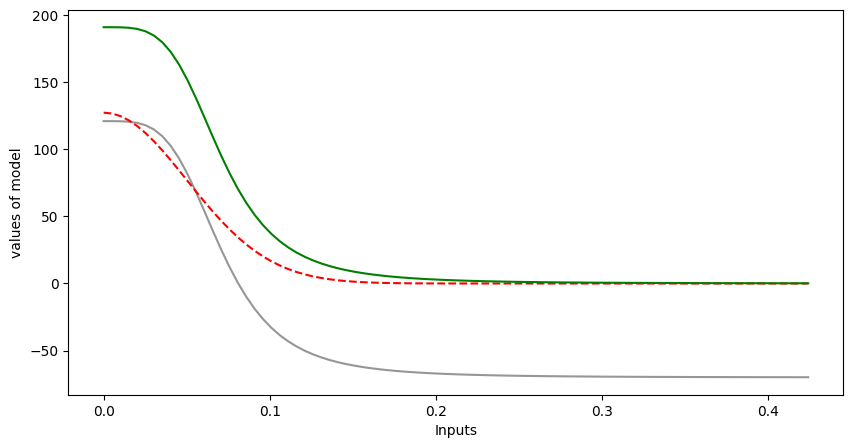

In [910]:
show_nn_trajectory([reconstruct_array_to_dict(result_matrix_design_2[-1,20],params)], model, 'Greys', center_x=0, center_y=0, size=85)

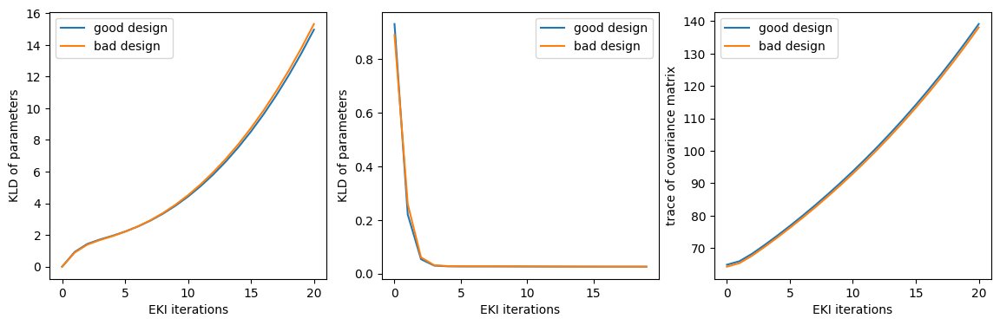

In [947]:
bot_trajectory1 = result_matrix_design_1[:,cols_chosen1]
top_trajectory1 = result_matrix_design_1[:,remaining_columns1]
bot_trajectory2 = result_matrix_design_2[:,cols_chosen2]
top_trajectory2 = result_matrix_design_2[:,remaining_columns2]


def kl_divergence(mu1, sigma1, mu2, sigma2):
    # 计算逆矩阵和行列式
    sigma2_inv = jnp.linalg.inv(sigma2)
    #sigma1_det = jnp.linalg.det(sigma1)
    #sigma2_det = jnp.linalg.det(sigma2)
    
    # 计算各项
    term1 = jnp.trace(sigma2_inv @ sigma1)
    term2 = (mu2 - mu1).T @ sigma2_inv @ (mu2 - mu1)
    
    _, logdet_sigma1 = jnp.linalg.slogdet(sigma1)
    _, logdet_sigma2 = jnp.linalg.slogdet(sigma2)
    term3 = logdet_sigma2 - logdet_sigma1
    #term3 = jnp.log(sigma2_det / sigma1_det)
    
    # 计算最终的KL散度
    kl_div = 0.5 * (term1 + term2 - len(mu1) + term3)
    
    return kl_div
    


mean_ori = np.mean(bot_trajectory1[0],axis=0)
mean_ori_centered = bot_trajectory1[0] - mean_ori
var_ori = np.cov(mean_ori_centered, rowvar=False)
kld_trajectory1 = np.zeros(ensemble_step+1)
kld_trajectory1[0] = kl_divergence(mean_ori, var_ori, mean_ori, var_ori)
kld_compare_to_before1 = np.zeros(ensemble_step)
mean_current_back = mean_ori
var_current_back = var_ori
covar_trace_1 = np.zeros(ensemble_step+1)
covar_trace_1[0] = np.trace(var_ori)

for i in range(1,ensemble_step+1):
    mean_current = np.mean(bot_trajectory1[i],axis=0)
    mean_current_centered = bot_trajectory1[i] - mean_current
    var_current = np.cov(mean_current_centered, rowvar=False)
    kld_trajectory1[i]=kl_divergence(mean_current, var_current, mean_ori, var_ori)
    kld_compare_to_before1[i-1]=kl_divergence(mean_current, var_current, mean_current_back, var_current_back)
    covar_trace_1[i] = np.trace(var_current)
    mean_current_back = mean_current
    var_current_back = var_current 
    
mean_ori = np.mean(bot_trajectory2[0],axis=0)
mean_ori_centered = bot_trajectory2[0] - mean_ori
var_ori = np.cov(mean_ori_centered, rowvar=False)
kld_trajectory2 = np.zeros(ensemble_step+1)
kld_trajectory2[0] = kl_divergence(mean_ori, var_ori, mean_ori, var_ori)
kld_compare_to_before2 = np.zeros(ensemble_step)
mean_current_back = mean_ori
var_current_back = var_ori
covar_trace_2 = np.zeros(ensemble_step+1)
covar_trace_2[0] = np.trace(var_ori)

for i in range(1,ensemble_step+1):
    mean_current = np.mean(bot_trajectory2[i],axis=0)
    mean_current_centered = bot_trajectory2[i] - mean_current
    var_current = np.cov(mean_current_centered, rowvar=False)
    kld_trajectory2[i]=kl_divergence(mean_current, var_current, mean_ori, var_ori)
    kld_compare_to_before2[i-1]=kl_divergence(mean_current, var_current, mean_current_back, var_current_back)
    covar_trace_2[i] = np.trace(var_current)
    mean_current_back = mean_current
    var_current_back = var_current 


fig, axes = plt.subplots(1,3,figsize=(14,4))

axes[0].plot(kld_trajectory1, label = 'good design')
axes[0].plot(kld_trajectory2, label = 'bad design')
axes[0].set_xlabel('EKI iterations')
axes[0].set_ylabel('KLD of parameters')
axes[0].legend()

axes[1].plot(kld_compare_to_before1, label = 'good design')
axes[1].plot(kld_compare_to_before2, label = 'bad design')
axes[1].set_xlabel('EKI iterations')
axes[1].set_ylabel('KLD of parameters')
axes[1].legend()

axes[2].plot(covar_trace_1, label = 'good design')
axes[2].plot(covar_trace_2, label = 'bad design')
axes[2].set_xlabel('EKI iterations')
axes[2].set_ylabel('trace of covariance matrix')
axes[2].legend()

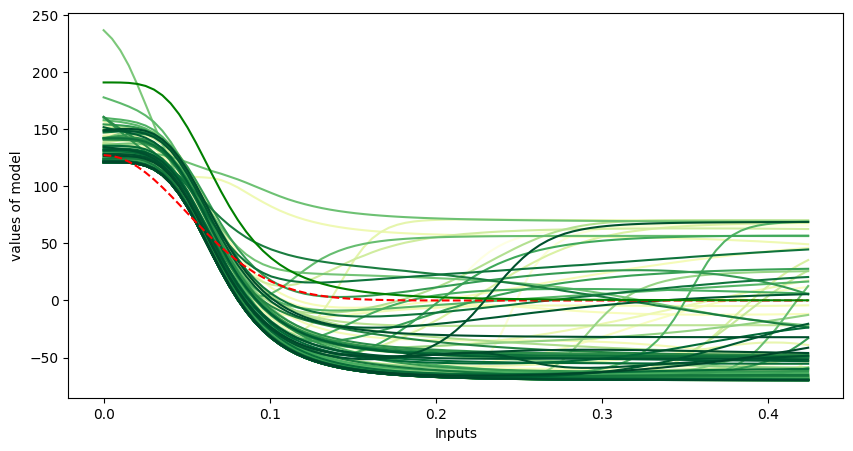

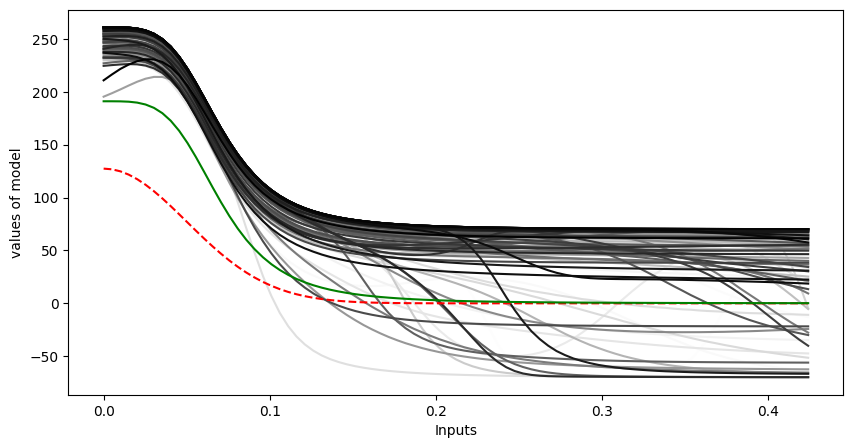

In [949]:
params_list_local = []
for i in range(bot_trajectory1.shape[1]):
    params_list_local.append(reconstruct_array_to_dict(bot_trajectory1[-1,i],params))
    
show_nn_trajectory(params_list_local, model, 'YlGn', center_x=0, center_y=0, size=85)

params_list_local = []
for i in range(top_trajectory1.shape[1]):
    params_list_local.append(reconstruct_array_to_dict(top_trajectory1[-1,i],params))
    
show_nn_trajectory(params_list_local, model, 'Greys', center_x=0, center_y=0, size=85)

# log
nn_case_data_3_EnFK_stage2_test:
+ Net parameters : 65
+ Ensemble size: 400
+ EKI iterations: 50
+ data dimension: 25
+ 没有使用inflation

nn_case_data_3_EnFK_stage2_test2:
+ Net parameters : 65
+ Ensemble size: 400
+ EKI iterations: 10
+ data dimension: 25
+ 每一步都加inflation

nn_case_data_3_EnFK_stage2_test3:
+ Net parameters : 65
+ Ensemble size: 400
+ EKI iterations: 10
+ data dimension: 100
+ 每一步都加inflation

nn_case_data_3_EnFK_stage2_test4:
+ Net parameters : 65
+ Ensemble size: 400
+ EKI iterations: 10
+ data dimension: 961
+ 每一步都加inflation

In [109]:
import os
import pickle

checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test/checkpoint_i_5_j_0.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
#start_i = checkpoint_data['i']
#start_j = checkpoint_data['j']
result_matrix_design_1 = checkpoint_data['params_trajectory']

#checkpoint_file_path = './checkpoints/nn_case_data_2_engd_stage2_design2_check/checkpoint_i_99_j_19.pkl'
checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2_test/checkpoint_i_5_j_2.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
#start_i = checkpoint_data['i']
#start_j = checkpoint_data['j']
result_matrix_design_3 = checkpoint_data['params_trajectory']

Checkpoint data loaded successfully.
Checkpoint data loaded successfully.


In [ ]:
# network output

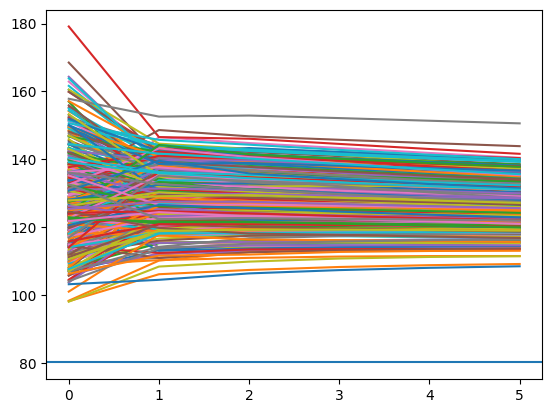

In [110]:
xy_combined = d_start1 - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)

array_reciprocal1 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent1 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_1 = np.zeros(ensemble_step+1)

for i in range(ensemble_size):
    for j in range(ensemble_step+1):
        last_params_array = result_matrix_design_1[j,i]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        array_nn = model.apply(last_params, xy_combined) * 70.0
        y_at_design = array_nn.squeeze()+array_reciprocal1
        y_at_design_array_1[j]=y_at_design
    
    plt.plot(y_at_design_array_1)

plt.axhline(array_exponent1)
plt.show()

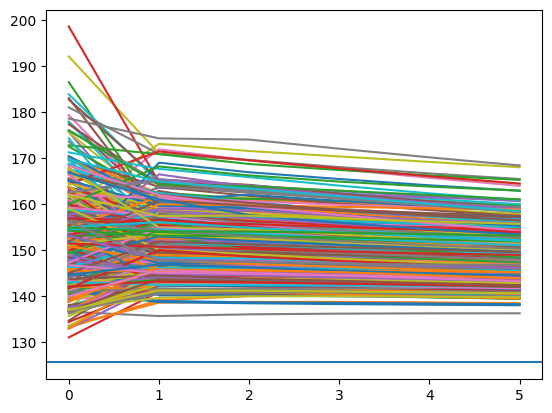

In [111]:
xy_combined = d_start3 - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)

array_reciprocal3 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent3 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_3 = np.zeros(ensemble_step+1)

for i in range(ensemble_size):
    for j in range(ensemble_step+1):
        last_params_array = result_matrix_design_3[j,i]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        array_nn = model.apply(last_params, xy_combined) * 70.0
        y_at_design = array_nn.squeeze()+array_reciprocal3
        y_at_design_array_3[j]=y_at_design
    
    plt.plot(y_at_design_array_3)

plt.axhline(array_exponent3)
plt.show()

In [269]:
params_trajectory_with_perturb_in_obs = params_trajectory

Checkpoint data loaded successfully.
Checkpoint data loaded successfully.
Checkpoint data loaded successfully.


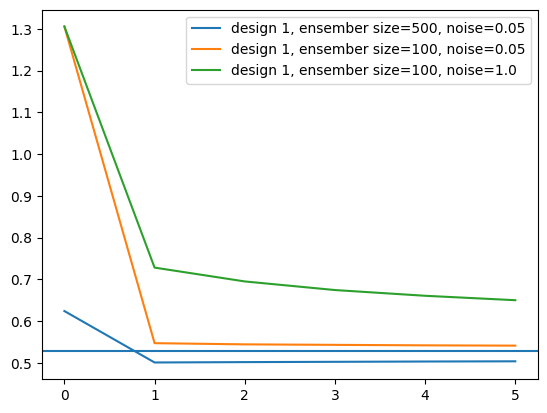

In [341]:
import os
import pickle

checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2/checkpoint_i_5_j_0.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
#start_i = checkpoint_data['i']
#start_j = checkpoint_data['j']
result_matrix_design_1 = checkpoint_data['params_trajectory']

#checkpoint_file_path = './checkpoints/nn_case_data_2_engd_stage2_design2_check/checkpoint_i_99_j_19.pkl'
checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2/checkpoint_i_5_j_0_500member.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
#start_i = checkpoint_data['i']
#start_j = checkpoint_data['j']
result_matrix_design_2 = checkpoint_data['params_trajectory']

#checkpoint_file_path = './checkpoints/nn_case_data_2_engd_stage2_design2_check/checkpoint_i_99_j_19.pkl'
checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2/checkpoint_i_5_j_0_noise0p05.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
#start_i = checkpoint_data['i']
#start_j = checkpoint_data['j']
result_matrix_design_3 = checkpoint_data['params_trajectory']

y_fs1 = np.zeros(ensemble_step+1)
for i in range(ensemble_step+1):
    last_params = reconstruct_array_to_dict(result_matrix_design_1[i,1],params)
    y_f, _ = sealed_convection_diffusion_nn(last_params, d_start, estimated_center, stage, model)
    y_fs1[i]=y_f
    
y_fs2 = np.zeros(ensemble_step+1)
for i in range(ensemble_step+1):
    last_params = reconstruct_array_to_dict(result_matrix_design_2[i,1],params)
    y_f, _ = sealed_convection_diffusion_nn(last_params, d_start, estimated_center, stage, model)
    y_fs2[i]=y_f
    
y_fs3 = np.zeros(ensemble_step+1)
for i in range(ensemble_step+1):
    last_params = reconstruct_array_to_dict(result_matrix_design_3[i,1],params)
    y_f, _ = sealed_convection_diffusion_nn(last_params, d_start, estimated_center, stage, model)
    y_fs3[i]=y_f
    
#y_fs3 = np.zeros(ensemble_step+1)
#for i in range(ensemble_step+1):
#    last_params = reconstruct_array_to_dict( result_matrix_design_3[i,1],params)
#    y_f, _ = sealed_convection_diffusion_nn(last_params, d_start, estimated_center, stage, model)
#    y_fs3[i]=y_f

plt.plot(y_fs2,label='design 1, ensember size=500, noise=0.05')
plt.plot(y_fs3,label='design 1, ensember size=100, noise=0.05')
plt.plot(y_fs1,label='design 1, ensember size=100, noise=1.0')
plt.axhline(observation)
#plt.plot(y_fs3,label='design 3')
plt.legend()

In [ ]:
全部算出来，计算平均值

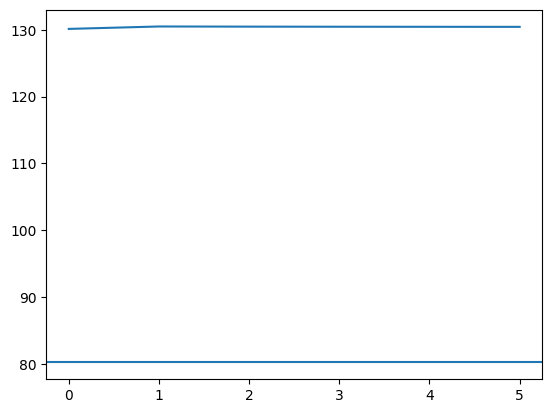

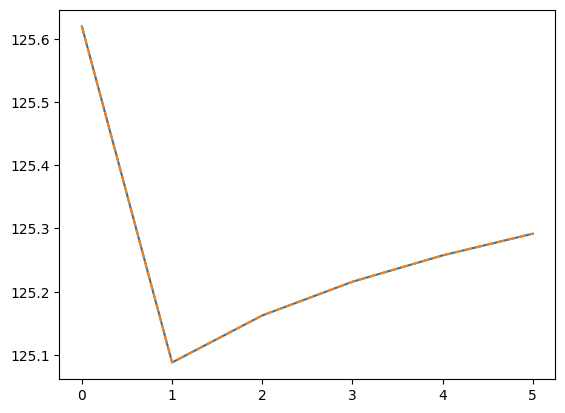

In [284]:
xy_combined = d_start1 - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)

array_reciprocal1 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent1 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_1 = np.zeros(ensemble_step+1)

for i in [10]:#range(ensemble_size):
    for j in range(ensemble_step+1):
        last_params_array = result_matrix_design_1[j,i]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        array_nn = model.apply(last_params, xy_combined) * 70.0
        y_at_design = array_nn.squeeze()+array_reciprocal1
        y_at_design_array_1[j]=y_at_design
    
    plt.plot(y_at_design_array_1)
plt.axhline(array_exponent1)
plt.show()

array_reciprocal2 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent2 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_2 = np.zeros(ensemble_step+1)

for i in [10]:#range(ensemble_size):
    for j in range(ensemble_step+1):
        last_params_array = result_matrix_design_2[j,i]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        array_nn = model.apply(last_params, xy_combined) * 70.0
        y_at_design = array_nn.squeeze()+array_reciprocal2
        y_at_design_array_2[j]=y_at_design
    
    plt.plot(y_at_design_array_2)
#plt.axhline(array_exponent2)
#plt.show()

array_reciprocal3 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent3 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_3 = np.zeros(ensemble_step+1)

for i in [10]:#range(ensemble_size):
    for j in range(ensemble_step+1):
        last_params_array = result_matrix_design_3[j,i]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        array_nn = model.apply(last_params, xy_combined) * 70.0
        y_at_design = array_nn.squeeze()+array_reciprocal3
        y_at_design_array_3[j]=y_at_design
    
    plt.plot(y_at_design_array_2,linestyle='--')
#plt.axhline(array_exponent3)
plt.show()

In [223]:
def EnKF_process_correct_two_design(d_start, observation, ensemble_member, estimated_center, stage, model, key2, num_top=5):
    # 进行一次EnKF更新
    # 这个代码是不能够并行的

    # 生成初始状态的场
    # 直接在外面生成一个导入
    # 从这个场，用ensemble menber更新到现在

    # 输入ensemble_member是数组
    # 输出theta_samples_updated是数组
    # noise_info, lo_b, up_b, size, num_top 是全局变量
    
    ensemble_size_local = ensemble_member.shape[0]
    noise_loc, noise_base_scale, noise_ratio_scale = noise_info[0]
    xb_lo = int((0.0 - lo_b) / (up_b - lo_b) * (size - 1))
    xb_up = int((1.0 - lo_b) / (up_b - lo_b) * (size - 1))


    y_fs = jnp.zeros((ensemble_size_local,2))
    
    for i in range(ensemble_size_local):
        ensemble_member_dict = reconstruct_array_to_dict(ensemble_member[i],params)
        y_f, _  = sealed_convection_diffusion_nn(ensemble_member_dict, d_start, estimated_center, stage, model)
        y_fs = y_fs.at[i,0].set(y_f)
        y_f, _  = sealed_convection_diffusion_nn(ensemble_member_dict, jnp.array([0.25,0.29]), estimated_center, stage, model)
        y_fs = y_fs.at[i,1].set(y_f)
        print('.',end='')
    
    y_f_mean = jnp.mean(y_fs,axis=0)
    #P_yy = 1/(ensemble_size_local-1)*jnp.sum((y_fs-y_f_mean)**2)+noise_base_scale
    P_yy = 1/(ensemble_size_local-1) * (y_fs - y_f_mean).T @ (y_fs - y_f_mean) + noise_base_scale * jnp.eye(2)


    #x_f_theta = ensemble_member.reshape(ensemble_size_local,-1) # 这一步是对于1维情况准备的，高维情况不用reshape
    x_f_theta = ensemble_member
    x_f_mean = jnp.mean(x_f_theta, axis=0).reshape(1,-1)

    x_f_deviation = x_f_theta - x_f_mean
    y_f_deviation = y_fs - y_f_mean
    P_xy = jnp.matmul(x_f_deviation.T, y_f_deviation) / (ensemble_size_local - 1) 

    #K = P_xy * 1.0/P_yy
    K = P_xy @ jnp.linalg.inv(P_yy)

    x_a = x_f_theta + jnp.matmul(K, (observation + jax.random.normal(key2, shape=observation.shape)*noise_base_scale - y_fs).T).T
    
    return x_a

observation  = jnp.array([sealed_convection_diffusion_true(d_start, center, stage)[0],sealed_convection_diffusion_true(jnp.array([0.25,0.29]), center, stage)[0]]).reshape(1,2)

In [226]:
ensemble_members_array 

Array([[ 0.68612385,  0.41599512,  0.93370473, ..., -0.28234565,
        -0.6101518 ,  0.2855335 ],
       [ 0.3003829 ,  0.550772  ,  0.8294567 , ..., -0.16990785,
        -0.6609109 ,  0.28868535],
       [ 0.5529945 ,  0.43459773,  0.6717454 , ..., -0.18488903,
        -0.775365  ,  0.19524108],
       ...,
       [ 0.4350195 ,  0.17958345,  0.739654  , ..., -0.3099932 ,
        -0.59031   ,  0.4247799 ],
       [ 0.39360088,  0.384572  ,  0.81206304, ..., -0.3842526 ,
        -0.72956157,  0.22291857],
       [ 0.44116268,  0.37346756,  0.71125627, ..., -0.1894279 ,
        -0.8701962 ,  0.37064534]], dtype=float32)

In [255]:
params_trajectory.shape

(6, 500, 65)

In [230]:
ensemble_members_array = jax.vmap(generate_sample, in_axes=(0, None, None))(keys_ensemble, mean_array, std_dev)

x_a = EnKF_process_correct_two_design(d_start, observation, ensemble_members_array, estimated_center, stage, model, key2, num_top=5)


....................................................................................................

In [238]:

x_a1 = EnKF_process_correct_two_design(d_start, observation, x_a, estimated_center, stage, model, key2, num_top=5)
print('|')
x_a2 = EnKF_process_correct_two_design(d_start, observation, x_a1, estimated_center, stage, model, key2, num_top=5)

....................................................................................................|
....................................................................................................

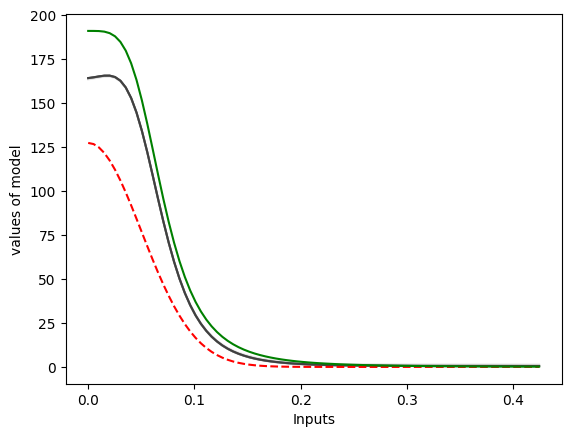

In [252]:
index_to_plot = 30
show_nn_trajectory([reconstruct_array_to_dict(ensemble_members_array[index_to_plot],params),reconstruct_array_to_dict(x_a[index_to_plot],params),reconstruct_array_to_dict(x_a1[index_to_plot],params),reconstruct_array_to_dict(x_a2[index_to_plot],params)], model, 'Greys', center_x=0, center_y=0, size=85)

In [241]:
print(sealed_convection_diffusion_nn(reconstruct_array_to_dict(ensemble_members_array[1],params),d_start, center, stage,model)[0])
print(sealed_convection_diffusion_nn(reconstruct_array_to_dict(x_a[1],params),d_start, center, stage,model)[0])
print(sealed_convection_diffusion_nn(reconstruct_array_to_dict(x_a1[1],params),d_start, center, stage,model)[0])
print(sealed_convection_diffusion_nn(reconstruct_array_to_dict(x_a2[1],params),d_start, center, stage,model)[0])

1.3402139
0.56866366
0.5654769
0.5642661


In [237]:
print(sealed_convection_diffusion_nn(reconstruct_array_to_dict(ensemble_members_array[0],params),d_start, center, stage,model)[0])
print(sealed_convection_diffusion_nn(reconstruct_array_to_dict(result_matrix_design_1[1][0],params),d_start, center, stage,model)[0])
print(sealed_convection_diffusion_nn(reconstruct_array_to_dict(x_a[0],params),d_start, center, stage,model)[0])

0.27800557
0.74102384
0.6580561


In [213]:
import os
import pickle

checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2/checkpoint_i_10_j_0.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
#start_i = checkpoint_data['i']
#start_j = checkpoint_data['j']
result_matrix_design_1 = checkpoint_data['params_trajectory']

#checkpoint_file_path = './checkpoints/nn_case_data_2_engd_stage2_design2_check/checkpoint_i_99_j_19.pkl'
checkpoint_file_path = './checkpoints/nn_case_data_3_EnFK_stage2/checkpoint_i_10_j_2.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
#start_i = checkpoint_data['i']
#start_j = checkpoint_data['j']
result_matrix_design_3 = checkpoint_data['params_trajectory']

Checkpoint data loaded successfully.
Checkpoint data loaded successfully.


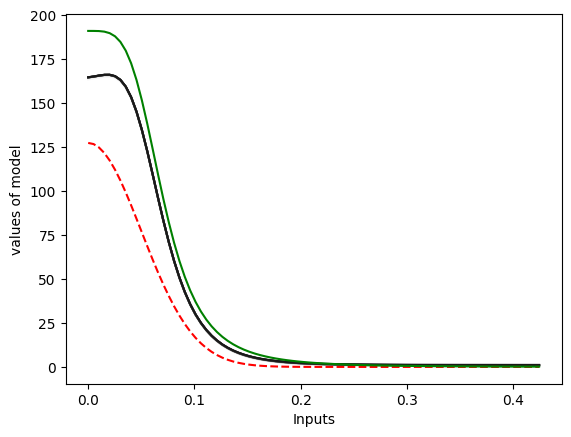

In [206]:
params_trajectory.shape
last_params_ori = []
nn_accuracy_ori = []
index_to_plot = 30
for i in range(ensemble_step+1):
    last_params_array = params_trajectory[i,index_to_plot,  :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_ori.append(last_params)
    nn_accuracy_ori.append(evaluate_nn_accuracy(last_params,model,center,local_size))
    
show_nn_trajectory(last_params_ori, model, 'Greys', center_x=0, center_y=0, size=85)

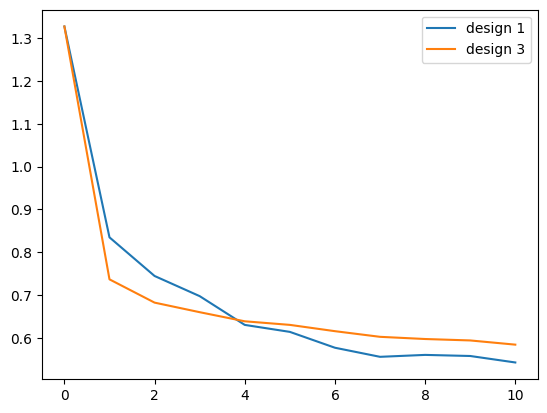

In [217]:
y_fs1 = np.zeros(ensemble_step+1)
for i in range(ensemble_step+1):
    last_params = reconstruct_array_to_dict( result_matrix_design_1[i,1],params)
    y_f, _ = sealed_convection_diffusion_nn(last_params, d_start, estimated_center, stage, model)
    y_fs1[i]=y_f
    
y_fs3 = np.zeros(ensemble_step+1)
for i in range(ensemble_step+1):
    last_params = reconstruct_array_to_dict( result_matrix_design_3[i,1],params)
    y_f, _ = sealed_convection_diffusion_nn(last_params, d_start, estimated_center, stage, model)
    y_fs3[i]=y_f

plt.plot(y_fs1,label='design 1')
plt.plot(y_fs3,label='design 3')
plt.legend()

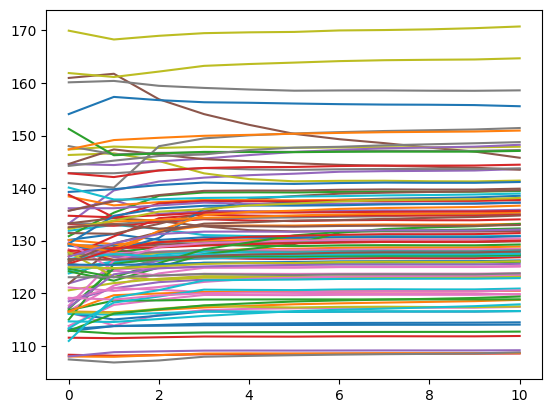

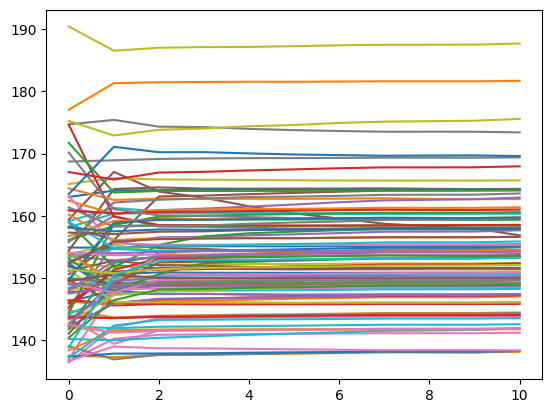

In [221]:
xy_combined = d_start1 - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)

array_reciprocal1 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent1 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_1 = np.zeros(ensemble_step+1)

for i in range(ensemble_size):
    for j in range(ensemble_step+1):
        last_params_array = result_matrix_design_1[j,i]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        array_nn = model.apply(last_params, xy_combined) * 70.0
        y_at_design = array_nn.squeeze()+array_reciprocal1
        y_at_design_array_1[j]=y_at_design
    
    plt.plot(y_at_design_array_1)

plt.show()

xy_combined = d_start3 - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)

array_reciprocal3 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent3 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_3 = np.zeros(ensemble_step+1)

for i in range(ensemble_size):
    for j in range(ensemble_step+1):
        last_params_array = result_matrix_design_3[j,i]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        array_nn = model.apply(last_params, xy_combined) * 70.0
        y_at_design = array_nn.squeeze()+array_reciprocal3
        y_at_design_array_3[j]=y_at_design
    
    plt.plot(y_at_design_array_3)
plt.show()

(array([ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  1.,  0.,  1.,  0.,
         0., 33., 46.,  6.,  4.,  3.,  1.,  0.,  0.,  1.,  1.,  0.,  0.,
         0.,  0.,  0.,  1.]),
 array([-1.20856452, -1.09248889, -0.97641327, -0.86033764, -0.74426201,
        -0.62818638, -0.51211076, -0.39603513, -0.2799595 , -0.16388388,
        -0.04780825,  0.06826738,  0.184343  ,  0.30041863,  0.41649426,
         0.53256989,  0.64864551,  0.76472114,  0.88079677,  0.99687239,
         1.11294802,  1.22902365,  1.34509927,  1.4611749 ,  1.57725053,
         1.69332616,  1.80940178,  1.92547741,  2.04155304,  2.15762866,
         2.27370429]),
 <BarContainer object of 30 artists>)

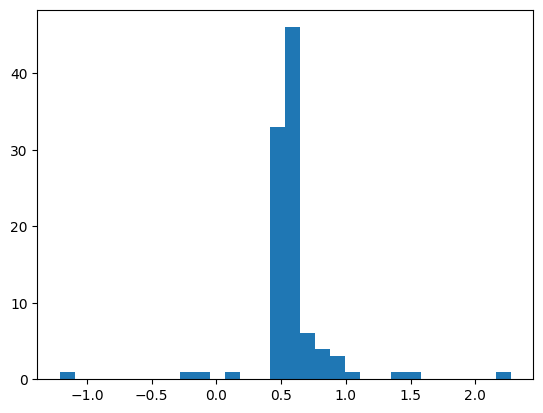

In [211]:
y_fs = np.zeros(ensemble_size)
for i in range(ensemble_size):
    last_params = reconstruct_array_to_dict(params_trajectory[-1,i],params)
    y_f, _ = sealed_convection_diffusion_nn(last_params, d_start, estimated_center, stage, model)
    y_fs[i]=y_f

plt.hist(y_fs,bins=30)

(array([ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  1.,  1.,  0.,  0.,
         0.,  3., 30., 37., 12.,  7.,  3.,  0.,  1.,  0.,  0.,  0.,  0.,
         0.,  1.,  1.,  1.]),
 array([-1.17023075, -1.06774055, -0.96525036, -0.86276016, -0.76026997,
        -0.65777977, -0.55528958, -0.45279938, -0.35030919, -0.24781899,
        -0.1453288 , -0.04283861,  0.05965159,  0.16214178,  0.26463198,
         0.36712217,  0.46961237,  0.57210256,  0.67459276,  0.77708295,
         0.87957315,  0.98206334,  1.08455354,  1.18704373,  1.28953393,
         1.39202412,  1.49451431,  1.59700451,  1.6994947 ,  1.8019849 ,
         1.90447509]),
 <BarContainer object of 30 artists>)

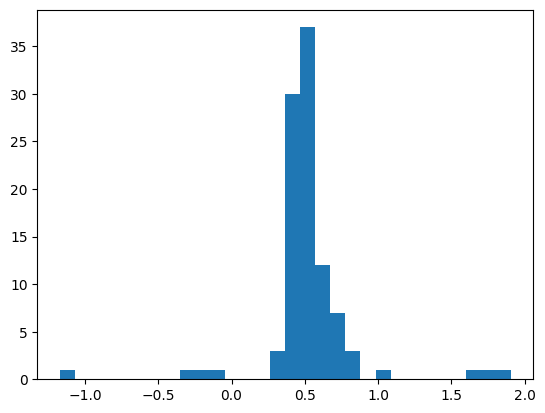

In [207]:
y_fs = np.zeros(ensemble_size)
for i in range(ensemble_size):
    last_params = reconstruct_array_to_dict(params_trajectory[-1,i],params)
    y_f, _ = sealed_convection_diffusion_nn(last_params, d_start, estimated_center, stage, model)
    y_fs[i]=y_f

plt.hist(y_fs,bins=30)

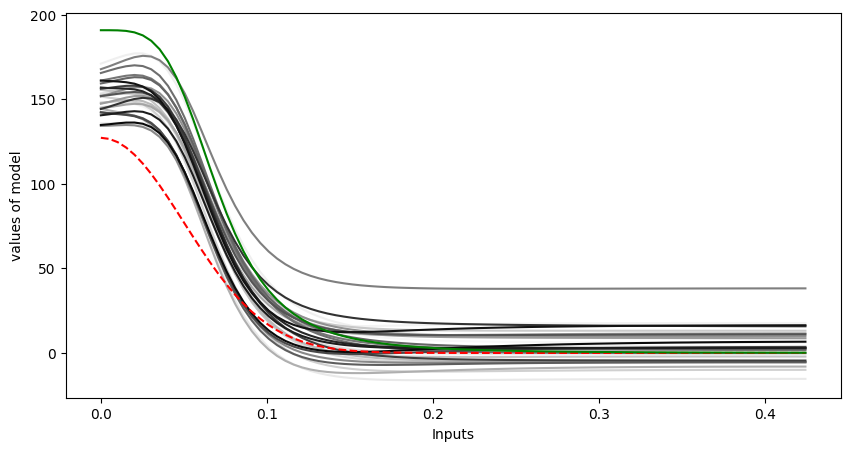

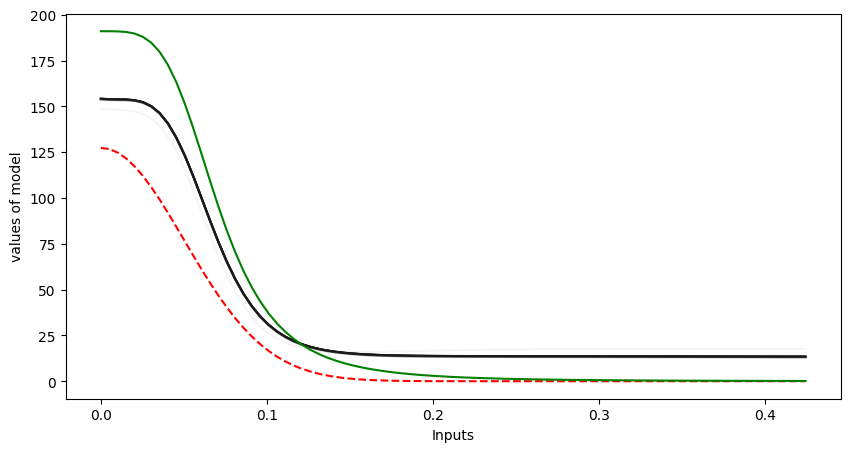

In [77]:
last_params_ori = []
nn_accuracy_ori = []
for i in range(ensemble_size):
    last_params_array = params_trajectory[0,i,  :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_ori.append(last_params)
    nn_accuracy_ori.append(evaluate_nn_accuracy(last_params,model,center,local_size))

plt.figure(figsize=(10, 5))
show_nn_trajectory(last_params_ori, model, 'Greys', center_x=0, center_y=0, size=85)

index_to_plot = 2
# step 20 

last_params_ori = []
nn_accuracy_ori = []
for i in range(ensemble_step+1):
    last_params_array = params_trajectory[i,index_to_plot,  :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_ori.append(last_params)
    nn_accuracy_ori.append(evaluate_nn_accuracy(last_params,model,center,local_size))

plt.figure(figsize=(10, 5))
show_nn_trajectory(last_params_ori, model, 'Greys', center_x=0, center_y=0, size=85)

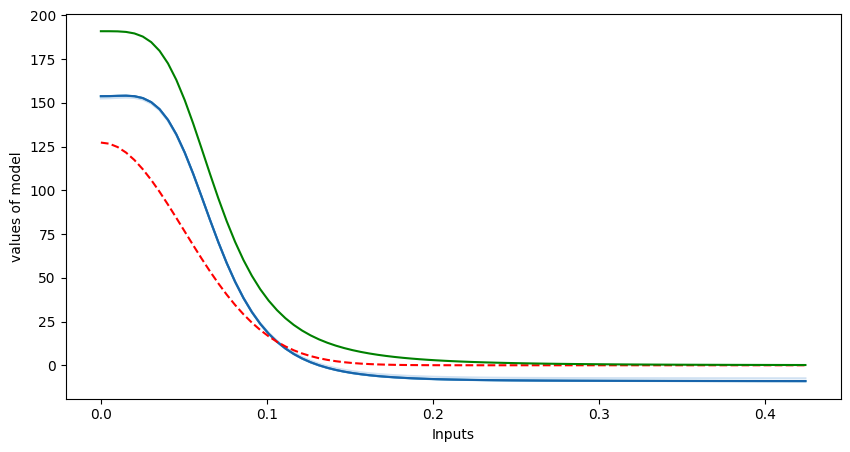

In [63]:
params_trajectory[:,1]
index_to_plot = 2
last_params_list3 = []
for i in range(ensemble_step+1):
    last_params_array = params_trajectory[i, index_to_plot, :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_list3.append(last_params)


#plt.figure(figsize=(10, 5))
#show_nn_trajectory(last_params_list3, model, 'Blues', center_x=0, center_y=0, size=85)

In [188]:
# 看一个sample的变化
def show_nn_trajectory(params_list, apply_model, colormap='Blues', center_x=0, center_y=0, size=85):
    x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    y = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    xy_combined = jnp.concatenate((x, y), axis=1)
    
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    
    cmap = plt.colormaps[colormap].resampled(len(params_list)+2)#cm.get_cmap('Blues', len(params_list))
    for index, params in enumerate(params_list):
        #if index not in [6]:
        #    continue
        array_nn = apply_model.apply(params, xy_combined) * 70.0
        
        plt.plot(jnp.sqrt(2) * x.squeeze(), 
                 (array_nn.squeeze() + array_reciprocal.squeeze()), 
                 label=f'NN + Reciprocal - Params {index+1}',
                 color=cmap(index+1))
    
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_exponent.squeeze(), color='r', linestyle = '--', label='Exponent')
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_reciprocal.squeeze(), color='g', label='Reciprocal')
    
    plt.ylabel('values of model')
    plt.xlabel('Inputs')

def calculate_nn_performence(params_list, apply_model, center_x=0, center_y=0, size=50):
    x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    y = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    xy_combined = jnp.concatenate((x, y), axis=1)
    
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    nn_list = np.zeros((len(params_list),size))
    
    for index, params in enumerate(params_list):
        array_nn = apply_model.apply(params, xy_combined) * 70.0
        nn_list[index]=array_nn.squeeze()+array_reciprocal.squeeze()

    return nn_list

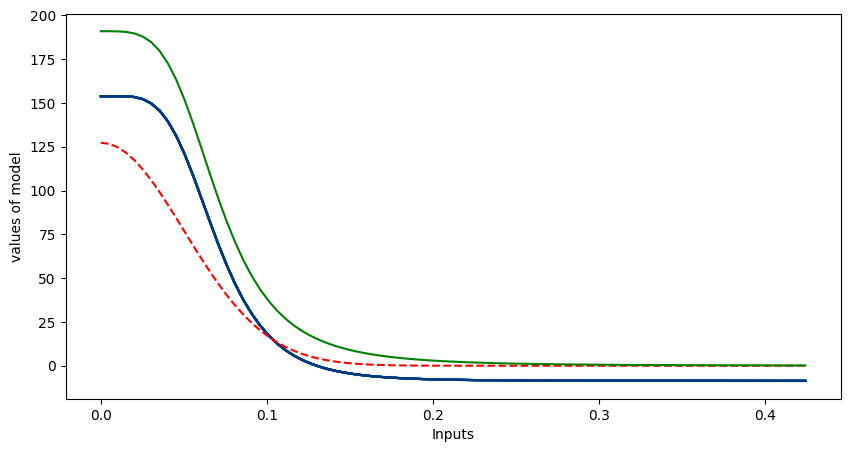

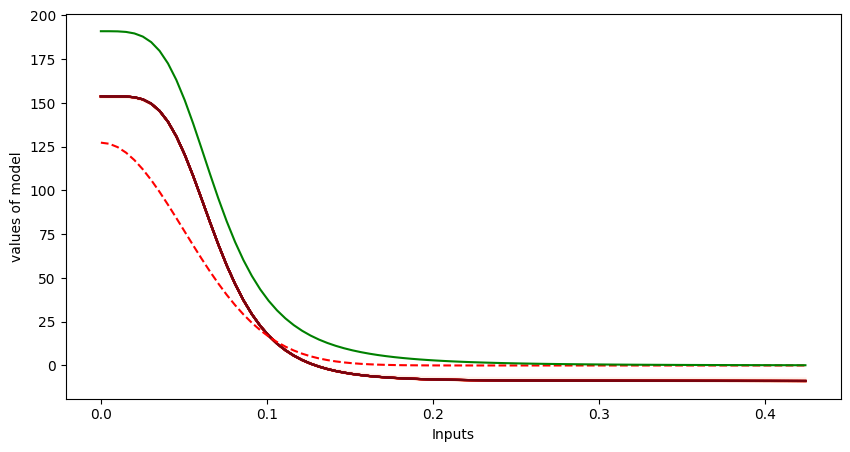

In [20]:
# 同一sample不同更新步

index_to_plot = 2

# 0.25，0.25
last_params_list3 = []
for i in range(ensemble_step+1):
    last_params_array = params_trajectory_good_design[i, index_to_plot, :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_list3.append(last_params)
    
plt.figure(figsize=(10, 5))
show_nn_trajectory(last_params_list3, model, 'Blues', center_x=0, center_y=0, size=85)

#index_to_plot = 3 # 0.15，0.15
last_params_list4 = []
for i in range(ensemble_step+1):
    last_params_array = params_trajectory_bad_design[i, index_to_plot, :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_list4.append(last_params)
    
plt.figure(figsize=(10, 5))
show_nn_trajectory(last_params_list4, model, 'Reds', center_x=0, center_y=0, size=85)

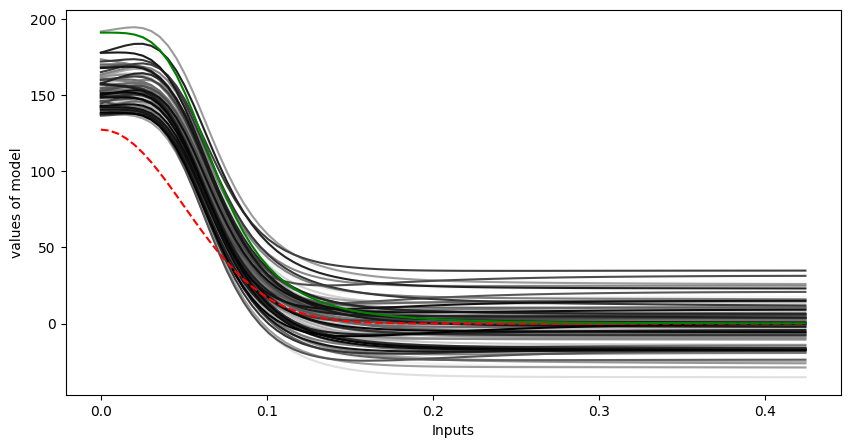

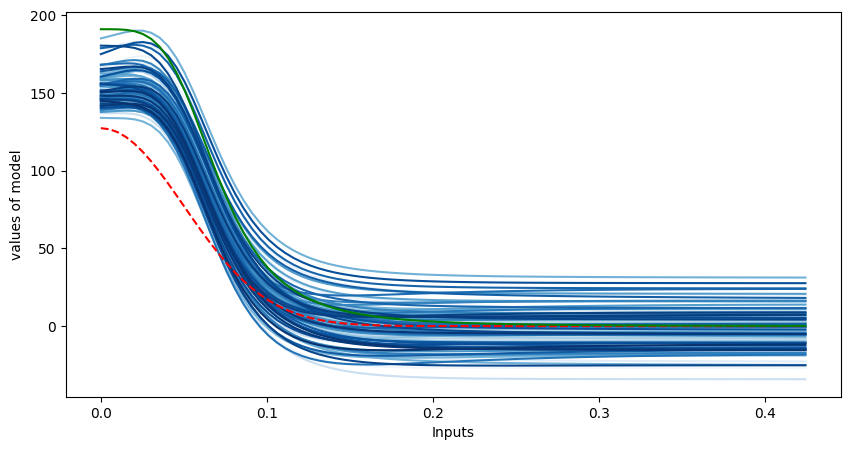

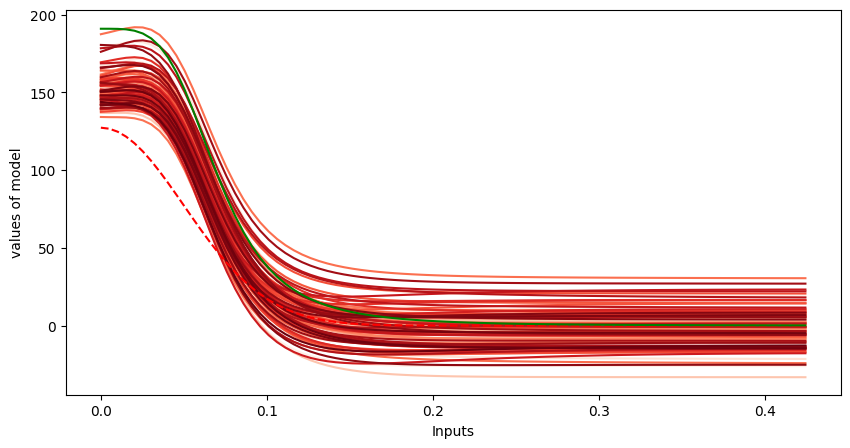

In [19]:
# 最后一步更新的所有sample

index_to_plot = 2
# step 20 

last_params_ori = []
nn_accuracy_ori = []
for i in range(ensemble_size):
    last_params_array = params_trajectory_good_design[0,i,  :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_ori.append(last_params)
    nn_accuracy_ori.append(evaluate_nn_accuracy(last_params,model,center,local_size))

plt.figure(figsize=(10, 5))
show_nn_trajectory(last_params_ori, model, 'Greys', center_x=0, center_y=0, size=85)

# 0.25，0.25
last_params_list3 = []
nn_accuracy_list3 = []
for i in range(ensemble_size):
    last_params_array = params_trajectory_good_design[index_to_plot,i,  :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_list3.append(last_params)
    nn_accuracy_list3.append(evaluate_nn_accuracy(last_params,model,center,local_size))
   
plt.figure(figsize=(10, 5)) 
show_nn_trajectory(last_params_list3, model, 'Blues', center_x=0, center_y=0, size=85)

#index_to_plot = 3 # 0.15，0.15
last_params_list4 = []
nn_accuracy_list4 = []
for i in range(ensemble_size):
    last_params_array = params_trajectory_bad_design[index_to_plot,i,  :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_list4.append(last_params)
    nn_accuracy_list4.append(evaluate_nn_accuracy(last_params,model,center,local_size))
    
plt.figure(figsize=(10, 5))
show_nn_trajectory(last_params_list4, model, 'Reds', center_x=0, center_y=0, size=85)

In [ ]:
# ensemble梯度下降法

In [86]:
# 使用一个design

In [5]:
import os
import pickle
import re
import gc
from flax.traverse_util import flatten_dict, unflatten_dict

def reconstruct_array_to_dict(params_grad_array, grads):
    """
    将扁平化后的数组重新构建回原始的 grads 字典。

    参数:
    - params_grad_array: 扁平化后的梯度数组
    - grads: 原始的 grads 字典，用于获取结构信息

    返回:
    - reconstructed_grads: 重建后的 grads 字典
    """
    # 获取原始 grads 的结构信息
    params_grad_flat = flatten_dict(grads)
    shapes = {k: v.shape for k, v in params_grad_flat.items()}

    # 将 params_grad_array 拆分成原始形状的数组
    index = 0
    reconstructed_params_grad_flat = {}
    for k, shape in shapes.items():
        size = size = int(np.prod(shape))  # 将形状转换为 numpy 数组，然后计算其大小
        reconstructed_params_grad_flat[k] = jnp.reshape(params_grad_array[index:index+size], shape)
        index += size

    # 将平坦化的字典恢复到原始的嵌套结构
    reconstructed_grads = unflatten_dict(reconstructed_params_grad_flat)

    return reconstructed_grads

def reconstruct_dict_to_array(grads):
    """
    将嵌套字典转换为扁平化的数组。

    参数:
    - grads: 嵌套的 grads 字典

    返回:
    - params_grad_array: 扁平化后的梯度数组
    """
    # 将字典展平
    params_grad_flat = flatten_dict(grads)
    
    # 获取所有梯度值，并将其展平
    flat_arrays = [jnp.ravel(v) for v in params_grad_flat.values()]
    
    # 将所有展平的数组拼接成一个单独的数组
    params_grad_array = jnp.concatenate(flat_arrays)
    
    return params_grad_array
    
def kl_divergence(mu1, sigma1, mu2, sigma2):
    # 计算逆矩阵和行列式
    sigma2_inv = jnp.linalg.inv(sigma2)
    #sigma1_det = jnp.linalg.det(sigma1)
    #sigma2_det = jnp.linalg.det(sigma2)
    
    # 计算各项
    term1 = jnp.trace(sigma2_inv @ sigma1)
    term2 = (mu2 - mu1).T @ sigma2_inv @ (mu2 - mu1)
    
    _, logdet_sigma1 = jnp.linalg.slogdet(sigma1)
    _, logdet_sigma2 = jnp.linalg.slogdet(sigma2)
    term3 = logdet_sigma2 - logdet_sigma1
    #term3 = jnp.log(sigma2_det / sigma1_det)
    
    # 计算最终的KL散度
    kl_div = 0.5 * (term1 + term2 - len(mu1) + term3)
    
    return kl_div
    
with open('all_data_nn_case_data_3_.pkl', 'rb') as f:
    loaded_data = pickle.load(f)

posterior_list = loaded_data["posterior_list"]
design_list = loaded_data["design_list"]
params_list = loaded_data["params_list"]


checkpoint_dir = './checkpoints/nn_case_data_3_EnGD_stage2_design3_refine'  # 修改dir ==================================
os.makedirs(checkpoint_dir, exist_ok=True)

# 自定义自然排序函数
def natural_key(filename):
    return [int(part) if part.isdigit() else part for part in re.split(r'(\d+)', filename)]

# 保存检查点的函数
def save_checkpoint(i,result_matrix,estimated_center,ensemble_size,ensemble_step):
    checkpoint = {
        'i': i,
        'result_matrix': result_matrix,
        'estimated_center': estimated_center,
        'ensemble_size': ensemble_size,
        'ensemble_step': ensemble_step
    }
    checkpoint_path = os.path.join(checkpoint_dir, f'checkpoint_i_{i}.pkl')
    with open(checkpoint_path, 'wb') as f:
        pickle.dump(checkpoint, f)

# 加载最近的检查点
def load_checkpoint():
    checkpoint_files = sorted([f for f in os.listdir(checkpoint_dir) if f.endswith('.pkl')], key=natural_key)
    if checkpoint_files:
        latest_checkpoint = checkpoint_files[-1]
        checkpoint_path = os.path.join(checkpoint_dir, latest_checkpoint)
        with open(checkpoint_path, 'rb') as f:
            checkpoint = pickle.load(f)
        return checkpoint
    return None

# 定义生成单个数组的函数
def generate_sample(key, mean, std_dev):
    return mean + std_dev * jax.random.normal(key, shape=mean.shape)

def loss_param_refine9(current_params, d_start, stage, estimated_center, model, observation):

    y_f, _ = sealed_convection_diffusion_nn(current_params, d_start, estimated_center, stage, model)
    loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=y_f, scale=noise_base_scale+noise_ratio_scale*jnp.abs(y_f))

    return -loglikelihood
    
stage = 2  # 修改stage ==================================
d_start = jnp.array([0.23,0.23])#jnp.array([0.27,0.27])
prior = posterior_list[stage-1]
params = params_list[stage-1]

mean_array = reconstruct_dict_to_array(params)
std_dev = 0.1  # 标准差
ensemble_size = 100  # 生成的数组数量
ensemble_step = 30



key_ensemble = jax.random.PRNGKey(0)  # 随机数种子
keys_ensemble = jax.random.split(key_ensemble, ensemble_size)

ensemble_members_array = jax.vmap(generate_sample, in_axes=(0, None, None))(keys_ensemble, mean_array, std_dev)



# 先更新后验，用上一个阶段的design
_, posterior = forward_posterior_infoGain(params, design_list[stage+1], stage, center, prior, noise_info, num_d, radio_d, key[stage], model)

del prior
prior = posterior 

num_top = 5
indices = jnp.argpartition(posterior .ravel(), -num_top)[-num_top:]
multi_indices = jnp.unravel_index(indices, posterior.shape)
average_x = np.mean(multi_indices[0])
average_y = np.mean(multi_indices[1])
estimated_center = jnp.array([average_x, average_y])/50
print(f'estimated center is {estimated_center}')



ensemble_optimizer = optax.adam(0.2)



print(f'design for model correction is {d_start}')
observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
print(f'measurement1 is: {observation}')
y0, _ = sealed_convection_diffusion_true(d_start, estimated_center, stage)
print(f'y0 is: {y0}')

noise_loc = 0
noise_base_scale = 0.05
noise_ratio_scale = 0.05
noise_info = [(noise_loc, noise_base_scale, noise_ratio_scale),]

#params_gd_list=[]



# 载入检查点，如果有的话
checkpoint = load_checkpoint()
if checkpoint:
    start_i = checkpoint['i']+1
    result_matrix = checkpoint['result_matrix']
    print(f'continue from i = {start_i}')
else:
    start_i = 0
    result_matrix = np.zeros((ensemble_step+1, ensemble_size, 65))
    result_matrix[0, :, :] = ensemble_members_array
    print('start from initial')



for i in range(start_i, ensemble_size):
    
    ensemble_current_params = reconstruct_array_to_dict(ensemble_members_array[i], params)
    ensemble_opt_state = ensemble_optimizer.init(ensemble_current_params)
        
    for j in range(ensemble_step):
        _, grad_params = jax.value_and_grad(loss_param_refine9)(ensemble_current_params, d_start, stage, estimated_center, model, observation)
        
        clip_norm = 1e10
        clip_transform = optax.clip_by_global_norm(clip_norm)
        clipped_grads, _ = clip_transform.update(grad_params, state=None)
        
        updates, ensemble_opt_state = ensemble_optimizer.update(clipped_grads, ensemble_opt_state, params=ensemble_current_params)
        
        updates_contain_nans = any(jnp.any(jnp.isnan(u)) for u in jax.tree_util.tree_leaves(updates))
        if updates_contain_nans:
            break
        else:
            
            ensemble_current_params = optax.apply_updates(ensemble_current_params, updates)
            ensemble_current_params_array = reconstruct_dict_to_array(ensemble_current_params)
            result_matrix[j+1, i, :] = ensemble_current_params_array
            print('.', end='')

        #params_gd_list.append(ensemble_current_params)
        
        # 保存检查点
        if j == ensemble_step-1:
            save_checkpoint(i, result_matrix, estimated_center, ensemble_size, ensemble_step)
    
    gc.collect()
    print('|',end='')

    
#kl_divergence(mean_matrix2, cov_matrix2, mean_matrix, cov_matrix)

estimated center is [0.236 0.236]
design for model correction is [0.23 0.23]
measurement1 is: 0.4537546634674072
y0 is: 0.504383385181427
continue from i = 85
..............................|..............................|..............................|..............................|..............................|..............................|..............................|..............................|..............................|..............................|..............................|..............................|..............................|..............................|..............................|

In [ ]:
# 使用两个design

In [68]:
import os
import pickle
import re
import gc
from flax.traverse_util import flatten_dict, unflatten_dict

def reconstruct_array_to_dict(params_grad_array, grads):
    """
    将扁平化后的数组重新构建回原始的 grads 字典。

    参数:
    - params_grad_array: 扁平化后的梯度数组
    - grads: 原始的 grads 字典，用于获取结构信息

    返回:
    - reconstructed_grads: 重建后的 grads 字典
    """
    # 获取原始 grads 的结构信息
    params_grad_flat = flatten_dict(grads)
    shapes = {k: v.shape for k, v in params_grad_flat.items()}

    # 将 params_grad_array 拆分成原始形状的数组
    index = 0
    reconstructed_params_grad_flat = {}
    for k, shape in shapes.items():
        size = size = int(np.prod(shape))  # 将形状转换为 numpy 数组，然后计算其大小
        reconstructed_params_grad_flat[k] = jnp.reshape(params_grad_array[index:index+size], shape)
        index += size

    # 将平坦化的字典恢复到原始的嵌套结构
    reconstructed_grads = unflatten_dict(reconstructed_params_grad_flat)

    return reconstructed_grads

def reconstruct_dict_to_array(grads):
    """
    将嵌套字典转换为扁平化的数组。

    参数:
    - grads: 嵌套的 grads 字典

    返回:
    - params_grad_array: 扁平化后的梯度数组
    """
    # 将字典展平
    params_grad_flat = flatten_dict(grads)
    
    # 获取所有梯度值，并将其展平
    flat_arrays = [jnp.ravel(v) for v in params_grad_flat.values()]
    
    # 将所有展平的数组拼接成一个单独的数组
    params_grad_array = jnp.concatenate(flat_arrays)
    
    return params_grad_array
    
def kl_divergence(mu1, sigma1, mu2, sigma2):
    # 计算逆矩阵和行列式
    sigma2_inv = jnp.linalg.inv(sigma2)
    #sigma1_det = jnp.linalg.det(sigma1)
    #sigma2_det = jnp.linalg.det(sigma2)
    
    # 计算各项
    term1 = jnp.trace(sigma2_inv @ sigma1)
    term2 = (mu2 - mu1).T @ sigma2_inv @ (mu2 - mu1)
    
    _, logdet_sigma1 = jnp.linalg.slogdet(sigma1)
    _, logdet_sigma2 = jnp.linalg.slogdet(sigma2)
    term3 = logdet_sigma2 - logdet_sigma1
    #term3 = jnp.log(sigma2_det / sigma1_det)
    
    # 计算最终的KL散度
    kl_div = 0.5 * (term1 + term2 - len(mu1) + term3)
    
    return kl_div
    
with open('all_data_nn_case_data_3_.pkl', 'rb') as f:
    loaded_data = pickle.load(f)

posterior_list = loaded_data["posterior_list"]
design_list = loaded_data["design_list"]
params_list = loaded_data["params_list"]


checkpoint_dir = './checkpoints/nn_case_data_3_EnGD_stage2_design1_refine'  # 修改dir ==================================
os.makedirs(checkpoint_dir, exist_ok=True)

# 自定义自然排序函数
def natural_key(filename):
    return [int(part) if part.isdigit() else part for part in re.split(r'(\d+)', filename)]

# 保存检查点的函数
def save_checkpoint(i,result_matrix,estimated_center,ensemble_size,ensemble_step):
    checkpoint = {
        'i': i,
        'result_matrix': result_matrix,
        'estimated_center': estimated_center,
        'ensemble_size': ensemble_size,
        'ensemble_step': ensemble_step
    }
    checkpoint_path = os.path.join(checkpoint_dir, f'checkpoint_i_{i}.pkl')
    with open(checkpoint_path, 'wb') as f:
        pickle.dump(checkpoint, f)

# 加载最近的检查点
def load_checkpoint():
    checkpoint_files = sorted([f for f in os.listdir(checkpoint_dir) if f.endswith('.pkl')], key=natural_key)
    if checkpoint_files:
        latest_checkpoint = checkpoint_files[-1]
        checkpoint_path = os.path.join(checkpoint_dir, latest_checkpoint)
        with open(checkpoint_path, 'rb') as f:
            checkpoint = pickle.load(f)
        return checkpoint
    return None

# 定义生成单个数组的函数
def generate_sample(key, mean, std_dev):
    return mean + std_dev * jax.random.normal(key, shape=mean.shape)


def loss_param_refine10(current_params, d_start_list, stage, estimated_center, model, observation, observation_pre):
    
    i1 = (d_start_list[0][0]-lo_b)/(up_b-lo_b)*(size-1)
    j1 = (d_start_list[0][1]-lo_b)/(up_b-lo_b)*(size-1)
    i2 = (d_start_list[1][0]-lo_b)/(up_b-lo_b)*(size-1)
    j2 = (d_start_list[1][1]-lo_b)/(up_b-lo_b)*(size-1)
    
    _, u = sealed_convection_diffusion_nn(current_params, d_start, estimated_center, stage, model)
    y_f1 = jax.scipy.ndimage.map_coordinates(u,[i1,j1],1)
    
    loglikelihood1 = jax.scipy.stats.norm.logpdf(observation, loc=y_f1, scale=noise_base_scale+noise_ratio_scale*jnp.abs(y_f1))
    
    y_f2 = jax.scipy.ndimage.map_coordinates(u,[i2,j2],1)
    loglikelihood2 = jax.scipy.stats.norm.logpdf(observation_pre, loc=y_f2, scale=noise_base_scale+noise_ratio_scale* jnp.abs(y_f2))

    return -loglikelihood1-loglikelihood2
    
stage = 2  # 修改stage ==================================
d_start = jnp.array([0.25,0.26])#jnp.array([0.23,0.26])#jnp.array([0.26,0.26])#design_list[stage+1]#
d_start_list = [d_start, jnp.array([0.25,0.29])]
prior = posterior_list[stage-1]
params = params_list[stage-1]

mean_array = reconstruct_dict_to_array(params)
std_dev = 0.1  # 标准差
ensemble_size = 3  # 生成的数组数量
ensemble_step = 30



key_ensemble = jax.random.PRNGKey(0)  # 随机数种子
keys_ensemble = jax.random.split(key_ensemble, ensemble_size)

ensemble_members_array = jax.vmap(generate_sample, in_axes=(0, None, None))(keys_ensemble, mean_array, std_dev)



# 先更新后验，用上一个阶段的design
_, posterior = forward_posterior_infoGain(params, design_list[stage+1], stage, center, prior, noise_info, num_d, radio_d, key[stage], model)

del prior
prior = posterior 

num_top = 5
indices = jnp.argpartition(posterior .ravel(), -num_top)[-num_top:]
multi_indices = jnp.unravel_index(indices, posterior.shape)
average_x = np.mean(multi_indices[0])
average_y = np.mean(multi_indices[1])
estimated_center = jnp.array([average_x, average_y])/50
print(f'estimated center is {estimated_center}')



ensemble_optimizer = optax.adam(0.2)



print(f'design for model correction is {d_start}')
observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
print(f'measurement1 is: {observation}')
y01, _ = sealed_convection_diffusion_true(d_start, estimated_center, stage)
print(f'y01 is: {y01}')
observation_pre, _ = sealed_convection_diffusion_true(d_start_list[1], center, stage)
print(f'measurement2 is: {observation_pre}')
y02, _ = sealed_convection_diffusion_true(d_start_list[1], estimated_center, stage)
print(f'y02 is: {y02}')


noise_loc = 0
noise_base_scale = 0.05
noise_ratio_scale = 0.05
noise_info = [(noise_loc, noise_base_scale, noise_ratio_scale),]

params_gd_list=[]



# 载入检查点，如果有的话
checkpoint = load_checkpoint()
if checkpoint:
    start_i = checkpoint['i']+1
    result_matrix = checkpoint['result_matrix']
    print(f'continue from i = {start_i}')
else:
    start_i = 0
    result_matrix = np.zeros((ensemble_step+1, ensemble_size, 65))
    result_matrix[0, :, :] = ensemble_members_array
    print('start from initial')



for i in range(start_i, ensemble_size):
    
    ensemble_current_params = reconstruct_array_to_dict(ensemble_members_array[i], params)
    ensemble_opt_state = ensemble_optimizer.init(ensemble_current_params)
        
    for j in range(ensemble_step):
        #_, grad_params = jax.value_and_grad(loss_param_refine5)(ensemble_current_params, d_start, stage, estimated_center, model, observation)
        _, grad_params = jax.value_and_grad(loss_param_refine10)(ensemble_current_params, d_start_list, stage, estimated_center, model, observation, observation_pre)
        
        clip_norm = 1e10
        clip_transform = optax.clip_by_global_norm(clip_norm)
        clipped_grads, _ = clip_transform.update(grad_params, state=None)
        
        updates, ensemble_opt_state = ensemble_optimizer.update(clipped_grads, ensemble_opt_state, params=ensemble_current_params)
        
        updates_contain_nans = any(jnp.any(jnp.isnan(u)) for u in jax.tree_util.tree_leaves(updates))
        if updates_contain_nans:
            break
        else:
            
            ensemble_current_params = optax.apply_updates(ensemble_current_params, updates)
            ensemble_current_params_array = reconstruct_dict_to_array(ensemble_current_params)
            result_matrix[j+1, i] = ensemble_current_params_array
            print('.', end='')

        params_gd_list.append(ensemble_current_params)
        
        # 保存检查点
        if j == ensemble_step-1:
            save_checkpoint(i, result_matrix, estimated_center, ensemble_size, ensemble_step)
    
    gc.collect()
    print('|',end='')

    
#kl_divergence(mean_matrix2, cov_matrix2, mean_matrix, cov_matrix)

estimated center is [0.236 0.236]
design for model correction is [0.25 0.26]
measurement1 is: 0.5331098437309265
y01 is: 0.5501561164855957
measurement2 is: 0.5283483266830444
y02 is: 0.5287258625030518
start from initial
..............................|..............................|..............................|

In [33]:
d_start1 = jnp.array([0.27,0.27])
d_start2 = jnp.array([0.23,0.26])

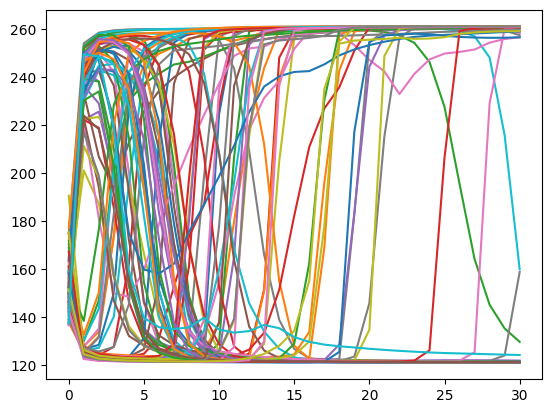

In [7]:
xy_combined = d_start - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)

array_reciprocal4 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent4 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_4 = np.zeros(ensemble_step+1)

for i in range(ensemble_size):
    for j in range(ensemble_step+1):
        last_params_array = result_matrix[j,i]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        array_nn = model.apply(last_params, xy_combined) * 70.0
        y_at_design = array_nn.squeeze()+array_reciprocal4
        y_at_design_array_4[j]=y_at_design
    
    plt.plot(y_at_design_array_4)

#plt.axhline(array_exponent4)

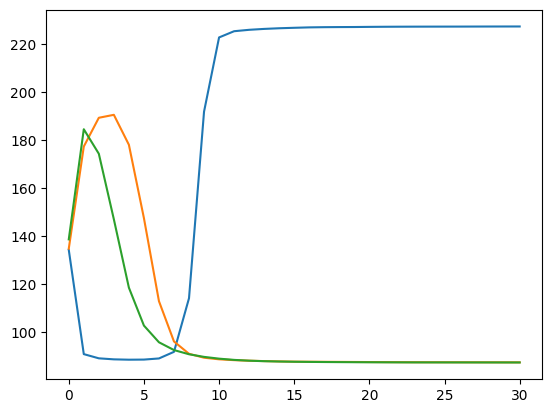

In [60]:
xy_combined = d_start - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)

array_reciprocal4 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent4 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_4 = np.zeros(ensemble_step+1)

for i in [0,1,2]:
    for j in range(ensemble_step+1):
        last_params_array = result_matrix[j,i]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        array_nn = model.apply(last_params, xy_combined) * 70.0
        y_at_design = array_nn.squeeze()+array_reciprocal4
        y_at_design_array_4[j]=y_at_design
    
    plt.plot(y_at_design_array_4)

#plt.axhline(array_exponent4)

(Array(0.5203745, dtype=float32), Array(0.51000106, dtype=float32))

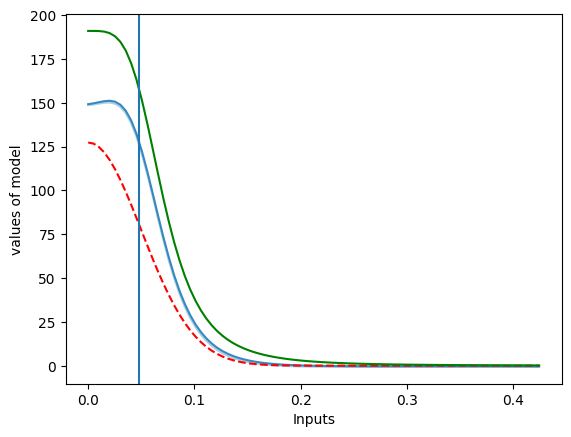

In [42]:
distance = np.sqrt(np.sum((estimated_center-d_start)**2))
show_nn_trajectory([params,ensemble_current_params], model, 'Blues', center_x=0, center_y=0, size=85)
plt.axvline(distance)
sealed_convection_diffusion_nn(params, d_start, estimated_center, stage, model)[0], sealed_convection_diffusion_nn(ensemble_current_params, d_start, estimated_center, stage, model)[0]

In [12]:
def show_nn_trajectory(params_list, apply_model, colormap='Blues', center_x=0, center_y=0, size=85):
    x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    y = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    xy_combined = jnp.concatenate((x, y), axis=1)
    
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    
    cmap = plt.colormaps[colormap].resampled(len(params_list)+2)#cm.get_cmap('Blues', len(params_list))
    for index, params in enumerate(params_list):
        #if index not in [6]:
        #    continue
        array_nn = apply_model.apply(params, xy_combined) * 70.0
        
        plt.plot(jnp.sqrt(2) * x.squeeze(), 
                 (array_nn.squeeze() + array_reciprocal.squeeze()), 
                 label=f'NN + Reciprocal - Params {index+1}',
                 color=cmap(index+1))
    
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_exponent.squeeze(), color='r', linestyle = '--', label='Exponent')
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_reciprocal.squeeze(), color='g', label='Reciprocal')
    
    plt.ylabel('values of model')
    plt.xlabel('Inputs')
    
def calculate_nn_performence(params_list, apply_model, center_x=0, center_y=0, size=50):
    x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    y = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    xy_combined = jnp.concatenate((x, y), axis=1)
    
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    nn_list = np.zeros((len(params_list),size))
    
    for index, params in enumerate(params_list):
        array_nn = apply_model.apply(params, xy_combined) * 70.0
        nn_list[index]=array_nn.squeeze()+array_reciprocal.squeeze()

    return nn_list

In [ ]:
# Ensemble gradient descent 的数据

In [8]:
import os
import pickle

#checkpoint_file_path = './checkpoints/nn_case_data_2_engd_stage2_design2_check/checkpoint_i_99_j_19.pkl'
checkpoint_file_path = './checkpoints/nn_case_data_3_EnGD_stage2_design3_refine/checkpoint_i_99.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
#start_i = checkpoint_data['i']
#start_j = checkpoint_data['j']
result_matrix_design_3 = checkpoint_data['result_matrix']
#estimated_center_4 = checkpoint_data['estimated_center']
#ensemble_current_params_4 = checkpoint_data['ensemble_current_params']

import os
import pickle

#checkpoint_file_path = './checkpoints/nn_case_data_2_engd_stage2_design2_check/checkpoint_i_99_j_19.pkl'
checkpoint_file_path = './checkpoints/nn_case_data_3_EnGD_stage2_design2_refine/checkpoint_i_99.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
#start_i = checkpoint_data['i']
#start_j = checkpoint_data['j']
result_matrix_design_2 = checkpoint_data['result_matrix']
#estimated_center_4 = checkpoint_data['estimated_center']
#ensemble_current_params_4 = checkpoint_data['ensemble_current_params']

import os
import pickle

#checkpoint_file_path = './checkpoints/nn_case_data_2_engd_stage2_design2_check/checkpoint_i_99_j_19.pkl'
checkpoint_file_path = './checkpoints/nn_case_data_3_EnGD_stage2_design1_refine/checkpoint_i_99.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
#start_i = checkpoint_data['i']
#start_j = checkpoint_data['j']
result_matrix_design_1 = checkpoint_data['result_matrix']
#estimated_center_4 = checkpoint_data['estimated_center']
#ensemble_current_params_4 = checkpoint_data['ensemble_current_params']

Checkpoint data loaded successfully.
Checkpoint data loaded successfully.
Checkpoint data loaded successfully.


In [ ]:
# 查看nn的曲线

In [14]:
#grid_size=50
#ensemble_size = 100  # 生成的数组数量
#ensemble_step = 20
grid_size=50
ensemble_size = 100  # 生成的数组数量
ensemble_step = 30

mean_trajectory3 = np.zeros((ensemble_step+1,grid_size))
std_trajectory3 = np.zeros((ensemble_step+1,grid_size))
mean_trajectory2 = np.zeros((ensemble_step+1,grid_size))
std_trajectory2 = np.zeros((ensemble_step+1,grid_size))
mean_trajectory1 = np.zeros((ensemble_step+1,grid_size))
std_trajectory1 = np.zeros((ensemble_step+1,grid_size))


for j in range(ensemble_step+1):
    params_dict_list1 = []
    for i in range(ensemble_size):
        last_params_array = result_matrix_design_1[j,i,:]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        params_dict_list1.append(last_params)
        
    nn_performence1 = calculate_nn_performence(params_dict_list1, model, center_x=0, center_y=0, size=grid_size)
    mean_trajectory1[j]=np.mean(nn_performence1,axis=0)
    std_trajectory1[j]=np.std(nn_performence1,axis=0)
    print('.',end='')

print('|')
    
for j in range(ensemble_step+1):
    params_dict_list2 = []
    for i in range(ensemble_size):
        last_params_array = result_matrix_design_2[j,i,:]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        params_dict_list2.append(last_params)
        
    nn_performence2 = calculate_nn_performence(params_dict_list2, model, center_x=0, center_y=0, size=grid_size)
    mean_trajectory2[j]=np.mean(nn_performence2,axis=0)
    std_trajectory2[j]=np.std(nn_performence2,axis=0)
    print('.',end='')
    
print('|')

for j in range(ensemble_step+1):
    params_dict_list3 = []
    for i in range(ensemble_size):
        last_params_array = result_matrix_design_3[j,i,:]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        params_dict_list3.append(last_params)
        
    nn_performence3 = calculate_nn_performence(params_dict_list3, model, center_x=0, center_y=0, size=grid_size)
    mean_trajectory3[j]=np.mean(nn_performence3,axis=0)
    std_trajectory3[j]=np.std(nn_performence3,axis=0)
    print('.',end='')
print('|')

...............................|
...............................|
...............................|


In [24]:
d_start1 = jnp.array([0.27,0.27])
d_start2 = jnp.array([0.25,0.26])
d_start3 = jnp.array([0.23,0.23])
distance1 = np.sqrt(np.sum(d_start1-estimated_center)**2)
distance2 = np.sqrt(np.sum(d_start2-estimated_center)**2)
distance3 = np.sqrt(np.sum(d_start3-estimated_center)**2)

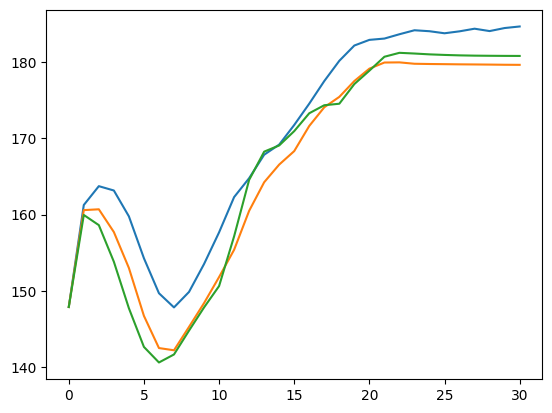

In [23]:
# 画出在网络的某一个位置上输出均值随时间的变化
plt.plot(mean_trajectory3[:,4])

In [36]:
d_start, estimated_center

(Array([0.23, 0.26], dtype=float32), Array([0.236, 0.236], dtype=float32))

In [40]:
d_start = jnp.array([0.23,0.26])
np.sqrt(np.sum((d_start - estimated_center)**2))


observation_pre, _ = sealed_convection_diffusion_true(design_list[stage], center, stage)
print(f'measurement of previous design is: {observation_pre}')

y0, _ = sealed_convection_diffusion_true(design_list[stage], estimated_center, stage)
print(f'y0 is: {y0}')

observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
print(f'measurement of current design is: {observation}')

y0, _ = sealed_convection_diffusion_true(d_start, estimated_center, stage)
print(f'y0 is: {y0}')

measurement of previous design is: 0.5270097851753235
y0 is: 0.5043683052062988
measurement of current design is: 0.49764180183410645
y0 is: 0.528647780418396


In [42]:
d_start = jnp.array([0.27,0.27])
np.sqrt(np.sum((d_start - estimated_center)**2))


observation_pre, _ = sealed_convection_diffusion_true(design_list[stage], center, stage)
print(f'measurement of previous design is: {observation_pre}')

y0, _ = sealed_convection_diffusion_true(design_list[stage], estimated_center, stage)
print(f'y0 is: {y0}')

observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
print(f'measurement of current design is: {observation}')

y0, _ = sealed_convection_diffusion_true(d_start, estimated_center, stage)
print(f'y0 is: {y0}')

measurement of previous design is: 0.5270097851753235
y0 is: 0.5043683052062988
measurement of current design is: 0.5494154095649719
y0 is: 0.547711968421936


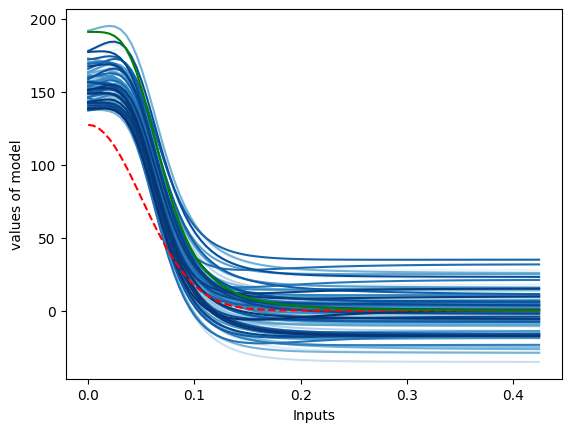

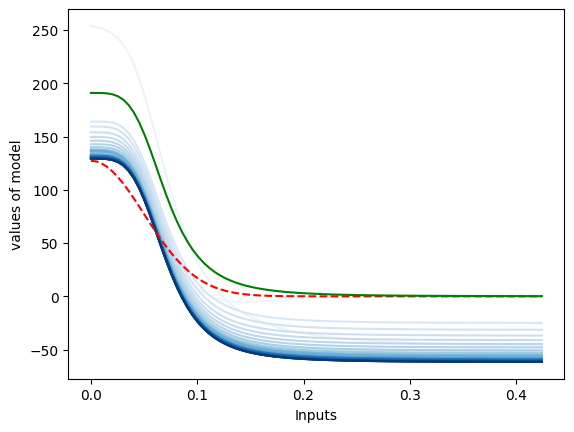

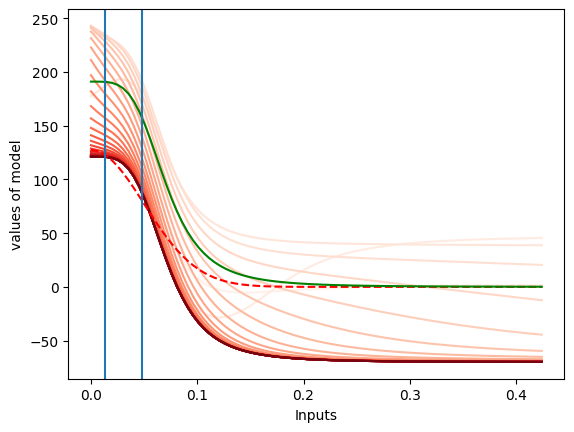

In [30]:
params_dict_list = []
for j in [0]:
    for i in range(ensemble_size):
        last_params_array = result_matrix_design_4[j,i,:]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        params_dict_list.append(last_params)
        
show_nn_trajectory(params_dict_list, model, 'Blues', center_x=0, center_y=0, size=85)
plt.show()

params_dict_list = []
for j in range(ensemble_step+1):
    for i in [12]:
        last_params_array = result_matrix_design_3[j,i,:]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        params_dict_list.append(last_params)
        
show_nn_trajectory(params_dict_list, model, 'Blues', center_x=0, center_y=0, size=85)
plt.axvline(np.sqrt(np.sum((d_start1 - estimated_center)**2)))
plt.axvline(np.sqrt(np.sum((d_start_list[1] - estimated_center)**2)))
plt.show()

params_dict_list = []
for j in range(ensemble_step+1):
    for i in [12]:
        last_params_array = result_matrix_design_4[j,i,:]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        params_dict_list.append(last_params)
        
show_nn_trajectory(params_dict_list, model, 'Reds', center_x=0, center_y=0, size=85)
plt.axvline(np.sqrt(np.sum((d_start1 - estimated_center)**2)))
plt.axvline(np.sqrt(np.sum((d_start_list[1] - estimated_center)**2)))
plt.show()

params_dict_list = []
#for j in range(ensemble_step+1):
#    for i in [12]:
#        last_params_array = result_matrix_design_4[j,i,:]
#        last_params = reconstruct_array_to_dict(last_params_array,params)
#        params_dict_list.append(last_params)
#        
#show_nn_trajectory(params_dict_list, model, 'Blues', center_x=0, center_y=0, size=85)

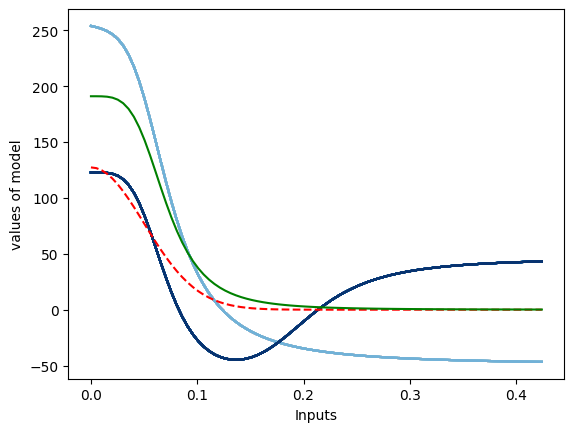

In [61]:
params_dict_list = []
for j in [1]:
    for i in range(ensemble_size):
        last_params_array = result_matrix_design_3[j,i,:]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        params_dict_list.append(last_params)
        
show_nn_trajectory(params_dict_list, model, 'Blues', center_x=0, center_y=0, size=85)
plt.show()

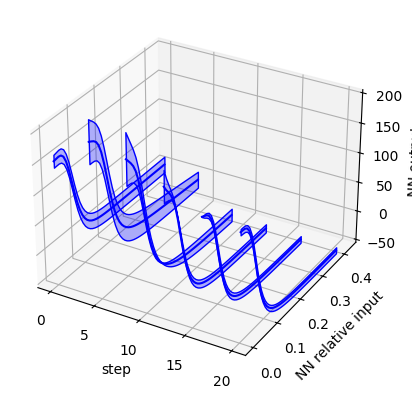

In [71]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

# 创建 3D 图形对象
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# 定义 x 轴数据
x = np.linspace(0, 0.3, grid_size).reshape(-1, 1)
x = np.sqrt(2) * x.squeeze()

# 循环绘制每一行曲线并填充 y_up 和 y_down 之间的区域
for i in [0, 4, 8, 12, 16, 20]:
    y = mean_trajectory3[i, :]
    y_up = mean_trajectory3[i, :] + std_trajectory3[i, :]
    y_down = mean_trajectory3[i, :] - std_trajectory3[i, :]
    z = np.full_like(x, i)
    
    # 绘制平均值、y_up 和 y_down 的曲线
    ax.plot(z, x, y, color='b')
    
    # 填充 y_up 和 y_down 之间的区域
    # 创建封闭的多边形顶点
    verts = []
    for j in range(len(x)):
        verts.append([z[j], x[j], y_down[j]])
    for j in reversed(range(len(x))):
        verts.append([z[j], x[j], y_up[j]])
    
    poly = Poly3DCollection([verts], color='b', alpha=0.3)
    ax.add_collection3d(poly)

# 设置轴标签
ax.set_xlabel('step')
ax.set_ylabel('NN relative input')
ax.set_zlabel('NN output')
ax.set_zlim([-50,200])

# 显示图形
plt.show()


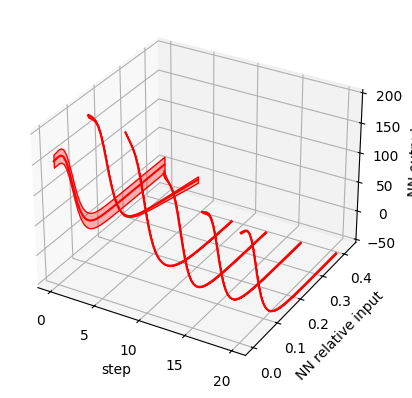

In [72]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

# 创建 3D 图形对象
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# 定义 x 轴数据
x = np.linspace(0, 0.3, grid_size).reshape(-1, 1)
x = np.sqrt(2) * x.squeeze()

# 循环绘制每一行曲线并填充 y_up 和 y_down 之间的区域
for i in [0, 4, 8, 12, 16, 20]:
    y = mean_trajectory4[i, :]
    y_up = mean_trajectory4[i, :] + std_trajectory4[i, :]
    y_down = mean_trajectory4[i, :] - std_trajectory4[i, :]
    z = np.full_like(x, i)
    
    # 绘制平均值、y_up 和 y_down 的曲线
    ax.plot(z, x, y, color='r')
    
    # 填充 y_up 和 y_down 之间的区域
    # 创建封闭的多边形顶点
    verts = []
    for j in range(len(x)):
        verts.append([z[j], x[j], y_down[j]])
    for j in reversed(range(len(x))):
        verts.append([z[j], x[j], y_up[j]])
    
    poly = Poly3DCollection([verts], color='r', alpha=0.3)
    ax.add_collection3d(poly)

# 设置轴标签
ax.set_xlabel('step')
ax.set_ylabel('NN relative input')
ax.set_zlabel('NN output')
ax.set_zlim([-50,200])

# 显示图形
plt.show()


In [20]:
np.sqrt(np.sum((d_start - estimated_center)**2))/np.sqrt(2)/0.3*50, np.sqrt(np.sum((d_start_list[1] - estimated_center)**2))/np.sqrt(2)/0.3*50

(2.915474659971187, 1.5191100561347892)

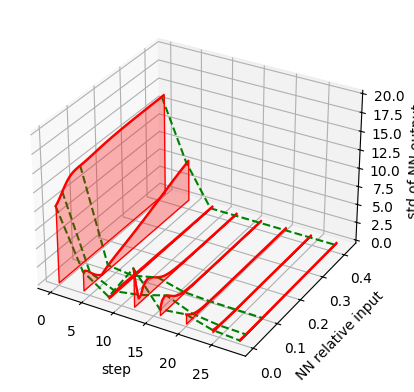

In [32]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

x = np.linspace(0, 0.3, grid_size).reshape(-1, 1)
x = np.sqrt(2) * x.squeeze()

for i in [0, 4, 8, 12, 16, 20, 24, 28]:
    y4 = std_trajectory4[i, :]
    z = np.full_like(x, i)
    
    # 绘制平均值、y_up 和 y_down 的曲线
    ax.plot(z, x, y4, color='r')
    
    # 填充 y_up 和 y_down 之间的区域
    # 创建封闭的多边形顶点
    
    verts = []
    for j in range(len(x)):
        verts.append([z[j], x[j], 0])
    for j in reversed(range(len(x))):
        verts.append([z[j], x[j], y4[j]])
    
    poly = Poly3DCollection([verts], color='r', alpha=0.3)
    ax.add_collection3d(poly)

# 设置轴标签
ax.set_xlabel('step')
ax.set_ylabel('NN relative input')
ax.set_zlabel('std of NN output')
ax.set_zlim([0,20])

d_start

for i in [0,3,11,49]:
    ax.plot(np.array([0, 4, 8, 12, 16, 20, 24, 28]),np.ones(8)*i/50*np.max(x),std_trajectory4[[0, 4, 8, 12, 16, 20, 24, 28], i],color='green',linestyle='--')

In [ ]:
# 查看pde的输出那个值随时间的变化

In [49]:
#grid_size=50
#ensemble_size = 100  # 生成的数组数量
#ensemble_step = 20
#
#stage = 2
#
#for k in range(2):
#    if k == 0:
#        d_start = design_list[stage+1]
#    elif k==1:
#        d_start = jnp.array([0.17,0.17])


grid_size=50
ensemble_size = 100  # 生成的数组数量
ensemble_step = 30

stage = 2

for k in range(3):
    if k == 0:
        d_start = d_start1
    elif k==1:
        d_start = d_start2
    elif k==2:
        d_start = d_start3
        
    prior = posterior_list[stage-1]
    params = params_list[stage-1]
    
    
    try:
        del tx2
        del lr_schedule2
        del opt_state2
    except:
        pass 
     
    
    print(f'estimated center is {estimated_center_coor}')

    if k == 0:
        y_fs_design_3 = np.zeros((ensemble_step+1, ensemble_size))
        for j in range(ensemble_step+1):
            params_dict_list = []
            for i in range(ensemble_size):
                last_params_array = result_matrix_design_3[j,i,:]
                last_params = reconstruct_array_to_dict(last_params_array,params)
                y_f, _ = sealed_convection_diffusion_nn(last_params, d_start, estimated_center_coor, stage, model)
                y_fs_design_3[j,i]=y_f
                print('.',end='')
        print('|',end='')
    elif k == 1:
        y_fs_design_4 = np.zeros((ensemble_step+1, ensemble_size))
        for j in range(ensemble_step+1):
            params_dict_list = []
            for i in range(ensemble_size):
                last_params_array = result_matrix_design_4[j,i,:]
                last_params = reconstruct_array_to_dict(last_params_array,params)
                y_f, _ = sealed_convection_diffusion_nn(last_params, d_start, estimated_center_coor, stage, model)
                y_fs_design_4[j,i]=y_f
                print('.',end='')
        print('|',end='')
    
    

design for model correction is [0.27 0.27]
measurement is: 0.5494154095649719
estimated center is [0.23200001 0.26      ]
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

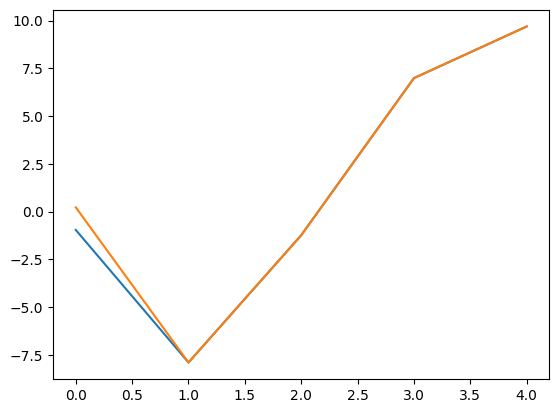

In [66]:
plt.plot(range(0,5),y_fs_design_4[0:5,16])
plt.plot(range(0,5),y_fs_design_4[0:5,30])

In [75]:
checkpoint_dir = './checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)

pkl_file_path = os.path.join(checkpoint_dir, 'nn_case_data_3_EnGD_stage2.pkl')

with open(pkl_file_path, 'wb') as f:
    # 把所有需要保存的数组打包成一个字典
    data_to_save = {
        'ensemble_size': ensemble_size,
        'ensemble_step': ensemble_step,
        'y_fs_design_3': y_fs_design_3,
        'y_fs_design_4': y_fs_design_4,
        'y_at_design_array_3': y_at_design_array_3,
        'y_at_design_array_4': y_at_design_array_4,
        'array_exponent3': array_exponent3,
        'array_exponent4': array_exponent4
    }
    pickle.dump(data_to_save, f)


In [47]:
import pickle
import os

# 指定的读取路径
checkpoint_dir = './checkpoints'
pkl_file_path = os.path.join(checkpoint_dir, 'nn_case_data_3_EnGD_stage2.pkl')

# 从 pkl 文件中读取数据
with open(pkl_file_path, 'rb') as f:
    loaded_data = pickle.load(f)

# 读取后的数据将是你保存时的字典格式
ensemble_size = loaded_data['ensemble_size']
ensemble_step = loaded_data['ensemble_step']
y_fs_design_3 = loaded_data['y_fs_design_3']
y_fs_design_4 = loaded_data['y_fs_design_4']
y_at_design_array_3 = loaded_data['y_at_design_array_3']
y_at_design_array_4 = loaded_data['y_at_design_array_4']
array_exponent3 = loaded_data['array_exponent3']
array_exponent4 = loaded_data['array_exponent4']

print("数据读取成功：")
print(f"ensemble_size: {ensemble_size}")
print(f"ensemble_step: {ensemble_step}")

KeyError: 'y_fs_design_3'

In [65]:
asd3=y_fs_design_3
asd4=y_fs_design_4

32


Text(0.5, 0, 'iterations')

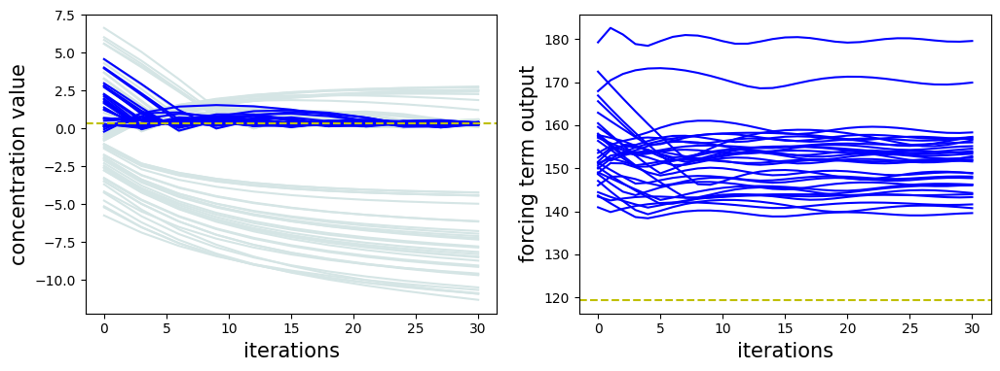

In [95]:
cols_chosen3 = np.where(np.abs(y_fs_design_3[-1, :] -0.3264) < 0.1)[0] 
remaining_columns3 = np.setdiff1d(np.arange(y_at_design_array_3.shape[1]), cols_chosen3)
print(len(cols_chosen3))
fig,axes=plt.subplots(1,2,figsize=(12,4))

for i in range(ensemble_size):
    axes[0].plot(range(0,33,3),y_fs_design_3[::3,i],'#D5E5E5')
    
for i in cols_chosen3:
    axes[0].plot(range(0,33,3),y_fs_design_3[::3,i],'b')
    axes[1].plot(y_at_design_array_3[:,i],'b')



axes[0].axhline(0.3264,linestyle='--',color='y')
axes[0].set_xlabel('iterations',fontsize=15)
axes[0].set_ylabel('concentration value',fontsize=15)
axes[1].axhline(array_exponent3,linestyle='--',color='y')
axes[1].set_ylabel('forcing term output',fontsize=15)
axes[1].set_xlabel('iterations',fontsize=15)

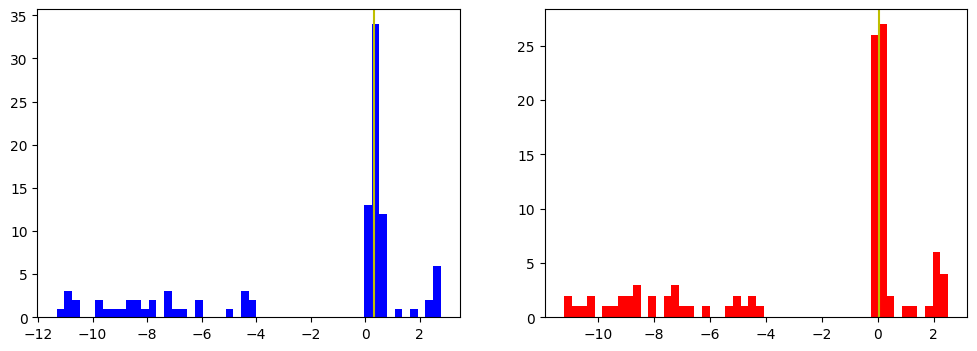

In [16]:
#stage=2
#fig, axes=plt.subplots(1,2,figsize=(12,4))
#axes[0].hist(y_fs_design_3[-1],bins=50,color='b')
#axes[0].axvline(0.50697,color='y')
#axes[1].hist(y_fs_design_4[-1],bins=50,color='r')
#axes[1].axvline( 0.20034,color='y')

stage=5
fig, axes=plt.subplots(1,2,figsize=(12,4))
axes[0].hist(y_fs_design_3[-1],bins=50,color='b')
axes[0].axvline(0.326487,color='y')
axes[1].hist(y_fs_design_4[-1],bins=50,color='r')
axes[1].axvline(0.06113,color='y')

In [ ]:
# 查看nn的曲线在指定点的数值

In [26]:
#stage = 2
#
#for k in range(2):
#    if k == 0:
#        d_start = design_list[stage+1]
#    elif k==1:
#        d_start = jnp.array([0.17,0.17])

stage = 2

for k in range(3):
    if k == 0:
        d_start = d_start1
    elif k==1:
        d_start = d_start2
    elif k==2:
        d_start = d_start3

    
    prior = posterior_list[stage-1]
    params = params_list[stage-1]
    
    
    xy_combined = d_start - estimated_center
    exponent_internal = jnp.sum(xy_combined**2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_nn = model.apply(last_params, xy_combined) * 70.0
    
    if k == 0:
        array_reciprocal1 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
        array_exponent1 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    elif k == 1:
        array_reciprocal2 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
        array_exponent2 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    elif k == 2:
        array_reciprocal3 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
        array_exponent3 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))


    if k == 0:
        y_at_design_array_1 = np.zeros((ensemble_step+1,ensemble_size))
        
        for j in range(ensemble_step+1):
            for i in range(ensemble_size):
                last_params_array = result_matrix_design_1[j,i,:]
                last_params = reconstruct_array_to_dict(last_params_array,params)
                array_nn = model.apply(last_params, xy_combined) * 70.0
                y_at_design = array_nn.squeeze()+array_reciprocal1
                y_at_design_array_1[j,i]=y_at_design

        print('finish calculate for design 1')
    elif k == 1:
        y_at_design_array_2 = np.zeros((ensemble_step+1,ensemble_size))
        
        for j in range(ensemble_step+1):
            for i in range(ensemble_size):
                last_params_array = result_matrix_design_2[j,i,:]
                last_params = reconstruct_array_to_dict(last_params_array,params)
                array_nn = model.apply(last_params, xy_combined) * 70.0
                y_at_design = array_nn.squeeze()+array_reciprocal2
                y_at_design_array_2[j,i]=y_at_design
        print('finish calculate for design 2')
    elif k == 2:
        y_at_design_array_3 = np.zeros((ensemble_step+1,ensemble_size))
        
        for j in range(ensemble_step+1):
            for i in range(ensemble_size):
                last_params_array = result_matrix_design_3[j,i,:]
                last_params = reconstruct_array_to_dict(last_params_array,params)
                array_nn = model.apply(last_params, xy_combined) * 70.0
                y_at_design = array_nn.squeeze()+array_reciprocal3
                y_at_design_array_3[j,i]=y_at_design
        print('finish calculate for design 3')

In [ ]:
# 画出design点的网络输出

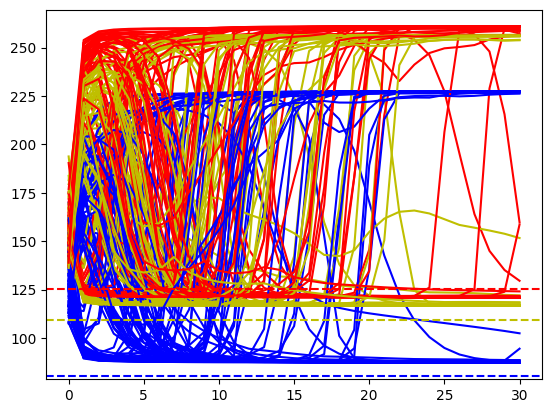

In [33]:
for i in range(ensemble_size):
    plt.plot(y_at_design_array_1[:,i],'b')
    plt.plot(y_at_design_array_2[:,i],'y')
    plt.plot(y_at_design_array_3[:,i],'r')

plt.axhline(array_exponent1,linestyle='--',color='b')
plt.axhline(array_exponent2,linestyle='--',color='y')
plt.axhline(array_exponent3,linestyle='--',color='r')

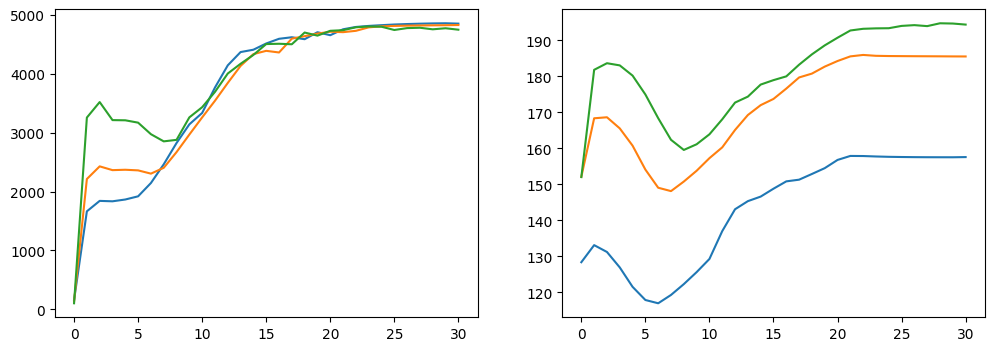

In [44]:
fig,axes=plt.subplots(1,2,figsize=(12,4))
axes[0].plot(np.var(y_at_design_array_1,axis=1))
axes[0].plot(np.var(y_at_design_array_2,axis=1))
axes[0].plot(np.var(y_at_design_array_3,axis=1))
axes[1].plot(np.mean(y_at_design_array_1,axis=1))
axes[1].plot(np.mean(y_at_design_array_2,axis=1))
axes[1].plot(np.mean(y_at_design_array_3,axis=1))

# 从均值和方差上看差别不大

(array([44.,  1.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  3., 49.]),
 array([120.96591187, 123.76541931, 126.56492676, 129.3644342 ,
        132.16394165, 134.9634491 , 137.76295654, 140.56246399,
        143.36197144, 146.16147888, 148.96098633, 151.76049377,
        154.56000122, 157.35950867, 160.15901611, 162.95852356,
        165.75803101, 168.55753845, 171.3570459 , 174.15655334,
        176.95606079, 179.75556824, 182.55507568, 185.35458313,
        188.15409058, 190.95359802, 193.75310547, 196.55261292,
        199.35212036, 202.15162781, 204.95113525, 207.7506427 ,
        210.55015015, 213.34965759, 216.14916504, 218.94867249,
        221.74817993, 224.54768738, 227.34719482, 230.14670227,
        232.94620972, 235.74571716, 238.54522461, 241.34473206,
        244.

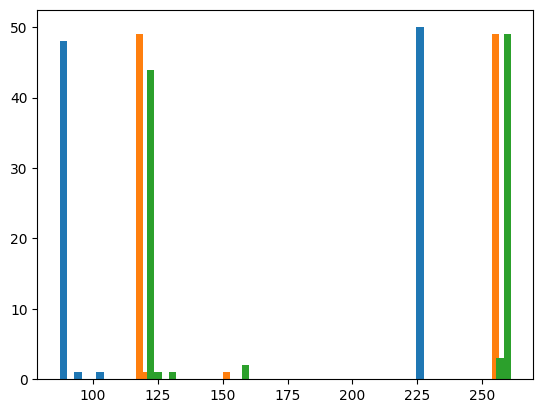

In [38]:
plt.hist(y_at_design_array_1[-1,:],bins=50)
plt.hist(y_at_design_array_2[-1,:],bins=50)
plt.hist(y_at_design_array_3[-1,:],bins=50)

# 说明数据分为了两级

In [331]:
# 用这里画图

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

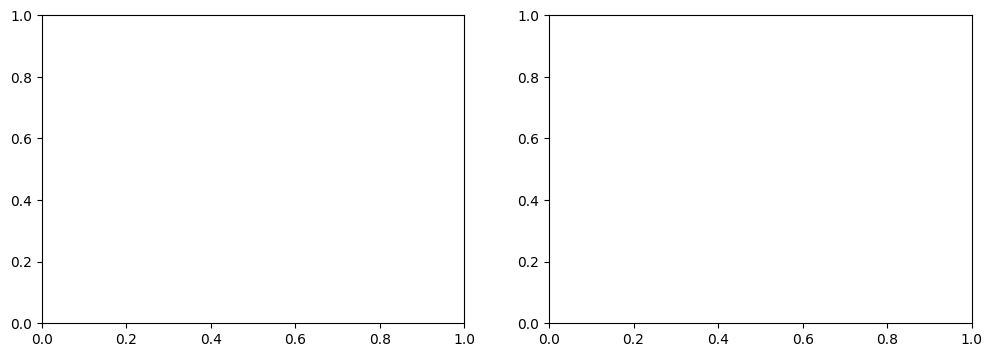

In [330]:
fig,axes=plt.subplots(1,2,figsize=(12,4))
cols_chosen1 = np.where(y_at_design_array_1[-1, :] < 175)[0] 
remaining_columns1 = np.setdiff1d(np.arange(y_at_design_array_1.shape[1]), cols_chosen1)
for i in cols_chosen1:
    axes[0].plot(y_at_design_array_1[:,i],'b')
for i in remaining_columns1:
    axes[1].plot(y_at_design_array_1[:,i],'b')

cols_chosen2 = np.where(y_at_design_array_2[-1, :] < 175)[0] 
remaining_columns2 = np.setdiff1d(np.arange(y_at_design_array_2.shape[1]), cols_chosen2)
for i in cols_chosen2:
    axes[0].plot(y_at_design_array_2[:,i],'y')
for i in remaining_columns2:
    axes[1].plot(y_at_design_array_2[:,i],'y')

cols_chosen3 = np.where(y_at_design_array_3[-1, :] < 175)[0] 
remaining_columns3 = np.setdiff1d(np.arange(y_at_design_array_3.shape[1]), cols_chosen3)
for i in cols_chosen3:
    axes[0].plot(y_at_design_array_3[:,i],'r')
for i in remaining_columns3:
    axes[1].plot(y_at_design_array_3[:,i],'r')

chosen_1 = y_at_design_array_1[:,cols_chosen1]
chosen_2 = y_at_design_array_2[:,cols_chosen2]
chosen_3 = y_at_design_array_3[:,cols_chosen3]
fig,axes=plt.subplots(1,2,figsize=(12,4))
axes[0].plot(np.mean(chosen_1,axis=1))
axes[0].plot(np.mean(chosen_2,axis=1))
axes[0].plot(np.mean(chosen_3,axis=1))
axes[1].plot(np.var(chosen_1,axis=1)/np.var(chosen_1,axis=1)[0])
axes[1].plot(np.var(chosen_2,axis=1)/np.var(chosen_2,axis=1)[0])
axes[1].plot(np.var(chosen_3,axis=1)/np.var(chosen_3,axis=1)[0])

left_1 = y_at_design_array_1[:,remaining_columns1]
left_2 = y_at_design_array_2[:,remaining_columns2]
left_3 = y_at_design_array_3[:,remaining_columns3]
fig,axes=plt.subplots(1,2,figsize=(12,4))
axes[0].plot(np.mean(left_1,axis=1))
axes[0].plot(np.mean(left_2,axis=1))
axes[0].plot(np.mean(left_3,axis=1))
axes[1].plot(np.var(left_1,axis=1)/np.var(left_1,axis=1)[0])
axes[1].plot(np.var(left_2,axis=1)/np.var(left_2,axis=1)[0])
axes[1].plot(np.var(left_3,axis=1)/np.var(left_3,axis=1)[0])

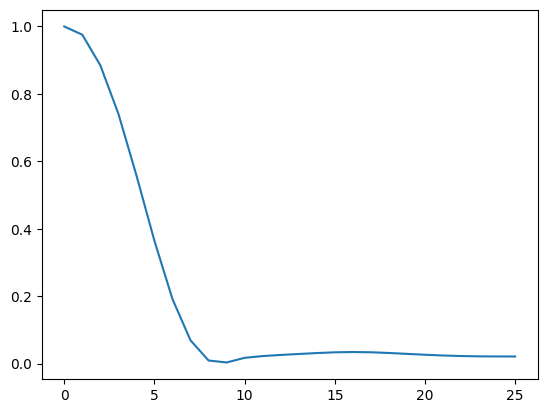

In [93]:
var3=np.var(y_at_design_array_3,axis=1)
plt.plot((var3/var3[5])[5:])

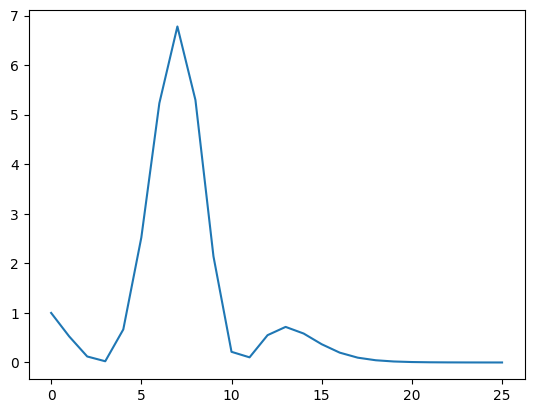

In [94]:
var4=np.var(y_at_design_array_4,axis=1)
plt.plot((var4/var4[5])[5:])

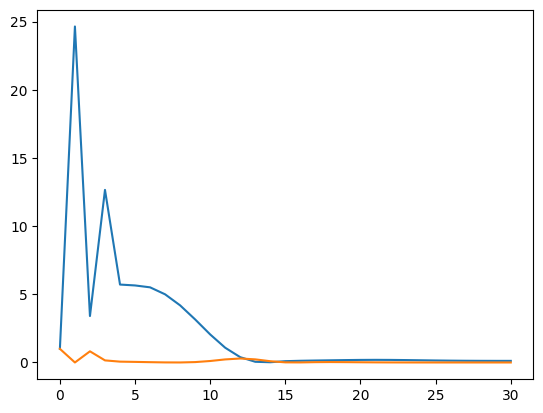

In [96]:
plt.plot((var3/var3[0]))
plt.plot((var4/var4[0]))

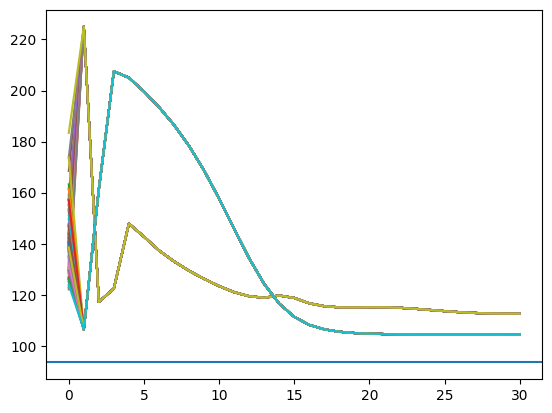

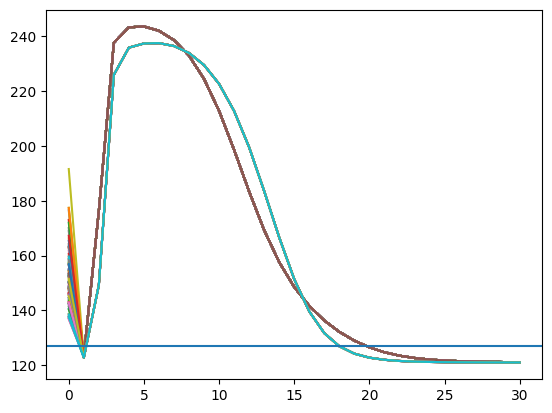

In [97]:
plt.plot(y_at_design_array_3[:])
plt.axhline(array_exponent3)
plt.show()
plt.plot(y_at_design_array_4[:])
plt.axhline(array_exponent4)
plt.show()

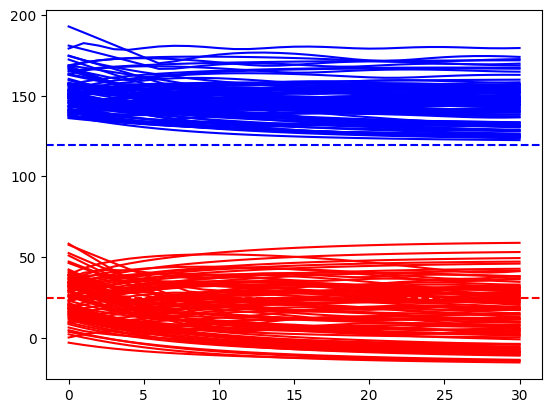

In [18]:
for i in range(ensemble_size):
    plt.plot(y_at_design_array_3[:,i],'b')
    plt.plot(y_at_design_array_4[:,i],'r')

plt.axhline(array_exponent3,linestyle='--',color='b')
plt.axhline(array_exponent4,linestyle='--',color='r')
#plt.axhline(array_reciprocal3,linestyle='--',color='b')
#plt.axhline(array_reciprocal4,linestyle='--',color='r')

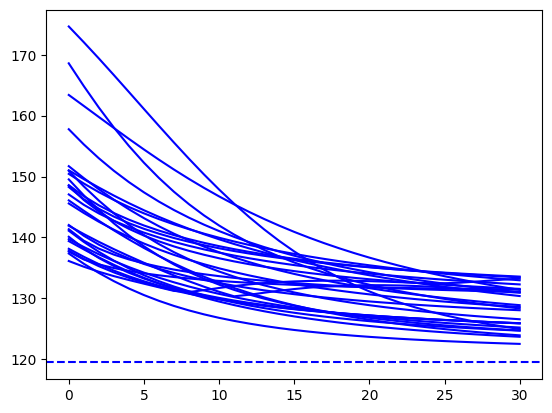

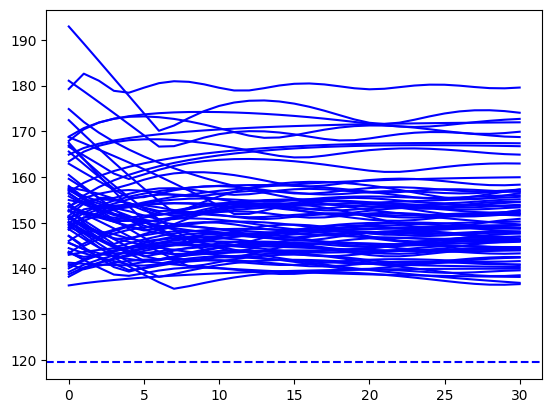

In [34]:
cols_with_values_less_than_150 = np.where(y_at_design_array_3[30, :] < 136)[0]
remaining_columns = np.setdiff1d(np.arange(y_at_design_array_3.shape[1]), cols_with_values_less_than_150)

for i in cols_with_values_less_than_150:
    plt.plot(y_at_design_array_3[:,i],'b')
plt.axhline(array_exponent3,linestyle='--',color='b')
plt.show()

for i in remaining_columns:
    plt.plot(y_at_design_array_3[:,i],'b')
plt.axhline(array_exponent3,linestyle='--',color='b')
plt.show()

In [ ]:
# 有些

60
56


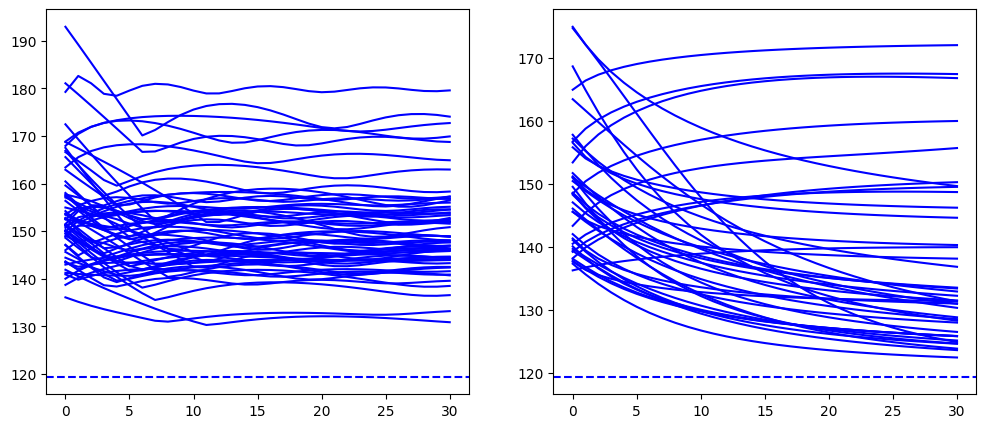

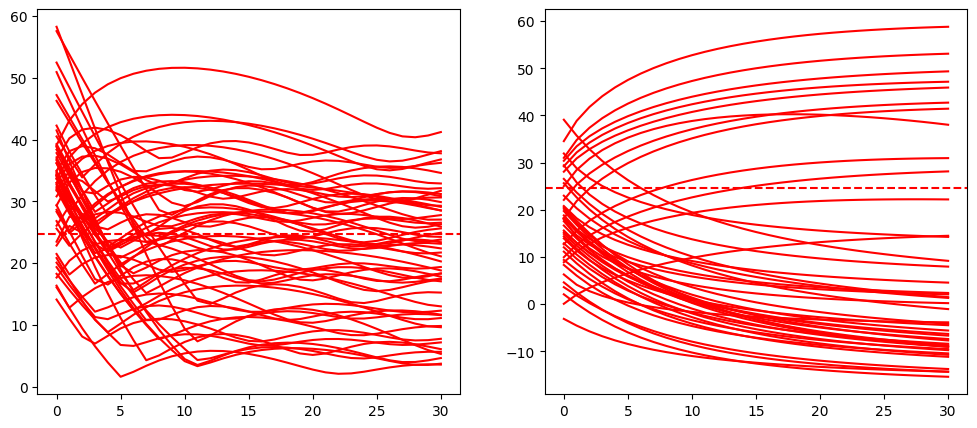

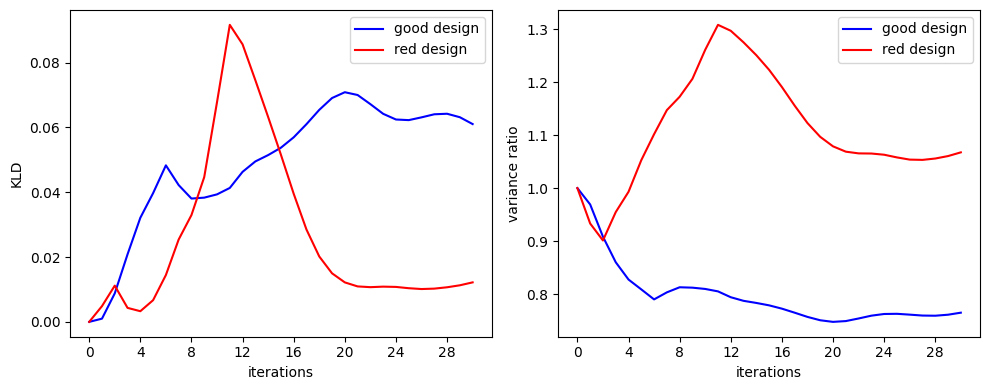

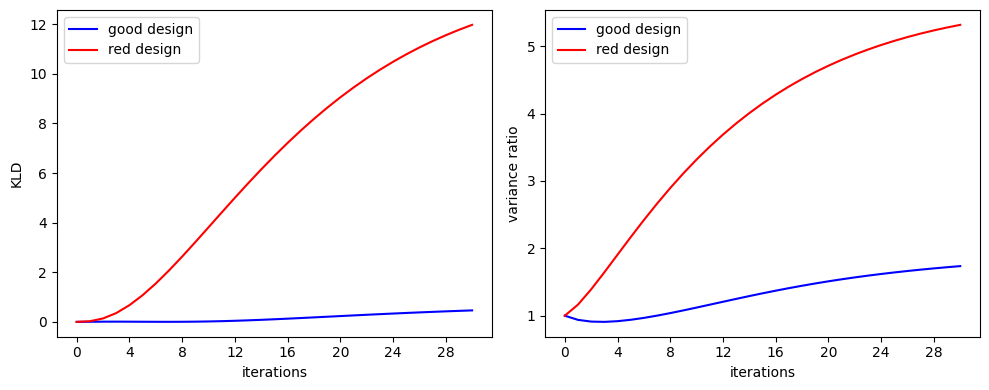

In [61]:
cols_chosen3 = np.where(np.abs(y_fs_design_3[-1, :] -0.3264) < 1)[0] 有些数据的y值已经收敛了，有些没有。收敛数据对应的行数找到网络中收敛的曲线，本身是可以用的。但是上面是：：3来选数据的，也就是说选出来的没问题，但是剩下的可能有问题
remaining_columns3 = np.setdiff1d(np.arange(y_at_design_array_3.shape[1]), cols_chosen3)
print(len(cols_chosen3))
fig,axes=plt.subplots(1,2,figsize=(12,5))
for i in cols_chosen3:
    axes[0].plot(y_at_design_array_3[:,i],'b')
for i in remaining_columns3:
    axes[1].plot(y_at_design_array_3[:,i],'b')
axes[0].axhline(array_exponent3,linestyle='--',color='b')
axes[1].axhline(array_exponent3,linestyle='--',color='b')
#plt.show()

cols_chosen4 = np.where(np.abs(y_fs_design_4[-1, :] -0.06113) < 1)[0]
remaining_columns4 = np.setdiff1d(np.arange(y_at_design_array_3.shape[1]), cols_chosen4)
print(len(cols_chosen4))
fig,axes=plt.subplots(1,2,figsize=(12,5))
for i in cols_chosen4:
    axes[0].plot(y_at_design_array_4[:,i],'r')
for i in remaining_columns4:
    axes[1].plot(y_at_design_array_4[:,i],'r')
axes[0].axhline(array_exponent4,linestyle='--',color='r')
axes[1].axhline(array_exponent4,linestyle='--',color='r')
#plt.show()

def kl_divergence_1d(mu1, sigma1, mu2, sigma2):
    # 计算KLD
    term1 = jnp.log(sigma2 / sigma1)
    term2 = (sigma1 ** 2 + (mu1 - mu2) ** 2) / (2 * sigma2 ** 2)
    
    # 计算最终的KL散度
    kl_div = term1 + term2 - 0.5
    
    return kl_div


mu_0_design_3 = np.mean(y_at_design_array_3[:,cols_chosen3],axis=1)
sigma_0_design_3 = np.var(y_at_design_array_3[:,cols_chosen3],axis=1)
mu_0_design_4 = np.mean(y_at_design_array_4[:,cols_chosen4],axis=1)
sigma_0_design_4 = np.var(y_at_design_array_4[:,cols_chosen4],axis=1)

kld_value_array_design_3 = np.zeros(ensemble_step+1)
kld_value_array_design_4 = np.zeros(ensemble_step+1)

for i in range(ensemble_step+1):
    kld_value_array_design_3[i] = kl_divergence_1d(mu_0_design_3[i], sigma_0_design_3[i], mu_0_design_3[0], sigma_0_design_3[0])
    kld_value_array_design_4[i] = kl_divergence_1d(mu_0_design_4[i], sigma_0_design_4[i], mu_0_design_4[0], sigma_0_design_4[0])

from matplotlib.ticker import MaxNLocator

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Plot KLD values
axes[0].plot(kld_value_array_design_3, 'b',label='good design')
axes[0].plot(kld_value_array_design_4, 'r',label='red design')
axes[0].set_ylabel('KLD')
axes[0].set_xlabel('iterations')
axes[0].xaxis.set_major_locator(MaxNLocator(integer=True))  # 设置x轴刻度为整数
axes[0].legend()

# Plot variance ratio
axes[1].plot(sigma_0_design_3/sigma_0_design_3[0], 'b',label='good design')
axes[1].plot(sigma_0_design_4/sigma_0_design_4[0], 'r',label='red design')
axes[1].set_ylabel('variance ratio')
axes[1].set_xlabel('iterations')
axes[1].xaxis.set_major_locator(MaxNLocator(integer=True))  # 设置x轴刻度为整数
axes[1].legend()

plt.tight_layout()
plt.show()



mu_0_design_3 = np.mean(y_at_design_array_3[:,remaining_columns3],axis=1)
sigma_0_design_3 = np.var(y_at_design_array_3[:,remaining_columns3],axis=1)
mu_0_design_4 = np.mean(y_at_design_array_4[:,remaining_columns4],axis=1)
sigma_0_design_4 = np.var(y_at_design_array_4[:,remaining_columns4],axis=1)

kld_value_array_design_3 = np.zeros(ensemble_step+1)
kld_value_array_design_4 = np.zeros(ensemble_step+1)

for i in range(ensemble_step+1):
    kld_value_array_design_3[i] = kl_divergence_1d(mu_0_design_3[i], sigma_0_design_3[i], mu_0_design_3[0], sigma_0_design_3[0])
    kld_value_array_design_4[i] = kl_divergence_1d(mu_0_design_4[i], sigma_0_design_4[i], mu_0_design_4[0], sigma_0_design_4[0])

from matplotlib.ticker import MaxNLocator

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Plot KLD values
axes[0].plot(kld_value_array_design_3, 'b',label='good design')
axes[0].plot(kld_value_array_design_4, 'r',label='red design')
axes[0].set_ylabel('KLD')
axes[0].set_xlabel('iterations')
axes[0].xaxis.set_major_locator(MaxNLocator(integer=True))  # 设置x轴刻度为整数
axes[0].legend()

# Plot variance ratio
axes[1].plot(sigma_0_design_3/sigma_0_design_3[0], 'b',label='good design')
axes[1].plot(sigma_0_design_4/sigma_0_design_4[0], 'r',label='red design')
axes[1].set_ylabel('variance ratio')
axes[1].set_xlabel('iterations')
axes[1].xaxis.set_major_locator(MaxNLocator(integer=True))  # 设置x轴刻度为整数
axes[1].legend()

plt.tight_layout()
plt.show()

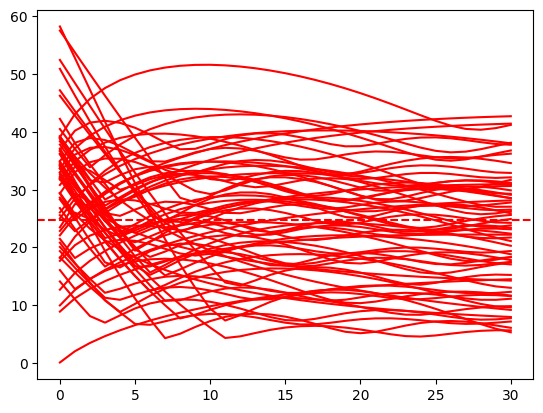

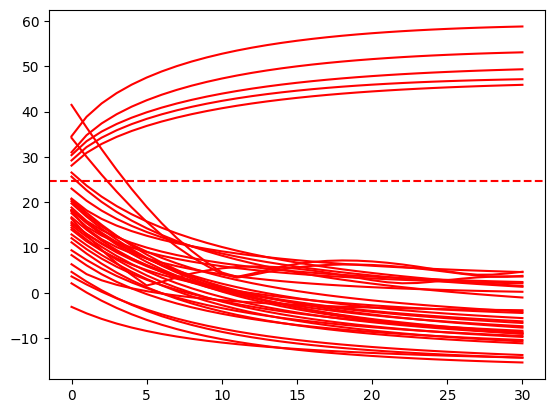

In [35]:
cols_with_values_less_than_150 = np.where(np.abs(y_at_design_array_4[30, :]-array_exponent4) < 20)[0]
remaining_columns = np.setdiff1d(np.arange(y_at_design_array_4.shape[1]), cols_with_values_less_than_150)

for i in cols_with_values_less_than_150:
    plt.plot(y_at_design_array_4[:,i],'r')
plt.axhline(array_exponent4,linestyle='--',color='r')
plt.show()

for i in remaining_columns:
    plt.plot(y_at_design_array_4[:,i],'r')
plt.axhline(array_exponent4,linestyle='--',color='r')
plt.show()

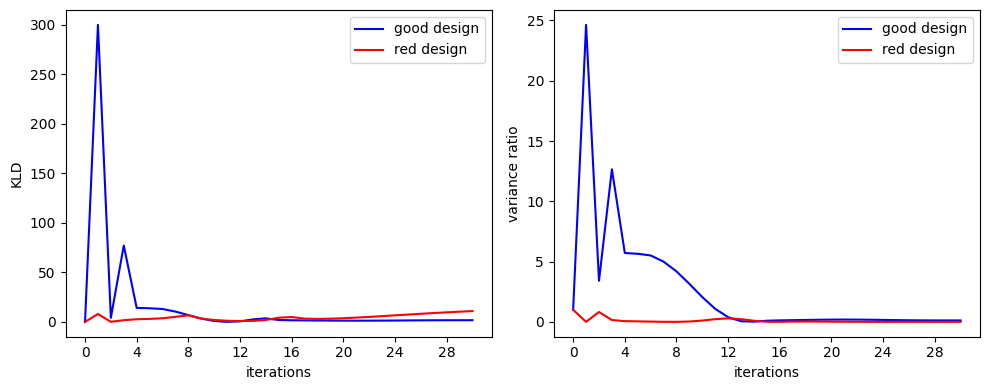

In [83]:
def kl_divergence_1d(mu1, sigma1, mu2, sigma2):
    # 计算KLD
    term1 = jnp.log(sigma2 / sigma1)
    term2 = (sigma1 ** 2 + (mu1 - mu2) ** 2) / (2 * sigma2 ** 2)
    
    # 计算最终的KL散度
    kl_div = term1 + term2 - 0.5
    
    return kl_div


mu_0_design_3 = np.mean(y_at_design_array_3,axis=1)
sigma_0_design_3 = np.var(y_at_design_array_3,axis=1)
mu_0_design_4 = np.mean(y_at_design_array_4,axis=1)
sigma_0_design_4 = np.var(y_at_design_array_4,axis=1)

kld_value_array_design_3 = np.zeros(ensemble_step+1)
kld_value_array_design_4 = np.zeros(ensemble_step+1)

for i in range(ensemble_step+1):
    kld_value_array_design_3[i] = kl_divergence_1d(mu_0_design_3[i], sigma_0_design_3[i], mu_0_design_3[0], sigma_0_design_3[0])
    kld_value_array_design_4[i] = kl_divergence_1d(mu_0_design_4[i], sigma_0_design_4[i], mu_0_design_4[0], sigma_0_design_4[0])

from matplotlib.ticker import MaxNLocator

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Plot KLD values
axes[0].plot(kld_value_array_design_3, 'b',label='good design')
axes[0].plot(kld_value_array_design_4, 'r',label='red design')
axes[0].set_ylabel('KLD')
axes[0].set_xlabel('iterations')
axes[0].xaxis.set_major_locator(MaxNLocator(integer=True))  # 设置x轴刻度为整数
axes[0].legend()

# Plot variance ratio
axes[1].plot(sigma_0_design_3/sigma_0_design_3[0], 'b',label='good design')
axes[1].plot(sigma_0_design_4/sigma_0_design_4[0], 'r',label='red design')
axes[1].set_ylabel('variance ratio')
axes[1].set_xlabel('iterations')
axes[1].xaxis.set_major_locator(MaxNLocator(integer=True))  # 设置x轴刻度为整数
axes[1].legend()

plt.tight_layout()
plt.show()

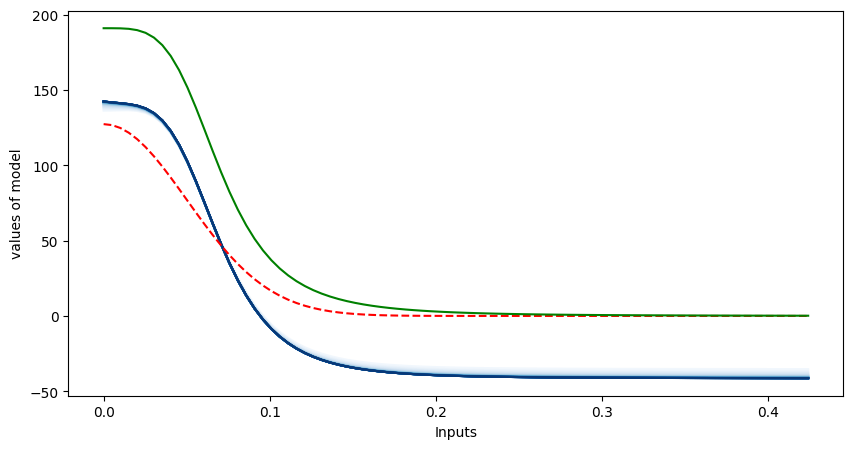

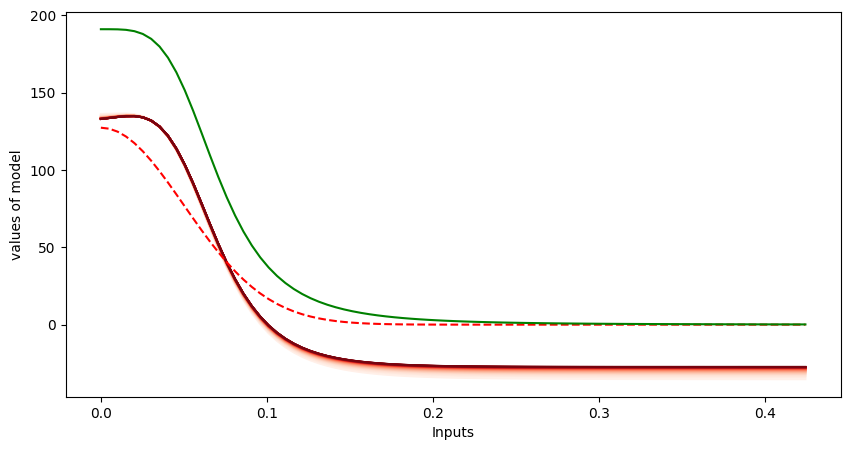

In [31]:
index_to_plot = 21# 0.25，0.25
last_params_list3 = []
for i in range(ensemble_step+1):
    last_params_array = result_matrix_design_3[i, index_to_plot, :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_list3.append(last_params)
    
plt.figure(figsize=(10, 5))
show_nn_trajectory(last_params_list3, model, 'Blues', center_x=0, center_y=0, size=85)

#index_to_plot = 3 # 0.15，0.15
last_params_list4 = []
for i in range(ensemble_step+1):
    last_params_array = result_matrix_design_4[i, index_to_plot, :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_list4.append(last_params)
    
plt.figure(figsize=(10, 5))
show_nn_trajectory(last_params_list4, model, 'Reds', center_x=0, center_y=0, size=85)

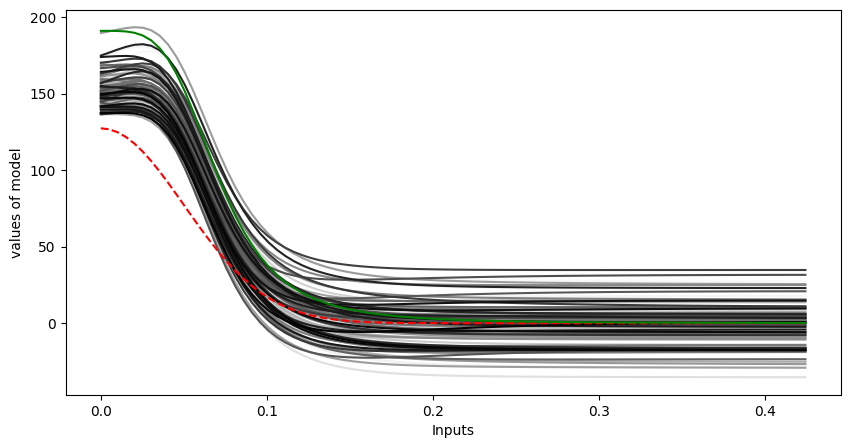

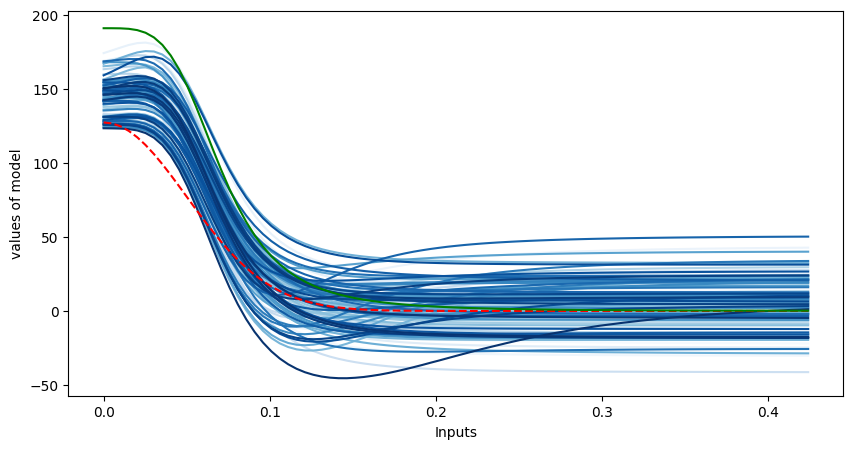

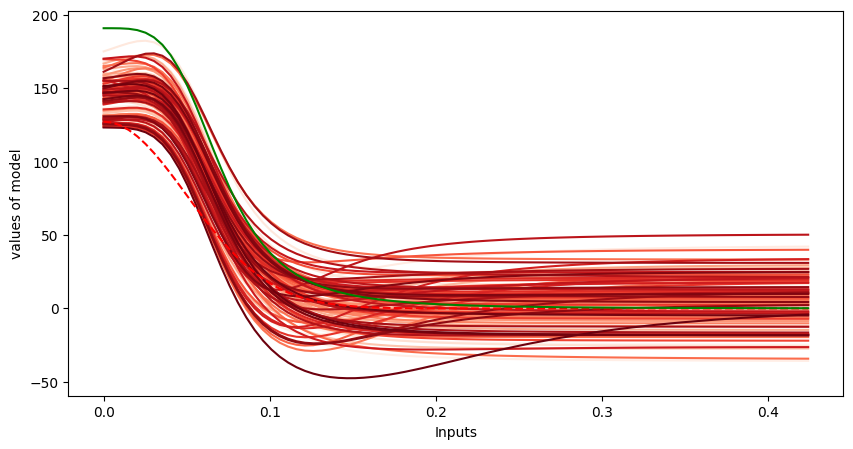

In [28]:
index_to_plot = 30
# step 20 

last_params_ori = []
nn_accuracy_ori = []
for i in range(ensemble_size):
    last_params_array = result_matrix_design_3[0,i,  :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_ori.append(last_params)
    nn_accuracy_ori.append(evaluate_nn_accuracy(last_params,model,center,local_size))

plt.figure(figsize=(10, 5))
show_nn_trajectory(last_params_ori, model, 'Greys', center_x=0, center_y=0, size=85)

# 0.25，0.25
last_params_list3 = []
nn_accuracy_list3 = []
for i in range(ensemble_size):
    last_params_array = result_matrix_design_3[index_to_plot,i,  :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_list3.append(last_params)
    nn_accuracy_list3.append(evaluate_nn_accuracy(last_params,model,center,local_size))
   
plt.figure(figsize=(10, 5)) 
show_nn_trajectory(last_params_list3, model, 'Blues', center_x=0, center_y=0, size=85)

#index_to_plot = 3 # 0.15，0.15
last_params_list4 = []
nn_accuracy_list4 = []
for i in range(ensemble_size):
    last_params_array = result_matrix_design_4[index_to_plot,i,  :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_list4.append(last_params)
    nn_accuracy_list4.append(evaluate_nn_accuracy(last_params,model,center,local_size))
    
plt.figure(figsize=(10, 5))
show_nn_trajectory(last_params_list4, model, 'Reds', center_x=0, center_y=0, size=85)

In [ ]:
# 检查enkf的数据

In [105]:
import os
import pickle

checkpoint_file_path = './checkpoints/nn_case_data_2_EnFK_stage2/checkpoint_i_30_j_1.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
result_matrix_design_4 = checkpoint_data['params_trajectory']

checkpoint_file_path = './checkpoints/nn_case_data_2_EnFK_stage2/checkpoint_i_30_j_0.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
result_matrix_design_3 = checkpoint_data['params_trajectory']

grid_size=50
ensemble_size = 100  # 生成的数组数量
ensemble_step = 30

Checkpoint data loaded successfully.
Checkpoint data loaded successfully.


In [106]:
stage = 2

for k in range(2):
    if k == 0:
        d_start = design_list[stage+1]
    elif k==1:
        d_start = jnp.array([0.17,0.17])
        
    prior = posterior_list[stage-1]
    params = params_list[stage-1]
    
    
    try:
        del tx2
        del lr_schedule2
        del opt_state2
    except:
        pass 
        
    _, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
    
    del prior
    prior = posterior   
    
    print(f'design for model correction is {d_start}')
    observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
    print(f'measurement is: {observation}')
    max_evidence_items, estimated_center = loss_param_refine4(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model, observation, 5)
    estimated_center_coor = estimated_center
    
    print(f'estimated center is {estimated_center_coor}')

    if k == 0:
        y_fs_design_3 = np.zeros((ensemble_step+1, ensemble_size))
        for j in [-1]:#range(ensemble_step+1):
            params_dict_list = []
            for i in range(ensemble_size):
                last_params_array = result_matrix_design_3[j,i,:]
                last_params = reconstruct_array_to_dict(last_params_array,params)
                y_f, _ = sealed_convection_diffusion_nn(last_params, d_start, estimated_center_coor, stage, model)
                y_fs_design_3[j,i]=y_f
                print('.',end='')
        print('|',end='')
    elif k == 1:
        y_fs_design_4 = np.zeros((ensemble_step+1, ensemble_size))
        for j in [-1]:#range(ensemble_step+1):
            params_dict_list = []
            for i in range(ensemble_size):
                last_params_array = result_matrix_design_4[j,i,:]
                last_params = reconstruct_array_to_dict(last_params_array,params)
                y_f, _ = sealed_convection_diffusion_nn(last_params, d_start, estimated_center_coor, stage, model)
                y_fs_design_4[j,i]=y_f
                print('.',end='')
        print('|',end='')
    
    

design for model correction is [0.24534842 0.24344872]
measurement is: 0.5069676041603088
estimated center is [0.236 0.236]
....................................................................................................|design for model correction is [0.17 0.17]
measurement is: 0.20034419000148773
estimated center is [0.22399999 0.22399999]
....................................................................................................|

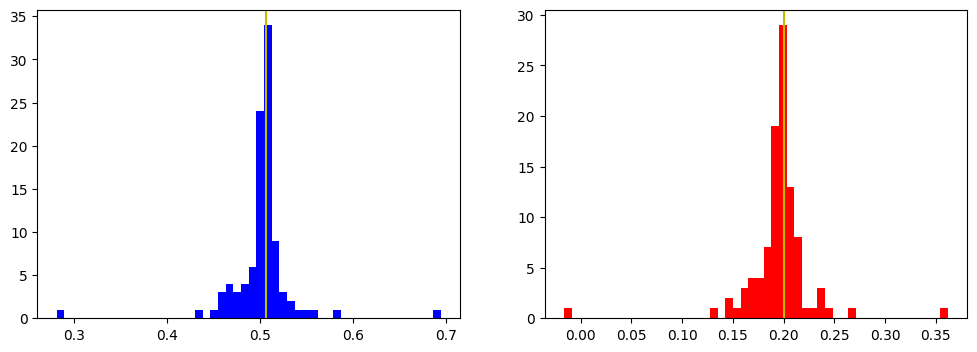

In [107]:
fig, axes=plt.subplots(1,2,figsize=(12,4))
axes[0].hist(y_fs_design_3[-1],bins=50,color='b')
axes[0].axvline(0.50697,color='y')
axes[1].hist(y_fs_design_4[-1],bins=50,color='r')
axes[1].axvline( 0.20034,color='y')

In [31]:
grid_size=50
ensemble_size = 100  # 生成的数组数量
ensemble_step = 30

mean_trajectory3 = np.zeros((ensemble_step+1,grid_size))
std_trajectory3 = np.zeros((ensemble_step+1,grid_size))
mean_trajectory4 = np.zeros((ensemble_step+1,grid_size))
std_trajectory4 = np.zeros((ensemble_step+1,grid_size))


for j in range(ensemble_step+1):
    params_dict_list = []
    for i in range(ensemble_size):
        last_params_array = result_matrix_design_3[j,i,:]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        params_dict_list.append(last_params)
        
    nn_performence = calculate_nn_performence(params_dict_list, model, center_x=0, center_y=0, size=grid_size)
    mean_trajectory3[j]=np.mean(nn_performence,axis=0)
    std_trajectory3[j]=np.std(nn_performence,axis=0)
    print('.',end='')
    
for j in range(ensemble_step+1):
    params_dict_list = []
    for i in range(ensemble_size):
        last_params_array = result_matrix_design_4[j,i,:]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        params_dict_list.append(last_params)
        
    nn_performence = calculate_nn_performence(params_dict_list, model, center_x=0, center_y=0, size=grid_size)
    mean_trajectory4[j]=np.mean(nn_performence,axis=0)
    std_trajectory4[j]=np.std(nn_performence,axis=0)
    print('.',end='')

..............................................................

In [32]:
stage = 2

for k in range(2):
    if k == 0:
        d_start = design_list[stage+1]
    elif k==1:
        d_start = jnp.array([0.17,0.17])
        
    prior = posterior_list[stage-1]
    params = params_list[stage-1]
    
    
    try:
        del tx2
        del lr_schedule2
        del opt_state2
    except:
        pass 
        
    _, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
    
    del prior
    prior = posterior   
    
    print(f'design for model correction is {d_start}')
    observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
    print(f'measurement is: {observation}')
    max_evidence_items, estimated_center = loss_param_refine4(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model, observation, 5)
    estimated_center_coor = estimated_center
    
    print(f'estimated center is {estimated_center_coor}')
    
    xy_combined = d_start - estimated_center_coor
    exponent_internal = jnp.sum(xy_combined**2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_nn = model.apply(last_params, xy_combined) * 70.0
    
    if k == 0:
        array_reciprocal3 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
        array_exponent3 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    elif k == 1:
        array_reciprocal4 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
        array_exponent4 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

    if k == 0:
        y_at_design_array_3 = np.zeros((ensemble_step+1,ensemble_size))
        
        for j in range(ensemble_step+1):
            for i in range(ensemble_size):
                last_params_array = result_matrix_design_3[j,i,:]
                last_params = reconstruct_array_to_dict(last_params_array,params)
                array_nn = model.apply(last_params, xy_combined) * 70.0
                y_at_design = array_nn.squeeze()+array_reciprocal3
                y_at_design_array_3[j,i]=y_at_design
    elif k == 1:
        y_at_design_array_4 = np.zeros((ensemble_step+1,ensemble_size))
        
        for j in range(ensemble_step+1):
            for i in range(ensemble_size):
                last_params_array = result_matrix_design_4[j,i,:]
                last_params = reconstruct_array_to_dict(last_params_array,params)
                array_nn = model.apply(last_params, xy_combined) * 70.0
                y_at_design = array_nn.squeeze()+array_reciprocal4
                y_at_design_array_4[j,i]=y_at_design

design for model correction is [0.24534842 0.24344872]
measurement is: 0.5069676041603088
estimated center is [0.236 0.236]
design for model correction is [0.17 0.17]
measurement is: 0.20034419000148773
estimated center is [0.22399999 0.22399999]


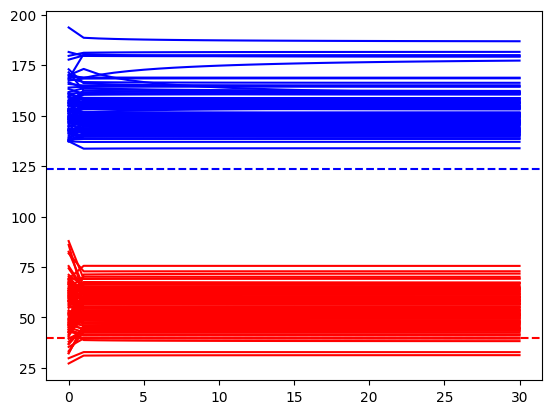

In [33]:
for i in range(ensemble_size):
    plt.plot(y_at_design_array_3[:,i],'b')
    plt.plot(y_at_design_array_4[:,i],'r')

plt.axhline(array_exponent3,linestyle='--',color='b')
plt.axhline(array_exponent4,linestyle='--',color='r')
#plt.axhline(array_reciprocal3,linestyle='--',color='b')
#plt.axhline(array_reciprocal4,linestyle='--',color='r')

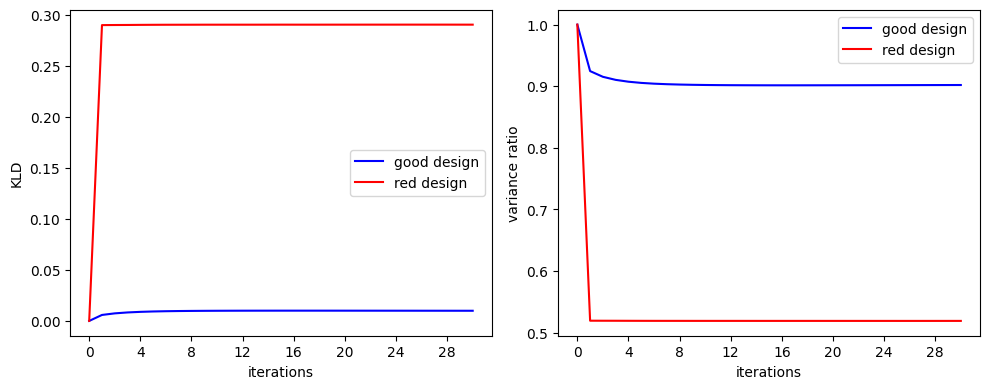

In [34]:
def kl_divergence_1d(mu1, sigma1, mu2, sigma2):
    # 计算KLD
    term1 = jnp.log(sigma2 / sigma1)
    term2 = (sigma1 ** 2 + (mu1 - mu2) ** 2) / (2 * sigma2 ** 2)
    
    # 计算最终的KL散度
    kl_div = term1 + term2 - 0.5
    
    return kl_div


mu_0_design_3 = np.mean(y_at_design_array_3,axis=1)
sigma_0_design_3 = np.var(y_at_design_array_3,axis=1)
mu_0_design_4 = np.mean(y_at_design_array_4,axis=1)
sigma_0_design_4 = np.var(y_at_design_array_4,axis=1)

kld_value_array_design_3 = np.zeros(ensemble_step+1)
kld_value_array_design_4 = np.zeros(ensemble_step+1)

for i in range(ensemble_step+1):
    kld_value_array_design_3[i] = kl_divergence_1d(mu_0_design_3[i], sigma_0_design_3[i], mu_0_design_3[0], sigma_0_design_3[0])
    kld_value_array_design_4[i] = kl_divergence_1d(mu_0_design_4[i], sigma_0_design_4[i], mu_0_design_4[0], sigma_0_design_4[0])

from matplotlib.ticker import MaxNLocator

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Plot KLD values
axes[0].plot(kld_value_array_design_3, 'b',label='good design')
axes[0].plot(kld_value_array_design_4, 'r',label='red design')
axes[0].set_ylabel('KLD')
axes[0].set_xlabel('iterations')
axes[0].xaxis.set_major_locator(MaxNLocator(integer=True))  # 设置x轴刻度为整数
axes[0].legend()

# Plot variance ratio
axes[1].plot(sigma_0_design_3/sigma_0_design_3[0], 'b',label='good design')
axes[1].plot(sigma_0_design_4/sigma_0_design_4[0], 'r',label='red design')
axes[1].set_ylabel('variance ratio')
axes[1].set_xlabel('iterations')
axes[1].xaxis.set_major_locator(MaxNLocator(integer=True))  # 设置x轴刻度为整数
axes[1].legend()

plt.tight_layout()
plt.show()

In [ ]:
# 测试某一阶段的学习率

In [69]:
def loss_param_refine5(current_params, d_start, stage, estimated_center, model, observation):

    y_f, _ = sealed_convection_diffusion_nn(current_params, d_start, estimated_center, stage, model)
    loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=y_f, scale=noise_base_scale+noise_ratio_scale* y_f)

    return -loglikelihood

In [34]:
def loss_param_refine6(current_params, d_start, stage, estimated_center, model, observation):

    y_f, _ = sealed_convection_diffusion_nn(current_params, d_start, estimated_center, stage, model)

    return (y_f - observation)**2

In [8]:
def loss_param_refine7(current_params, d_start, stage, estimated_center, model, observation):

    y_f, _ = sealed_convection_diffusion_nn(current_params, d_start, estimated_center, stage, model)
    loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=y_f, scale=noise_base_scale)

    return -loglikelihood

In [72]:
def loss_param_refine8(current_params, d_start, stage, estimated_center, model, observation):

    y_f, _ = sealed_convection_diffusion_nn(current_params, d_start, estimated_center, stage, model)
    loglikelihood1 = jax.scipy.stats.norm.logpdf(observation, loc=y_f, scale=noise_base_scale+noise_ratio_scale* y_f)
    
    y_f2, _ = sealed_convection_diffusion_nn(current_params, design_list[stage], estimated_center, stage-1, model)
    loglikelihood2 = jax.scipy.stats.norm.logpdf(observation_pre, loc=y_f2, scale=noise_base_scale+noise_ratio_scale* y_f2)

    return -loglikelihood1-loglikelihood2

In [64]:
def loss_param_refine10(current_params, d_start_list, stage, estimated_center, model, observation, observation_pre):
    
    i1 = (d_start_list[0][0]-lo_b)/(up_b-lo_b)*(size-1)
    j1 = (d_start_list[0][1]-lo_b)/(up_b-lo_b)*(size-1)
    i2 = (d_start_list[1][0]-lo_b)/(up_b-lo_b)*(size-1)
    j2 = (d_start_list[1][1]-lo_b)/(up_b-lo_b)*(size-1)
    
    _, u = sealed_convection_diffusion_nn(current_params, d_start, estimated_center, stage, model)
    y_f1 = jax.scipy.ndimage.map_coordinates(u,[i1,j1],1)
    
    loglikelihood1 = jax.scipy.stats.norm.logpdf(observation, loc=y_f1, scale=noise_base_scale+noise_ratio_scale*jnp.abs(y_f1))
    
    y_f2 = jax.scipy.ndimage.map_coordinates(u,[i2,j2],1)
    loglikelihood2 = jax.scipy.stats.norm.logpdf(observation_pre, loc=y_f2, scale=noise_base_scale+noise_ratio_scale* jnp.abs(y_f2))

    return -loglikelihood1-loglikelihood2

In [140]:
import pickle

with open('all_data_nn_case_data_3_.pkl', 'rb') as f:
    loaded_data = pickle.load(f)

posterior_list = loaded_data["posterior_list"]
design_list = loaded_data["design_list"]
params_list = loaded_data["params_list"]

In [39]:
3/2.4*1.4

1.75

In [166]:
d_start1, d_start2

(Array([0.27, 0.27], dtype=float32), Array([0.23, 0.26], dtype=float32))

In [176]:
stage=2
d_start = jnp.array([0.25,0.26])
print(estimated_center)
observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
print(f'measurement of current design is: {observation}')
y0, _ = sealed_convection_diffusion_true(d_start, estimated_center, stage)
print(f'y0 is: {y0}')

[0.236 0.236]
measurement of current design is: 0.5331098437309265
y0 is: 0.5501561164855957


In [128]:
with open('all_data_nn_case_data_3_.pkl', 'rb') as f:
    loaded_data = pickle.load(f)

posterior_list = loaded_data["posterior_list"]
design_list = loaded_data["design_list"]
params_list = loaded_data["params_list"]

In [184]:
# 使用两个design

estimated center is [0.236 0.236]
design for model correction is [Array([0.25, 0.26], dtype=float32), Array([0.25, 0.29], dtype=float32)]
measurement of previous design is: 0.5081968307495117
y0 is: 0.5400913953781128
measurement of current design is: 0.5331098437309265
y0 is: 0.5501561164855957
initial model output is 0.5217093825340271
learning rate is 0.19
..............................

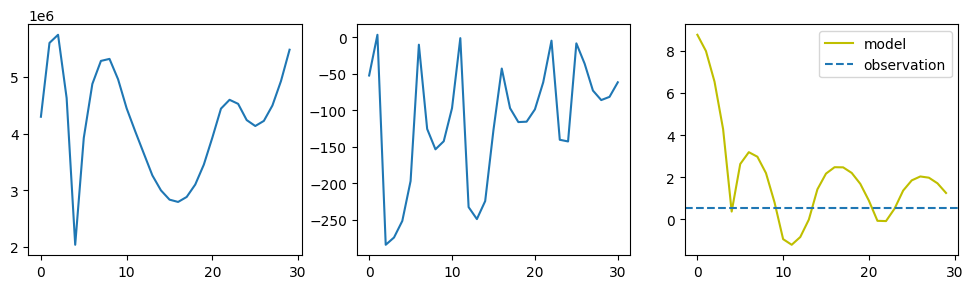

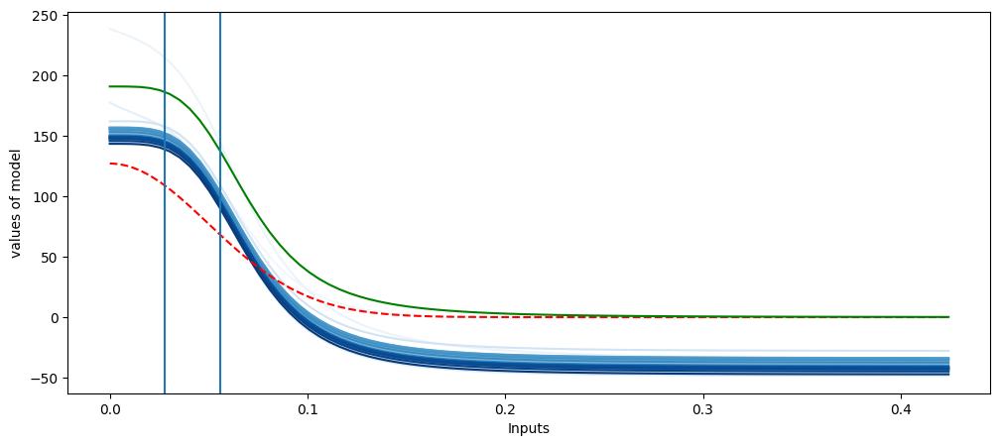

In [202]:
stage = 2
iteration = 30

d_start = jnp.array([0.25,0.26])#d_start2#jnp.array([0.17,0.17])#jnp.array([0.17,0.2])#design_list[stage+1]
d_start_list = [d_start, jnp.array([0.25,0.29])]

#d_start = jnp.array([0.23,0.23])
#d_start2 = d_start + jnp.array([0.1,0.1])
#d_start_list = [d_start, d_start2]


prior = posterior_list[stage-1]
params = params_list[stage-1]
#params = params_list[50]
evidence_list_special = []
NN_error_list_special = []
params_list_special = []
y_f_system_list = []
y_f_model_list = []


# 先更新后验，用上一个阶段的design
_, posterior = forward_posterior_infoGain(params, design_list[stage+1], stage, center, prior, noise_info, num_d, radio_d, key[stage], model)

del prior
prior = posterior 

num_top = 5
indices = jnp.argpartition(posterior .ravel(), -num_top)[-num_top:]
multi_indices = jnp.unravel_index(indices, posterior.shape)

#selected_loglikelihoods = jnp.sum(loglikelihood[multi_indices])
#list_local = multi_indices

# 计算平均坐标
average_x = np.mean(multi_indices[0])
average_y = np.mean(multi_indices[1])
estimated_center = jnp.array([average_x, average_y])/50
print(f'estimated center is {estimated_center}')

try:
    del tx2
    del lr_schedule2
    del opt_state2
except:
    pass 
    

#tx2 = optax.chain(
#    optax.adam(lr_schedule2),  # 使用由 lr_schedule1 调整的学习率的 Adam 优化器
#    optax.add_decayed_weights(1e-4)  # 添加权重衰减，衰减系数为 1e-5
#)

lr = 0.19
tx2 = optax.adam(lr)#tx2 = optax.adam(3.5)# 
opt_state2 = tx2.init(params)


print(f'design for model correction is {d_start_list}')

observation_pre, _ = sealed_convection_diffusion_true(design_list[stage+1], center, stage)
print(f'measurement of previous design is: {observation_pre}')

y0, _ = sealed_convection_diffusion_true(design_list[stage+1], estimated_center, stage)
print(f'y0 is: {y0}')

observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
print(f'measurement of current design is: {observation}')


y0, _ = sealed_convection_diffusion_true(d_start, estimated_center, stage)
print(f'y0 is: {y0}')
yf_initial, _ = sealed_convection_diffusion_nn(params, d_start, estimated_center, stage, model)
print(f'initial model output is {yf_initial}')

print(f'learning rate is {lr}')

noise_loc = 0
noise_base_scale = 0.05
noise_ratio_scale = 0.05
noise_info = [(noise_loc, noise_base_scale, noise_ratio_scale),]

evidence_list_special.append(-max_evidence_items)
params_list_special.append(params)

iteration_to_change_obj = 2

for i in range(iteration):
    if stage in [0]:
        print('stage one dont learn error parameters')
        break
        
    max_evidence_items, grad_params = jax.value_and_grad(loss_param_refine10)(params, d_start_list, stage, estimated_center, model, observation, observation_pre) # 似然带后面

        
    clip_norm = 1e10
    clip_transform = optax.clip_by_global_norm(clip_norm)
    clipped_grads, _ = clip_transform.update(grad_params, state=None)
    
    updates, opt_state2 = tx2.update(clipped_grads, opt_state2, params=params)
    
    # 解决nan的问题
    updates_contain_nans = any(jnp.any(jnp.isnan(u)) for u in jax.tree_util.tree_leaves(updates))
    if updates_contain_nans:
        print('NaN appears in learning. Perturb params and continue')
        noise = jax.tree_util.tree_map(lambda p: 0.001 * jax.random.normal(key_for_param[i], p.shape), params)
        params = jax.tree_util.tree_map(lambda p, n: p + n, params, noise)
    else:
        params = optax.apply_updates(params, updates)
        
    net_accuracy = evaluate_nn_accuracy(params,model,center,local_size)
    #print(f'Loss step {i} max evidence items: {max_evidence_items}, nn error {i}: {net_accuracy}')
    
    if np.isnan((max_evidence_items, net_accuracy)).any():
        print('some results are Nan')
        break
        
    evidence_list_special.append(-max_evidence_items)
    NN_error_list_special.append(net_accuracy)
    params_list_special.append(params)

    y_f_system , _ = sealed_convection_diffusion_true(d_start, estimated_center, stage)
    y_f_model , _ = sealed_convection_diffusion_nn(params, d_start, estimated_center, stage, model)
    y_f_system_list.append(y_f_system)
    y_f_model_list.append(y_f_model)

    print('.',end='')

_, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)

fig, axes = plt.subplots(1,3,figsize=(12,3))
axes[0].plot(NN_error_list_special) # minimize it
axes[1].plot(evidence_list_special) # maximize it
#axes[2].plot(y_f_system_list, label='system')
axes[2].plot(y_f_model_list, color='y', label='model')
axes[2].axhline(observation, linestyle='--', label='observation')
axes[2].legend()

distance1 = np.sqrt(np.sum((estimated_center-d_start)**2))
distance2 = np.sqrt(np.sum((estimated_center-d_start_list[1])**2))

def show_nn_trajectory(params_list, apply_model, colormap='Blues', center_x=0, center_y=0, size=85):
    x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    y = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    xy_combined = jnp.concatenate((x, y), axis=1)
    
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    
    cmap = plt.colormaps[colormap].resampled(len(params_list)+2)#cm.get_cmap('Blues', len(params_list))
    for index, params in enumerate(params_list):
        #if index not in [6]:
        #    continue
        array_nn = apply_model.apply(params, xy_combined) * 70.0
        
        plt.plot(jnp.sqrt(2) * x.squeeze(), 
                 (array_nn.squeeze() + array_reciprocal.squeeze()), 
                 label=f'NN + Reciprocal - Params {index+1}',
                 color=cmap(index+1))
    
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_exponent.squeeze(), color='r', linestyle = '--', label='Exponent')
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_reciprocal.squeeze(), color='g', label='Reciprocal')
    
    plt.ylabel('values of model')
    plt.xlabel('Inputs')


plt.figure(figsize=(12,5))
#print(evidence_list_special[60], evidence_list_special[100],evidence_list_special[200])
show_nn_trajectory(params_list_special, model, center_x=0, center_y=0, size=85)
plt.axvline(distance1)
plt.axvline(distance2)

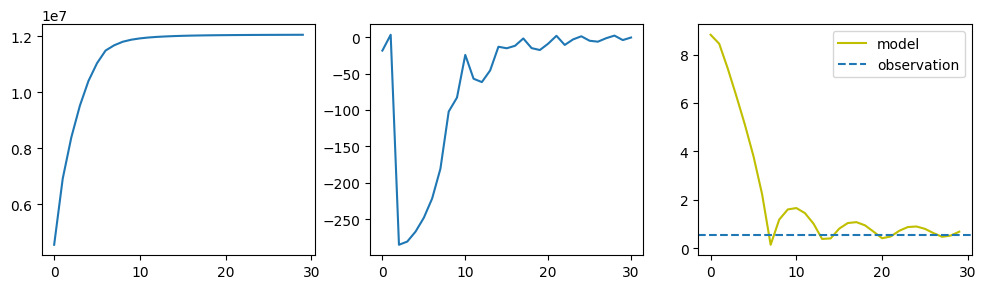

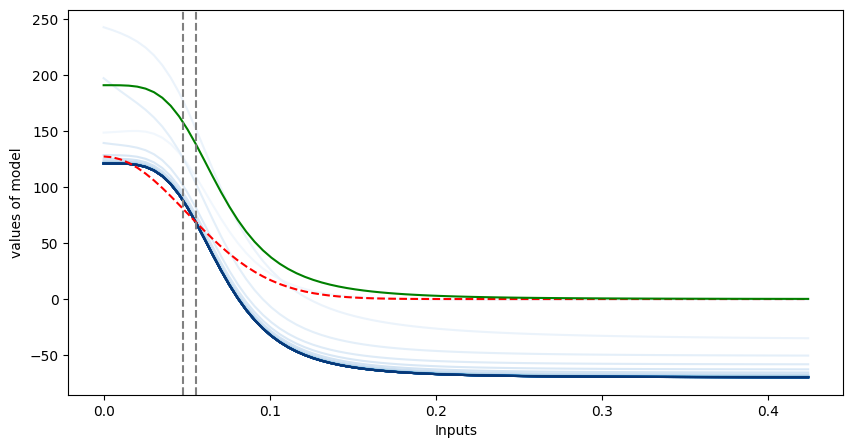

In [157]:
fig, axes = plt.subplots(1,3,figsize=(12,3))
axes[0].plot(NN_error_list_special) # minimize it
axes[1].plot(evidence_list_special) # maximize it
#axes[2].plot(y_f_system_list, label='system')
axes[2].plot(y_f_model_list, color='y',label='model')
axes[2].axhline(observation, linestyle='--', label='observation')
axes[2].legend()

plt.figure(figsize=(10,5))
#print(evidence_list_special[60], evidence_list_special[100],evidence_list_special[200])
show_nn_trajectory(params_list_special, model, 'Blues', center_x=0, center_y=0, size=85)
plt.axvline(distance1,linestyle='--',color='grey')
plt.axvline(distance2,linestyle='--',color='grey')

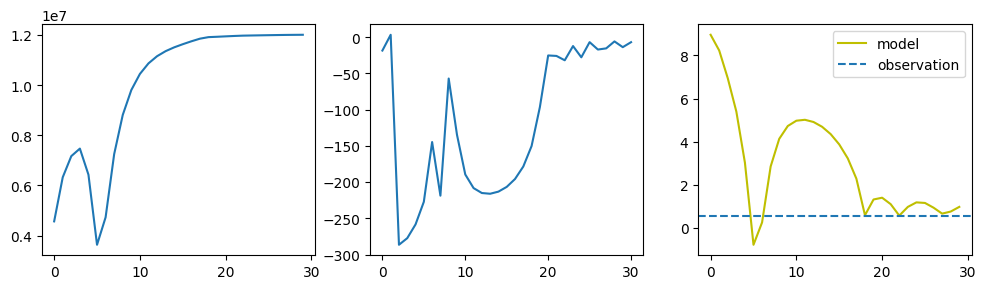

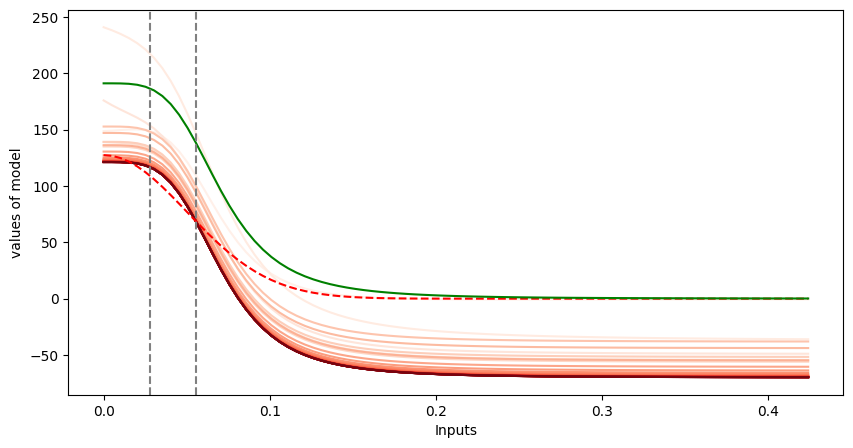

In [180]:
fig, axes = plt.subplots(1,3,figsize=(12,3))
axes[0].plot(NN_error_list_special) # minimize it
axes[1].plot(evidence_list_special) # maximize it
#axes[2].plot(y_f_system_list, label='system')
axes[2].plot(y_f_model_list, color='y',label='model')
axes[2].axhline(observation, linestyle='--', label='observation')
axes[2].legend()

plt.figure(figsize=(10,5))
#print(evidence_list_special[60], evidence_list_special[100],evidence_list_special[200])
show_nn_trajectory(params_list_special, model, 'Reds', center_x=0, center_y=0, size=85)

distance1 = np.sqrt(np.sum((estimated_center-d_start)**2))
distance2 = np.sqrt(np.sum((estimated_center-d_start_list[1])**2))
plt.axvline(distance1,linestyle='--',color='grey')
plt.axvline(distance2,linestyle='--',color='grey')

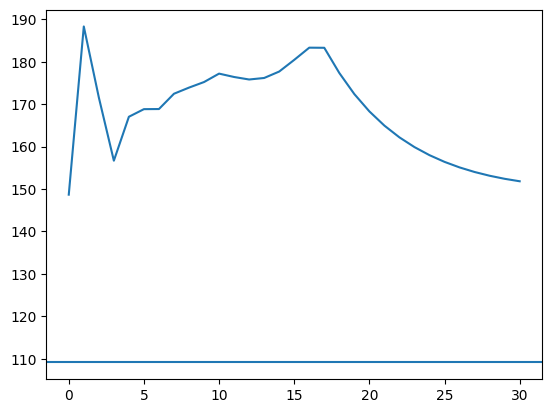

In [196]:
xy_combined = d_start - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)

array_reciprocal0 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent0 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_0 = np.zeros(iteration+1)
        
for j in range(iteration+1):
    last_params = params_list_special[j]
    array_nn = model.apply(last_params, xy_combined) * 70.0
    y_at_design = array_nn.squeeze()+array_reciprocal0
    y_at_design_array_0[j]=y_at_design

plt.plot(y_at_design_array_0)
plt.axhline(array_exponent0)

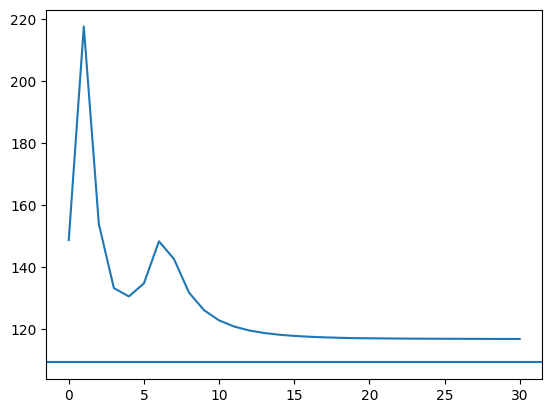

In [181]:
xy_combined = d_start - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)

array_reciprocal1 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent1 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_1 = np.zeros(iteration+1)
        
for j in range(iteration+1):
    last_params = params_list_special[j]
    array_nn = model.apply(last_params, xy_combined) * 70.0
    y_at_design = array_nn.squeeze()+array_reciprocal1
    y_at_design_array_1[j]=y_at_design

plt.plot(y_at_design_array_1)
plt.axhline(array_exponent1)

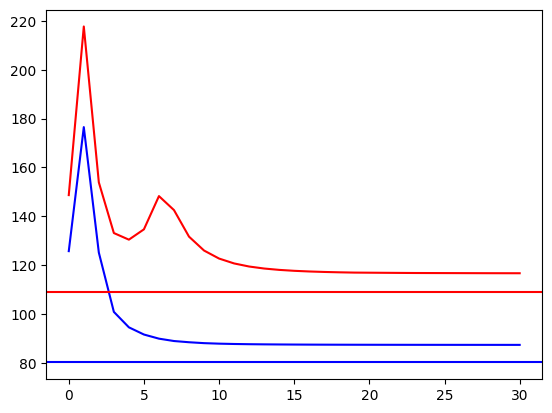

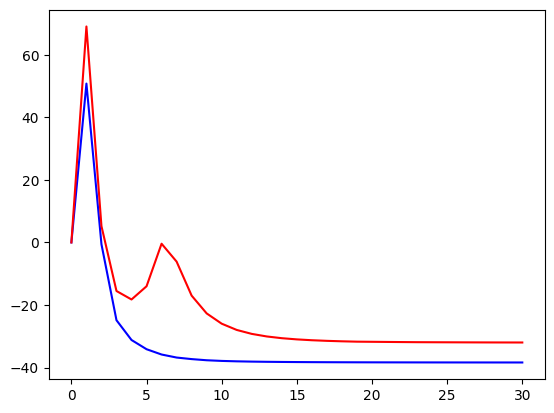

In [182]:
plt.plot(y_at_design_array_0,'b')
plt.axhline(array_exponent0,color='b')
plt.plot(y_at_design_array_1,'r')
plt.axhline(array_exponent1,color='r')
plt.show()

plt.plot(y_at_design_array_0-y_at_design_array_0[0],'b')
plt.plot(y_at_design_array_1-y_at_design_array_1[0],'r')

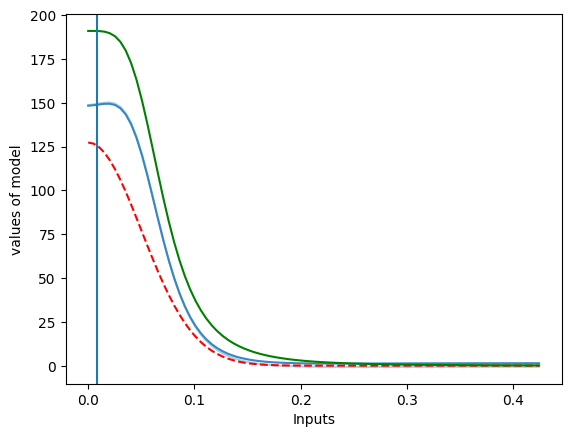

In [107]:
show_nn_trajectory([params_list_special[0],params_list_special[-1]], model, center_x=0, center_y=0, size=85)
plt.axvline(distance)

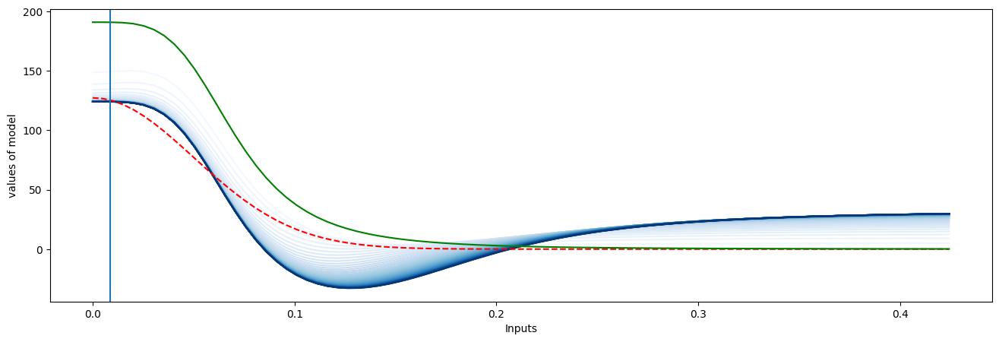

In [32]:
_, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
fig, axes = plt.subplots(1,3,figsize=(18,5))
axes[0].contourf(posterior.T)
axes[0].set_xlim([0,20])
axes[0].set_ylim([0,20])
axes[0].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)
axes[0].set_title('new stage')
axes[1].contourf(posterior_list[stage].T)
axes[1].set_xlim([0,20])
axes[1].set_ylim([0,20])
axes[1].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)
axes[1].set_title('ori stage')
axes[2].contourf(posterior_list[stage-1].T)
axes[2].set_xlim([0,20])
axes[2].set_ylim([0,20])
axes[2].set_title('stage -1')
axes[2].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)

In [72]:
def loss_param_refine9(current_params, d_start, stage, estimated_center, model, observation):

    y_f, _ = sealed_convection_diffusion_nn(current_params, d_start, estimated_center, stage, model)
    loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=y_f, scale=noise_base_scale+noise_ratio_scale*jnp.abs(y_f))

    return -loglikelihood

In [ ]:
# 只使用一个design

estimated center is [0.236 0.236]
design for model correction is [0.25 0.29]
measurement of current design is: 0.5283483266830444
y0 is: 0.5287258625030518
initial model output is 0.48500755429267883
learning rate is 0.17
..............................

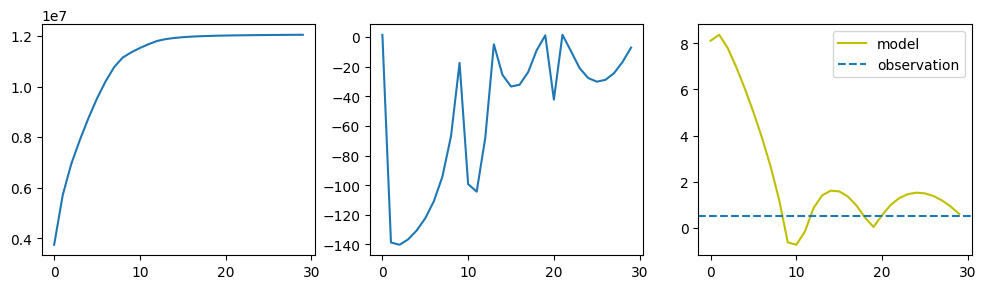

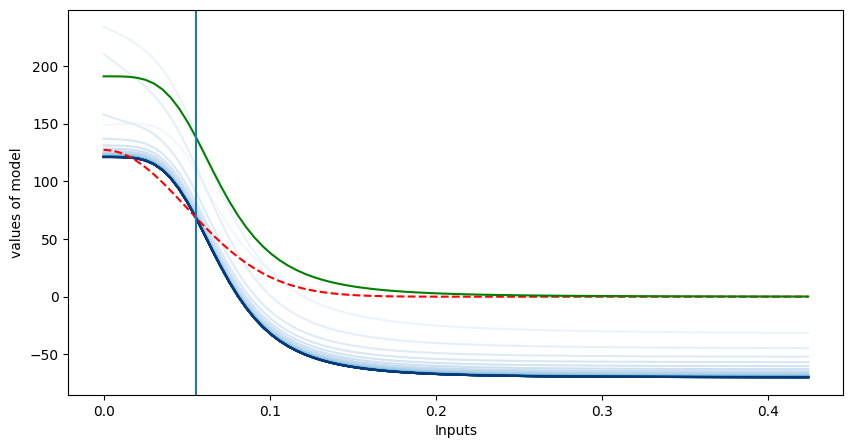

In [338]:
stage = 2
iteration = 30

d_start = jnp.array([0.25,0.29])

#d_start = jnp.array([0.23,0.23])
#d_start2 = d_start + jnp.array([0.1,0.1])
#d_start_list = [d_start, d_start2]


prior = posterior_list[stage-1]
params = params_list[stage-1]
#params = params_list[50]
evidence_list_special = []
NN_error_list_special = []
params_list_special = []
y_f_system_list = []
y_f_model_list = []


# 先更新后验，用上一个阶段的design
_, posterior = forward_posterior_infoGain(params, design_list[stage+1], stage, center, prior, noise_info, num_d, radio_d, key[stage], model)

del prior
prior = posterior 

num_top = 5
indices = jnp.argpartition(posterior .ravel(), -num_top)[-num_top:]
multi_indices = jnp.unravel_index(indices, posterior.shape)

#selected_loglikelihoods = jnp.sum(loglikelihood[multi_indices])
#list_local = multi_indices

# 计算平均坐标
average_x = np.mean(multi_indices[0])
average_y = np.mean(multi_indices[1])
estimated_center = jnp.array([average_x, average_y])/50
print(f'estimated center is {estimated_center}')

try:
    del tx2
    del lr_schedule2
    del opt_state2
except:
    pass 
    

#tx2 = optax.chain(
#    optax.adam(lr_schedule2),  # 使用由 lr_schedule1 调整的学习率的 Adam 优化器
#    optax.add_decayed_weights(1e-4)  # 添加权重衰减，衰减系数为 1e-5
#)

lr = 0.17
tx2 = optax.adam(lr)#tx2 = optax.adam(3.5)# 
opt_state2 = tx2.init(params)

#max_index = np.argmax(prior)
#max_position = np.unravel_index(max_index, prior.shape)
#print(f"最大元素的位置是：{max_position}")
  

#max_index = np.argmax(prior)
#max_position = np.unravel_index(max_index, prior.shape)
#print(f"最大元素的位置是：{max_position}")

print(f'design for model correction is {d_start}')


observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
print(f'measurement of current design is: {observation}')

#_, estimated_center = loss_param_refine4(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model, observation, 5)
#print(f'estimated center is {estimated_center}')

y0, _ = sealed_convection_diffusion_true(d_start, estimated_center, stage)
print(f'y0 is: {y0}')
yf_initial, _ = sealed_convection_diffusion_nn(params, d_start, estimated_center, stage, model)
print(f'initial model output is {yf_initial}')

print(f'learning rate is {lr}')

noise_loc = 0
noise_base_scale = 0.05
noise_ratio_scale = 0.05
noise_info = [(noise_loc, noise_base_scale, noise_ratio_scale),]

params_list_special.append(params)

iteration_to_change_obj = 2

for i in range(iteration):
    if stage in [0]:
        print('stage one dont learn error parameters')
        break
    
    #if i == iteration_to_change_obj :
    #    lr2 = 0.008
    #    tx2 = optax.adam(lr2) 
    #    opt_state2 = tx2.init(params)
    #    noise_base_scale = 0.5
    #    print(f'change lr = {lr2}')
    #    print(f'change noise_base_scale = {noise_base_scale}')
        
    max_evidence_items, grad_params = jax.value_and_grad(loss_param_refine9)(params, d_start, stage, estimated_center, model, observation) # 似然带后面

        
    #if i < iteration_to_change_obj :
    #    max_evidence_items, grad_params = jax.value_and_grad(loss_param_refine5)(params, d_start, stage, estimated_center, model, observation) # 似然带后面
    #    #max_evidence_items, grad_params = jax.value_and_grad(loss_param_refine6)(params, d_start, stage, estimated_center, model, observation) # y-yf
    #    #max_evidence_items, grad_params = jax.value_and_grad(loss_param_refine7)(params, d_start, stage, estimated_center, model, observation) # 似然不带后面一项
    #elif i == iteration_to_change_obj :
    #    lr2 = 0.008
    #    tx2 = optax.adam(lr2)#tx2 = optax.adam(3.5)# 
    #    opt_state2 = tx2.init(params)
    #    print(f'change to lieklihood-no scale, lr = {lr2}')
    #    max_evidence_items, grad_params = jax.value_and_grad(loss_param_refine5)(params, d_start, stage, estimated_center, model, observation) # y-yf
    #else:
    #    max_evidence_items, grad_params = jax.value_and_grad(loss_param_refine5)(params, d_start, stage, estimated_center, model, observation) # y-yf
        
    clip_norm = 1e10
    clip_transform = optax.clip_by_global_norm(clip_norm)
    clipped_grads, _ = clip_transform.update(grad_params, state=None)
    
    updates, opt_state2 = tx2.update(clipped_grads, opt_state2, params=params)
    
    # 解决nan的问题
    updates_contain_nans = any(jnp.any(jnp.isnan(u)) for u in jax.tree_util.tree_leaves(updates))
    if updates_contain_nans:
        print('NaN appears in learning. Perturb params and continue')
        noise = jax.tree_util.tree_map(lambda p: 0.001 * jax.random.normal(key_for_param[i], p.shape), params)
        params = jax.tree_util.tree_map(lambda p, n: p + n, params, noise)
    else:
        params = optax.apply_updates(params, updates)
        
    net_accuracy = evaluate_nn_accuracy(params,model,center,local_size)
    #print(f'Loss step {i} max evidence items: {max_evidence_items}, nn error {i}: {net_accuracy}')
    
    if np.isnan((max_evidence_items, net_accuracy)).any():
        print('some results are Nan')
        break
        
    evidence_list_special.append(-max_evidence_items)
    NN_error_list_special.append(net_accuracy)
    params_list_special.append(params)

    y_f_system , _ = sealed_convection_diffusion_true(d_start, estimated_center, stage)
    y_f_model , _ = sealed_convection_diffusion_nn(params, d_start, estimated_center, stage, model)
    y_f_system_list.append(y_f_system)
    y_f_model_list.append(y_f_model)

    print('.',end='')

_, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)

fig, axes = plt.subplots(1,3,figsize=(12,3))
axes[0].plot(NN_error_list_special) # minimize it
axes[1].plot(evidence_list_special) # maximize it
#axes[2].plot(y_f_system_list, label='system')
axes[2].plot(y_f_model_list, color='y', label='model')
axes[2].axhline(observation, linestyle='--', label='observation')
axes[2].legend()

distance1 = np.sqrt(np.sum((estimated_center-d_start)**2))
#distance2 = np.sqrt(np.sum((estimated_center-d_start_list[1])**2))

def show_nn_trajectory(params_list, apply_model, colormap='Blues', center_x=0, center_y=0, size=85):
    x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    y = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    xy_combined = jnp.concatenate((x, y), axis=1)
    
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    
    cmap = plt.colormaps[colormap].resampled(len(params_list)+2)#cm.get_cmap('Blues', len(params_list))
    for index, params in enumerate(params_list):
        #if index not in [6]:
        #    continue
        array_nn = apply_model.apply(params, xy_combined) * 70.0
        
        plt.plot(jnp.sqrt(2) * x.squeeze(), 
                 (array_nn.squeeze() + array_reciprocal.squeeze()), 
                 label=f'NN + Reciprocal - Params {index+1}',
                 color=cmap(index+1))
    
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_exponent.squeeze(), color='r', linestyle = '--', label='Exponent')
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_reciprocal.squeeze(), color='g', label='Reciprocal')
    
    plt.ylabel('values of model')
    plt.xlabel('Inputs')


plt.figure(figsize=(10,5))
#print(evidence_list_special[60], evidence_list_special[100],evidence_list_special[200])
show_nn_trajectory(params_list_special, model, center_x=0, center_y=0, size=85)
plt.axvline(distance1)
#plt.axvline(distance2)

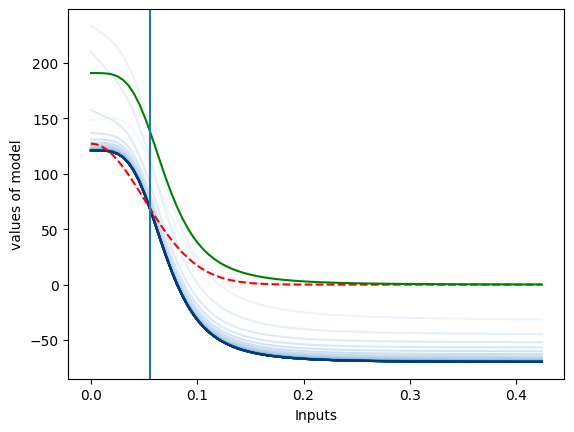

In [339]:
show_nn_trajectory(params_list_special, model, 'Blues', center_x=0, center_y=0, size=85)
plt.axvline(distance1)

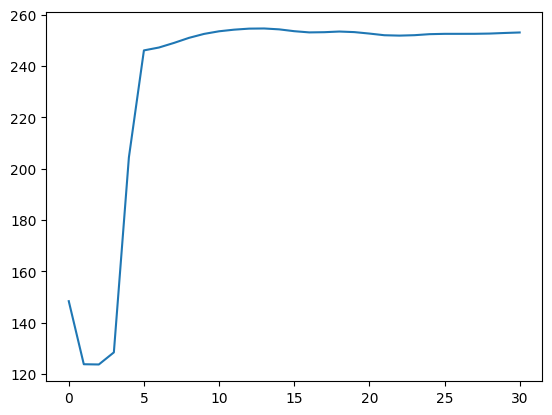

In [315]:
xy_combined = d_start - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)

array_reciprocal4 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent4 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_4 = np.zeros(iteration+1)


for j in range(iteration+1):
    last_params = params_list_special[j]
    array_nn = model.apply(last_params, xy_combined) * 70.0
    y_at_design = array_nn.squeeze()+array_reciprocal4
    y_at_design_array_4[j]=y_at_design

plt.plot(y_at_design_array_4)

#plt.axhline(array_exponent4)

In [316]:
y_at_design_array_03 = y_at_design_array_4 # 23,23

In [313]:
y_at_design_array_02 = y_at_design_array_4 # 25,26

In [310]:
y_at_design_array_01 = y_at_design_array_4 # 25,29 

In [307]:
y_at_design_array_00 = y_at_design_array_4 # 27,27

In [321]:
xy_combined = jnp.array([0.23,0.23]) - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)

array_exponent3 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

Text(0, 0.5, 'NN output')

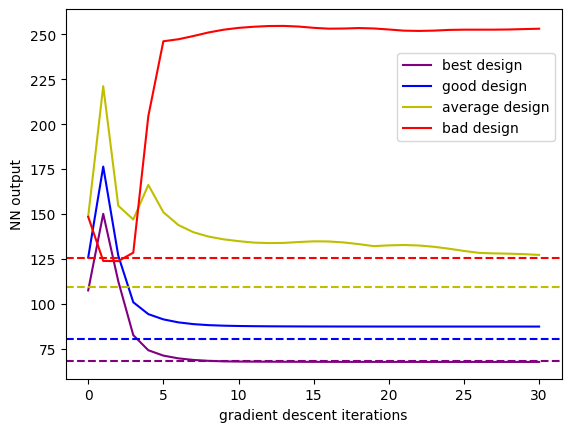

In [329]:
plt.plot(y_at_design_array_01,color='purple',label='best design')
plt.axhline(array_exponent1,color='purple',linestyle='--')
plt.plot(y_at_design_array_00,color='b',label='good design')
plt.axhline(array_exponent0,color='b',linestyle='--')
plt.plot(y_at_design_array_02,color='y',label='average design')
plt.axhline(array_exponent2,color='y',linestyle='--')
plt.plot(y_at_design_array_03,color='r',label='bad design')
plt.axhline(array_exponent3,color='r',linestyle='--')
plt.legend(loc='upper right', bbox_to_anchor=(1, 0.9))
plt.xlabel('gradient descent iterations')
plt.ylabel('NN output')

In [326]:
np.savez('design_data.npz',
         y_at_design_array_00=y_at_design_array_00,
         array_exponent0=array_exponent0,
         y_at_design_array_01=y_at_design_array_01,
         array_exponent1=array_exponent1,
         y_at_design_array_02=y_at_design_array_02,
         array_exponent2=array_exponent2,
         y_at_design_array_03=y_at_design_array_03,
         array_exponent3=array_exponent3)

In [ ]:
data = np.load('design_data.npz')
y_at_design_array_00 = data['y_at_design_array_00']
array_exponent0 = data['array_exponent0']
# 以此类推加载其他数据


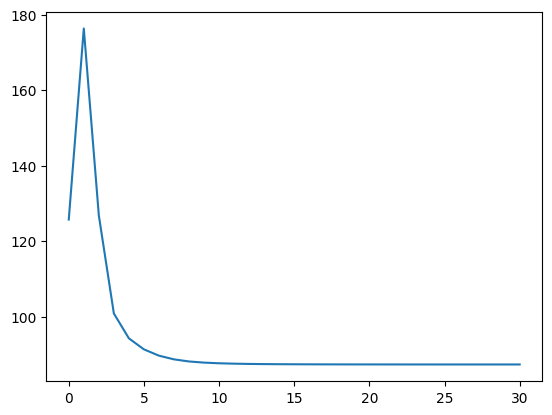

In [84]:
xy_combined = d_start - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)

array_reciprocal4 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent4 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))

y_at_design_array_4 = np.zeros(ensemble_step+1)


for j in range(iteration+1):
    last_params = params_list_special[j]
    array_nn = model.apply(last_params, xy_combined) * 70.0
    y_at_design = array_nn.squeeze()+array_reciprocal4
    y_at_design_array_4[j]=y_at_design

plt.plot(y_at_design_array_4)

#plt.axhline(array_exponent4)

In [41]:
stage = 2
iteration = 100

d_start = jnp.array([0.23,0.23])#design_list[stage+1]
prior = posterior_list[stage-1]
params = params_list[stage-1]

#params = params_list_special[20]
y_f, _ = sealed_convection_diffusion_nn(params, d_start, estimated_center, stage, model)
loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=y_f, scale=noise_base_scale+noise_ratio_scale* y_f)
loglikelihood2 = jax.scipy.stats.norm.logpdf(observation, loc=y_f, scale=noise_base_scale)
y_f, loglikelihood, loglikelihood2

(Array(0.46509898, dtype=float32),
 Array(1.68288, dtype=float32),
 Array(2.051055, dtype=float32))

In [42]:
params = params_list_special[-1]
y_f, _ = sealed_convection_diffusion_nn(params, d_start, estimated_center, stage, model)
loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=y_f, scale=noise_base_scale+noise_ratio_scale* y_f)
loglikelihood2 = jax.scipy.stats.norm.logpdf(observation, loc=y_f, scale=noise_base_scale)
y_f, loglikelihood, loglikelihood2

(Array(0.5079614, dtype=float32),
 Array(1.4075973, dtype=float32),
 Array(1.4891198, dtype=float32))

In [67]:
observation = 0.45
noise_base_scale = 0.5
noise_ratio_scale = 0.05
y_f = -5
loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=y_f, scale=noise_base_scale+noise_ratio_scale* y_f)
loglikelihood2 = jax.scipy.stats.norm.logpdf(observation, loc=y_f, scale=noise_base_scale)
print(y_f, loglikelihood, loglikelihood2)
y_f = -5
noise_base_scale = 0.5
loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=y_f, scale=noise_base_scale+noise_ratio_scale* y_f)
loglikelihood2 = jax.scipy.stats.norm.logpdf(observation, loc=y_f, scale=noise_base_scale)
print(y_f, loglikelihood, loglikelihood2)

-5 -370.5907 -5938.4224
-5 -237.15262 -59.630787


In [ ]:
# 查看梯度之间的差距

In [34]:
params = params_list[stage-1]
noise_base_scale = 0.5
jax.value_and_grad(loss_param_refine7)(params, d_start, stage, estimated_center, model, observation)[1]

{'params': {'Dense_0': {'bias': Array([ 2.332738  , -2.839385  ,  0.98909736,  2.5342703 ,  3.143602  ,
           0.5315268 , -2.1144843 , -0.77679616], dtype=float32),
   'kernel': Array([[-0.41353574,  0.25205314, -0.08742728, -0.05502914, -0.29943454,
           -0.06531382,  0.2832205 ,  0.28035802],
          [-0.09870999,  0.35786995, -0.01707481,  0.13233577, -0.09258352,
           -0.03497356,  0.10154206,  0.24125266]], dtype=float32)},
  'Dense_1': {'bias': Array([-3.973125 , -3.4638643, -6.482431 ,  0.9638735], dtype=float32),
   'kernel': Array([[-1.6116573 , -1.8237555 , -3.1708808 ,  0.35984457],
          [-1.1069118 , -0.90233636, -1.5878894 ,  0.2512205 ],
          [-2.569749  , -2.1798487 , -4.11227   ,  0.6273423 ],
          [ 0.9465654 ,  2.0089865 ,  2.7557757 , -0.02863992],
          [ 0.86672735, -1.0004603 , -0.64384395, -0.38203663],
          [-0.23963068, -1.3537045 , -1.7751185 , -0.05590206],
          [-0.7964347 , -0.08619075, -0.54240596,  0.2244254

In [19]:
jax.value_and_grad(loss_param_refine6)(params, d_start, stage, estimated_center, model, observation)[1]

{'params': {'Dense_0': {'bias': Array([ 0.01166378, -0.01419695,  0.00494545,  0.01267072,  0.01571809,
           0.00265775, -0.01057234, -0.00388399], dtype=float32),
   'kernel': Array([[-2.0676753e-03,  1.2602601e-03, -4.3712489e-04, -2.7521132e-04,
           -1.4972396e-03, -3.2657495e-04,  1.4160969e-03,  1.4017960e-03],
          [-4.9354159e-04,  1.7893501e-03, -8.5367457e-05,  6.6168373e-04,
           -4.6288996e-04, -1.7487298e-04,  5.0771568e-04,  1.2062633e-03]],      dtype=float32)},
  'Dense_1': {'bias': Array([-0.01986562, -0.01731932, -0.03241215,  0.00481937], dtype=float32),
   'kernel': Array([[-0.00805831, -0.00911885, -0.01585434,  0.00179921],
          [-0.00553453, -0.00451179, -0.00793956,  0.00125604],
          [-0.0128488 , -0.01089935, -0.02056127,  0.00313668],
          [ 0.00473282,  0.01004502,  0.0137789 , -0.00014322],
          [ 0.00433369, -0.0050023 , -0.00321925, -0.00191015],
          [-0.00119814, -0.00676856, -0.00887562, -0.0002795 ],
   

In [92]:
params = params_list[stage-1]
noise_base_scale = 0.5
def loss_param_refine9(current_params, d_start_list, stage, estimated_center, model, observation):
    
    i1 = (d_start_list[0][0]-lo_b)/(up_b-lo_b)*(size-1)
    j1 = (d_start_list[0][1]-lo_b)/(up_b-lo_b)*(size-1)
    i2 = (d_start_list[1][0]-lo_b)/(up_b-lo_b)*(size-1)
    j2 = (d_start_list[1][1]-lo_b)/(up_b-lo_b)*(size-1)
    
    _, u = sealed_convection_diffusion_nn(current_params, d_start, estimated_center, stage, model)
    y_f1 = jax.scipy.ndimage.map_coordinates(u,[i1,j1],1)
    
    loglikelihood1 = jax.scipy.stats.norm.logpdf(observation, loc=y_f1, scale=noise_base_scale+noise_ratio_scale* y_f1)
    
    y_f2 = jax.scipy.ndimage.map_coordinates(u,[i2,j2],1)
    loglikelihood2 = jax.scipy.stats.norm.logpdf(observation_pre, loc=y_f2, scale=noise_base_scale+noise_ratio_scale* y_f2)

    return -(loglikelihood1**2+loglikelihood2**2)
    
print(jax.value_and_grad(loss_param_refine9)(params, d_start_list, stage, estimated_center, model, observation))

def loss_param_refine9(current_params, d_start_list, stage, estimated_center, model, observation):
    
    i1 = (d_start_list[0][0]-lo_b)/(up_b-lo_b)*(size-1)
    j1 = (d_start_list[0][1]-lo_b)/(up_b-lo_b)*(size-1)
    i2 = (d_start_list[1][0]-lo_b)/(up_b-lo_b)*(size-1)
    j2 = (d_start_list[1][1]-lo_b)/(up_b-lo_b)*(size-1)
    
    _, u = sealed_convection_diffusion_nn(current_params, d_start, estimated_center, stage, model)
    y_f1 = jax.scipy.ndimage.map_coordinates(u,[i1,j1],1)
    
    loglikelihood1 = jax.scipy.stats.norm.logpdf(observation, loc=y_f1, scale=noise_base_scale+noise_ratio_scale* y_f1)
    
    y_f2 = jax.scipy.ndimage.map_coordinates(u,[i2,j2],1)
    loglikelihood2 = jax.scipy.stats.norm.logpdf(observation_pre, loc=y_f2, scale=noise_base_scale+noise_ratio_scale* y_f2)

    return -loglikelihood1-loglikelihood2
    
print(jax.value_and_grad(loss_param_refine9)(params, d_start_list, stage, estimated_center, model, observation))

(Array(-0.37575233, dtype=float32), {'params': {'Dense_0': {'bias': Array([ 0.1100139 , -0.13682608,  0.04254919,  0.08602141,  0.14526758,
        0.02829963, -0.0939372 , -0.04416147], dtype=float32), 'kernel': Array([[-0.02146511,  0.01702962, -0.00421736, -0.00162955, -0.01383914,
        -0.00320206,  0.01543546,  0.01768917],
       [-0.00820898,  0.0227325 , -0.00223263,  0.00396689, -0.00717236,
        -0.00213129,  0.00857009,  0.01556749]], dtype=float32)}, 'Dense_1': {'bias': Array([-0.17989664, -0.18274926, -0.3179535 ,  0.0386432 ], dtype=float32), 'kernel': Array([[-0.07633074, -0.10244866, -0.16889569,  0.01512603],
       [-0.04142535, -0.03963638, -0.05894954,  0.00734121],
       [-0.11635956, -0.11454984, -0.20060155,  0.02515775],
       [ 0.05319216,  0.12019448,  0.16769546, -0.00307414],
       [ 0.02826746, -0.07144459, -0.07372965, -0.01334332],
       [-0.01601414, -0.0832626 , -0.11390126, -0.00131664],
       [-0.04345995, -0.00736469, -0.02903829,  0.01004

In [30]:
jax.scipy.stats.norm.logpdf(observation, loc=-7, scale=noise_base_scale),jax.scipy.stats.norm.logpdf(observation, loc=-8, scale=noise_base_scale)

(Array(-11109.613, dtype=float32), Array(-14291.115, dtype=float32))

In [23]:
y_f, loglikelihood

(Array(-8.096136, dtype=float32), Array(-290.223, dtype=float32))

In [ ]:
def loss_param_refine5(current_params, d_start, stage, estimated_center, model, observation):

    y_f, _ = sealed_convection_diffusion_nn(current_params, d_start, estimated_center, stage, model)
    loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=y_f, scale=noise_base_scale+noise_ratio_scale* y_f)

    return -loglikelihood

In [81]:
d_start, estimated_center, d_start- estimated_center

(Array([0.24534842, 0.24344872], dtype=float32),
 Array([0.236, 0.236], dtype=float32),
 Array([0.00934842, 0.00744872], dtype=float32))

In [82]:
xy_combined = d_start - estimated_center
exponent_internal = jnp.sum(xy_combined**2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
array_nn = model.apply(last_params, xy_combined) * 70.0
array_reciprocal3 = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
array_exponent3 = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
        

array_nn = model.apply(params_list_special[-2], xy_combined) * 70.0

In [85]:
xy_combined**2

Array([8.73930e-05, 5.54834e-05], dtype=float32)

In [84]:
array_reciprocal3, array_exponent3, array_nn

(Array(190.8301, dtype=float32),
 Array(123.73712, dtype=float32),
 Array([-41.896717], dtype=float32))

In [73]:
observation, sealed_convection_diffusion_nn(params_list_special[-2], d_start, estimated_center, stage, model)[0]

(Array(0.5069676, dtype=float32), Array(0.5004449, dtype=float32))

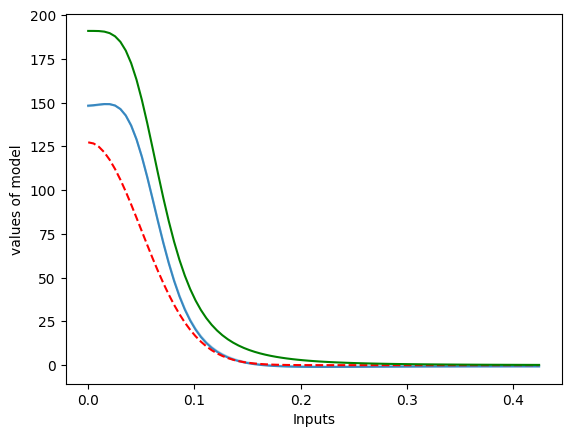

In [39]:
show_nn_trajectory([params_list[-1],params_list_special[-1]], model,  'Blues',center_x=0, center_y=0, size=85)

(0.06, 0.08)

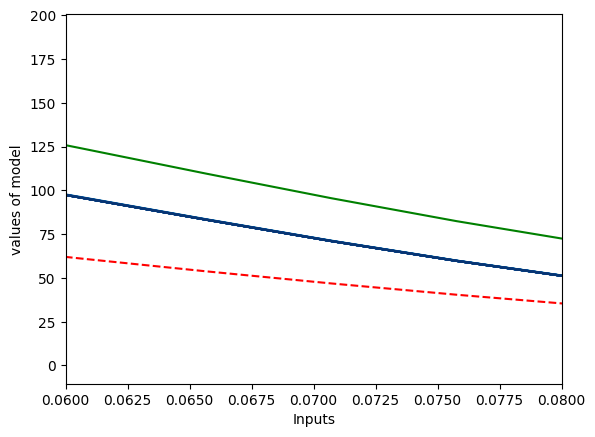

In [53]:
show_nn_trajectory(params_list_special, model, center_x=0, center_y=0, size=85)
plt.axvline(distance)
plt.xlim([0.06,0.08])

In [18]:
for stage in range(n_stage):
    y, y_field = sealed_convection_diffusion_true(design_list[stage+1], center, stage)
    print(f'maximum of u is {jnp.max(y_field)}, mean of u is {jnp.mean(y_field)}. observation at design {design_list[stage+1]} is {y}')

maximum of u is 0.5851787328720093, mean of u is 0.004039997234940529. observation at design [0.37815458 0.37834254] is 0.27154695987701416
maximum of u is 0.6266726851463318, mean of u is 0.008039994165301323. observation at design [0.3037421  0.30317488] is 0.5742236971855164
maximum of u is 0.5540176033973694, mean of u is 0.012039991095662117. observation at design [0.24684314 0.24296996] is 0.5081968307495117
maximum of u is 0.4566551744937897, mean of u is 0.01603998988866806. observation at design [0.18399519 0.18117835] is 0.1615881323814392
maximum of u is 0.3885820209980011, mean of u is 0.020039988681674004. observation at design [0.12406285 0.12482777] is 0.02496068924665451
maximum of u is 0.34325411915779114, mean of u is 0.02403998374938965. observation at design [0.07989854 0.0806704 ] is 0.003781680716201663
maximum of u is 0.3089401423931122, mean of u is 0.028039980679750443. observation at design [0.27989855 0.2806704 ] is 0.30871573090553284


In [64]:
d_start = jnp.array([0.26,0.26])
sealed_convection_diffusion_true(d_start, center, stage)[0], sealed_convection_diffusion_nn(params, d_start, center, stage, model)[0],sealed_convection_diffusion_nn(params, design_list[stage+1],estimated_center, stage, model)[0],sealed_convection_diffusion_nn(params_list[stage-1], design_list[stage+1],estimated_center, stage, model)[0]

(Array(0.54582864, dtype=float32),
 Array(0.48609066, dtype=float32),
 Array(0.49199077, dtype=float32),
 Array(0.51709276, dtype=float32))

In [31]:
estimated_center,center

(Array([0.23200001, 0.24399999], dtype=float32),
 Array([0.25, 0.25], dtype=float32))

In [ ]:
# 加入一个循环，使用不同的学习率，分别打印

design for model correction is [0.23 0.23]
measurement is: 0.4537546634674072
estimated center is [0.236 0.236]
initial model output is 0.4650989770889282
learnig rate is 1.0
..................................................

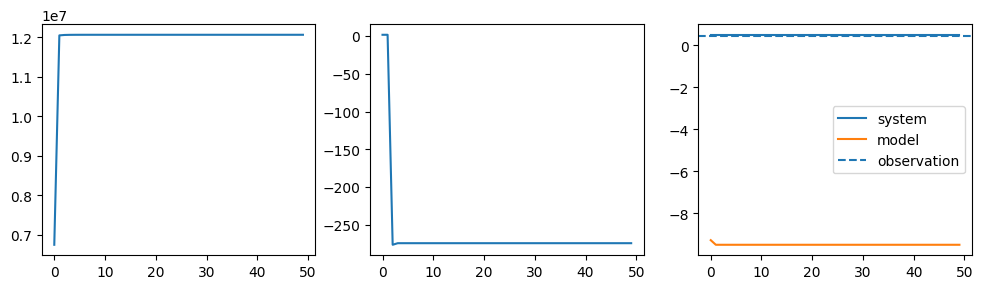

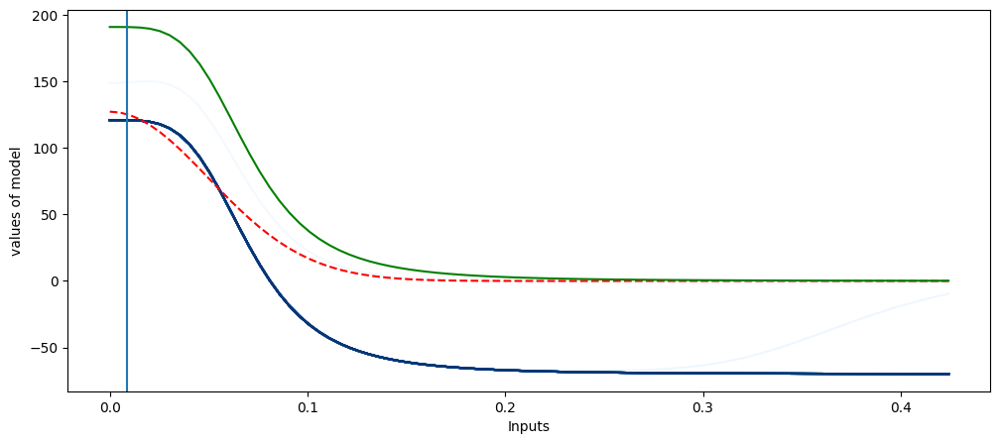

learnig rate is 1.5
..................................................

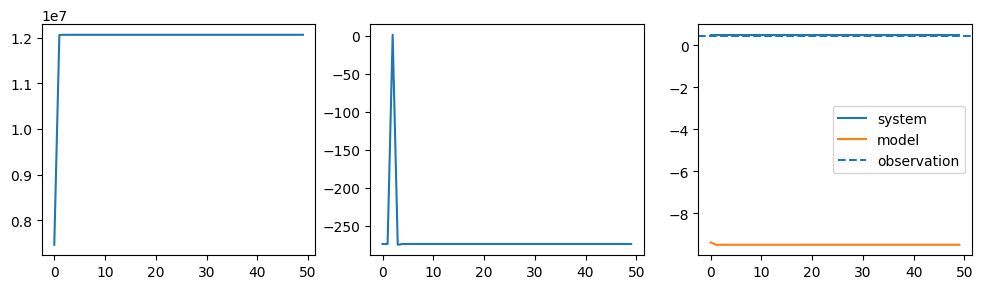

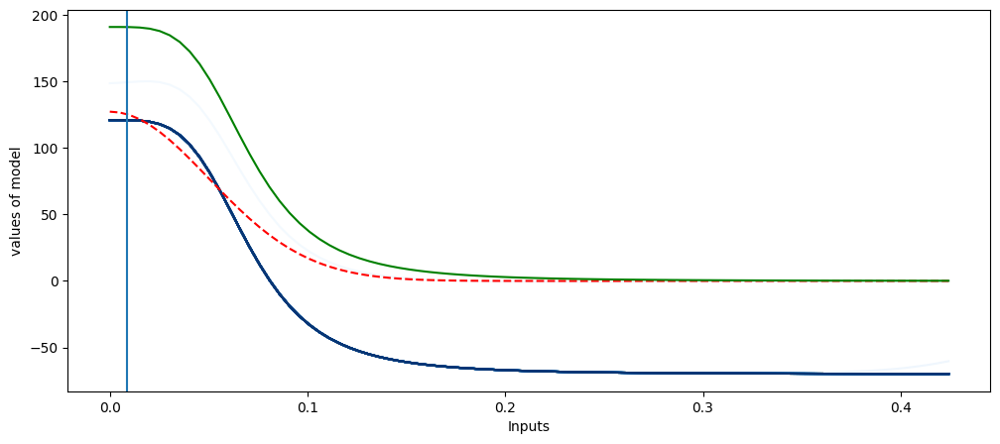

learnig rate is 2.0
..................................................

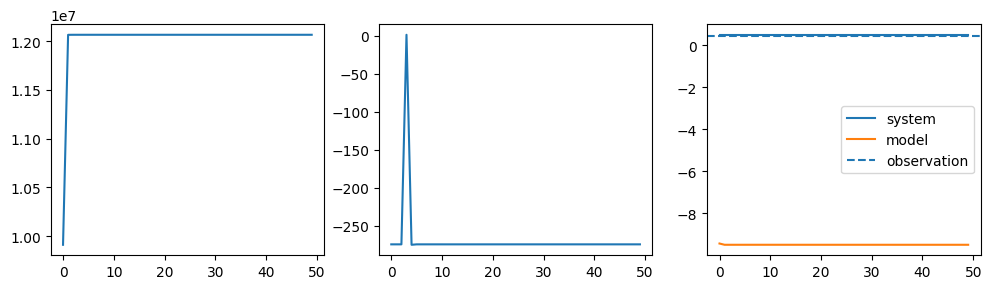

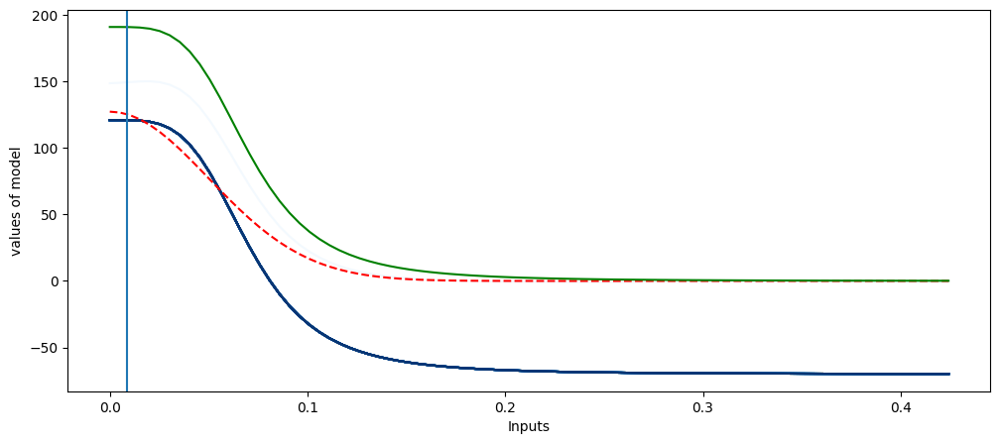

In [30]:
stage = 2
iteration = 50

d_start = jnp.array([0.23,0.23])#design_list[stage+1]#jnp.array([0.26,0.26])#
prior = posterior_list[stage-1]
params = params_list[stage-1]


_, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)

del prior
prior = posterior  

print(f'design for model correction is {d_start}')
observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
print(f'measurement is: {observation}')
max_evidence_items, estimated_center = loss_param_refine4(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model, observation, 5)
print(f'estimated center is {estimated_center}')
y0, _ = sealed_convection_diffusion_nn(params, d_start, estimated_center, stage, model)
print(f'initial model output is {y0}')

evidence_list_special = []
NN_error_list_special = []
params_list_special = []
y_f_system_list = []
y_f_model_list = []

for j in range(3):

    lr = 0.5*(j+1)+0.5#0.005*(j+1)#+0.025
    print(f'learnig rate is {lr}')
      
    try:
        del tx2
        del lr_schedule2
        del opt_state2
    except:
        pass 
        
    
    #tx2 = optax.chain(
    #    optax.adam(lr_schedule2),  # 使用由 lr_schedule1 调整的学习率的 Adam 优化器
    #    optax.add_decayed_weights(1e-4)  # 添加权重衰减，衰减系数为 1e-5
    #)
    
    params = params_list[stage-1]
    tx2 = optax.adam(lr)
    opt_state2 = tx2.init(params)
     
    
    evidence_list_special.append(-max_evidence_items)
    params_list_special.append(params)

    
    for i in range(iteration):
        if stage in [0]:
            print('stage one dont learn error parameters')
            break
        
        max_evidence_items, grad_params = jax.value_and_grad(loss_param_refine5)(params, d_start, stage, estimated_center, model, observation)
        #max_evidence_items, grad_params = jax.value_and_grad(loss_param_refine6)(params, d_start, stage, estimated_center, model, observation)
        #max_evidence_items, grad_params = jax.value_and_grad(loss_param_refine7)(params, d_start, stage, estimated_center, model, observation)
        
        clip_norm = 1e10
        clip_transform = optax.clip_by_global_norm(clip_norm)
        clipped_grads, _ = clip_transform.update(grad_params, state=None)
        
        updates, opt_state2 = tx2.update(clipped_grads, opt_state2, params=params)
        
        # 解决nan的问题
        updates_contain_nans = any(jnp.any(jnp.isnan(u)) for u in jax.tree_util.tree_leaves(updates))
        if updates_contain_nans:
            print('NaN appears in learning. Perturb params and continue')
            noise = jax.tree_util.tree_map(lambda p: 0.001 * jax.random.normal(key_for_param[i], p.shape), params)
            params = jax.tree_util.tree_map(lambda p, n: p + n, params, noise)
        else:
            params = optax.apply_updates(params, updates)
            
        net_accuracy = evaluate_nn_accuracy(params,model,center,local_size)
        #print(f'Loss step {i} max evidence items: {max_evidence_items}, nn error {i}: {net_accuracy}')
        
        if np.isnan((max_evidence_items, net_accuracy)).any():
            print('some results are Nan')
            break
            
        evidence_list_special.append(-max_evidence_items)
        NN_error_list_special.append(net_accuracy)
        params_list_special.append(params)
    
        y_f_system , _ = sealed_convection_diffusion_true(d_start, estimated_center, stage)
        y_f_model , _ = sealed_convection_diffusion_nn(params, d_start, estimated_center, stage, model)
        y_f_system_list.append(y_f_system)
        y_f_model_list.append(y_f_model)
    
        print('.',end='')
    
    #_, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
    
    fig, axes = plt.subplots(1,3,figsize=(12,3))
    axes[0].plot(NN_error_list_special[(0+j*iteration):(iteration+j*iteration)]) # minimize it
    axes[1].plot(evidence_list_special[(0+j*iteration):(iteration+j*iteration)]) # maximize it
    axes[2].plot(y_f_system_list[(0+j*iteration):(iteration+j*iteration)], label='system')
    axes[2].plot(y_f_model_list[(0+j*iteration):(iteration+j*iteration)], label='model')
    axes[2].axhline(observation, linestyle='--', label='observation')
    axes[2].legend()
    
    distance = np.sqrt(np.sum((estimated_center-d_start)**2))
    
    #print(evidence_list_special[60], evidence_list_special[100],evidence_list_special[200])
    plt.figure(figsize=(12,5))
    show_nn_trajectory(params_list_special[(0+j*(iteration+1)):((1+j)*(iteration+1))], model, center_x=0, center_y=0, size=85)
    plt.axvline(distance)
    plt.show()

In [24]:
grad_params

{'params': {'Dense_0': {'bias': Array([-0.99629813, -4.754184  ,  0.35989937, 15.11298   ,  4.6339564 ,
          -2.1355    , -4.178384  ,  2.783605  ], dtype=float32),
   'kernel': Array([[-0.23056369, -0.02315699,  0.07895362,  1.3129448 , -0.4526151 ,
           -0.06776698,  0.54450446, -0.1673419 ],
          [-0.3265457 ,  0.48517498,  0.10725865,  2.4582686 , -0.31991652,
           -0.32810077, -0.06157305, -0.22301939]], dtype=float32)},
  'Dense_1': {'bias': Array([-6.3504834, -0.8752908, -8.376963 ,  3.360447 ], dtype=float32),
   'kernel': Array([[-1.8507552 , -0.39026245, -1.45648   ,  0.38733903],
          [-1.9158906 , -0.1932078 , -2.5304697 ,  1.2197977 ],
          [-3.4276948 , -0.49495125, -4.386145  ,  1.7289786 ],
          [ 4.092962  ,  0.752402  , -0.8474998 ,  1.0050949 ],
          [-0.07088971, -0.53607124,  4.5045953 , -2.5176494 ],
          [-0.6277702 , -0.4639804 ,  2.3813488 , -1.4420364 ],
          [-1.5868129 , -0.12063575, -1.9068218 ,  0.7376333

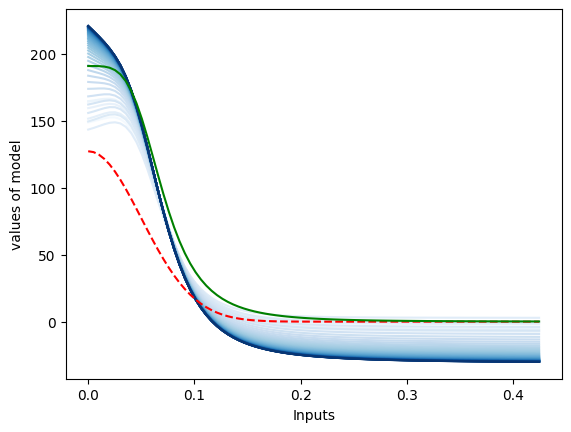

In [20]:
 show_nn_trajectory(params_list_special, model, center_x=0, center_y=0, size=85)

In [47]:
observation, sealed_convection_diffusion_true(d_start, center, stage)[0], sealed_convection_diffusion_nn(params, d_start, center, stage, model)[0],sealed_convection_diffusion_nn(params, d_start, estimated_center, stage, model)[0]

(Array(0.07864438, dtype=float32),
 Array(0.07864438, dtype=float32),
 Array(0.02554299, dtype=float32),
 Array(0.07510857, dtype=float32))

In [ ]:
plt.figure(figsize=(5,5))
show_nn_trajectory(params_list_special[(0+j*(iteration+1)):((1+j)*(iteration+1))], model, center_x=0, center_y=0, size=85)
show_nn_trajectory([params_list[stage-1]], model,  center_x=0, center_y=0, size=85)
plt.axvline(distance)
plt.xlim([0,distance])
plt.ylim([125,165])
plt.show()

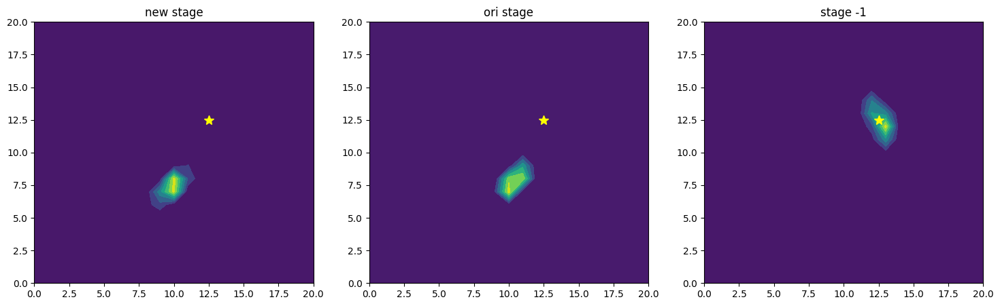

In [18]:
_, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
fig, axes = plt.subplots(1,3,figsize=(18,5))
axes[0].contourf(posterior.T)
axes[0].set_xlim([0,20])
axes[0].set_ylim([0,20])
axes[0].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)
axes[0].set_title('new stage')
axes[1].contourf(posterior_list[stage].T)
axes[1].set_xlim([0,20])
axes[1].set_ylim([0,20])
axes[1].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)
axes[1].set_title('ori stage')
axes[2].contourf(posterior_list[stage-1].T)
axes[2].set_xlim([0,20])
axes[2].set_ylim([0,20])
axes[2].set_title('stage -1')
axes[2].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)

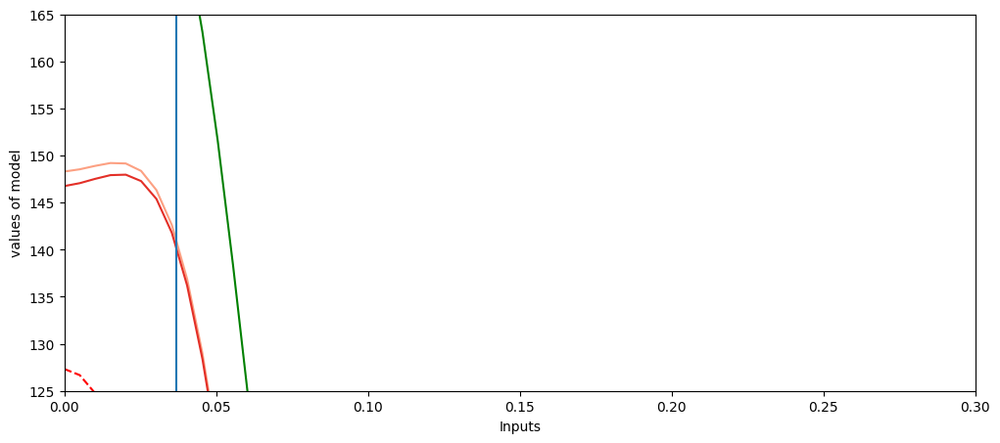

In [55]:
plt.figure(figsize=(12,5))
show_nn_trajectory([params_list[stage-1],params_list_special[-1]], model, 'Reds', center_x=0, center_y=0, size=85)
plt.axvline(distance)
plt.xlim([0.0,0.3])
plt.ylim([125,165])
plt.show()

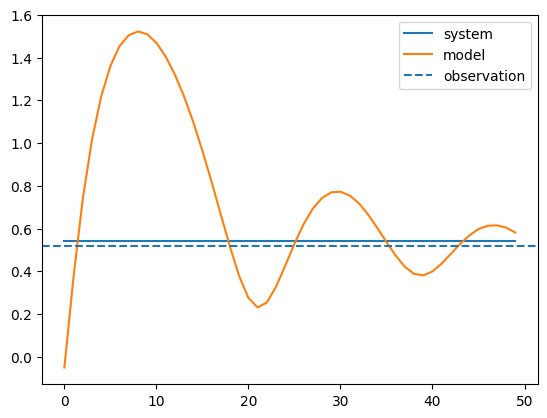

In [19]:
j=0

plt.plot(y_f_system_list[(0+j*iteration):(iteration+j*iteration)], label='system')
plt.plot(y_f_model_list[(0+j*iteration):(iteration+j*iteration)], label='model')
plt.axhline(observation, linestyle='--', label='observation')
plt.legend()

In [1]:
# 如果上面没算够，这里可以继续算

In [ ]:
for i in range(iteration):
    if stage in [0]:
        print('stage one dont learn error parameters')
        break
    
    max_evidence_items, grad_params = jax.value_and_grad(loss_param_refine5)(params, d_start, stage, estimated_center, model, observation)
    
    clip_norm = 1e10
    clip_transform = optax.clip_by_global_norm(clip_norm)
    clipped_grads, _ = clip_transform.update(grad_params, state=None)
    
    updates, opt_state2 = tx2.update(clipped_grads, opt_state2, params=params)
    
    # 解决nan的问题
    updates_contain_nans = any(jnp.any(jnp.isnan(u)) for u in jax.tree_util.tree_leaves(updates))
    if updates_contain_nans:
        print('NaN appears in learning. Perturb params and continue')
        noise = jax.tree_util.tree_map(lambda p: 0.001 * jax.random.normal(key_for_param[i], p.shape), params)
        params = jax.tree_util.tree_map(lambda p, n: p + n, params, noise)
    else:
        params = optax.apply_updates(params, updates)
        
    net_accuracy = evaluate_nn_accuracy(params,model,center,local_size)
    #print(f'Loss step {i} max evidence items: {max_evidence_items}, nn error {i}: {net_accuracy}')
    
    if np.isnan((max_evidence_items, net_accuracy)).any():
        print('some results are Nan')
        break
        
    evidence_list_special.append(-max_evidence_items)
    NN_error_list_special.append(net_accuracy)
    params_list_special.append(params)

    y_f_system , _ = sealed_convection_diffusion_true(d_start, estimated_center, stage)
    y_f_model , _ = sealed_convection_diffusion_nn(params, d_start, estimated_center, stage, model)
    y_f_system_list.append(y_f_system)
    y_f_model_list.append(y_f_model)

    print('.',end='')

In [2]:
# 绘制图片

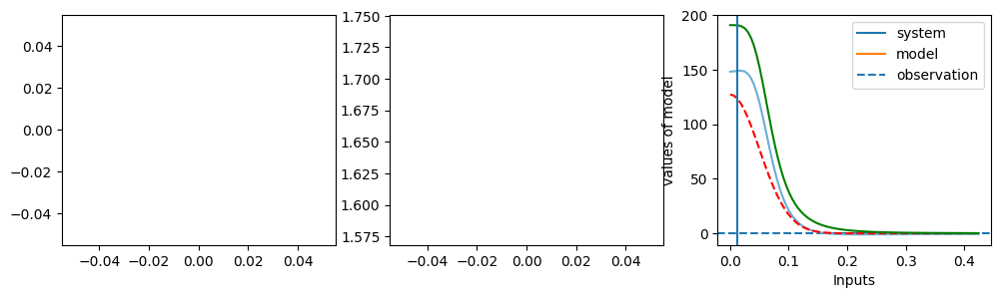

In [68]:
fig, axes = plt.subplots(1,3,figsize=(12,3))
axes[0].plot(NN_error_list_special) # minimize it
axes[1].plot(evidence_list_special) # maximize it
axes[2].plot(y_f_system_list, label='system')
axes[2].plot(y_f_model_list, label='model')
axes[2].axhline(observation, linestyle='--', label='observation')
axes[2].legend()

distance = np.sqrt(np.sum((estimated_center-d_start)**2))

#print(evidence_list_special[60], evidence_list_special[100],evidence_list_special[200])
show_nn_trajectory(params_list_special, model, center_x=0, center_y=0, size=85)
plt.axvline(distance)
plt.show()

In [40]:
len(params_list)

101

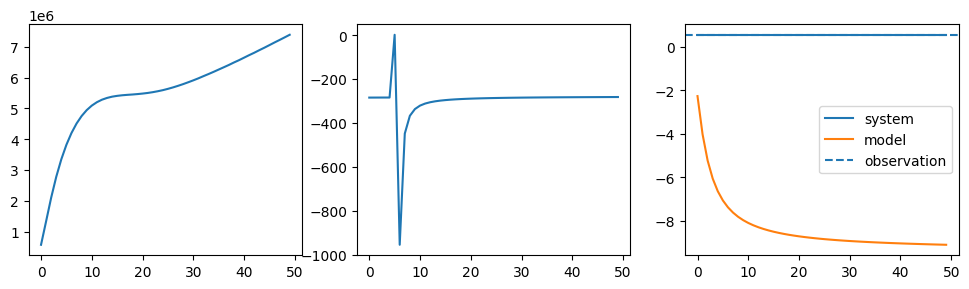

In [38]:
j=4
fig, axes = plt.subplots(1,3,figsize=(12,3))
axes[0].plot(NN_error_list_special[(0+j*50):(50+j*50)]) # minimize it
axes[1].plot(evidence_list_special[(0+j*50):(50+j*50)]) # maximize it

axes[2].plot(y_f_system_list[(0+j*50):(50+j*50)], label='system')
axes[2].plot(y_f_model_list[(0+j*50):(50+j*50)], label='model')
axes[2].axhline(observation, linestyle='--', label='observation')
axes[2].legend()

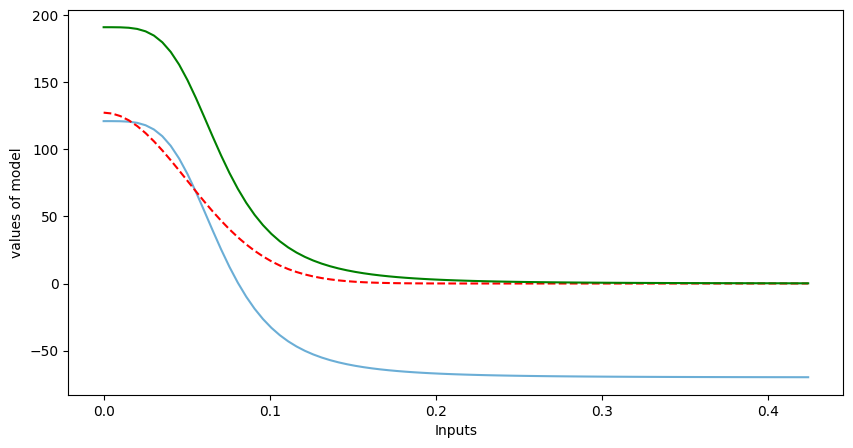

In [34]:
len(params_list_special)
j=2
show_nn_trajectory([params_list_special[0+j*51+2]], model, center_x=0, center_y=0, size=85)

In [11]:
sealed_convection_diffusion_nn(params, d_start, estimated_center, stage, model)[0]

Array(-9.315159, dtype=float32)

[[1.1376755e-16 8.9373220e-16 6.2069977e-15 ... 8.2990776e-36
  3.9263728e-36 1.9874523e-36]
 [2.4773496e-16 2.1979865e-15 1.7267808e-14 ... 5.5305711e-36
  2.7578729e-36 1.4639804e-36]
 [5.0965687e-16 5.2021896e-15 4.7169063e-14 ... 3.8688931e-36
  2.0242407e-36 1.1222243e-36]
 ...
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.1413773e-34
  1.6409961e-34 2.2939077e-34]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.4784951e-34
  2.1751113e-34 3.1137068e-34]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.8705050e-34
  2.8180909e-34 4.1369361e-34]]
design for model correction is [0.24908948 0.24295828]
measurement is: 0.5109094381332397
estimated center is [0.236 0.236]


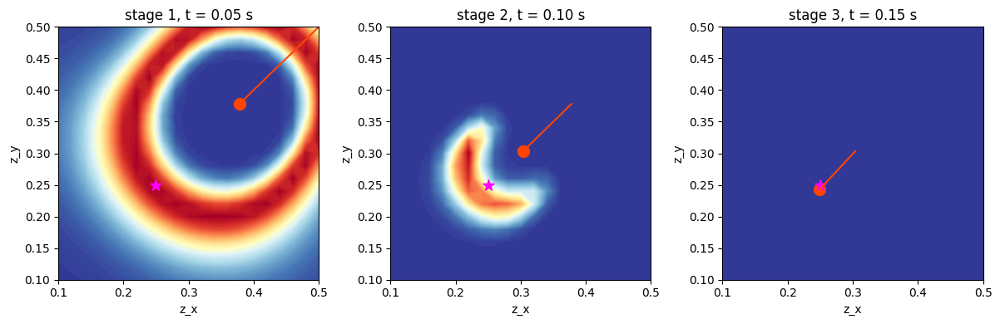

In [ ]:
rows = (n_stage + 4) // 5  # 计算总行数，每行5个子图

# 创建子图
fig, axes = plt.subplots(rows, 5, figsize=(20, 4 * rows))
axes = axes.flatten()  # 将axes转换为1D数组，方便索引

# 遍历每个子图并绘制内容
for stage in range(n_stage):
    axes[stage].contourf(grid_x_plot0, grid_y_plot0, posterior_list[stage].T, levels=100, cmap='RdYlBu_r')
    axes[stage].scatter(design_list[stage+1][0], design_list[stage+1][1], marker='o', s=100, c='orangered')
    axes[stage].scatter(center[0], center[1], marker='*', s=100, c='magenta')
    axes[stage].plot([design_list[stage+1][0],design_list[stage][0]],
                    [design_list[stage+1][1],design_list[stage][1]], c='orangered')
    axes[stage].set_title(f'stage {stage+1}, t = {((stage+1)*0.05):.2f} s')  # 设置子图的标题
    axes[stage].set_xlim([0.1, 0.5])  # 设置x轴范围
    axes[stage].set_ylim([0.1, 0.5])  # 设置y轴范围
    axes[stage].set_xlabel('z_x')  # 设置x轴标签
    axes[stage].set_ylabel('z_y')  # 设置y轴标签

# 如果子图的总数不能被5整除，隐藏多余的空子图
for i in range(n_stage, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()  # 调整布局，使子图之间不重叠
plt.show()

In [18]:
for stage in range(n_stage):
    y, y_field = sealed_convection_diffusion_true(design_list[stage+1], center, stage)
    print(f'maximum of u is {jnp.max(y_field)}, mean of u is {jnp.mean(y_field)}. observation at design {design_list[stage+1]} is {y}')

maximum of u is 0.5851787328720093, mean of u is 0.004039997234940529. observation at design [0.37815458 0.37834254] is 0.27154695987701416
maximum of u is 0.6266726851463318, mean of u is 0.008039994165301323. observation at design [0.3037421  0.30317488] is 0.5742236971855164
maximum of u is 0.5540176033973694, mean of u is 0.012039991095662117. observation at design [0.24908948 0.24295828] is 0.5109094381332397


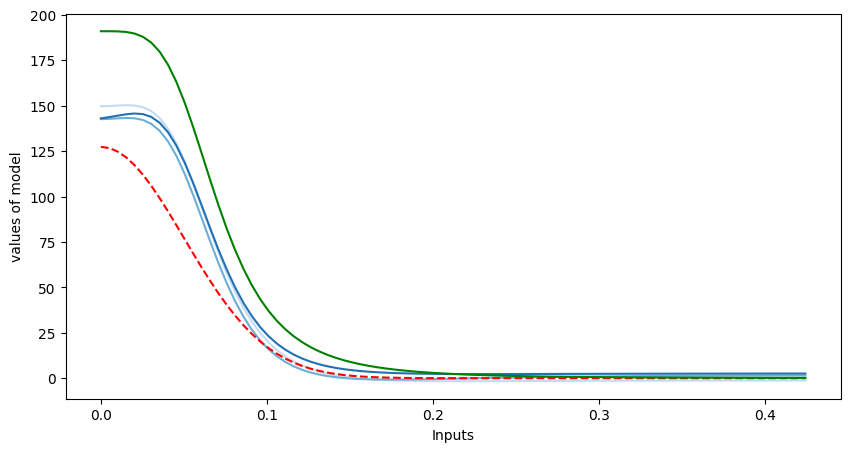

In [6]:
def show_nn_trajectory(params_list, apply_model, center_x=0, center_y=0, size=85):
    x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    y = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    xy_combined = jnp.concatenate((x, y), axis=1)
    
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    
    plt.figure(figsize=(10, 5))
    
    cmap = plt.colormaps['Blues'].resampled(len(params_list)+2)#cm.get_cmap('Blues', len(params_list))
    for index, params in enumerate(params_list):
        #if index not in [6]:
        #    continue
        array_nn = apply_model.apply(params, xy_combined) * 70.0
        
        plt.plot(jnp.sqrt(2) * x.squeeze(), 
                 (array_nn.squeeze() + array_reciprocal.squeeze()), 
                 label=f'NN + Reciprocal - Params {index+1}',
                 color=cmap(index+1))
    
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_exponent.squeeze(), color='r', linestyle = '--', label='Exponent')
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_reciprocal.squeeze(), color='g', label='Reciprocal')
    
    plt.ylabel('values of model')
    plt.xlabel('Inputs')
    
#show_nn_trajectory(params_list, model, center_x=0, center_y=0, size=85)
show_nn_trajectory([params_list[0],params_list[1],params_list[51]], model, center_x=0, center_y=0, size=85)

In [11]:
len(params_list)

101

In [16]:
np.sqrt(np.sum((np.array([0.268,      0.24800001])-np.array([0.3037421, 0.30317488]))**2))

0.06574012467227985

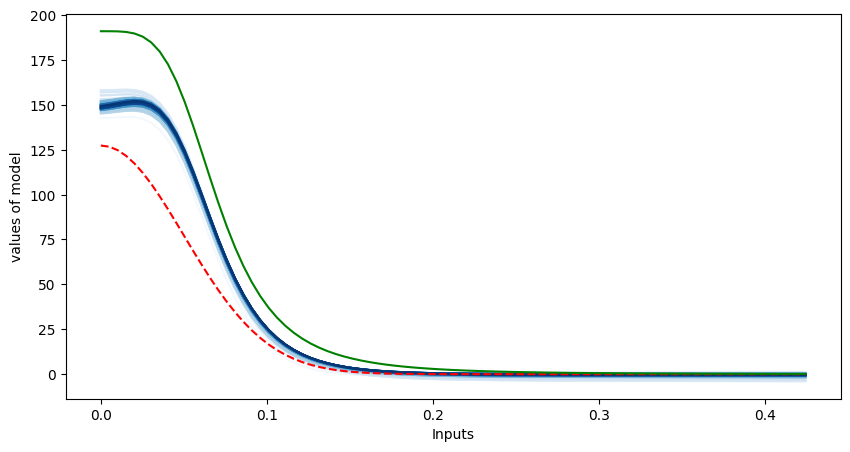

In [12]:
show_nn_trajectory(params_list[1:50], model, center_x=0, center_y=0, size=85)


In [17]:
np.sqrt(np.sum((np.array([0.236,0.236])-d_start)**2))

0.0148240365

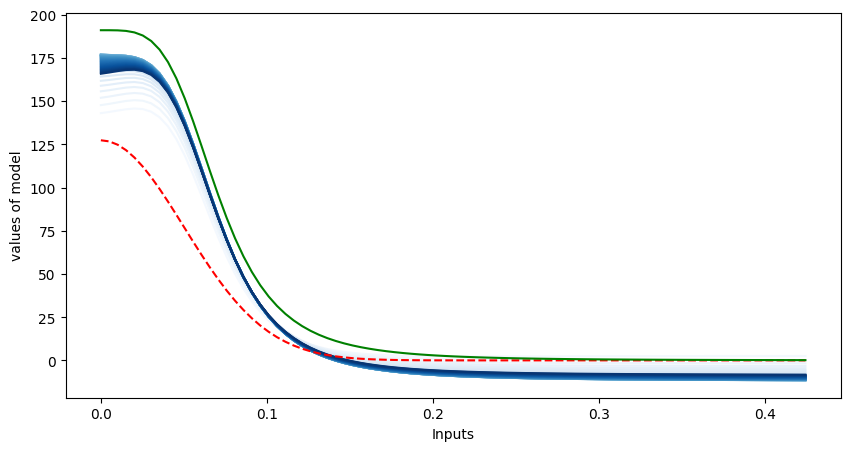

In [19]:
show_nn_trajectory(params_list[51:101], model, center_x=0, center_y=0, size=85)

In [32]:
len(posterior_list)

3

In [ ]:
stage = 2
iteration = 50

d_start = design_list[stage+1]
prior = posterior_list[stage-1]
params = params_list[stage-1]
evidence_list_special = []
NN_error_list_special = []
params_list_special = []
y_f_system_list = []
y_f_model_list = []

try:
    del tx2
    del lr_schedule2
    del opt_state2
except:
    pass 
    

#tx2 = optax.chain(
#    optax.adam(lr_schedule2),  # 使用由 lr_schedule1 调整的学习率的 Adam 优化器
#    optax.add_decayed_weights(1e-4)  # 添加权重衰减，衰减系数为 1e-5
#)

tx2 = optax.adam(0.035)
opt_state2 = tx2.init(params)

_, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
del prior
prior = posterior   


print(f'design for model correction is {d_start}')
observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
print(f'measurement is: {observation}')
max_evidence_items, estimated_center = loss_param_refine4(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model, observation, 5)
print(f'estimated center is {estimated_center}')
estimated_posterior_point.append(estimated_center)

evidence_list_special.append(-max_evidence_items)
params_list_special.append(params)

for i in range(iteration):
    if stage in [0]:
        print('stage one dont learn error parameters')
        break
    
    max_evidence_items, grad_params = jax.value_and_grad(loss_param_refine5)(params, d_start, stage, estimated_center, model, observation)
    
    clip_norm = 1e10
    clip_transform = optax.clip_by_global_norm(clip_norm)
    clipped_grads, _ = clip_transform.update(grad_params, state=None)
    
    updates, opt_state2 = tx2.update(clipped_grads, opt_state2, params=params)
    
    # 解决nan的问题
    updates_contain_nans = any(jnp.any(jnp.isnan(u)) for u in jax.tree_util.tree_leaves(updates))
    if updates_contain_nans:
        print('NaN appears in learning. Perturb params and continue')
        noise = jax.tree_util.tree_map(lambda p: 0.001 * jax.random.normal(key_for_param[i], p.shape), params)
        params = jax.tree_util.tree_map(lambda p, n: p + n, params, noise)
    else:
        params = optax.apply_updates(params, updates)
        
    net_accuracy = evaluate_nn_accuracy(params,model,center,local_size)
    #print(f'Loss step {i} max evidence items: {max_evidence_items}, nn error {i}: {net_accuracy}')
    
    if np.isnan((max_evidence_items, net_accuracy)).any():
        print('some results are Nan')
        break
        
    evidence_list_special.append(-max_evidence_items)
    NN_error_list_special.append(net_accuracy)
    params_list_special.append(params)

    y_f_system , _ = sealed_convection_diffusion_true(d_start, estimated_center, stage)
    y_f_model , _ = sealed_convection_diffusion_nn(params, d_start, estimated_center, stage, model)
    y_f_system_list.append(y_f_system)
    y_f_model_list.append(y_f_model)

    print('.',end='')

_, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)

fig, axes = plt.subplots(1,3,figsize=(12,3))
axes[0].plot(NN_error_list_special) # minimize it
axes[1].plot(evidence_list_special) # maximize it
axes[2].plot(y_f_system_list, label='system')
axes[2].plot(y_f_model_list, label='model')
axes[2].axhline(observation, linestyle='--')
axes[2].legend()


#print(evidence_list_special[60], evidence_list_special[100],evidence_list_special[200])
show_nn_trajectory(params_list_special, model, center_x=0, center_y=0, size=85)

In [23]:
design_list

[Array([0.5, 0.5], dtype=float32),
 Array([0.37815458, 0.37834254], dtype=float32),
 Array([0.3037421 , 0.30317488], dtype=float32),
 Array([0.24908948, 0.24295828], dtype=float32)]

In [130]:
# 每一阶段计算kld

In [6]:
import os
import pickle
import gc
from flax.traverse_util import flatten_dict, unflatten_dict

def reconstruct_array_to_dict(params_grad_array, grads):
    """
    将扁平化后的数组重新构建回原始的 grads 字典。

    参数:
    - params_grad_array: 扁平化后的梯度数组
    - grads: 原始的 grads 字典，用于获取结构信息

    返回:
    - reconstructed_grads: 重建后的 grads 字典
    """
    # 获取原始 grads 的结构信息
    params_grad_flat = flatten_dict(grads)
    shapes = {k: v.shape for k, v in params_grad_flat.items()}

    # 将 params_grad_array 拆分成原始形状的数组
    index = 0
    reconstructed_params_grad_flat = {}
    for k, shape in shapes.items():
        size = size = int(np.prod(shape))  # 将形状转换为 numpy 数组，然后计算其大小
        reconstructed_params_grad_flat[k] = jnp.reshape(params_grad_array[index:index+size], shape)
        index += size

    # 将平坦化的字典恢复到原始的嵌套结构
    reconstructed_grads = unflatten_dict(reconstructed_params_grad_flat)

    return reconstructed_grads

def reconstruct_dict_to_array(grads):
    """
    将嵌套字典转换为扁平化的数组。

    参数:
    - grads: 嵌套的 grads 字典

    返回:
    - params_grad_array: 扁平化后的梯度数组
    """
    # 将字典展平
    params_grad_flat = flatten_dict(grads)
    
    # 获取所有梯度值，并将其展平
    flat_arrays = [jnp.ravel(v) for v in params_grad_flat.values()]
    
    # 将所有展平的数组拼接成一个单独的数组
    params_grad_array = jnp.concatenate(flat_arrays)
    
    return params_grad_array

In [9]:
def kl_divergence(mu1, sigma1, mu2, sigma2):
    # 计算逆矩阵和行列式
    sigma2_inv = jnp.linalg.inv(sigma2)
    #sigma1_det = jnp.linalg.det(sigma1)
    #sigma2_det = jnp.linalg.det(sigma2)
    
    # 计算各项
    term1 = jnp.trace(sigma2_inv @ sigma1)
    term2 = (mu2 - mu1).T @ sigma2_inv @ (mu2 - mu1)
    
    _, logdet_sigma1 = jnp.linalg.slogdet(sigma1)
    _, logdet_sigma2 = jnp.linalg.slogdet(sigma2)
    term3 = logdet_sigma2 - logdet_sigma1
    #term3 = jnp.log(sigma2_det / sigma1_det)
    
    # 计算最终的KL散度
    kl_div = 0.5 * (term1 + term2 - len(mu1) + term3)
    
    return kl_div

with open('all_data_nn_case_seed_0.pkl', 'rb') as f:
    loaded_data = pickle.load(f)

# 通过键名访问每个数组
posterior_list = loaded_data["posterior_list"]
design_list = loaded_data["design_list"]
params_list = loaded_data["params_list"]

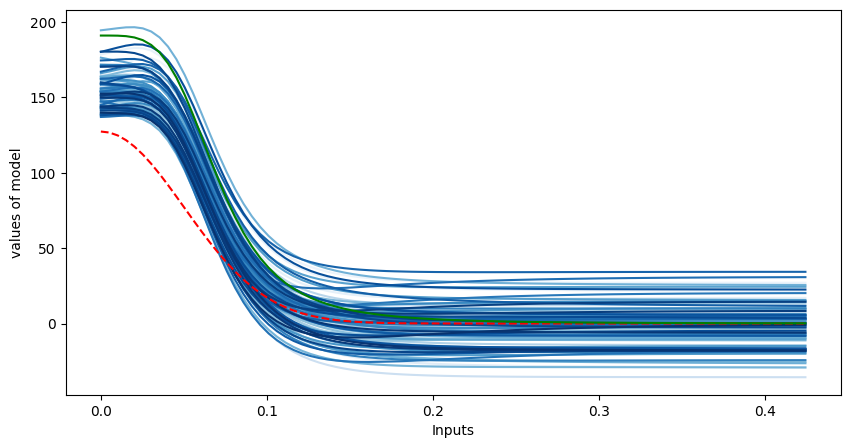

In [73]:
params = {'params': {'Dense_0': {'bias': jnp.array([ 0.4220,  0.4046,  0.7948, -0.0262, -0.4859, -0.0748,  0.6397, -0.4742]),
   'kernel': jnp.array([[-0.1428, -3.1386,  0.1278,  2.6601, -2.4509, -1.7899,  4.9854,  0.9533],
       [-0.8567,  4.0157, -0.0646,  3.7773, -3.3422, -1.3315, -3.8902, -1.9304]])},
  'Dense_1': {'bias': jnp.array([ 0.0143,  0.0755, -0.0477, -0.1939]),
   'kernel': jnp.array([[-0.3512, -0.4044, -0.1012, -0.16  ],
       [ 0.4947,  0.3578,  0.3282, -0.601 ],
       [-0.2726,  0.3012, -0.2303,  0.2767],
       [ 2.0844,  0.9441, -2.1975,  3.0451],
       [-0.5057, -0.1832, -0.3193, -0.2212],
       [-0.3738, -0.3433,  0.1701, -0.2727],
       [ 0.5894, -0.0387,  0.3692, -0.4085],
       [-0.1819,  0.3108,  0.1631,  0.1382]])},
  'Dense_2': {'bias': jnp.array([-0.0026]),
   'kernel': jnp.array([[-0.7601],
       [-0.2217],
       [-0.7139],
       [ 0.2727]])}}
    }

mean_array = reconstruct_dict_to_array(params)
std_dev = 0.1  # 标准差
ensemble_size = 100  # 生成的数组数量
ensemble_step = 20

# 定义生成单个数组的函数
def generate_sample(key, mean, std_dev):
    return mean + std_dev * jax.random.normal(key, shape=mean.shape)

# 生成100个不同的key
key_ensemble = jax.random.PRNGKey(0)  # 随机数种子
keys_ensemble = jax.random.split(key_ensemble, ensemble_size)

# 使用vmap并行化采样过程
ensemble_members_dict_list = []
ensemble_members_array = jax.vmap(generate_sample, in_axes=(0, None, None))(keys_ensemble, mean_array, std_dev)
for i in range(ensemble_size):
    ensemble_members_dict_list.append(reconstruct_array_to_dict(ensemble_members_array[i], params))

show_nn_trajectory(ensemble_members_dict_list, model, center_x=0, center_y=0, size=85)

In [67]:
ensemble_members_array.shape

(100, 65)

In [6]:
design_list

[Array([0.5, 0.5], dtype=float32),
 Array([0.37994587, 0.38006648], dtype=float32),
 Array([0.30553883, 0.304846  ], dtype=float32),
 Array([0.24626286, 0.25059688], dtype=float32),
 Array([0.21333322, 0.21473178], dtype=float32),
 Array([0.22432816, 0.1865946 ], dtype=float32),
 Array([0.26463738, 0.1855803 ], dtype=float32),
 Array([0.3043997 , 0.15138851], dtype=float32)]

In [59]:
# 只算几步，看看情况
    
stage = 2  # 修改stage ==================================
d_start = jnp.array([0.15,0.15])#design_list[stage+1]#
prior = posterior_list[stage-1]
params = params_list[stage-1]

mean_array = reconstruct_dict_to_array(params)
std_dev = 0.1  # 标准差
ensemble_size = 100  # 生成的数组数量
ensemble_step = 2

# 定义生成单个数组的函数
def generate_sample(key, mean, std_dev):
    return mean + std_dev * jax.random.normal(key, shape=mean.shape)

# 生成100个不同的key
key_ensemble = jax.random.PRNGKey(0)  # 随机数种子
keys_ensemble = jax.random.split(key_ensemble, ensemble_size)

# 使用vmap并行化采样过程
ensemble_members_array = jax.vmap(generate_sample, in_axes=(0, None, None))(keys_ensemble, mean_array, std_dev)

ori_mean_matrix = jnp.mean(ensemble_members_array, axis=0)
ori_cov_matrix = jnp.cov(ensemble_members_array, rowvar=False)



ensemble_optimizer = optax.adam(learning_rate=0.017)

_, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
del prior
prior = posterior

observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
print(f'measurement is: {observation}')


start_i = 0
start_j = 0
result_matrix = np.zeros((ensemble_step+1, ensemble_size, 65))
result_matrix[0, :, :] = ensemble_members_array  
ensemble_current_params = reconstruct_array_to_dict(ensemble_members_array[0], params)
ensemble_opt_state = ensemble_optimizer.init(ensemble_current_params)
 

for i in range(start_i, ensemble_size):
    if i > start_i:
        ensemble_current_params = reconstruct_array_to_dict(ensemble_members_array[i], params)
        ensemble_opt_state = ensemble_optimizer.init(ensemble_current_params)
        start_j = 0  # 如果i增加了，j从0开始
        
    for j in range(start_j, ensemble_step):
        _, grad_params = jax.value_and_grad(loss_param_refine4, has_aux=True)(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key_ensemble[0], model, observation, 5)
        
        updates, ensemble_opt_state = ensemble_optimizer.update(grad_params, ensemble_opt_state, params=ensemble_current_params)
        
        updates_contain_nans = any(jnp.any(jnp.isnan(u)) for u in jax.tree_util.tree_leaves(updates))
        if updates_contain_nans:
            break
        else:
            ensemble_current_params = optax.apply_updates(ensemble_current_params, updates)
            ensemble_current_params_array = reconstruct_dict_to_array(ensemble_current_params)
            result_matrix[j+1, i, :] = ensemble_current_params_array
            print('.', end='')
    
    
    start_j = 0  # 重置内部循环的起点
    gc.collect()
    print('|',end='')


measurement is: 0.14528639614582062
..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|..|

In [9]:
import os
import pickle
import re

checkpoint_dir = './checkpoints/nn_case_stage2_design2_check'
os.makedirs(checkpoint_dir, exist_ok=True)

# 自定义自然排序函数
def natural_key(filename):
    return [int(part) if part.isdigit() else part for part in re.split(r'(\d+)', filename)]

# 保存检查点的函数
def save_checkpoint(i, j, result_matrix, ensemble_current_params, ensemble_opt_state):
    checkpoint = {
        'i': i,
        'j': j,
        'result_matrix': result_matrix,
        'ensemble_current_params': ensemble_current_params,
        'ensemble_opt_state': ensemble_opt_state,
    }
    checkpoint_path = os.path.join(checkpoint_dir, f'checkpoint_i_{i}_j_{j}.pkl')
    with open(checkpoint_path, 'wb') as f:
        pickle.dump(checkpoint, f)

# 加载最近的检查点
def load_checkpoint():
    checkpoint_files = sorted([f for f in os.listdir(checkpoint_dir) if f.endswith('.pkl')], key=natural_key)
    if checkpoint_files:
        latest_checkpoint = checkpoint_files[-1]
        checkpoint_path = os.path.join(checkpoint_dir, latest_checkpoint)
        with open(checkpoint_path, 'rb') as f:
            checkpoint = pickle.load(f)
        return checkpoint
    return None

    
stage = 2  # 修改stage ==================================
d_start = jnp.array([0.15,0.15])#design_list[stage+1]#
prior = posterior_list[stage-1]
params = params_list[stage-1]

mean_array = reconstruct_dict_to_array(params)
std_dev = 0.1  # 标准差
ensemble_size = 100  # 生成的数组数量
ensemble_step = 20

# 定义生成单个数组的函数
def generate_sample(key, mean, std_dev):
    return mean + std_dev * jax.random.normal(key, shape=mean.shape)

# 生成100个不同的key
key_ensemble = jax.random.PRNGKey(0)  # 随机数种子
keys_ensemble = jax.random.split(key_ensemble, ensemble_size)

# 使用vmap并行化采样过程
ensemble_members_array = jax.vmap(generate_sample, in_axes=(0, None, None))(keys_ensemble, mean_array, std_dev)

ori_mean_matrix = jnp.mean(ensemble_members_array, axis=0)
ori_cov_matrix = jnp.cov(ensemble_members_array, rowvar=False)



ensemble_optimizer = optax.adam(learning_rate=0.017)

_, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
del prior
prior = posterior

observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
print(f'measurement is: {observation}')


#result_matrix = np.zeros((ensemble_step+1,ensemble_size,65))
#result_matrix[0,:,:] = ensemble_members_array

# 载入检查点，如果有的话
checkpoint = load_checkpoint()
if checkpoint:
    start_i = checkpoint['i']
    start_j = checkpoint['j']
    result_matrix = checkpoint['result_matrix']
    ensemble_current_params = checkpoint['ensemble_current_params']
    ensemble_opt_state = checkpoint['ensemble_opt_state']
else:
    start_i = 0
    start_j = 0
    result_matrix = np.zeros((ensemble_step+1, ensemble_size, 65))
    result_matrix[0, :, :] = ensemble_members_array
    ensemble_current_params = reconstruct_array_to_dict(ensemble_members_array[0], params)
    ensemble_opt_state = ensemble_optimizer.init(ensemble_current_params)


#for i in range(ensemble_size):
#result_matrix[j,i,:]=ensemble_current_params_array
#            print('.',end='')    ensemble_current_params =  reconstruct_array_to_dict(ensemble_members_array[i], params)
#    print('|',end='')
#    
#    ensemble_opt_state = ensemble_optimizer.init(ensemble_current_params)  
#    
#    
#    for j in range(ensemble_step):
#        _, grad_params = jax.value_and_grad(loss_params_refine2,has_aux=True)(ensemble_current_params, d_start, stage, center, loaded_list[stage], noise_info, num_d, radio_d, key_ensemble[0], theta_true, num_top, observation)
#        updates, ensemble_opt_state = ensemble_optimizer.update(grad_params, ensemble_opt_state, params=ensemble_current_params)
#        
#        updates_contain_nans = any(jnp.any(jnp.isnan(u)) for u in jax.tree_util.tree_leaves(updates))
#        if updates_contain_nans:
#            break
#        else:
#            ensemble_current_params = optax.apply_updates(ensemble_current_params, updates)
#            ensemble_current_params_array = reconstruct_dict_to_array(ensemble_current_params)
#            

for i in range(start_i, ensemble_size):
    if i > start_i:
        ensemble_current_params = reconstruct_array_to_dict(ensemble_members_array[i], params)
        ensemble_opt_state = ensemble_optimizer.init(ensemble_current_params)
        start_j = 0  # 如果i增加了，j从0开始
        
    for j in range(start_j, ensemble_step):
        _, grad_params = jax.value_and_grad(loss_param_refine4, has_aux=True)(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key_ensemble[0], model, observation, 5)
        
        updates, ensemble_opt_state = ensemble_optimizer.update(grad_params, ensemble_opt_state, params=ensemble_current_params)
        
        updates_contain_nans = any(jnp.any(jnp.isnan(u)) for u in jax.tree_util.tree_leaves(updates))
        if updates_contain_nans:
            break
        else:
            ensemble_current_params = optax.apply_updates(ensemble_current_params, updates)
            ensemble_current_params_array = reconstruct_dict_to_array(ensemble_current_params)
            result_matrix[j+1, i, :] = ensemble_current_params_array
            print('.', end='')
        
        # 保存检查点
        if j in [0,19]:
            save_checkpoint(i, j, result_matrix, ensemble_current_params, ensemble_opt_state)
    
    
    start_j = 0  # 重置内部循环的起点
    gc.collect()
    print('|',end='')

    
#kl_divergence(mean_matrix2, cov_matrix2, mean_matrix, cov_matrix)

measurement is: 0.14528639614582062
....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|....................|...................

In [78]:
# design2(bad) 算错了一次，重新算了一遍，这回没有问题了

In [7]:
import os
import pickle

checkpoint_file_path = './checkpoints/nn_case_stage2_design2_check/checkpoint_i_99_j_19.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
#start_i = checkpoint_data['i']
#start_j = checkpoint_data['j']
result_matrix_design_4 = checkpoint_data['result_matrix']
#ensemble_current_params = checkpoint_data['ensemble_current_params']

Checkpoint data loaded successfully.


In [8]:
checkpoint_file_path = './checkpoints/nn_case_stage2_design1_new/checkpoint_i_99_j_19.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
#start_i = checkpoint_data['i']
#start_j = checkpoint_data['j']
result_matrix_design_3 = checkpoint_data['result_matrix']
#ensemble_current_params = checkpoint_data['ensemble_current_params']

Checkpoint data loaded successfully.


In [102]:
design_list[3]

Array([0.24626286, 0.25059688], dtype=float32)

In [38]:
y1, _ = sealed_convection_diffusion_true(design_list[3], center, stage)
y2, _ = sealed_convection_diffusion_true(jnp.array([0.15,0.15]), center, stage)
observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
y1, y2,observation

(Array(0.5168366, dtype=float32),
 Array(0.1452864, dtype=float32),
 Array(0.1452864, dtype=float32))

In [11]:
# 看一个sample的变化
def show_nn_trajectory(params_list, apply_model, colormap, center_x=0, center_y=0, size=85):
    x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    y = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    xy_combined = jnp.concatenate((x, y), axis=1)
    
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    
    cmap = plt.colormaps[colormap].resampled(len(params_list)+2)#cm.get_cmap('Blues', len(params_list))
    for index, params in enumerate(params_list):
        #if index not in [6]:
        #    continue
        array_nn = apply_model.apply(params, xy_combined) * 70.0
        
        plt.plot(jnp.sqrt(2) * x.squeeze(), 
                 (array_nn.squeeze() + array_reciprocal.squeeze()), 
                 label=f'NN + Reciprocal - Params {index+1}',
                 color=cmap(index+1))
    
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_exponent.squeeze(), color='grey', linestyle = '--', label='Exponent')
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_reciprocal.squeeze(), color='g', linestyle = '-.', label='Reciprocal')
    
    plt.ylabel('values of model')
    plt.xlabel('Inputs')

def calculate_nn_performence(params_list, apply_model, center_x=0, center_y=0, size=50):
    x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    y = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    xy_combined = jnp.concatenate((x, y), axis=1)
    
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    nn_list = np.zeros((len(params_list),size))
    
    for index, params in enumerate(params_list):
        array_nn = apply_model.apply(params, xy_combined) * 70.0
        nn_list[index]=array_nn.squeeze()+array_reciprocal.squeeze()

    return nn_list

In [12]:
grid_size=50
ensemble_size = 100  # 生成的数组数量
ensemble_step = 20

mean_trajectory3 = np.zeros((ensemble_step+1,grid_size))
std_trajectory3 = np.zeros((ensemble_step+1,grid_size))
mean_trajectory4 = np.zeros((ensemble_step+1,grid_size))
std_trajectory4 = np.zeros((ensemble_step+1,grid_size))


for j in range(ensemble_step+1):
    params_dict_list = []
    for i in range(ensemble_size):
        last_params_array = result_matrix_design_3[j,i,:]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        params_dict_list.append(last_params)
        
    nn_performence = calculate_nn_performence(params_dict_list, model, center_x=0, center_y=0, size=grid_size)
    mean_trajectory3[j]=np.mean(nn_performence,axis=0)
    std_trajectory3[j]=np.std(nn_performence,axis=0)
    print('.',end='')
    
for j in range(ensemble_step+1):
    params_dict_list = []
    for i in range(ensemble_size):
        last_params_array = result_matrix_design_4[j,i,:]
        last_params = reconstruct_array_to_dict(last_params_array,params)
        params_dict_list.append(last_params)
        
    nn_performence = calculate_nn_performence(params_dict_list, model, center_x=0, center_y=0, size=grid_size)
    mean_trajectory4[j]=np.mean(nn_performence,axis=0)
    std_trajectory4[j]=np.std(nn_performence,axis=0)
    print('.',end='')

..........................................

In [14]:
mean_trajectory3.shape

(21, 50)

In [ ]:
distance

In [15]:
np.mean(nn_performence,axis=0).shape, np.std(nn_performence,axis=0).shape

((50,), (50,))

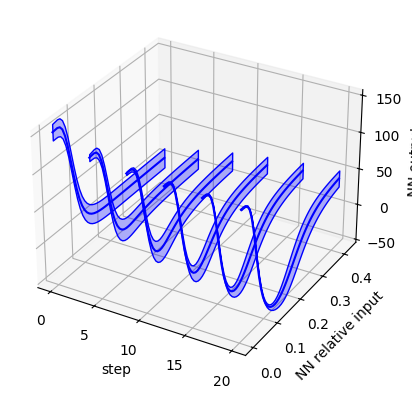

In [16]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

# 创建 3D 图形对象
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# 定义 x 轴数据
x = np.linspace(0, 0.3, grid_size).reshape(-1, 1)
x = np.sqrt(2) * x.squeeze()

# 循环绘制每一行曲线并填充 y_up 和 y_down 之间的区域
for i in [0, 4, 8, 12, 16, 20]:
    y = mean_trajectory3[i, :]
    y_up = mean_trajectory3[i, :] + std_trajectory3[i, :]
    y_down = mean_trajectory3[i, :] - std_trajectory3[i, :]
    z = np.full_like(x, i)
    
    # 绘制平均值、y_up 和 y_down 的曲线
    ax.plot(z, x, y, color='b')
    
    # 填充 y_up 和 y_down 之间的区域
    # 创建封闭的多边形顶点
    verts = []
    for j in range(len(x)):
        verts.append([z[j], x[j], y_down[j]])
    for j in reversed(range(len(x))):
        verts.append([z[j], x[j], y_up[j]])
    
    poly = Poly3DCollection([verts], color='b', alpha=0.3)
    ax.add_collection3d(poly)

# 设置轴标签
ax.set_xlabel('step')
ax.set_ylabel('NN relative input')
ax.set_zlabel('NN output')


# 显示图形
plt.show()


In [1]:
kld_list3 = []
for i in range(1,ensemble_step+1):
    mu1=mean_trajectory3[i]
    sigma1=np.diag(std_trajectory3[i])
    mu2=mean_trajectory3[0]
    sigma2=np.diag(std_trajectory3[0])
    kld_list3.append(kl_divergence(mu1, sigma1, mu2, sigma2))
    
kld_list4 = []
for i in range(1,ensemble_step+1):
    mu1=mean_trajectory4[i]
    sigma1=np.diag(std_trajectory4[i])
    mu2=mean_trajectory4[0]
    sigma2=np.diag(std_trajectory4[0])
    kld_list4.append(kl_divergence(mu1, sigma1, mu2, sigma2))
    
plt.plot(kld_list3,'b',label='good design')
plt.plot(kld_list4,'r',label='bad design')

NameError: name 'ensemble_step' is not defined

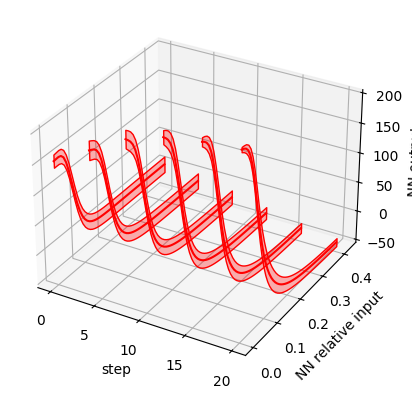

In [177]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

# 创建 3D 图形对象
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# 定义 x 轴数据
x = np.linspace(0, 0.3, grid_size).reshape(-1, 1)
x = np.sqrt(2) * x.squeeze()

# 循环绘制每一行曲线并填充 y_up 和 y_down 之间的区域
for i in [0, 4, 8, 12, 16, 20]:
    y = mean_trajectory4[i, :]
    y_up = mean_trajectory4[i, :] + std_trajectory4[i, :]
    y_down = mean_trajectory4[i, :] - std_trajectory4[i, :]
    z = np.full_like(x, i)
    
    # 绘制平均值、y_up 和 y_down 的曲线
    ax.plot(z, x, y, color='r')
    
    # 填充 y_up 和 y_down 之间的区域
    # 创建封闭的多边形顶点
    verts = []
    for j in range(len(x)):
        verts.append([z[j], x[j], y_down[j]])
    for j in reversed(range(len(x))):
        verts.append([z[j], x[j], y_up[j]])
    
    poly = Poly3DCollection([verts], color='r', alpha=0.3)
    ax.add_collection3d(poly)

# 设置轴标签
ax.set_xlabel('step')
ax.set_ylabel('NN relative input')
ax.set_zlabel('NN output')
ax.set_zlim([-50,200])

# 显示图形
plt.show()


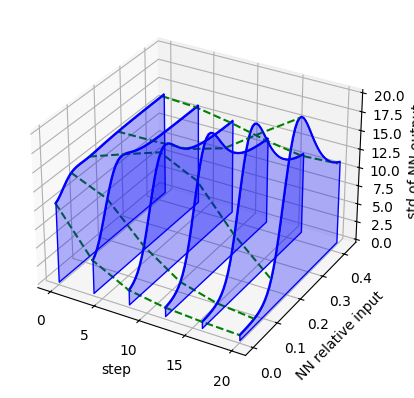

In [40]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

x = np.linspace(0, 0.3, grid_size).reshape(-1, 1)
x = np.sqrt(2) * x.squeeze()

for i in [0, 4, 8, 12, 16, 20]:
    y3 = std_trajectory3[i, :]
    z = np.full_like(x, i)
    
    # 绘制平均值、y_up 和 y_down 的曲线
    ax.plot(z, x, y3, color='b')
    
    # 填充 y_up 和 y_down 之间的区域
    # 创建封闭的多边形顶点
    verts = []
    for j in range(len(x)):
        verts.append([z[j], x[j], 0])
    for j in reversed(range(len(x))):
        verts.append([z[j], x[j], y3[j]])
    
    poly = Poly3DCollection([verts], color='b', alpha=0.3)
    ax.add_collection3d(poly)
    

# 设置轴标签
ax.set_xlabel('step')
ax.set_ylabel('NN relative input')
ax.set_zlabel('std of NN output')
ax.set_zlim([0,20])

for i in [0,7,15,28,49]:
    ax.plot(np.array([0, 4, 8, 12, 16, 20]),np.ones(6)*i/50*np.max(x),std_trajectory3[[0, 4, 8, 12, 16, 20], i],color='green',linestyle='--')

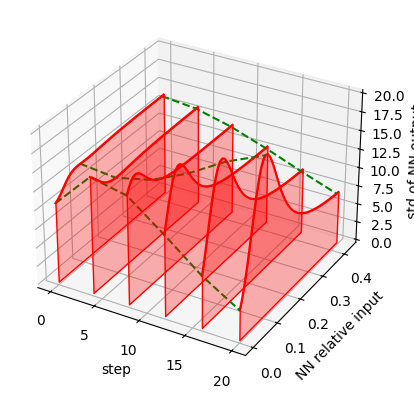

In [46]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

x = np.linspace(0, 0.3, grid_size).reshape(-1, 1)
x = np.sqrt(2) * x.squeeze()

for i in [0, 4, 8, 12, 16, 20]:
    y4 = std_trajectory4[i, :]
    z = np.full_like(x, i)
    
    # 绘制平均值、y_up 和 y_down 的曲线
    ax.plot(z, x, y4, color='r')
    
    # 填充 y_up 和 y_down 之间的区域
    # 创建封闭的多边形顶点
    
    verts = []
    for j in range(len(x)):
        verts.append([z[j], x[j], 0])
    for j in reversed(range(len(x))):
        verts.append([z[j], x[j], y4[j]])
    
    poly = Poly3DCollection([verts], color='r', alpha=0.3)
    ax.add_collection3d(poly)

# 设置轴标签
ax.set_xlabel('step')
ax.set_ylabel('NN relative input')
ax.set_zlabel('std of NN output')
ax.set_zlim([0,20])

for i in [0,11,49]:
    ax.plot(np.array([0, 4, 8, 12, 16, 20]),np.ones(6)*i/50*np.max(x),std_trajectory4[[0, 4, 8, 12, 16, 20], i],color='green',linestyle='--')

In [170]:
z

array([20., 20., 20., 20., 20., 20., 20., 20., 20., 20., 20., 20., 20.,
       20., 20., 20., 20., 20., 20., 20., 20., 20., 20., 20., 20., 20.,
       20., 20., 20., 20., 20., 20., 20., 20., 20., 20., 20., 20., 20.,
       20., 20., 20., 20., 20., 20., 20., 20., 20., 20., 20.])

In [ ]:
#center=jnp.array([0.25,0.25])
#local_size=51
#model = my_forcing.FullyConnectedNN()  # 创建模型实例
#ensemble_size = 100  # 生成的数组数量
#ensemble_step = 20
#params = {'params': {'Dense_0': {'bias': jnp.array([ 0.4220,  0.4046,  0.7948, -0.0262, -0.4859, -0.0748,  0.6397, -0.4742]),
#   'kernel': jnp.array([[-0.1428, -3.1386,  0.1278,  2.6601, -2.4509, -1.7899,  4.9854,  0.9533],
#       [-0.8567,  4.0157, -0.0646,  3.7773, -3.3422, -1.3315, -3.8902, -1.9304]])},
#  'Dense_1': {'bias': jnp.array([ 0.0143,  0.0755, -0.0477, -0.1939]),
#   'kernel': jnp.array([[-0.3512, -0.4044, -0.1012, -0.16  ],
#       [ 0.4947,  0.3578,  0.3282, -0.601 ],
#       [-0.2726,  0.3012, -0.2303,  0.2767],
#       [ 2.0844,  0.9441, -2.1975,  3.0451],
#       [-0.5057, -0.1832, -0.3193, -0.2212],
#       [-0.3738, -0.3433,  0.1701, -0.2727],
#       [ 0.5894, -0.0387,  0.3692, -0.4085],
#       [-0.1819,  0.3108,  0.1631,  0.1382]])},
#  'Dense_2': {'bias': jnp.array([-0.0026]),
#   'kernel': jnp.array([[-0.7601],
#       [-0.2217],
#       [-0.7139],
#       [ 0.2727]])}}
#    }
#def evaluate_nn_accuracy(params,model,center,local_size):
#    grid = cfd.grids.Grid((local_size, local_size), domain=((0, 0.5), (0, 0.5)))
#    offsets = ((0.5,0.5),(0.5,0.5))
#    x = grid.mesh(offsets[1])[0]
#    y = grid.mesh(offsets[0])[1]
#    center_x = center[0]
#    center_y = center[1]
#    exponent_internal = ((x-center_x)**2.0+(y-center_y)**2.0)
#    factor = 2.0 / (2.0 * jnp.pi * 0.05 **2)
#    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 **2.0))
#    array_reciprocal = factor*1.5 / (exponent_internal**2 / (2.0 * 0.05 **2.0)**2+ 1.0)
#    x_reshaped = x.reshape(-1, 1) - center_x
#    y_reshaped = y.reshape(-1, 1) - center_y
#    xy_combined = jnp.concatenate((x_reshaped, y_reshaped), axis=1)
#    array_nn = model.apply(params,xy_combined).reshape(grid.shape)* 70.0
#    return jnp.sum((array_exponent - array_reciprocal - array_nn)**2)

In [40]:
evaluate_nn_accuracy(last_params,model,center,local_size)

Array(6705305.5, dtype=float32)

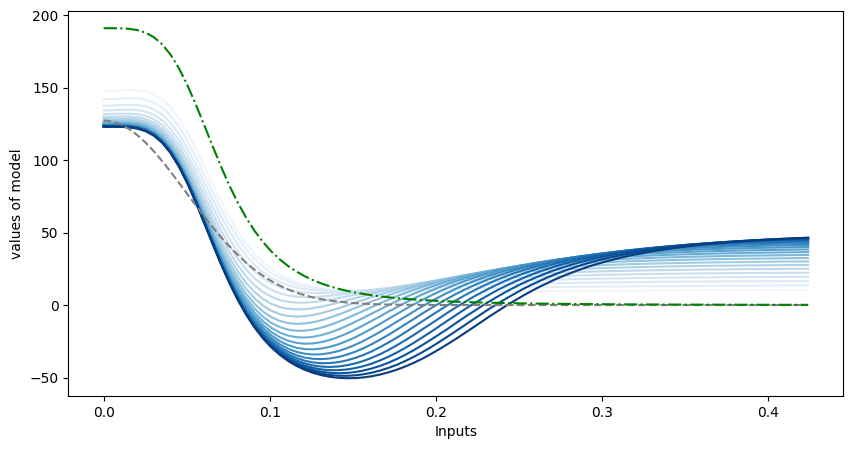

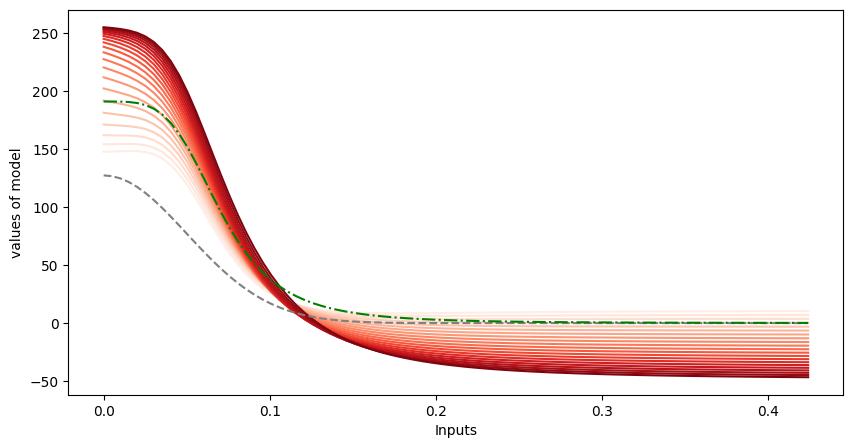

In [39]:
index_to_plot = 15# 0.25，0.25
last_params_list3 = []
for i in range(ensemble_step+1):
    last_params_array = result_matrix_design_3[i, index_to_plot, :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_list3.append(last_params)
    
plt.figure(figsize=(10, 5))
show_nn_trajectory(last_params_list3, model, 'Blues', center_x=0, center_y=0, size=85)

#index_to_plot = 3 # 0.15，0.15
last_params_list4 = []
for i in range(ensemble_step+1):
    last_params_array = result_matrix_design_4[i, index_to_plot, :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_list4.append(last_params)
    
plt.figure(figsize=(10, 5))
show_nn_trajectory(last_params_list4, model, 'Reds', center_x=0, center_y=0, size=85)

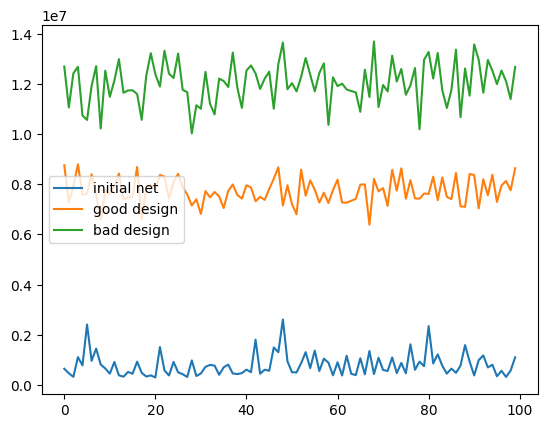

In [50]:
plt.plot(nn_accuracy_ori,label='initial net')
plt.plot(nn_accuracy_list3,label='good design')
plt.plot(nn_accuracy_list4,label='bad design')
plt.legend()

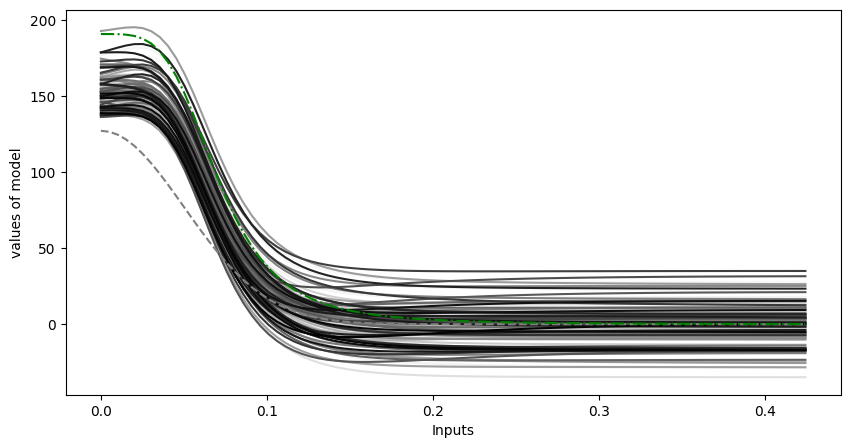

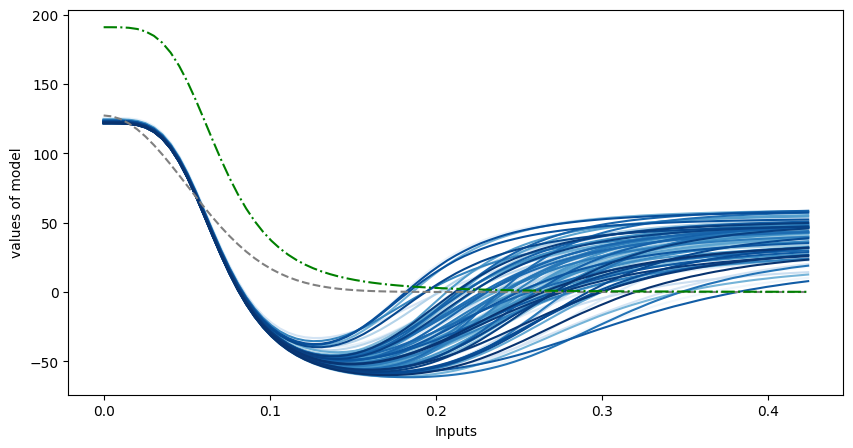

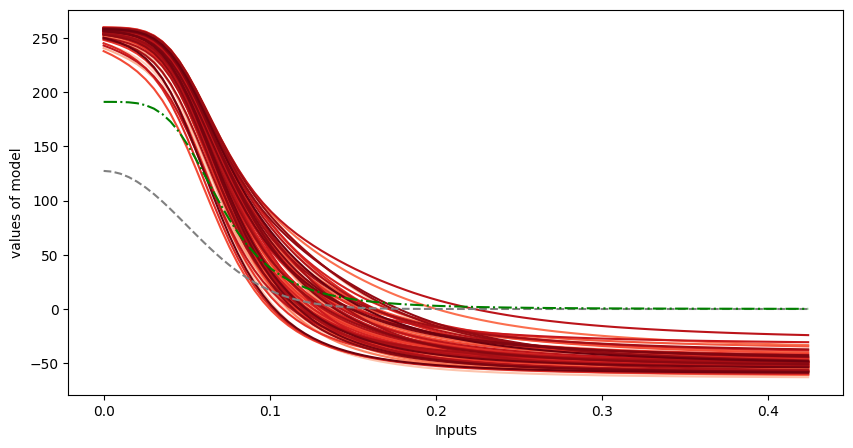

In [47]:
index_to_plot = 20
# step 20 

last_params_ori = []
nn_accuracy_ori = []
for i in range(ensemble_size):
    last_params_array = result_matrix_design_3[0,i,  :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_ori.append(last_params)
    nn_accuracy_ori.append(evaluate_nn_accuracy(last_params,model,center,local_size))

plt.figure(figsize=(10, 5))
show_nn_trajectory(last_params_ori, model, 'Greys', center_x=0, center_y=0, size=85)

# 0.25，0.25
last_params_list3 = []
nn_accuracy_list3 = []
for i in range(ensemble_size):
    last_params_array = result_matrix_design_3[index_to_plot,i,  :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_list3.append(last_params)
    nn_accuracy_list3.append(evaluate_nn_accuracy(last_params,model,center,local_size))
   
plt.figure(figsize=(10, 5)) 
show_nn_trajectory(last_params_list3, model, 'Blues', center_x=0, center_y=0, size=85)

#index_to_plot = 3 # 0.15，0.15
last_params_list4 = []
nn_accuracy_list4 = []
for i in range(ensemble_size):
    last_params_array = result_matrix_design_4[index_to_plot,i,  :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_list4.append(last_params)
    nn_accuracy_list4.append(evaluate_nn_accuracy(last_params,model,center,local_size))
    
plt.figure(figsize=(10, 5))
show_nn_trajectory(last_params_list4, model, 'Reds', center_x=0, center_y=0, size=85)

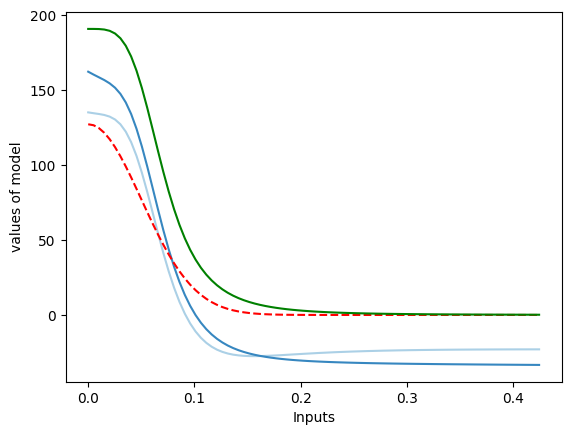

In [36]:
show_nn_trajectory([last_params_list3[2],last_params_list4[2]], model, 'Blues', center_x=0, center_y=0, size=85)

In [27]:
result_matrix_design_3[0,1,1:10], result_matrix_design_4[0,1,1:10]

(array([ 0.5512467 ,  0.84293866,  0.07716192, -0.65073103, -0.10669665,
         0.70932055, -0.42354661, -0.23342991, -2.92251468]),
 array([ 0.83740062,  0.93427128,  0.28552574, -0.97238076, -0.16566986,
         0.83908337, -0.32101524, -0.41796553, -2.44591284]))

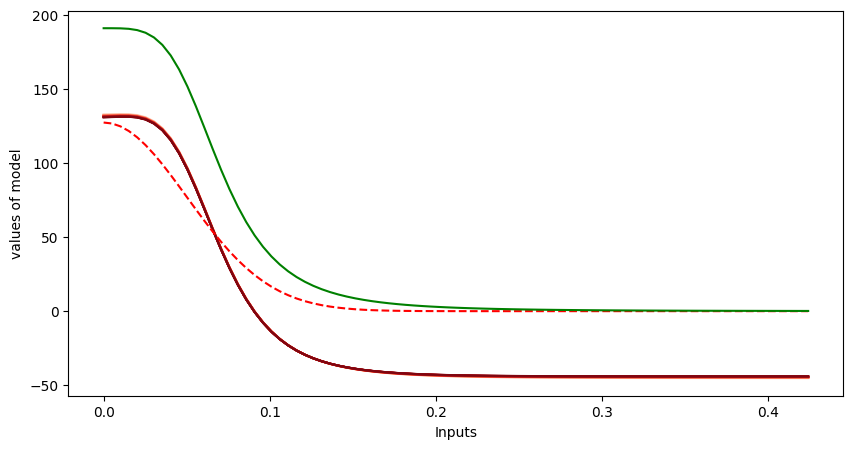

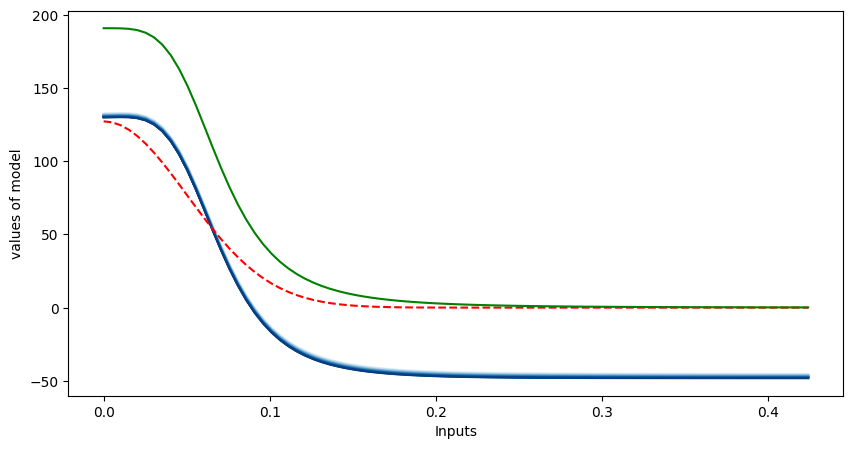

In [ ]:
index_to_plot = 96
last_params_list = []
for i in range(ensemble_step):
    last_params_array = result_matrix_design_1[i, index_to_plot, :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_list.append(last_params)

last_params_list2 = []
for i in range(ensemble_step):
    last_params_array = result_matrix_design_2[i, index_to_plot, :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_list2.append(last_params)

plt.figure(figsize=(10, 5))
show_nn_trajectory(last_params_list, model, 'Reds', center_x=0, center_y=0, size=85)
plt.figure(figsize=(10, 5))
show_nn_trajectory(last_params_list2, model, 'Blues', center_x=0, center_y=0, size=85)

In [85]:
# 看最后一个阶段的其中几个参数的效果

In [ ]:
def show_nn_fixedColor(params_list, apply_model, color, center_x=0, center_y=0, size=85):
    x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    y = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    xy_combined = jnp.concatenate((x, y), axis=1)
    
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    
    
    for index, params in enumerate(params_list):
        #if index not in [6]:
        #    continue
        array_nn = apply_model.apply(params, xy_combined) * 70.0
        
        plt.plot(jnp.sqrt(2) * x.squeeze(), 
                 (array_nn.squeeze() + array_reciprocal.squeeze()), 
                 label=f'NN + Reciprocal - Params {index+1}',
                 color=color)
    
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_exponent.squeeze(), color='r', linestyle = '--', label='Exponent')
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_reciprocal.squeeze(), color='g', label='Reciprocal')
    
    plt.ylabel('values of model')
    plt.xlabel('Inputs')
    #plt.legend()

plt.figure(figsize=(10, 5))
last_params_list = []
for i in [0,20,40,60,80,99]:
#for i in range(ensemble_size):
    last_params_array = result_matrix_design_1[-1, i, :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_list.append(last_params)

show_nn(last_params_list, model, 'b', center_x=0, center_y=0, size=85)

last_params_list = []
for i in [0,20,40,60,80,99]:
#for i in range(ensemble_size):
    last_params_array = result_matrix_design_2[-1, i, :]
    last_params = reconstruct_array_to_dict(last_params_array,params)
    last_params_list.append(last_params)

show_nn(last_params_list, model, 'r', center_x=0, center_y=0, size=85)

In [8]:
checkpoint_file_path = './checkpoints/nn_case_stage2_design1/checkpoint_i_99_j_19.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
#start_i = checkpoint_data['i']
#start_j = checkpoint_data['j']
result_matrix_design_1 = checkpoint_data['result_matrix']
#ensemble_current_params = checkpoint_data['ensemble_current_params']

Checkpoint data loaded successfully.


In [79]:
checkpoint_file_path = './checkpoints/nn_case_stage2_design2/checkpoint_i_99_j_19.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
#start_i = checkpoint_data['i']
#start_j = checkpoint_data['j']
result_matrix_design_2 = checkpoint_data['result_matrix']
#ensemble_current_params = checkpoint_data['ensemble_current_params']

Checkpoint data loaded successfully.


In [7]:
checkpoint_file_path = './checkpoints/nn_case_stage2_design1_new/checkpoint_i_99_j_19.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
#start_i = checkpoint_data['i']
#start_j = checkpoint_data['j']
result_matrix_design_3 = checkpoint_data['result_matrix']
#ensemble_current_params = checkpoint_data['ensemble_current_params']

Checkpoint data loaded successfully.


In [15]:
checkpoint_file_path = './checkpoints/nn_case_stage2_design2_new/checkpoint_i_99_j_19.pkl'

# 检查文件是否存在
if os.path.exists(checkpoint_file_path):
    # 打开文件并加载数据
    with open(checkpoint_file_path, 'rb') as f:
        checkpoint_data = pickle.load(f)
    print("Checkpoint data loaded successfully.")
else:
    print("Checkpoint file not found.")

# 访问和使用保存的数据
#start_i = checkpoint_data['i']
#start_j = checkpoint_data['j']
result_matrix_design_4 = checkpoint_data['result_matrix']
#ensemble_current_params = checkpoint_data['ensemble_current_params']

Checkpoint data loaded successfully.


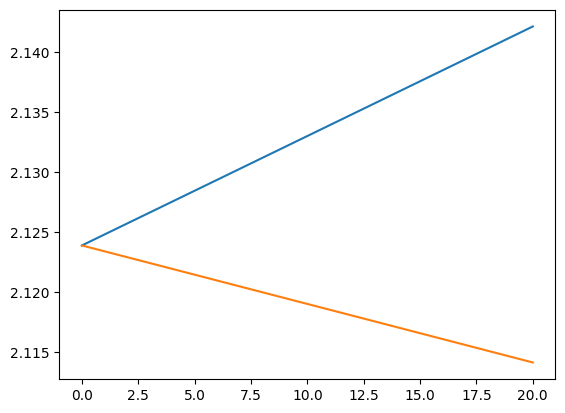

In [48]:
plt.plot(result_matrix_design_1[:,98,11])
plt.plot(result_matrix_design_2[:,98,11])

In [82]:
out,_ = sealed_convection_diffusion_true(jnp.array([0.15,0.15]), center, stage)
print(out)
out,_ = sealed_convection_diffusion_true(jnp.array([0.22,0.22]), center, stage)
print(out)

0.02397354
0.1778333


In [64]:
kl_divergence(ori_mean_matrix, ori_cov_matrix, ori_mean_matrix, ori_cov_matrix)

Array(3.8146973e-06, dtype=float32)

In [180]:
ori_mean_matrix = np.mean(result_matrix_design_3[0], axis=0)
ori_cov_matrix = np.cov(result_matrix_design_3[0], rowvar=False)
kld_trajectory_design3 = np.ones(20)
determinant_trajectory_design3 = np.ones(20)

for i in range(20):
    result_matrix_design_3_step = result_matrix_design_3[i+1]
    mean_matrix = np.mean(result_matrix_design_3_step, axis=0)
    cov_matrix = np.cov(result_matrix_design_3_step-mean_matrix, rowvar=False)
    det_value = np.linalg.det(cov_matrix)
    kld_trajectory_design3[i] = kl_divergence(mean_matrix, cov_matrix, ori_mean_matrix, ori_cov_matrix)
    determinant_trajectory_design3[i] = det_value

kld_trajectory_design3

array([  2.01216507,   8.04851532,  18.10894012,  32.19350433,
        50.30217743,  72.69177246,  98.8888855 , 129.11003113,
       163.35519409, 201.62466431, 243.91818237, 290.23574829,
       340.57745361, 394.9432373 , 453.33300781, 515.74682617,
       582.18493652, 652.64697266, 727.13305664, 805.64355469])

In [181]:
ori_mean_matrix = np.mean(result_matrix_design_4[0], axis=0)
ori_cov_matrix = np.cov(result_matrix_design_4[0], rowvar=False)
kld_trajectory_design4 = np.ones(20)
determinant_trajectory_design4 = np.ones(20)

for i in range(20):
    result_matrix_design_4_step = result_matrix_design_4[i+1]
    mean_matrix = np.mean(result_matrix_design_4_step, axis=0)
    cov_matrix = np.cov(result_matrix_design_4_step-mean_matrix, rowvar=False)
    det_value = np.linalg.det(cov_matrix)
    kld_trajectory_design4[i] = kl_divergence(mean_matrix, cov_matrix, ori_mean_matrix, ori_cov_matrix)
    determinant_trajectory_design4[i] = det_value

kld_trajectory_design4

array([  2.15942383,   8.51337814,  19.07509613,  33.84461975,
        52.82193756,  76.27417755, 103.70913696, 135.35180664,
       171.20220947, 211.26052856, 255.52664185, 304.00045776,
       356.68209839, 413.57144165, 474.66860962, 539.97351074,
       609.48620605, 683.20666504, 761.1348877 , 843.27087402])

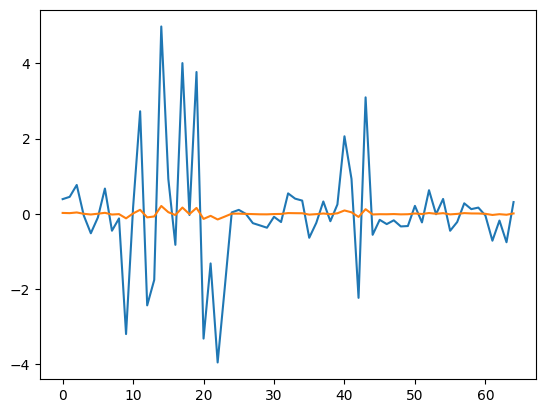

In [68]:
i=1
result_matrix_design_3_step = result_matrix_design_3[i+1,:]
mean_matrix3 = np.mean(result_matrix_design_3_step, axis=0)
cov_matrix3 = np.cov(result_matrix_design_3_step, rowvar=False)
result_matrix_design_4_step = result_matrix_design_4[i+1,:]
mean_matrix4 = np.mean(result_matrix_design_4_step, axis=0)
cov_matrix4 = np.cov(result_matrix_design_4_step, rowvar=False)
result_matrix_design_5_step_check = result_matrix[i+1,:]
mean_matrix5 = np.mean(result_matrix_design_5_step_check, axis=0)
cov_matrix5 = np.cov(result_matrix_design_5_step_check, rowvar=False)

plt.plot(mean_matrix3)
plt.plot(mean_matrix4)
#plt.plot(mean_matrix5)

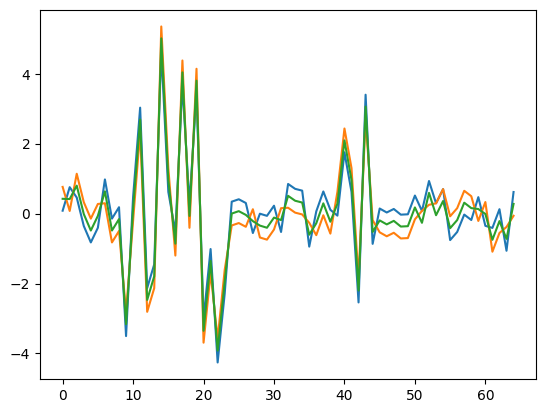

In [97]:
i=19
result_matrix_design_3_step = result_matrix_design_3[i+1,:]
mean_matrix3 = np.mean(result_matrix_design_3_step, axis=0)
cov_matrix3 = np.cov(result_matrix_design_3_step, rowvar=False)
result_matrix_design_4_step = result_matrix_design_4[i+1,:]
mean_matrix4 = np.mean(result_matrix_design_4_step, axis=0)
cov_matrix4 = np.cov(result_matrix_design_4_step, rowvar=False)

plt.plot(mean_matrix3)
plt.plot(mean_matrix4)
plt.plot(ori_mean_matrix)

In [29]:
np.linalg.det(ori_cov_matrix3), np.linalg.det(ori_cov_matrix4)

(4.668720118036436e-144, 4.668720118036436e-144)

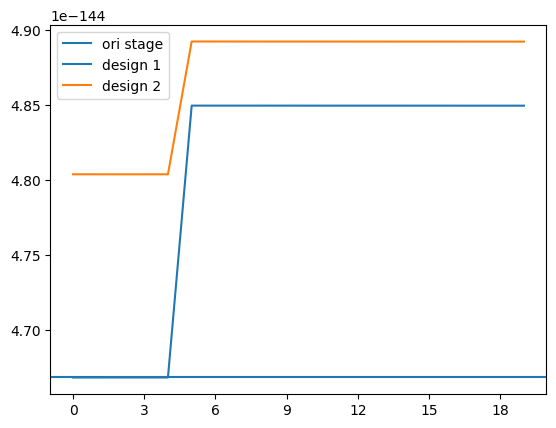

In [182]:
from matplotlib.ticker import MaxNLocator

ori_cov_matrix3 = np.cov(result_matrix_design_3[0], rowvar=False)
det_value3 = np.trace(ori_cov_matrix3)

ori_cov_matrix4 = np.cov(result_matrix_design_4[0], rowvar=False)
det_value4 = np.linalg.det(ori_cov_matrix4)

plt.axhline(det_value4, label='ori stage')
plt.plot(determinant_trajectory_design3,label='design 1')
plt.plot(determinant_trajectory_design4,label='design 2')
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.legend()

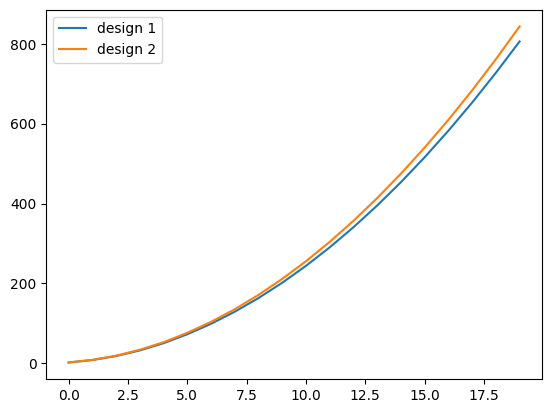

In [94]:
plt.plot(kld_trajectory_design3,label='design 1')
plt.plot(kld_trajectory_design4,label='design 2')
plt.legend()

In [24]:
kl_divergence(ori_mean_matrix, ori_cov_matrix, ori_mean_matrix, ori_cov_matrix)

Array(nan, dtype=float32)

In [129]:
# 每一阶段尝试学习率

In [ ]:
max_evidence_items = loss_param_refine2(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model, observation, 5)

In [16]:
# 新的likelihood和loss。likelihood输出测量值，loss使用测量值和预测值的l2norm
def loss_param_refine3(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model, observation, num_top=5):
    loglikelihood, u_f = calculate_loglikelihood_refine3(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model, observation)
    log_evidence_list = log_normalize_pdf(loglikelihood) + jnp.log(prior+1e-32)
        
    indices = jnp.argpartition(log_evidence_list.ravel(), -num_top)[-num_top:]
    multi_indices = jnp.unravel_index(indices, log_evidence_list.shape)
    
    #selected_loglikelihoods = jnp.sum(loglikelihood[multi_indices])
    #list_local = multi_indices
    
    # 计算平均坐标
    average_x = np.mean(multi_indices[0])
    average_y = np.mean(multi_indices[1])
    
    # 直接使用平均坐标
    selected_u_f = jax.scipy.ndimage.map_coordinates(u_f,[average_x,average_y],1)
    loss = (observation - selected_u_f)**2
    
    list_local = [average_x, average_y]
    
    return loss, list_local


def calculate_loglikelihood_refine3(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model, observation):
    '''
    参数：
    stage: 当前的阶段。用于决定forward模拟的步数
    center: 污染源的中心
    current_params: 网络的参数
    d_start: 测量点
    prior: 先验
    noise_info: 测量误差设置
    num_d: 计算后验时使用的点数
    radio_d: 在测量点附近多选几个点测量，本质上可以理解为多次测量消除误差，可以考虑直接舍弃误差

    说明：
    1，假设数据量是300*300，计算范围是3*3
    应该是需要数据尺寸是3的倍数，否则到时候后验那里也会费劲
    也可以不是3的倍数，只要后验矩阵和数据矩阵匹配就行
    2，运用了等效的原则。主要起作用的是测量点和center的相对位置
    这里突然想到nn应该需要四个参数，当前的坐标和center，而不是仅当前坐标。
    '''
    noise_loc, noise_base_scale, noise_ratio_scale = noise_info[0]
    if num_d == 1.0:
        false_center = jnp.array([1.0,1.0]) - d_start
        false_start = jnp.array([0.5, 0.5])
        _, output_all = sealed_convection_diffusion_nn(current_params, false_start, false_center, stage, model)
        #_, output_all = sealed_convection_diffusion_true(false_start, false_center, stage) #这里的形状是()
        output_all_central_sym = jnp.fliplr(jnp.flipud(output_all))
        # 取出[0,1]^2之间的矩阵
        xb_lo = int((0.0 - lo_b) / (up_b - lo_b) * (size - 1))
        xb_up = int((1.0 - lo_b) / (up_b - lo_b) * (size - 1))
        output_for_xb = output_all_central_sym[xb_lo:(xb_up+1),xb_lo:(xb_up+1)]
        # 针对于每一个数字求likelihood
        #loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=output_for_xb, scale=noise_base_scale+noise_ratio_scale*output_for_xb)
        loglikelihood = jax.scipy.stats.norm.logpdf(output_for_xb, loc=observation, scale=noise_base_scale+noise_ratio_scale*observation)
    return loglikelihood, output_for_xb

def loss_param_refine4(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model, observation, num_top=5):
    loglikelihood = calculate_loglikelihood_refine4(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model, observation)
    log_evidence_list = log_normalize_pdf(loglikelihood) + jnp.log(prior+1e-32)
        
    indices = jnp.argpartition(log_evidence_list.ravel(), -num_top)[-num_top:]
    multi_indices = jnp.unravel_index(indices, log_evidence_list.shape)
    
    #selected_loglikelihoods = jnp.sum(loglikelihood[multi_indices])
    #list_local = multi_indices
    
    # 计算平均坐标
    average_x = np.mean(multi_indices[0])
    average_y = np.mean(multi_indices[1])
    
    # 直接使用平均坐标
    selected_loglikelihoods = jax.scipy.ndimage.map_coordinates(loglikelihood,[average_x,average_y],1)
    
    list_local = [average_x, average_y]
    
    return -selected_loglikelihoods, list_local


def calculate_loglikelihood_refine4(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model, observation):
    '''
    参数：
    stage: 当前的阶段。用于决定forward模拟的步数
    center: 污染源的中心
    current_params: 网络的参数
    d_start: 测量点
    prior: 先验
    noise_info: 测量误差设置
    num_d: 计算后验时使用的点数
    radio_d: 在测量点附近多选几个点测量，本质上可以理解为多次测量消除误差，可以考虑直接舍弃误差

    说明：
    1，假设数据量是300*300，计算范围是3*3
    应该是需要数据尺寸是3的倍数，否则到时候后验那里也会费劲
    也可以不是3的倍数，只要后验矩阵和数据矩阵匹配就行
    2，运用了等效的原则。主要起作用的是测量点和center的相对位置
    这里突然想到nn应该需要四个参数，当前的坐标和center，而不是仅当前坐标。
    '''
    noise_loc, noise_base_scale, noise_ratio_scale = noise_info[0]
    if num_d == 1.0:
        false_center = jnp.array([1.0,1.0]) - d_start
        false_start = jnp.array([0.5, 0.5])
        _, output_all = sealed_convection_diffusion_nn(current_params, false_start, false_center, stage, model)
        #_, output_all = sealed_convection_diffusion_true(false_start, false_center, stage) #这里的形状是()
        output_all_central_sym = jnp.fliplr(jnp.flipud(output_all))
        # 取出[0,1]^2之间的矩阵
        xb_lo = int((0.0 - lo_b) / (up_b - lo_b) * (size - 1))
        xb_up = int((1.0 - lo_b) / (up_b - lo_b) * (size - 1))
        output_for_xb = output_all_central_sym[xb_lo:(xb_up+1),xb_lo:(xb_up+1)]
        # 针对于每一个数字求likelihood
        #loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=output_for_xb, scale=noise_base_scale+noise_ratio_scale*output_for_xb)
        loglikelihood = jax.scipy.stats.norm.logpdf(observation, loc=output_for_xb, scale=noise_base_scale+noise_ratio_scale*output_for_xb)
    return loglikelihood

In [66]:
def simpletest(theta):
    return theta**2*3+0.5

def losstest1(theta,y):
    return (y-simpletest(theta))**2

def losstest2(theta,y):
    y_f = simpletest(theta)
    noise_base_scale = noise_ratio_scale = 0.05
    return jax.scipy.stats.norm.logpdf(y, loc=y_f, scale=noise_base_scale)

def losstest3(theta,y):
    y_f = simpletest(theta)
    noise_base_scale = noise_ratio_scale = 0.05
    return jax.scipy.stats.norm.logpdf(y_f, loc=y, scale=noise_base_scale)

def losstest4(theta,y):
    y_f = simpletest(theta)
    noise_base_scale = noise_ratio_scale = 0.05
    return jax.scipy.stats.norm.logpdf(y, loc=y_f, scale=noise_base_scale+noise_ratio_scale*y_f)

def losstest5(theta,y):
    y_f = simpletest(theta)
    noise_base_scale = noise_ratio_scale = 0.05
    return jax.scipy.stats.norm.logpdf(y_f, loc=y, scale=noise_base_scale+noise_ratio_scale*y)

y=1.5
theta=0.5
simpletest(theta), jax.grad(losstest2)(theta, y),jax.grad(losstest3)(theta, y), jax.grad(losstest4)(theta,y),jax.grad(losstest5)(theta, y)

(1.25,
 Array(299.99997, dtype=float32, weak_type=True),
 Array(299.99997, dtype=float32, weak_type=True),
 Array(64.51029, dtype=float32, weak_type=True),
 Array(48., dtype=float32, weak_type=True))

In [79]:
jax.grad(loss_param_refine4,(0,1), has_aux=True)(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key_for_param[i], model, observation, 5)

(({'params': {'Dense_0': {'bias': Array([-0.3470084 ,  1.0493989 , -0.9212793 , -7.201144  , -0.45133197,
             1.2917852 ,  0.72840214,  0.09556606], dtype=float32),
     'kernel': Array([[ 0.01364133,  0.0407129 ,  0.04378766, -0.0696812 ,  0.0098235 ,
              0.04818497, -0.03370094,  0.00856225],
            [-0.01101378, -0.02379636, -0.01554385,  0.04884367,  0.00794816,
             -0.03088967,  0.02581558, -0.00725696]], dtype=float32)},
    'Dense_1': {'bias': Array([ 1.1679443 , -0.35500413,  2.617176  , -1.1476663 ], dtype=float32),
     'kernel': Array([[ 0.48131293, -0.15018603,  1.1245741 , -0.48580167],
            [ 0.26419926, -0.07734582,  0.4182945 , -0.19597752],
            [ 0.751464  , -0.21865995,  1.6916646 , -0.75342286],
            [-0.0058025 ,  0.03532343, -0.14934847, -0.06459948],
            [-0.42371523,  0.06139632, -0.7930482 ,  0.45337093],
            [ 0.46887648, -0.1461397 ,  1.0850226 , -0.4213596 ],
            [ 0.27781582, -0.0

In [80]:
jax.grad(loss_param_refine2,(0,1), has_aux=True)(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key_for_param[i], model, observation, 5)

(({'params': {'Dense_0': {'bias': Array([-0.21334758,  0.67163146, -0.56113565, -4.4497185 , -0.2796629 ,
             0.8037604 ,  0.44361752,  0.06235975], dtype=float32),
     'kernel': Array([[ 0.00443805,  0.02888226,  0.01806001, -0.10894302,  0.00247779,
              0.03965372, -0.01860983,  0.00629525],
            [-0.00483563, -0.01761594, -0.00143495,  0.08531291,  0.00767171,
             -0.02818151,  0.0129975 , -0.00478034]], dtype=float32)},
    'Dense_1': {'bias': Array([ 0.71567357, -0.21318588,  1.6152633 , -0.70655125], dtype=float32),
     'kernel': Array([[ 0.30307925, -0.0932519 ,  0.71294785, -0.3075317 ],
            [ 0.13165939, -0.03663887,  0.1867771 , -0.08848443],
            [ 0.46385565, -0.131276  ,  1.0517138 , -0.4673071 ],
            [-0.0062728 ,  0.02946392, -0.10163419, -0.03584181],
            [-0.2518163 ,  0.02848851, -0.46795586,  0.27035764],
            [ 0.2818453 , -0.09144462,  0.6579135 , -0.25339946],
            [ 0.21124281, -0.0

In [8]:
# 单独计算某一个阶段的

In [15]:
stage = 1
iteration = 50

d_start = design_list[stage+1]
prior = posterior_list[stage-1]
params = params_list[stage-1]
evidence_list_special = []
NN_error_list_special = []
params_list_special = []
y_f_system_list = []
y_f_model_list = []

try:
    del tx2
    del lr_schedule2
    del opt_state2
except:
    pass 
    

#tx2 = optax.chain(
#    optax.adam(lr_schedule2),  # 使用由 lr_schedule1 调整的学习率的 Adam 优化器
#    optax.add_decayed_weights(1e-4)  # 添加权重衰减，衰减系数为 1e-5
#)

tx2 = optax.adam(0.017)
opt_state2 = tx2.init(params)

_, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)
del prior
prior = posterior

observation, _ = sealed_convection_diffusion_true(d_start, center, stage)
print(f'measurement is: {observation}')

max_evidence_items = loss_param_refine4(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model, observation, 5)
evidence_list_special.append(-max_evidence_items[0])
#guess_center = jnp.array([max_evidence_items[1][0],max_evidence_items[1][1]])/50.0
#y_f_system , _ = sealed_convection_diffusion_true(d_start, guess_center, stage)
#y_f_model , _ = sealed_convection_diffusion_nn(params, d_start, guess_center, stage, model)
#y_f_system_list.append(y_f_system)
#y_f_model_list.append(y_f_model)

for i in range(iteration):
    if stage in [0]:
        print('stage one dont learn error parameters')
        break
    
    max_evidence_items, grad_params = jax.value_and_grad(loss_param_refine4, has_aux=True)(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key_for_param[i], model, observation, 5)
    
    clip_norm = 1e10
    clip_transform = optax.clip_by_global_norm(clip_norm)
    clipped_grads, _ = clip_transform.update(grad_params, state=None)
    
    updates, opt_state2 = tx2.update(clipped_grads, opt_state2, params=params)
    
    # 解决nan的问题
    updates_contain_nans = any(jnp.any(jnp.isnan(u)) for u in jax.tree_util.tree_leaves(updates))
    if updates_contain_nans:
        print('NaN appears in learning. Perturb params and continue')
        noise = jax.tree_util.tree_map(lambda p: 0.001 * jax.random.normal(key_for_param[i], p.shape), params)
        params = jax.tree_util.tree_map(lambda p, n: p + n, params, noise)
    else:
        params = optax.apply_updates(params, updates)
        
    net_accuracy = evaluate_nn_accuracy(params,model,center,local_size)
    #print(f'Loss step {i} max evidence items: {max_evidence_items}, nn error {i}: {net_accuracy}')
    
    if np.isnan((max_evidence_items[0], net_accuracy)).any():
        print('some results are Nan')
        break
        
    evidence_list_special.append(-max_evidence_items[0])
    NN_error_list_special.append(net_accuracy)
    params_list_special.append(params)

    guess_center = jnp.array([max_evidence_items[1][0],max_evidence_items[1][1]])/50.0
    y_f_system , _ = sealed_convection_diffusion_true(d_start, guess_center, stage)
    y_f_model , _ = sealed_convection_diffusion_nn(params, d_start, guess_center, stage, model)
    y_f_system_list.append(y_f_system)
    y_f_model_list.append(y_f_model)

    print('.',end='')

_, posterior = forward_posterior_infoGain(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key[stage], model)

measurement is: 0.5742236971855164
..................................................

In [12]:
observation, _ = sealed_convection_diffusion_true(jnp.array([0.28,0.28]), center, stage)
observation

Array(0.61985743, dtype=float32)

In [45]:
def generate_design_zone(d_start):
    list = [
        d_start+jnp.array([-0.14,0.14]),
        d_start+jnp.array([0.14,0.14]),
        d_start,
        d_start+jnp.array([-0.14,-0.14]),
        d_start+jnp.array([0.14,-0.14]),
    ]
    return list

y_zone = np.zeros((n_stage,5))
for stage in range(n_stage):
    list_design_zone = []
    list_design_zone = generate_design_zone(design_list[stage+1])
    for i in range(5):
        y, _ = sealed_convection_diffusion_true(list_design_zone[i], center, stage)
        y_zone[stage,i] = y

print(y_zone)

[[0.15232217 0.08928861 0.08928861 0.5643748  0.15253448]
 [0.26591155 0.32214299 0.32214299 0.26582813 0.26486003]
 [0.12146293 0.26105937 0.26105937 0.19704434 0.41159177]
 [0.22093815 0.26334399 0.26334399 0.42589033 0.17522553]
 [0.18475279 0.18313526 0.18313526 0.22275673 0.11607367]
 [0.10819146 0.17370547 0.17370547 0.30130187 0.12593308]
 [0.09095939 0.1546292  0.1546292  0.27170363 0.10441869]]


In [43]:
for stage in range(n_stage):
    y, y_field = sealed_convection_diffusion_true(design_list[stage+1], center, stage)
    print(f'maximum of u is {jnp.max(y_field)}, mean of u is {jnp.mean(y_field)}. observation at design {design_list[stage+1]} is {y}')

maximum of u is 0.5851787328720093, mean of u is 0.004039997234940529. observation at design [0.37815458 0.37834254] is 0.27154695987701416
maximum of u is 0.6266726851463318, mean of u is 0.008039994165301323. observation at design [0.3037421  0.30317488] is 0.5742236971855164
maximum of u is 0.5540176033973694, mean of u is 0.012039991095662117. observation at design [0.25893596 0.5031749 ] is 0.2812329828739166
maximum of u is 0.4566551744937897, mean of u is 0.01603998988866806. observation at design [0.45893598 0.4176412 ] is 0.3056698143482208
maximum of u is 0.3885820209980011, mean of u is 0.020039988681674004. observation at design [0.65893596 0.546056  ] is 0.1961487978696823
maximum of u is 0.34325411915779114, mean of u is 0.02403998374938965. observation at design [0.45893598 0.4786566 ] is 0.2094382643699646
maximum of u is 0.3089401423931122, mean of u is 0.028039980679750443. observation at design [0.46268138 0.4785016 ] is 0.18814274668693542


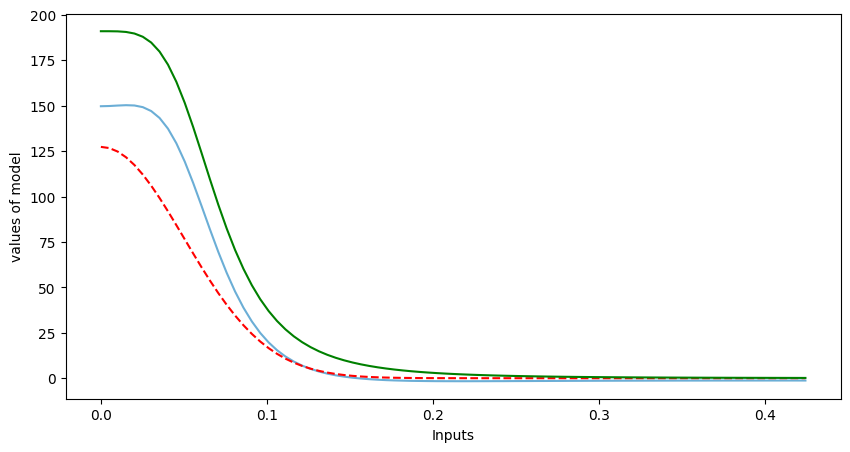

In [34]:
show_nn_trajectory([params_list[1]], model, center_x=0, center_y=0, size=85)
#show_nn_trajectory([params_list[0],params_list[2]], model, center_x=0, center_y=0, size=85)

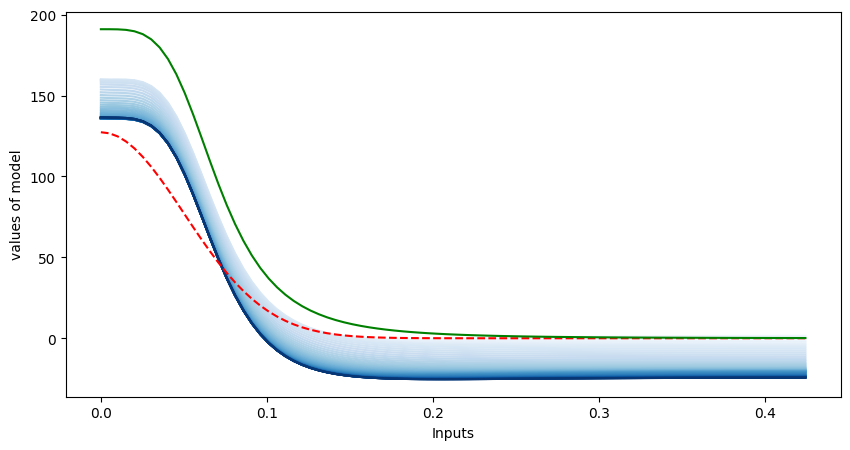

In [22]:
#params = params_list[stage-1]
#show_nn_trajectory([params], model, center_x=0, center_y=0, size=85)
show_nn_trajectory([params_list[0]]+params_list_special, model, center_x=0, center_y=0, size=85)

In [151]:
d_start, np.sqrt(np.sum((d_start-center)**2))

(Array([0.28, 0.28], dtype=float32), 0.042426407)

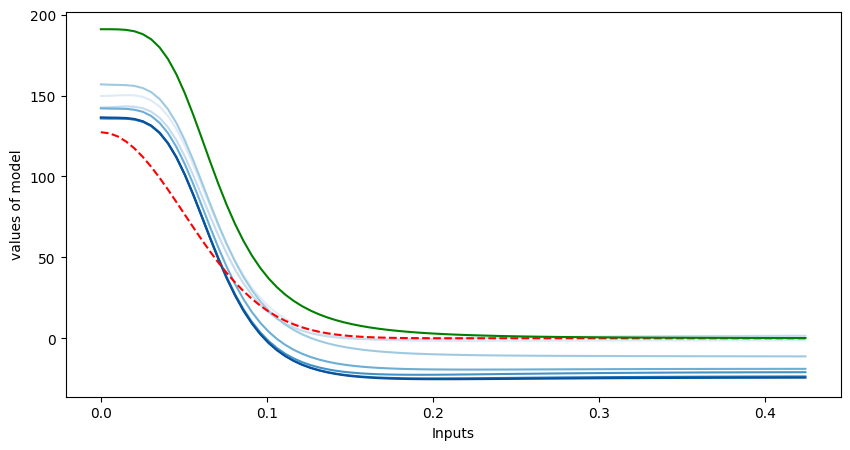

In [31]:
indices = [0,10,20,30,40,49]
show_nn_trajectory([params_list[0]]+[params_list_special[i] for i in indices], model, center_x=0, center_y=0, size=85)

In [30]:
design_list

[Array([0.5, 0.5], dtype=float32),
 Array([0.37994587, 0.38006648], dtype=float32),
 Array([0.30553883, 0.304846  ], dtype=float32),
 Array([0.35726342, 0.23740678], dtype=float32),
 Array([0.34555504, 0.22842912], dtype=float32),
 Array([0.28825533, 0.28910077], dtype=float32),
 Array([0.24958459, 0.32909438], dtype=float32),
 Array([0.31934765, 0.3788859 ], dtype=float32)]

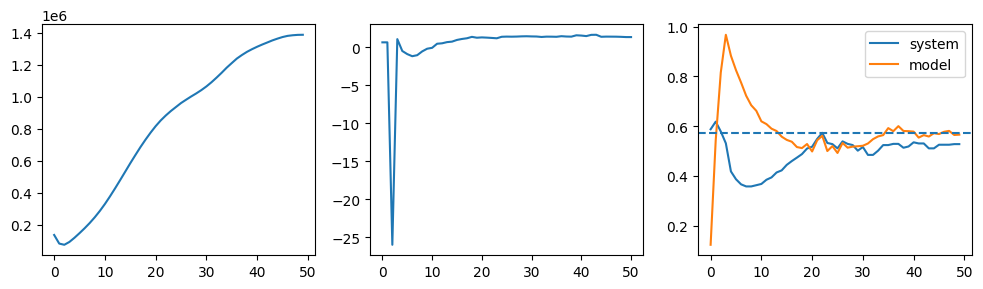

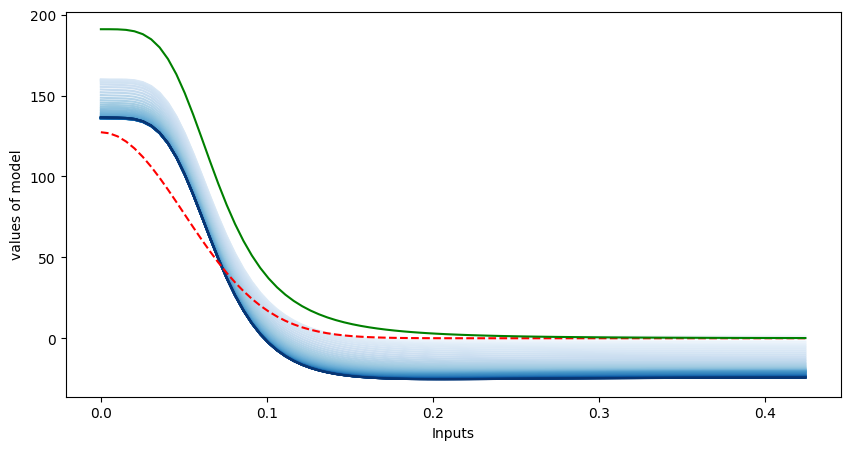

In [24]:
fig, axes = plt.subplots(1,3,figsize=(12,3))
axes[0].plot(NN_error_list_special) # minimize it
axes[1].plot(evidence_list_special) # maximize it
axes[2].plot(y_f_system_list, label='system')
axes[2].plot(y_f_model_list, label='model')
axes[2].axhline(observation, linestyle='--')
axes[2].legend()


#print(evidence_list_special[60], evidence_list_special[100],evidence_list_special[200])
show_nn_trajectory(params_list_special, model, center_x=0, center_y=0, size=85)

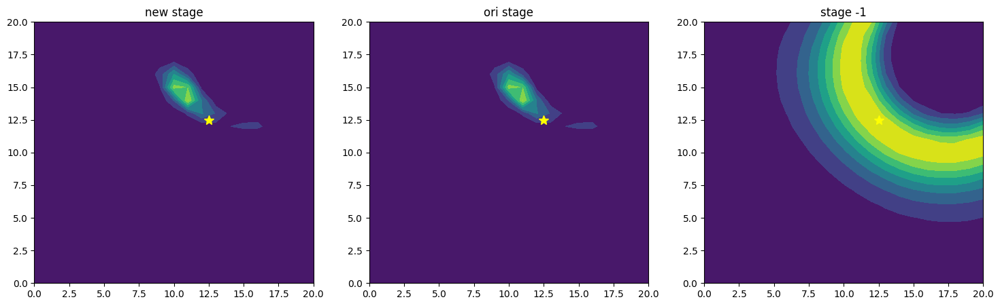

In [29]:
fig, axes = plt.subplots(1,3,figsize=(18,5))
axes[0].contourf(posterior.T)
axes[0].set_xlim([0,20])
axes[0].set_ylim([0,20])
axes[0].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)
axes[0].set_title('new stage')
axes[1].contourf(posterior_list[stage].T)
axes[1].set_xlim([0,20])
axes[1].set_ylim([0,20])
axes[1].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)
axes[1].set_title('ori stage')
axes[2].contourf(posterior_list[stage-1].T)
axes[2].set_xlim([0,20])
axes[2].set_ylim([0,20])
axes[2].set_title('stage -1')
axes[2].plot(center[0]*50,center[1]*50,color='yellow',marker='*',markersize=10)

In [86]:
evidence_list_special[0],evidence_list_special[-1]

(Array(1.7520995, dtype=float32), Array(1.7560923, dtype=float32))

In [87]:
d_start

Array([0.21333322, 0.21473178], dtype=float32)

In [117]:
for _,d_start in enumerate(d_start_enlarged_list):
    print( d_start)

[0.25 0.25]
[0.15 0.25]
[0.25 0.15]
[0.25 0.25]
[0.15 0.15]


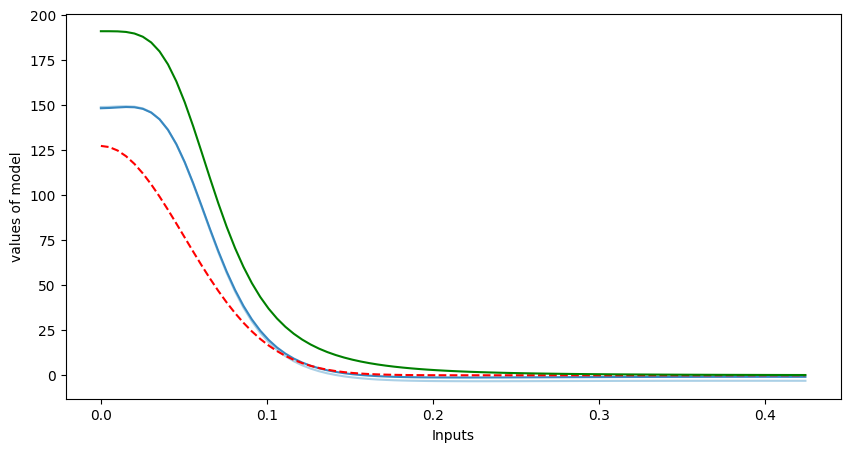

In [127]:
def loss_param_refine3(current_params, design_list_local, stage, center, prior, noise_info, num_d, radio_d, key, model, observation, num_top=5):
    total_selected_loglikelihoods = 0
    for _,d_start in enumerate(design_list_local):
        loglikelihood = calculate_loglikelihood_refine(current_params, d_start, stage, center, prior, noise_info, num_d, radio_d, key, model, observation)
        log_evidence_list = log_normalize_pdf(loglikelihood) + jnp.log(prior+1e-32)
        
        indices = jnp.argpartition(log_evidence_list.ravel(), -num_top)[-num_top:]
        multi_indices = jnp.unravel_index(indices, log_evidence_list.shape)

        average_x = np.mean(multi_indices[0])
        average_y = np.mean(multi_indices[1])
    
        # 直接使用平均坐标
        selected_loglikelihoods = jax.scipy.ndimage.map_coordinates(loglikelihood,[average_x,average_y],1)
    
        list_local = [average_x, average_y]

    total_selected_loglikelihoods = total_selected_loglikelihoods + selected_loglikelihoods
    
    return -total_selected_loglikelihoods/5, list_local

def enlarge_design(d_start):
    list = [
        d_start + jnp.array([0.1,0.1]),
        d_start + jnp.array([0.0,0.1]),
        d_start + jnp.array([0.1,0.0]),
        d_start + jnp.array([0.1,0.1]),
        d_start]
    return list
    
test_list = []
params = params_list[stage-1]

d_start = jnp.array([0.21,0.21])
opt_state2 = tx2.init(params)
value, grad = jax.value_and_grad(loss_param_refine2, has_aux=True)(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key_for_param[i], model, observation, 5)
updates, opt_state2 = tx2.update(grad, opt_state2, params=params)
params_1 = optax.apply_updates(params, updates)
test_list.append(params_1)

d_start_enlarged_list = enlarge_design(d_start)
opt_state2 = tx2.init(params)
value, grad = jax.value_and_grad(loss_param_refine3, has_aux=True)(params, d_start_enlarged_list, stage, center, prior, noise_info, num_d, radio_d, key_for_param[i], model, observation, 5)
updates, opt_state2 = tx2.update(grad, opt_state2, params=params)
params_2 = optax.apply_updates(params, updates)
test_list.append(params_2)

show_nn(test_list, model, center_x=0, center_y=0, size=85)

# 把一个design扩大范围变成五个，用处可能不是特别大

In [125]:
updates

{'params': {'Dense_0': {'bias': Array([ 0.01142514, -0.01568318,  0.00464588,  0.00474365,  0.01220737,
           0.00434684, -0.01109389, -0.00798614], dtype=float32),
   'kernel': Array([[-0.00389359,  0.00555198, -0.00185144, -0.00081542, -0.00158255,
           -0.00047046,  0.00348012,  0.00569891],
          [-0.00193599,  0.00524741, -0.00138541,  0.0004716 , -0.00052958,
           -0.00029249,  0.00292598,  0.00447052]], dtype=float32)},
  'Dense_1': {'bias': Array([-0.01491323, -0.02514681, -0.04696164,  0.00281188], dtype=float32),
   'kernel': Array([[-0.00671516, -0.01665686, -0.0314348 ,  0.00126285],
          [-0.00457538, -0.00525039, -0.00705657,  0.00063755],
          [-0.00978045, -0.01593483, -0.02972111,  0.0018447 ],
          [ 0.00547557,  0.02039971,  0.03634273, -0.00059454],
          [ 0.001205  , -0.01618685, -0.0285239 , -0.00052349],
          [-0.00261708, -0.01710462, -0.03146701,  0.00035054],
          [-0.00316801,  0.00304637,  0.0056144 ,  0.000

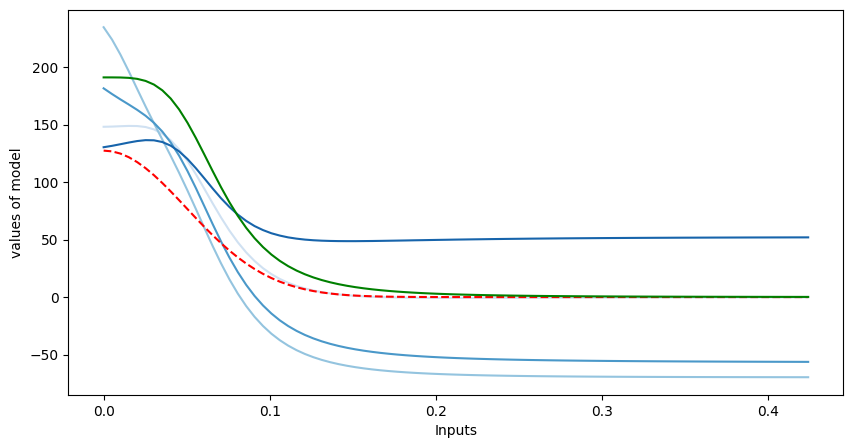

In [109]:
test_list = []
params = params_list[stage-1]
test_list.append(params)

lr_schedule2 = create_decay_schedule(0.001,25, decay_rate2)
tx2 = optax.sgd(lr_schedule2)  # 使用由 lr_schedule1 调整的学习率的 Adam 优化器

d_start = jnp.array([0.05,0.05])
opt_state2 = tx2.init(params)
value, grad = jax.value_and_grad(loss_param_refine2, has_aux=True)(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key_for_param[i], model, observation, 5)
updates, opt_state2 = tx2.update(grad, opt_state2, params=params)
params_2 = optax.apply_updates(params, updates)
test_list.append(params_2)

d_start = design_list[stage+1]
d_start = jnp.array([0.15,0.15])
opt_state2 = tx2.init(params)
value, grad = jax.value_and_grad(loss_param_refine2, has_aux=True)(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key_for_param[i], model, observation, 5)
updates, opt_state2 = tx2.update(grad, opt_state2, params=params)
params_1 = optax.apply_updates(params, updates)
test_list.append(params_1)

d_start = jnp.array([0.25,0.25])
opt_state2 = tx2.init(params)
value, grad = jax.value_and_grad(loss_param_refine2, has_aux=True)(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key_for_param[i], model, observation, 5)
updates, opt_state2 = tx2.update(grad, opt_state2, params=params)
params_2 = optax.apply_updates(params, updates)
test_list.append(params_2)
#
#d_start = jnp.array([0.35,0.35])
#opt_state2 = tx2.init(params)
#value, grad = jax.value_and_grad(loss_param_refine2, has_aux=True)(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key_for_param[i], model, observation, 5)
#updates, opt_state2 = tx2.update(grad, opt_state2, params=params)
#params_2 = optax.apply_updates(params, updates)
#test_list.append(params_2)
#
#d_start = jnp.array([0.45,0.45])
#opt_state2 = tx2.init(params)
#value, grad = jax.value_and_grad(loss_param_refine2, has_aux=True)(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key_for_param[i], model, observation, 5)
#updates, opt_state2 = tx2.update(grad, opt_state2, params=params)
#params_2 = optax.apply_updates(params, updates)
#test_list.append(params_2)


show_nn(test_list, model, center_x=0, center_y=0, size=85)

1.6574466 1.6579837 1.6589887


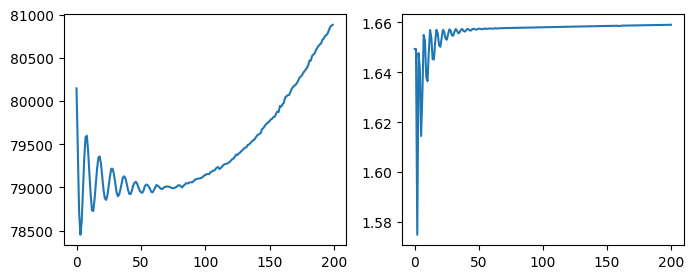

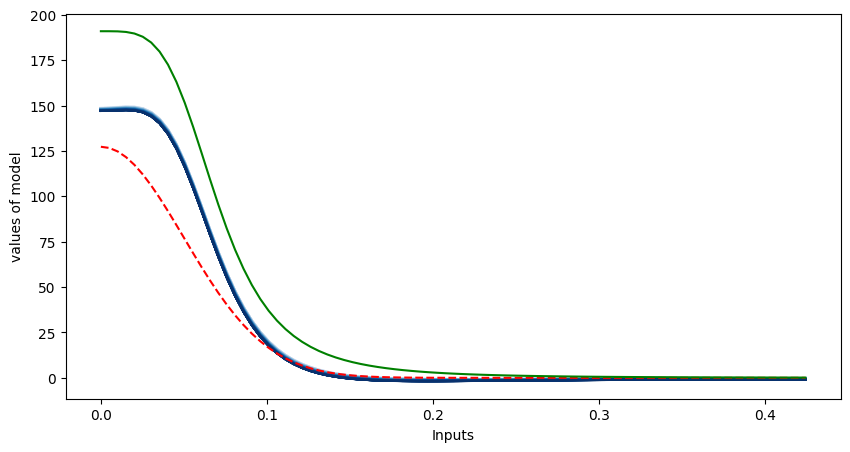

In [61]:
x = jnp.linspace(0, 0.3, 2).reshape(-1, 1)
y = jnp.linspace(0, 0.3, 2).reshape(-1, 1)
xy_combined = jnp.concatenate((x, y), axis=1)
exponent_internal = ((x - 0.0) ** 2 + (y - 0.0) ** 2)
exponent_internal

Array([[0.  ],
       [0.18]], dtype=float32)

Array(0.05087534, dtype=float32)

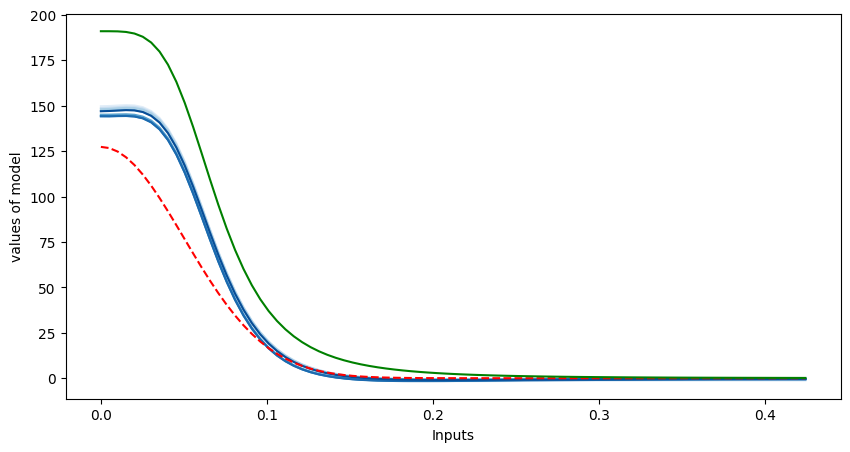

In [70]:
new_list = params_list+[ params]

def show_nn(params_list, apply_model, center_x=0, center_y=0, size=85):
    x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    y = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    xy_combined = jnp.concatenate((x, y), axis=1)
    
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    
    plt.figure(figsize=(10, 5))
    
    cmap = plt.colormaps['Blues'].resampled(len(params_list)+2)#cm.get_cmap('Blues', len(params_list))
    for index, params in enumerate(params_list):
        #if index not in [6]:
        #    continue
        array_nn = apply_model.apply(params, xy_combined) * 70.0
        
        plt.plot(jnp.sqrt(2) * x.squeeze(), 
                 (array_nn.squeeze() + array_reciprocal.squeeze()), 
                 label=f'NN + Reciprocal - Params {index+1}',
                 color=cmap(index+1))
    
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_exponent.squeeze(), color='r', linestyle = '--', label='Exponent')
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_reciprocal.squeeze(), color='g', label='Reciprocal')
    
    plt.ylabel('values of model')
    plt.xlabel('Inputs')
    #plt.legend()
    
show_nn(new_list, model, center_x=0, center_y=0, size=85)

#plt.xlim([0.1,0.2])
#plt.ylim([0,25])

jnp.sqrt(jnp.sum((d_start - center)**2))

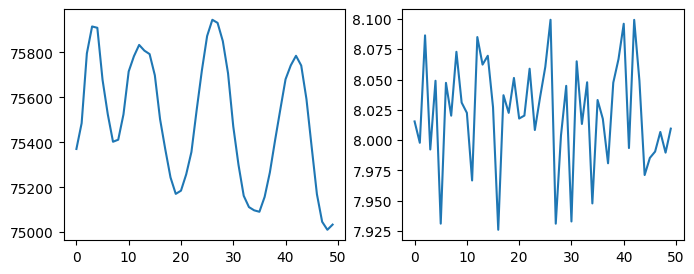

In [7]:
fig, axes = plt.subplots(1,2,figsize=(8,3))
axes[0].plot(NN_error_list) # minimize it
axes[1].plot(evidence_list) # maximize it
#axes[1].set_xlim([0,249])
#axes[1].set_ylim([-50,10])

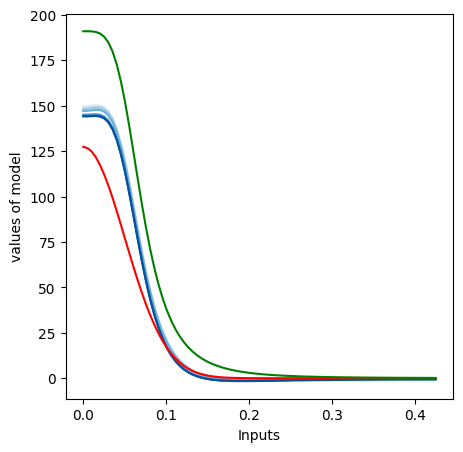

In [58]:
def show_nn(params_list, apply_model, center_x=0, center_y=0, size=85):
    x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    y = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    xy_combined = jnp.concatenate((x, y), axis=1)
    
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    
    plt.figure(figsize=(5, 5))
    
    cmap = plt.colormaps['Blues'].resampled(len(params_list)+2)#cm.get_cmap('Blues', len(params_list))
    for index, params in enumerate(params_list):
        #if index not in [6]:
        #    continue
        array_nn = apply_model.apply(params, xy_combined) * 70.0
        
        plt.plot(jnp.sqrt(2) * x.squeeze(), 
                 (array_nn.squeeze() + array_reciprocal.squeeze()), 
                 label=f'NN + Reciprocal - Params {index+1}',
                 color=cmap(index+1))
    
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_exponent.squeeze(), color='r', label='Exponent')
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_reciprocal.squeeze(), color='g', label='Reciprocal')
    
    plt.ylabel('values of model')
    plt.xlabel('Inputs')
    #plt.legend()
    plt.show()
    
show_nn(params_list, model, center_x=0, center_y=0, size=85)

In [56]:
import pickle

numpy_list = [np.array(arr) for arr in posterior_list]
data_to_save = {
    "posterior_list": numpy_list,
    "design_list": design_list,
    "params_list": params_list
}

with open('all_data_nn_case_seed_0.pkl', 'wb') as f:
    pickle.dump(data_to_save, f)

In [57]:
with open('all_data_nn_case_seed_0.pkl', 'rb') as f:
    loaded_data = pickle.load(f)

# 通过键名访问每个数组
posterior_list = loaded_data["posterior_list"]
design_list = loaded_data["design_list"]
params_list = loaded_data["params_list"]

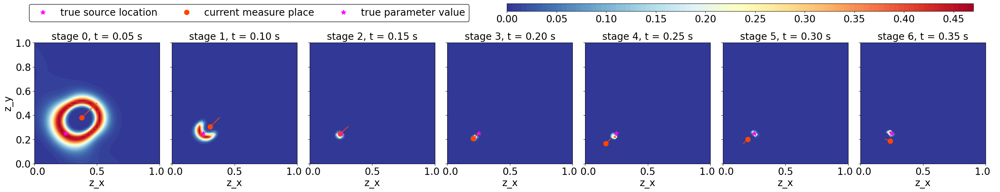

In [11]:
import numpy as np
import jax.numpy as jnp

# 定义文件路径
file_path = "fine_posterior_multiple_points.npy"

# 读取保存的数组
adjoint_posterior_array_np = np.load(file_path)

n_stage =7
local_size = 51
center = jnp.array([0.25,0.25])

design_list = [
    np.array([0.5,0.5]),
    np.array([0.37994587,0.38006648]),
    np.array([0.30553883,0.304846  ]),
    np.array([0.2454778 ,0.24787362]),
    np.array([0.20483132,0.20666647]),
    np.array([0.16558091,0.16552983]),
    np.array([0.19887419,0.20222165]),
    np.array([0.23777924, 0.18582354])
]

import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

fig, axes = plt.subplots(1, n_stage, figsize=(5*n_stage, 4.5))
grid_x_plot0, grid_y_plot0 = np.meshgrid(np.linspace(0, 1, local_size), np.linspace(0, 1, local_size))

def custom_formatter(x, pos):
    if x == 0.0:
        return '  0.0'  # 向右移动
    elif x == 1.0:
        return '1.0  '  # 向左移动
    else:
        return f'{x:.1f}'
        
fontsize = 20

for stage in range(n_stage):
    d_start = design_list[stage+1]
    d_start_backup = design_list[stage]
    contour=axes[stage].contourf(grid_x_plot0, grid_y_plot0, adjoint_posterior_array_np[stage,:,:], levels=100,cmap='RdYlBu_r' )
    axes[stage].scatter(d_start[0], d_start[1], marker='o', s=100, c='orangered')
    axes[stage].scatter(center[0], center[1], marker='*', s=100, c='magenta')
    axes[stage].plot([d_start[0],d_start_backup[0]],
                    [d_start[1],d_start_backup[1]], c='orangered')
    axes[stage].set_title(f'stage {stage}, t = {((stage+1)*0.05):.2f} s', fontsize=fontsize)  # 设置子图的标题
    axes[stage].set_xlabel('z_x', fontsize=fontsize)  # 设置x轴标签
    if stage == 0:
        axes[stage].set_ylabel('z_y', fontsize=fontsize)  # 设置y轴标签
    else:
        axes[stage].set_yticklabels([]) 
        
    axes[stage].tick_params(axis='both', which='major', labelsize=fontsize)
    axes[stage].set_xticks([0, 0.5, 1])
    axes[stage].xaxis.set_major_formatter(FuncFormatter(custom_formatter))

        
plt.subplots_adjust(wspace=0.1)
cbar_ax = fig.add_axes([0.51, 1.08, 0.38, 0.05])  # [left, bottom, width, height]
cbar = fig.colorbar(contour, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=fontsize)

plt.plot([], [], marker='*', markersize=10, color='magenta', linestyle='None', label='true source location')
plt.plot([], [], marker='o', markersize=10, color='orangered', linestyle='None', label='current measure place')
plt.plot([], [], marker='*', markersize=10, color='magenta', linestyle='None', label='true parameter value')
plt.legend(
    loc='center',
    bbox_to_anchor=(0.3, 1.07),  # 仅调整纵坐标位置，使其离上面远一点，离下面近一点
    ncol=3,
    frameon=True,
    framealpha=1,
    edgecolor='black',
    fontsize=fontsize,
    bbox_transform=fig.transFigure  # 将定位转换为相对于整个图形
)
plt.savefig('adjoint method oed.png',bbox_inches='tight')

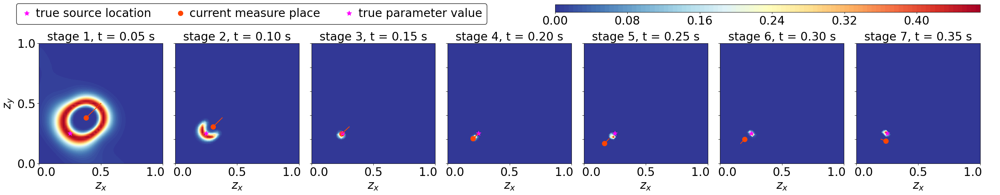

In [1]:
import numpy as np
import jax.numpy as jnp

# 定义文件路径
file_path = "fine_posterior_multiple_points.npy"

# 读取保存的数组
adjoint_posterior_array_np = np.load(file_path)

design_list = [
    np.array([0.5,0.5]),
    np.array([0.37994587,0.38006648]),
    np.array([0.30553883,0.304846  ]),
    np.array([0.2454778 ,0.24787362]),
    np.array([0.20483132,0.20666647]),
    np.array([0.16558091,0.16552983]),
    np.array([0.19887419,0.20222165]),
    np.array([0.23777924, 0.18582354])
]

n_stage =7
local_size = 51
center = jnp.array([0.25,0.25])

import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter, MaxNLocator

fig, axes = plt.subplots(1, n_stage, figsize=(5*n_stage, 4.5))
grid_x_plot0, grid_y_plot0 = np.meshgrid(np.linspace(0, 1, local_size), np.linspace(0, 1, local_size))

def custom_formatter(x, pos):
    if x == 0.0:
        return '    0.0'  # 向右移动
    elif x == 1.0:
        return '1.0    '  # 向左移动
    else:
        return f'{x:.1f}'
        
fontsize = 24

for stage in range(n_stage):
    d_start = design_list[stage+1]
    d_start_backup = design_list[stage]
    contour=axes[stage].contourf(grid_x_plot0, grid_y_plot0, adjoint_posterior_array_np[stage,:,:], levels=100,cmap='RdYlBu_r' )
    axes[stage].scatter(d_start[0], d_start[1], marker='o', s=100, c='orangered')
    axes[stage].scatter(center[0], center[1], marker='*', s=100, c='magenta')
    axes[stage].plot([d_start[0],d_start_backup[0]],
                    [d_start[1],d_start_backup[1]], c='orangered')
    axes[stage].set_title(f'stage {stage+1}, t = {((stage+1)*0.05):.2f} s', fontsize=fontsize)  # 设置子图的标题
    axes[stage].set_xlabel('$z_x$', fontsize=fontsize)  # 设置x轴标签
    if stage == 0:
        axes[stage].set_ylabel('$z_y$', fontsize=fontsize)  # 设置y轴标签
        axes[stage].set_yticks([0, 0.5, 1])
    else:
        axes[stage].set_yticklabels([]) 
        
    axes[stage].tick_params(axis='both', which='major', labelsize=fontsize)
    axes[stage].set_xticks([0, 0.5, 1])
    axes[stage].xaxis.set_major_formatter(FuncFormatter(custom_formatter))

        
plt.subplots_adjust(wspace=0.1)
cbar_ax = fig.add_axes([0.55, 1.08, 0.35, 0.05])  # [left, bottom, width, height]
cbar = fig.colorbar(contour, cax=cbar_ax, orientation='horizontal')
cbar.locator = MaxNLocator(nbins=7)
cbar.ax.tick_params(labelsize=fontsize)

plt.plot([], [], marker='*', markersize=10, color='magenta', linestyle='None', label='true source location')
plt.plot([], [], marker='o', markersize=10, color='orangered', linestyle='None', label='current measure place')
plt.plot([], [], marker='*', markersize=10, color='magenta', linestyle='None', label='true parameter value')
plt.legend(
    loc='center',
    bbox_to_anchor=(0.3, 1.07),  # 仅调整纵坐标位置，使其离上面远一点，离下面近一点
    ncol=3,
    frameon=True,
    framealpha=1,
    edgecolor='black',
    fontsize=fontsize,
    bbox_transform=fig.transFigure,  # 将定位转换为相对于整个图形
    handlelength=1,  # 调整图例中标记的大小
    handletextpad=0.3,  # 调整图例中标记和文字的距离
    labelspacing=1.0  # 调整图例中不同条之间的距离
)
plt.savefig('PDF_net_error_correction_update_params.png',bbox_inches='tight')

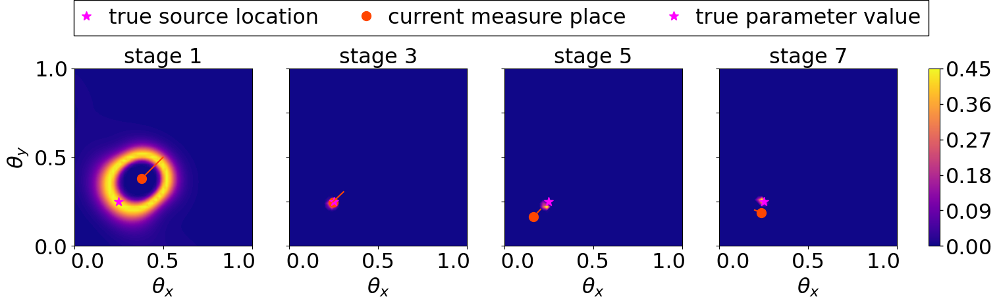

In [152]:
import numpy as np
import jax.numpy as jnp

# 定义文件路径
file_path = "fine_posterior_multiple_points.npy"

# 读取保存的数组
adjoint_posterior_array_np = np.load(file_path)

design_list = [
    np.array([0.5,0.5]),
    np.array([0.37994587,0.38006648]),
    np.array([0.30553883,0.304846  ]),
    np.array([0.2454778 ,0.24787362]),
    np.array([0.20483132,0.20666647]),
    np.array([0.16558091,0.16552983]),
    np.array([0.19887419,0.20222165]),
    np.array([0.23777924, 0.18582354])
]

n_stage =7
local_size = 51
center = jnp.array([0.25,0.25])

import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter, MaxNLocator

#fig, axes = plt.subplots(1, 4, figsize=(5*4, 4.25))
fig, axes = plt.subplots(1, 4, figsize=(4.03*4, 3.5))
fig.subplots_adjust(wspace=0.21)

# fig.subplots_adjust(left = 0.05, right = 0.9, wspace=0.3)

grid_x_plot0, grid_y_plot0 = np.meshgrid(np.linspace(0, 1, local_size), np.linspace(0, 1, local_size))

def custom_formatter(x, pos):
    if x == 0.0:
        return '    0.0'  # 向右移动
    elif x == 1.0:
        return '1.0    '  # 向左移动
    else:
        return f'{x:.1f}'
        
fontsize = 23

for stage in [0,2,4,6]:
    d_start = design_list[stage+1]
    d_start_backup = design_list[stage]
    pic_num = int(stage/2)
    contour=axes[pic_num].contourf(grid_x_plot0, grid_y_plot0, adjoint_posterior_array_np[stage,:,:], levels=100,cmap='plasma' )
    axes[pic_num].scatter(d_start[0], d_start[1], marker='o', s=100, c='orangered')
    axes[pic_num].scatter(center[0], center[1], marker='*', s=100, c='magenta')
    axes[pic_num].plot([d_start[0],d_start_backup[0]],
                    [d_start[1],d_start_backup[1]], c='orangered')
    axes[pic_num].set_title(f'stage {stage+1}', fontsize=fontsize)  # 设置子图的标题
    axes[pic_num].set_xlabel('$\\theta_x$', fontsize=fontsize)  # 设置x轴标签
    if stage == 0:
        axes[pic_num].set_ylabel('$\\theta_y$', fontsize=fontsize)  # 设置y轴标签
        axes[pic_num].set_yticks([0, 0.5, 1])
    else:
        axes[pic_num].set_yticklabels([]) 
        
    axes[pic_num].tick_params(axis='both', which='major', labelsize=fontsize)
    axes[pic_num].set_xticks([0, 0.5, 1])
    axes[pic_num].xaxis.set_major_formatter(FuncFormatter(custom_formatter))

        
#cbar_ax = fig.add_axes([0.92, 0.11, 0.2, 0.77])  # [left, bottom, width, height] 将colorbar放在右侧
#cbar = fig.colorbar(contour, cax=cbar_ax, orientation='vertical')

#contour.set_clim(0, 0.45)
#ticks = [0, 0.09, 0.18, 0.27, 0.36, 0.45]
#cbar = fig.colorbar(contour, ax=cbar_ax, orientation='vertical', shrink=1, pad=0.03, aspect=15)      
#cbar.ax.tick_params(labelsize=fontsize, width=1)
#cbar.set_ticks(ticks)
#cbar.update_ticks()

#plt.subplots_adjust(left=0.05, right=0.75,bottom = 0.05, top = 0.8, wspace=0.2)  # Adjust subplot parameters

cbar_ax = fig.add_axes([0.93, 0.11, 0.01, 0.77])  # [left, bottom, width, height]
contour_set = plt.cm.ScalarMappable(cmap='plasma')
contour_set.set_array(adjoint_posterior_array_np[0, :, :])
contour_set.set_clim(0, 0.45)
ticks = [0, 0.09, 0.18, 0.27, 0.36, 0.45]
cbar = fig.colorbar(contour_set, cax=cbar_ax, orientation='vertical', shrink=0.4, aspect=20, pad=0.06)
cbar.ax.tick_params(labelsize=fontsize, width=1)
cbar.set_ticks(ticks)
cbar.update_ticks()

plt.plot([], [], marker='*', markersize=10, color='magenta', linestyle='None', label='true source location')
plt.plot([], [], marker='o', markersize=10, color='orangered', linestyle='None', label='current measure place')
plt.plot([], [], marker='*', markersize=10, color='magenta', linestyle='None', label='true parameter value')
legend = plt.legend(
    loc='center',
    bbox_to_anchor=(0.527, 1.1),  # 仅调整纵坐标位置，使其离上面远一点，离下面近一点
    ncol=3,
    frameon=True,
    framealpha=1,
    edgecolor='black',
    fontsize=fontsize,
    borderpad=0.05, handlelength=0.5,
    bbox_transform=fig.transFigure  # 将定位转换为相对于整个图形
)
legend.get_frame().set_edgecolor('black')  # 设置边框颜色为黑色
legend.get_frame().set_linewidth(1)  # 设置边框线宽为1
legend.get_frame().set_boxstyle("Square")
plt.savefig('less fig PDF_net_error_correction_update_params.png',bbox_inches='tight')

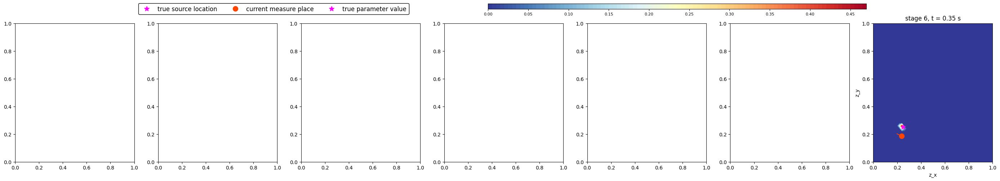

In [26]:

fig, axes = plt.subplots(1, n_stage, figsize=(5*n_stage, 5))

contour=axes[stage].contourf(grid_x_plot0, grid_y_plot0, posterior, levels=100,cmap='RdYlBu_r' )
axes[stage].scatter(d_start[0], d_start[1], marker='o', s=100, c='orangered')
axes[stage].scatter(center[0], center[1], marker='*', s=100, c='magenta')
axes[stage].plot([d_start[0],d_start_backup[0]],[d_start[1],d_start_backup[1]], c='orangered')
axes[stage].set_title(f'stage {stage}, t = {((stage+1)*0.05):.2f} s')  # 设置子图的标题
axes[stage].set_xlabel('z_x')  # 设置x轴标签
axes[stage].set_ylabel('z_y')  # 设置y轴标签

cbar_ax = fig.add_axes([0.5, 0.96, 0.3, 0.03])  # [left, bottom, width, height]
cbar = fig.colorbar(contour, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=8)

plt.plot([], [], marker='*', markersize=10, color='magenta', linestyle='None', label='true source location')
plt.plot([], [], marker='o', markersize=10, color='orangered', linestyle='None', label='current measure place')
plt.plot([], [], marker='*', markersize=10, color='magenta', linestyle='None', label='true parameter value')
plt.legend(
    loc='center',
    bbox_to_anchor=(0.33, 0.96),  # 仅调整纵坐标位置，使其离上面远一点，离下面近一点
    ncol=3,
    frameon=True,
    framealpha=1,
    edgecolor='black',
    fontsize=12,
    bbox_transform=fig.transFigure  # 将定位转换为相对于整个图形
)

plt.savefig('legend and colorvar.png',dpi=600)

In [ ]:

# 创建一个空的图形
fig, ax = plt.subplots(figsize=(8, 2))

# 隐藏轴
ax.axis('off')

# 创建一个虚拟的颜色映射
cmap = plt.cm.RdYlBu_r
norm = plt.Normalize(vmin=0, vmax=1)

# 创建 colorbar
cbar_ax = fig.add_axes([0.1, 0.3, 0.8, 0.4])  # [left, bottom, width, height]
cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=8)

# 创建图例
plt.plot([], [], marker='*', markersize=10, color='magenta', linestyle='None', label='true source location')
plt.plot([], [], marker='o', markersize=10, color='orangered', linestyle='None', label='current measure place')
plt.plot([], [], marker='*', markersize=10, color='magenta', linestyle='None', label='true parameter value')
plt.legend(
    loc='center',
    bbox_to_anchor=(0.5, -0.2),  # 调整图例的位置
    ncol=3,
    frameon=True,
    framealpha=1,
    edgecolor='black',
    fontsize=12,
    bbox_transform=fig.transFigure  # 将定位转换为相对于整个图形
)

plt.subplots_adjust(bottom=0.4)  # 调整底部边距以适应 colorbar 和图例

plt.show()


In [30]:
params = {'params': {'Dense_0': {'bias': jnp.array([ 0.4300788 ,  0.43476984,  0.73729634, -0.15943207, -0.5080746 ,
          -0.05841011,  0.67025846, -0.46634054]),
   'kernel': jnp.array([[-0.16987096, -3.2191284 ,  0.15813491,  2.6743348 , -2.5577304 ,
           -1.8761647 ,  5.1220574 ,  0.9781804 ],
          [-0.89982396,  4.1152735 , -0.03820037,  3.830094  , -3.4596446 ,
           -1.3934933 , -3.997295  , -2.0078812 ]])},
  'Dense_1': {'bias': jnp.array([ 2.3144141e-02,  9.5029928e-02, -2.3712398e-04, -2.8833246e-01]),
   'kernel': jnp.array([[-0.3368724 , -0.39410928, -0.05762546, -0.26360422],
          [ 0.4766262 ,  0.36110097,  0.34479588, -0.68801093],
          [-0.26932144,  0.32643902, -0.18809709,  0.1931928 ],
          [ 2.1923842 ,  0.9859301 , -2.2587633 ,  3.056661  ],
          [-0.6133207 , -0.22258307, -0.36952677, -0.11752556],
          [-0.46756968, -0.36957738,  0.16677073, -0.2016645 ],
          [ 0.5988822 , -0.0313123 ,  0.39701557, -0.5022138 ],
          [-0.182172  ,  0.32627234,  0.15761448,  0.2246209 ]])},
  'Dense_2': {'bias': jnp.array([-0.02485156]),
   'kernel': jnp.array([[-0.7928739 ],
          [-0.23885834],
          [-0.725172  ],
          [ 0.27141252]])}}}

params_back = {'params': {'Dense_0': {'bias': jnp.array([ 0.4220,  0.4046,  0.7948, -0.0262, -0.4859, -0.0748,  0.6397, -0.4742]),
   'kernel': jnp.array([[-0.1428, -3.1386,  0.1278,  2.6601, -2.4509, -1.7899,  4.9854,  0.9533],
       [-0.8567,  4.0157, -0.0646,  3.7773, -3.3422, -1.3315, -3.8902, -1.9304]])},
  'Dense_1': {'bias': jnp.array([ 0.0143,  0.0755, -0.0477, -0.1939]),
   'kernel': jnp.array([[-0.3512, -0.4044, -0.1012, -0.16  ],
       [ 0.4947,  0.3578,  0.3282, -0.601 ],
       [-0.2726,  0.3012, -0.2303,  0.2767],
       [ 2.0844,  0.9441, -2.1975,  3.0451],
       [-0.5057, -0.1832, -0.3193, -0.2212],
       [-0.3738, -0.3433,  0.1701, -0.2727],
       [ 0.5894, -0.0387,  0.3692, -0.4085],
       [-0.1819,  0.3108,  0.1631,  0.1382]])},
  'Dense_2': {'bias': jnp.array([-0.0026]),
   'kernel': jnp.array([[-0.7601],
       [-0.2217],
       [-0.7139],
       [ 0.2727]])}}
    }

size = 251

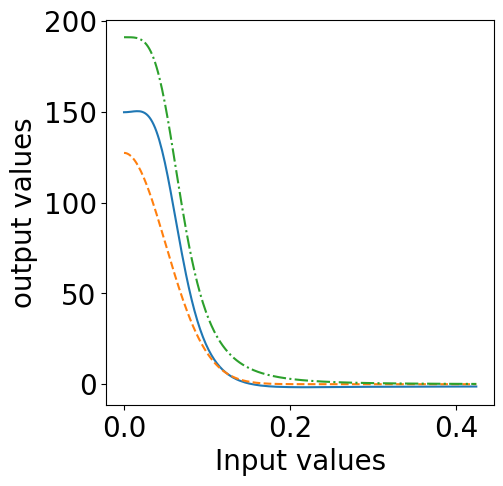

In [31]:
x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
y = jnp.linspace(0, 0.3, size).reshape(-1, 1)  # Reshape y to match dimensions
xy_combined = jnp.concatenate((x, y), axis=1)  # Properly form (x, y) pairs
array_nn = model.apply(params_back, xy_combined) * 70.0
exponent_internal = ((x - 0.0) ** 2 + (y - 0.0) ** 2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
plt.figure(figsize=(5, 5))
# Directly use jnp arrays in plotting
plt.plot(jnp.sqrt(2) * x.squeeze(), 
         (array_nn.squeeze() + array_reciprocal.squeeze()), 
         label='NN + Reciprocal',linestyle='-')
plt.plot(jnp.sqrt(2) * x.squeeze(), 
         array_exponent.squeeze(), label='Exponent',linestyle='--')
plt.plot(jnp.sqrt(2) * x.squeeze(), 
         array_reciprocal.squeeze(), label='Reciprocal',linestyle='-.')
plt.xlabel('input')
plt.ylabel('output values')# of source/network')
plt.xlabel('Input values')# of source/network')
#plt.legend()


font_size = 20
plt.rcParams.update({'font.size': font_size})


plt.savefig('newwork shape untrained.png', bbox_inches='tight')
plt.show()

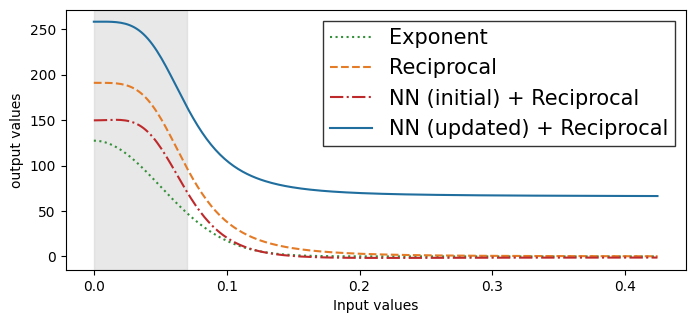

In [5]:
x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
y = jnp.linspace(0, 0.3, size).reshape(-1, 1)  # Reshape y to match dimensions
xy_combined = jnp.concatenate((x, y), axis=1)  # Properly form (x, y) pairs
array_nn = model.apply(params, xy_combined) * 70.0
array_nn_back = model.apply(params_back, xy_combined) * 70.0

exponent_internal = ((x - 0.0) ** 2 + (y - 0.0) ** 2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
plt.figure(figsize=(8, 0.45*7.5))
# Directly use jnp arrays in plotting


plt.plot(jnp.sqrt(2) * x.squeeze(), 
         array_exponent.squeeze(), color = np.array([53,144,58])/255, label='Exponent',linestyle=':')
plt.plot(jnp.sqrt(2) * x.squeeze(), 
         array_reciprocal.squeeze(), color = np.array([228,123,38])/255,label='Reciprocal',linestyle='--')
plt.plot(jnp.sqrt(2) * x.squeeze(), 
         (array_nn_back.squeeze() + array_reciprocal.squeeze()), 
         label='NN (initial) + Reciprocal',color = np.array([190,42,44])/255, linestyle='-.')

plt.plot(jnp.sqrt(2) * x.squeeze(), 
         (array_nn.squeeze() + array_reciprocal.squeeze()), 
         label='NN (updated) + Reciprocal',color = np.array([32,110,158])/255, linestyle='-')
plt.xlabel('input')
plt.ylabel('output values')# of source/network')
plt.xlabel('Input values')# of source/network')
#plt.legend()
intersection_x = 0.07
#plt.axvline(x=intersection_x, color='black', linestyle='--')
plt.axvspan(0, intersection_x, color='lightgrey', alpha=0.5)

font_size = 15
plt.rcParams.update({'font.size': font_size})

legend = plt.legend(borderpad=0.05,loc='upper right', bbox_to_anchor=(0.99, 0.975),fontsize=font_size)

legend.get_frame().set_edgecolor('black')  # 设置边框颜色为黑色
legend.get_frame().set_linewidth(1)  # 设置边框线宽为1
legend.get_frame().set_boxstyle("Square")

plt.savefig('combined network shape.png', dpi=600, bbox_inches='tight')
plt.show()

In [80]:
qwe[0].get_color()

'#ff7f0e'

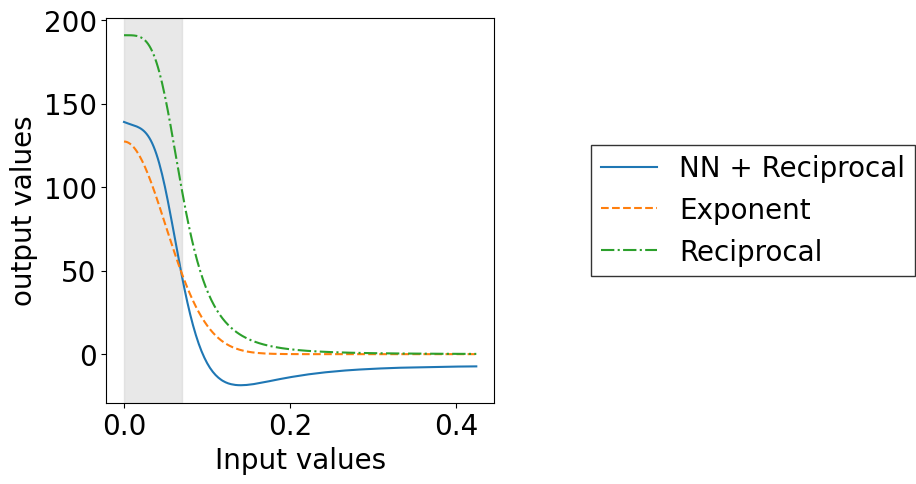

In [37]:
x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
y = jnp.linspace(0, 0.3, size).reshape(-1, 1)  # Reshape y to match dimensions
xy_combined = jnp.concatenate((x, y), axis=1)  # Properly form (x, y) pairs
array_nn = model.apply(params, xy_combined) * 70.0
exponent_internal = ((x - 0.0) ** 2 + (y - 0.0) ** 2)
factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
plt.figure(figsize=(5, 5))
# Directly use jnp arrays in plotting
plt.plot(jnp.sqrt(2) * x.squeeze(), 
         (array_nn.squeeze() + array_reciprocal.squeeze()), 
         label='NN + Reciprocal',linestyle='-')
plt.plot(jnp.sqrt(2) * x.squeeze(), 
         array_exponent.squeeze(), label='Exponent',linestyle='--')
plt.plot(jnp.sqrt(2) * x.squeeze(), 
         array_reciprocal.squeeze(), label='Reciprocal',linestyle='-.')
plt.xlabel('input')
plt.ylabel('output values')# of source/network')
plt.xlabel('Input values')# of source/network')
#plt.legend()
intersection_x = 0.07
#plt.axvline(x=intersection_x, color='black', linestyle='--')
plt.axvspan(0, intersection_x, color='lightgrey', alpha=0.5)

font_size = 20
plt.rcParams.update({'font.size': font_size})

legend= plt.legend(borderpad=0.05,loc='center right', bbox_to_anchor=(2.1, 0.5),fontsize=font_size)

legend.get_frame().set_edgecolor('black')  # 设置边框颜色为黑色
legend.get_frame().set_linewidth(1)  # 设置边框线宽为1
legend.get_frame().set_boxstyle("Square")

plt.savefig('newwork shape trained.png', bbox_inches='tight')
plt.show()

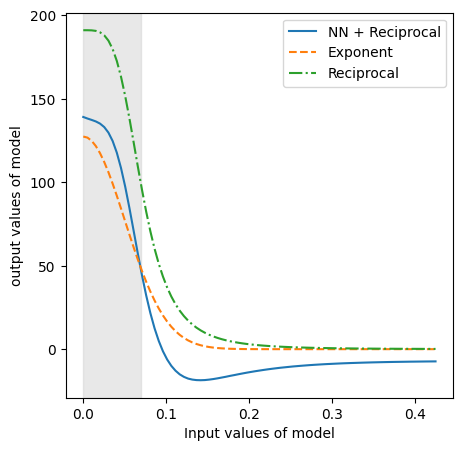

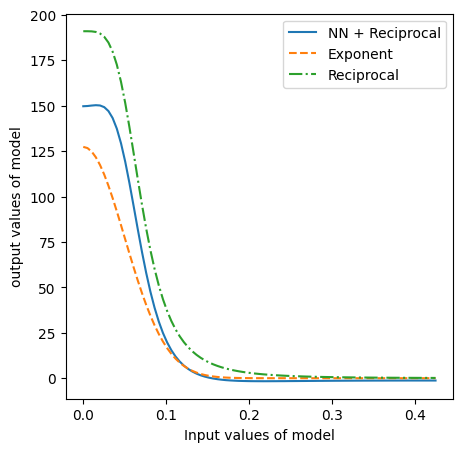

In [5]:

def show_nn(params, apply_model, center_x=0, center_y=0, size=85):
    x = jnp.linspace(0, 0.3, size).reshape(-1, 1)
    y = jnp.linspace(0, 0.3, size).reshape(-1, 1)  # Reshape y to match dimensions
    xy_combined = jnp.concatenate((x, y), axis=1)  # Properly form (x, y) pairs
    array_nn = apply_model.apply(params, xy_combined) * 70.0
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    plt.figure(figsize=(5, 5))
    # Directly use jnp arrays in plotting
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             (array_nn.squeeze() + array_reciprocal.squeeze()), 
             label='NN + Reciprocal',linestyle='-')
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_exponent.squeeze(), label='Exponent',linestyle='--')
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_reciprocal.squeeze(), label='Reciprocal',linestyle='-.')
    plt.xlabel('input')
    plt.ylabel('output values of model')
    plt.xlabel('Input values of model')
    plt.legend()
    
def show_signle_nn(params, apply_model, center_x=0, center_y=0, size=85):
    x = jnp.linspace(0, 1, size).reshape(-1, 1)
    y = jnp.linspace(0, 1, size).reshape(-1, 1)  # Reshape y to match dimensions
    xy_combined = jnp.concatenate((x, y), axis=1)  # Properly form (x, y) pairs
    array_nn = apply_model.apply(params, xy_combined) * 70.0
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    plt.figure(figsize=(5, 5))
    # Directly use jnp arrays in plotting
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_nn.squeeze(), 
             label='NN + Reciprocal')
    plt.ylabel('values of NN')
    plt.xlabel('Inputs')
    plt.legend()

show_nn(params, model, center_x=0, center_y=0, size=85)

intersection_x = 0.07
#plt.axvline(x=intersection_x, color='black', linestyle='--')
plt.axvspan(0, intersection_x, color='lightgrey', alpha=0.5)

plt.savefig('newwork shape trained.png', bbox_inches='tight')
plt.show()
#show_signle_nn(params, model, center_x=0, center_y=0, size=85)
show_nn(params_back, model, center_x=0, center_y=0, size=85)
plt.savefig('newwork shape untrained.png', bbox_inches='tight')
plt.show()


def show_nn(params_list, apply_model, center_x=0, center_y=0, size=85):
    x = jnp.linspace(0, 1, size).reshape(-1, 1)
    y = jnp.linspace(0, 1, size).reshape(-1, 1)
    xy_combined = jnp.concatenate((x, y), axis=1)
    
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    
    plt.figure(figsize=(5, 5))

    for index, params in enumerate(params_list):
        array_nn = apply_model.apply(params, xy_combined) * 70.0
        
        plt.plot(jnp.sqrt(2) * x.squeeze(), 
                 (array_nn.squeeze() + array_reciprocal.squeeze()), 
                 label=f'NN + Reciprocal - Params {index+1}')
    
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_exponent.squeeze(), label='Exponent')
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_reciprocal.squeeze(), label='Reciprocal')
    
    plt.ylabel('values of model')
    plt.xlabel('Inputs')
    plt.legend()
    plt.show()

def show_signle_nn(params_list, apply_model, center_x=0, center_y=0, size=85):
    x = jnp.linspace(0, 1, size).reshape(-1, 1)
    y = jnp.linspace(0, 1, size).reshape(-1, 1)  # Reshape y to match dimensions
    xy_combined = jnp.concatenate((x, y), axis=1)  # Properly form (x, y) pairs
    
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    
    plt.figure(figsize=(5, 5))

    for index, params in enumerate(params_list):
        array_nn = apply_model.apply(params, xy_combined) * 70.0
        
        plt.plot(jnp.sqrt(2) * x.squeeze(), 
                 array_nn.squeeze() , 
                 label=f'NN Params {index+1}')
        
    plt.ylabel('values of NN')
    plt.xlabel('Inputs')
    plt.legend()
    plt.show()


#show_nn(params_list, model, center_x=0, center_y=0, size=85)
#show_signle_nn(params_list, model, center_x=0, center_y=0, size=85)

Text(0, 0.5, 'gradient of model correction')

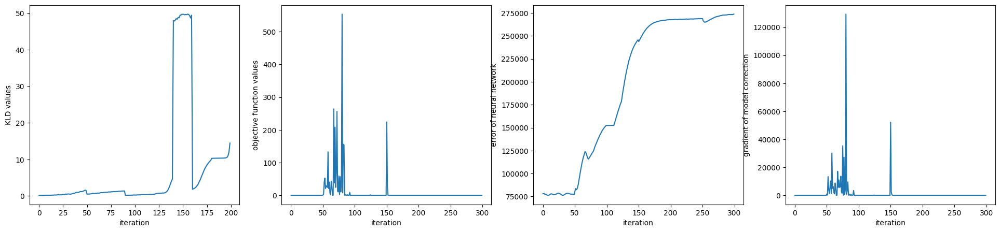

In [7]:
fig, axes = plt.subplots(1, 4, figsize=(6*4, 5))
axes[0].plot(KLD_list,label='KLD')
axes[0].set_xlabel('iteration')
axes[0].set_ylabel('KLD values')
axes[1].plot(evidence_list,label='evidence')
axes[1].set_xlabel('iteration')
axes[1].set_ylabel('objective function values')
axes[2].plot(NN_error_list,label='NN_error')
axes[2].set_xlabel('iteration')
axes[2].set_ylabel('error of neural network')
axes[3].plot(gradient_norm_list)
axes[3].set_xlabel('iteration')
axes[3].set_ylabel('gradient of model correction')

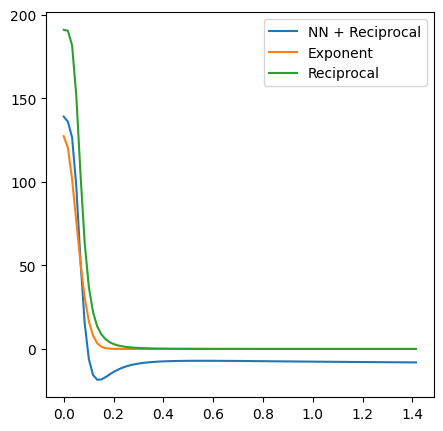

In [15]:
def show_nn(params, apply_model, center_x=0, center_y=0, size=85):
    x = jnp.linspace(0, 1, size).reshape(-1, 1)
    y = jnp.linspace(0, 1, size).reshape(-1, 1)  # Reshape y to match dimensions
    xy_combined = jnp.concatenate((x, y), axis=1)  # Properly form (x, y) pairs
    array_nn = apply_model.apply(params, xy_combined) * 70.0
    exponent_internal = ((x - center_x) ** 2 + (y - center_y) ** 2)
    factor = 2.0 / (2.0 * jnp.pi * 0.05 ** 2)
    array_exponent = factor * jnp.exp(-exponent_internal / (2.0 * 0.05 ** 2))
    array_reciprocal = factor * 1.5 / (exponent_internal ** 2 / (2.0 * 0.05 ** 2) ** 2 + 1.0)
    plt.figure(figsize=(5, 5))
    # Directly use jnp arrays in plotting
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             (array_nn.squeeze() + array_reciprocal.squeeze()), 
             label='NN + Reciprocal')
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_exponent.squeeze(), label='Exponent')
    plt.plot(jnp.sqrt(2) * x.squeeze(), 
             array_reciprocal.squeeze(), label='Reciprocal')
    plt.legend()
    plt.show()

show_nn(params, model, center_x=0, center_y=0, size=85)

In [ ]:
params = {'params': {'Dense_0': {'bias': jnp.array([-0.3298, -0.1174,  0.6380,  0.3928, -0.7478,  0.5316,  0.1195, -0.5012]),
   'kernel': jnp.array([[ 0.2482, -0.1645,  0.3177,  0.0101,  0.0504,  0.4333,  0.0107,  -0.3257],
       [-0.1137,  0.6302, -0.699 ,  0.0819,  0.2179, -0.0026, -0.0022,  0.2175]])},
  'Dense_1': {'bias': jnp.array([-0.0216,  0.0225, -0.1443, -0.0964]),
   'kernel': jnp.array([[-0.2057, -0.3018, -0.0947,  0.1217],
       [ 0.1769, -0.0451,  0.2394, -0.3284],
       [ 0.1332, -0.189 , -0.1262, -0.2911],
       [-0.1262,  0.0849,  0.2631,  0.1408],
       [ 0.265 , -0.2259, -0.1145,  0.2127],
       [-0.1701, -0.3768, -0.1982, -0.0188],
       [ 0.1154, -0.3425,  0.0138, -0.269 ],
       [-0.1733, -0.2877, -0.4278,  0.0289]])},
  'Dense_2': {'bias': jnp.array([-0.1950]),
   'kernel': jnp.array([[-0.3703],
       [ 0.0758],
       [ 0.1468],
       [-0.2777]])}}}
params

In [ ]:
np.isnan((max_evidence_items, net_accuracy)).any()

In [ ]:
%time negtive_KLD, grad_params = jax.value_and_grad(loss_design)(d_start, params, stage, center, prior, noise_info, num_d, radio_d, key_tem[0], model)
negtive_KLD, grad_params

In [ ]:
%time negtive_KLD, grad_params = jax.value_and_grad(loss_param)(params, d_start, stage, center, prior, noise_info, num_d, radio_d, key_tem[0], model)
grad_params

In [ ]:
stage

In [ ]:
aa= jnp.array([0.1])
b=[]
b.append(-aa)
b.append(aa)
print(aa)
print(net_accuracy)
b

In [ ]:
a=jnp.array([0.2,0.2])
area=jnp.array([0.2,0.2])
a_min=a-area
a_max=a+area
jax.numpy.clip(jnp.array([0.5,0.5]), a_min, a_max, out=None)

In [ ]:
def test_fun(d_start):
    output_point, _ = sealed_convection_diffusion_true(d_start, center, stage) #这里的形状是()
    #key, subkey = random.split(key) 这一步放在外面
    
    #暂时只考虑不要误差的情况：
    observation = output_point + jnp.array([0.0])
    ##这是要误差的代码：
    #noise = random.normal(key,(1,1))*(noise_base_scale+output_point*noise_ratio_scale) #形状(1,1)
    #observation = output_point + noise
    # 给一个函数，从所有的输出中找到关心的点
    false_center = jnp.array([1.0,1.0]) - d_start
    false_start = jnp.array([0.5, 0.5])
    _, output_all = sealed_convection_diffusion_nn(params, false_start, false_center, stage, model)
    output_all_central_sym = jnp.fliplr(jnp.flipud(output_all))
    xb_lo = int((0.0 - lo_b) / (up_b - lo_b) * (size - 1))
    xb_up = int((1.0 - lo_b) / (up_b - lo_b) * (size - 1))
    output_for_xb = output_all_central_sym[xb_lo:(xb_up+1),xb_lo:(xb_up+1)]
    loglikelihood = jax.scipy.stats.norm.logpdf(output_for_xb, loc=output_point, scale=noise_base_scale+noise_ratio_scale*output_point)
    log_evidence_list = log_normalize_pdf(loglikelihood) + jnp.log(prior+1e-32)
    top_15_indices = jnp.argsort(log_evidence_list.ravel())[-15:]  # ravel()将矩阵平铺为一维，argsort()降序排列
    top_15_values = log_evidence_list.ravel()[top_15_indices]
    key = random.PRNGKey(2023)  # 初始化随机种子，你可以设置为其他值
    chosen_indices = random.choice(key, top_15_indices.shape[0], shape=(5,), replace=False)
    chosen_values = top_15_values[chosen_indices]
    return sum(chosen_values)

jax.value_and_grad(test_fun)(d_start)

In [ ]:
top_15_indices = jnp.argsort(evidence_list.ravel())[-15:]  # ravel()将矩阵平铺为一维，argsort()降序排列

top_15_values = evidence_list.ravel()[top_15_indices]

# 随机取出其中5个
key = random.PRNGKey(0)  # 初始化随机种子，你可以设置为其他值
chosen_indices = random.choice(key, top_15_indices.shape[0], shape=(5,), replace=False)

chosen_values = top_15_values[chosen_indices]

In [ ]:
chosen_values

In [ ]:
output_for_xb.shape
import matplotlib.pyplot as plt
grid_x_plot0, grid_y_plot0 = np.meshgrid(np.linspace(0, 1, 85), np.linspace(0, 1, 85))
plt.figure(figsize=(5.5, 4))
plt.contourf(grid_x_plot0, grid_y_plot0, posterior, levels=100,cmap='RdYlBu_r' )
plt.colorbar()
plt.show()

In [ ]:
jax.value_and_grad(sealed_convection_diffusion_true, has_aux=True)(d_start, center, stage)

In [ ]:
jax.value_and_grad(sealed_convection_diffusion_nn, has_aux=True)(params, d_start, center, stage, model)

In [ ]:
key_tem = random.split(key2,3)
key_tem

In [ ]:
d_start = jnp.array([0.21,0.21])
center = jnp.array([0.7,0.7])
%time output1,_=sealed_convection_diffusion(params,d_start,center,3)

In [ ]:
d_start = jnp.array([0.41,0.41])
center = jnp.array([0.9,0.9])
%time output2, op2_ful=sealed_convection_diffusion(params,d_start,center,3)

In [ ]:
print(output1)
print(output2)

In [ ]:
grid = cfd.grids.Grid((size, size), domain=((lo_b, up_b), (lo_b, up_b)))
i = (1-0)/(1-0)*10
grid_x = jnp.linspace(0, 1, 11)
print(i)
print(grid_x)
size

In [ ]:

i = (0.7-lo_b)/(up_b-lo_b)*(size-1)
j = (0.7-lo_b)/(up_b-lo_b)*(size-1)
print(i,j)
type(int(i))
#op2_ful[i,j]

In [ ]:
grid = cfd.grids.Grid((size, size), domain=((0, 1), (0, 1)))
offsets = ((0.5,0.5),(0.5,0.5))
x = grid.mesh(offsets[1])[0]
y = grid.mesh(offsets[0])[1]
exponent_internal = ((x-center_x)**2.0+(y-center_y)**2.0) / (2.0 * 0.05 **2.0)
factor = 2.0 / (2.0 * jnp.pi * 0.05 **2)
array_exponent = factor * jnp.exp(-exponent_internal)
array_reciprocal = factor / (exponent_internal+ 1.0)
target=array_exponent-array_reciprocal

In [ ]:
jnp.max(target)
jnp.min(target)

In [ ]:
xb_lo = int((0.0 - lo_b) / (up_b - lo_b) * (size - 1))
xb_up = int((1.0 - lo_b) / (up_b - lo_b) * (size - 1))
print(xb_lo, xb_up )
grid_x = jnp.linspace(lo_b, up_b, size)
grid_y = jnp.linspace(lo_b, up_b, size)
xx, yy = jnp.meshgrid(grid_x, grid_y, indexing='ij')
print(op2_ful.shape)
need_array=jnp.fliplr(jnp.flipud(op2_ful[xb_lo:(xb_up+1),xb_lo:(xb_up+1)]))
print(need_array.shape)
print(need_array)
print(output2)
pdf_array = jax.scipy.stats.norm.logpdf(need_array, loc=output2, scale=0.05)
print(pdf_array)


import matplotlib.pyplot as plt
grid_x_plot0, grid_y_plot0 = np.meshgrid(np.linspace(-2, 3, size), np.linspace(-2, 3, size))
plt.figure(figsize=(5.5, 4))
plt.contourf(grid_x_plot0, grid_y_plot0, op2_ful, levels=100,cmap='RdYlBu_r' )
plt.colorbar()
plt.show()

grid_x_plot, grid_y_plot = np.meshgrid(np.linspace(0, 1, int((size-1)/5+1)), np.linspace(0, 1, int((size-1)/5+1)))
plt.figure(figsize=(5.5, 4))
plt.contourf(grid_x_plot, grid_y_plot, need_array, levels=100,cmap='RdYlBu_r' )
plt.colorbar()
plt.show()

plt.figure(figsize=(5.5, 4))
plt.contourf(grid_x_plot, grid_y_plot, pdf_array, levels=100,cmap='RdYlBu_r' )
plt.colorbar()
plt.show()

In [ ]:
print(pdf_array)
print(jnp.log(jnp.exp(pdf_array)+1e-32))

In [ ]:
print(jnp.max(need_array))
print(jnp.max(pdf_array))

In [ ]:
data_array=jnp.array([[0,1],[0.3,0.5]])
pdf_array = jax.scipy.stats.norm.pdf(data_array, loc=0, scale=1)
print(pdf_array)
jnp.sum(pdf_array)

In [ ]:
zz=(0.21,0.21)
print(type(zz))
xx=jnp.array([0.21,0.21])
print(type(xx))

In [ ]:
def sum_squared_error(x, y):
  return jnp.sum((x-y)**2)
    
def squared_error_with_aux(x, y):
  return int(sum_squared_error(x, y)), x-y

jax.value_and_grad(squared_error_with_aux, has_aux=True, argnums=(0, 1))(1.0, 2.0)
# 默认对第一个输入参数求导，对第一个输出求导
# 求导默认有两个参数，只能有两个。多的参数不求导数

In [ ]:
def squared_error_with_aux1(x, y):
  return sum_squared_error(x, y), x-y

value, grad = jax.value_and_grad(squared_error_with_aux1, has_aux=True)(1.0, 2.0)

print(value)
print(grad)
print(type(value))
print((grad))

In [ ]:
random.normal(key, (1,10))

In [ ]:
# 学习scan的用法
import jax.numpy as jnp
from jax import random
from jax.scipy.signal import convolve

# 定义卷积操作函数
def convolve_x_with_y(x, y):
    # 假设x和y是一维向量，'valid'表示卷积操作不会超出边界
    result = convolve(x, y, mode='valid')
    return result

# 定义添加噪音的函数
def add_noise_to_y(y, noise_level, key):
    noise = random.normal(key, y.shape) * noise_level
    y_noisy = y + noise
    return y_noisy

# 固定的x向量
x = jnp.array([1, 2, 1])

# 基础的y向量
y_base = jnp.array([0.5, -0.5, 0.5])

# 噪音水平
noise_level = 0.1

# 初始化随机种子
key = random.PRNGKey(0)

# 生成3个不同的随机种子
keys = random.split(key, 3)

# 为了使用vmap，我们需要一个函数，该函数接收单个key和y_base作为输入
def process_single_y(key, y_base):
    y_noisy = add_noise_to_y(y_base, noise_level, key)
    result = convolve_x_with_y(x, y_noisy)
    return result

# 使用vmap向量化处理过程
batched_process = jax.vmap(process_single_y, in_axes=(0, None))

# 执行向量化操作
results = batched_process(keys, y_base)

print("卷积结果：", results)


In [ ]:
import optax
import jax
from typing import Any, Callable, Sequence
from jax import random, numpy as jnp
import flax
from flax import linen as nn

# Set problem dimensions.
n_samples = 20
x_dim = 10
y_dim = 5

# Generate random ground truth W and b.
key = random.key(0)
k1, k2 = random.split(key)
W = random.normal(k1, (x_dim, y_dim))
b = random.normal(k2, (y_dim,))
# Store the parameters in a FrozenDict pytree.
true_params = flax.core.freeze({'params': {'bias': b, 'kernel': W}})

# Generate samples with additional noise.
key_sample, key_noise = random.split(k1)
x_samples = random.normal(key_sample, (n_samples, x_dim))
y_samples = jnp.dot(x_samples, W) + b + 0.1 * random.normal(key_noise,(n_samples, y_dim))
print('x shape:', x_samples.shape, '; y shape:', y_samples.shape)

model = nn.Dense(features=5)

# Initialize the model parameters.
key, subkey = random.split(key)
params_test = model.init(subkey, x_samples[0])

@jax.jit
def mse(params, x_batched, y_batched):
  def squared_error(x, y):
    pred = model.apply(params, x)
    return jnp.inner(y-pred, y-pred) / 2.0
  return jnp.mean(jax.vmap(squared_error)(x_batched,y_batched), axis=0)
    
learning_rate = 0.3  # Gradient step size.
print('Loss for "true" W,b: ', mse(true_params, x_samples, y_samples))

tx = optax.adam(learning_rate=learning_rate)
opt_state = tx.init(params_test)
loss_grad_fn = jax.value_and_grad(mse)

for i in range(101):
  loss_val, grads = loss_grad_fn(params_test, x_samples, y_samples)
  updates, opt_state = tx.update(grads, opt_state)
  params_test = optax.apply_updates(params_test, updates)
  if i % 10 == 0:
    print('Loss step {}: '.format(i), loss_val)

In [ ]:
params_test

In [ ]:
print(type(results))
print(type(y_base))

In [ ]:

# 创建一个示例矩阵
matrix = jnp.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])

# 首先上下翻转
#flip_ud = jnp.flipud(matrix)

# 然后左右翻转
flip_lr_ud = jnp.fliplr(jnp.flipud(matrix))

print("原始矩阵:\n", matrix)
print("左右和上下翻转后的矩阵:\n", flip_lr_ud)


In [ ]:
print(key)
key, subkey = random.split(key)
print(key)
print(subkey)